In [1]:
import numpy as np
import matplotlib.pyplot as plt

import ipywidgets as widgets

from IPython.display import display

In [2]:
NUM_STATES = 4
NUM_OBSERVATIONS = 2
NUM_BELIEFS = 2 # TARGET vs. NON TARGET
ANGLE_RANGE = 2*np.pi

STATE_STEP = ANGLE_RANGE/NUM_STATES
STATE_CENTERS = np.arange(0, ANGLE_RANGE, STATE_STEP) + STATE_STEP
ANGL_DIST_BETWEEN_STATES = (STATE_CENTERS[np.newaxis, :] - STATE_CENTERS[:, np.newaxis])

PRIOR_TARGET_PROB = np.array([1/NUM_BELIEFS, 1-(1/NUM_BELIEFS)])
PRIOR_STATE_PROB = np.full(NUM_STATES, 1/NUM_STATES)
LIKELIHOOD_OBS_FROM_NONTARGET = 1/NUM_OBSERVATIONS

In [3]:
STATE_STEP

1.5707963267948966

In [4]:
def get_state_transition_matrix(candidate_step):
    if candidate_step>0:
        mod_basis = 2*np.pi
    else:
        mod_basis = -2*np.pi

    angular_dist_between_states_in_extent = ANGL_DIST_BETWEEN_STATES % mod_basis
    angular_dist_after_action = (angular_dist_between_states_in_extent - candidate_step)
    angular_dist_after_action_in_extent = angular_dist_after_action % mod_basis
    
    sigma = STATE_STEP/10
    magnitude = 1 / np.sqrt((2*np.pi) * (sigma**2))
    state_transition = magnitude * np.exp(-0.5*((angular_dist_after_action_in_extent/sigma)**2))
    state_transition_normed = state_transition / state_transition.sum(axis=1)
    return state_transition_normed

In [5]:
candidate_step = -STATE_STEP
state_transition_matrix = get_state_transition_matrix(candidate_step)
state_transition_matrix.round(3)

array([[0., 0., 0., 1.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.]])

In [6]:
candidate_step = 0
state_transition_matrix = get_state_transition_matrix(candidate_step)
state_transition_matrix.round(3)

array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]])

In [7]:
candidate_step = STATE_STEP
state_transition_matrix = get_state_transition_matrix(candidate_step)
state_transition_matrix.round(3)

array([[0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.],
       [1., 0., 0., 0.]])

In [8]:
obs1_bounds = np.array([60, 120])

In [9]:
def observe_angle_state_pair(initial_angle):
   plt.figure(figsize=(6, 6))
   radius = 1
   radius_until = 5
   pie = np.pi
   theta_obs1 = np.linspace(np.radians(obs1_bounds[0]), np.radians(obs1_bounds[1]), 30)
   x_inner = radius * np.cos(theta_obs1)
   y_inner =  radius * np.sin(theta_obs1)
   x_poly = np.concatenate([radius_until*x_inner, x_inner[::-1]])
   y_poly = np.concatenate([radius_until*y_inner, y_inner[::-1]])
   plt.fill(x_poly, y_poly, facecolor='blue', alpha=0.25, linewidth=0)
   plt.plot(x_inner, y_inner, color='blue', linewidth=1)

   theta_obs0 = np.linspace(np.radians(obs1_bounds[1]), np.radians(obs1_bounds[0])+2*pie, 30)
   x_inner = radius * np.cos(theta_obs0)
   y_inner =  radius * np.sin(theta_obs0)
   x_poly = np.concatenate([radius_until*x_inner, x_inner[::-1]])
   y_poly = np.concatenate([radius_until*y_inner, y_inner[::-1]])
   plt.fill(x_poly, y_poly, facecolor='orange', alpha=0.25, linewidth=0)
   plt.plot(x_inner, y_inner, color='orange', linewidth=1)

   for theta in STATE_CENTERS:
      r_outer = 4 * radius_until * radius
      plt.plot([radius*np.cos(theta), r_outer*np.cos(theta)], 
               [radius*np.sin(theta), r_outer*np.sin(theta)],
                  color='k', linewidth=1.5, solid_capstyle='round', zorder=1)
      plt.plot([radius*np.cos(theta + (STATE_STEP/2)), r_outer*np.cos(theta + (STATE_STEP/2))], 
               [radius*np.sin(theta + (STATE_STEP/2)), r_outer*np.sin(theta + (STATE_STEP/2))],
                  color='k', linewidth=1, linestyle='dashed', zorder=1)
      
   if initial_angle >= obs1_bounds[0] and initial_angle <= obs1_bounds[1]:
      code_received = 1
   else:
      code_received = 0
   initial_radians = np.radians((initial_angle % 360))
   initial_state = np.floor((initial_radians) / STATE_STEP)
   plt.scatter(radius_until*radius*np.cos(initial_radians), radius_until*radius*np.sin(initial_radians),
            s=200, marker='.', facecolor='r', edgecolor='k', zorder=4, label=f'State={initial_state}\nCode={code_received}')

   plt.gca().set_aspect('equal', adjustable='box')
   plt.xticks([])
   plt.yticks([])
   GRID_EXTENT = 7
   plt.xlim(-GRID_EXTENT, GRID_EXTENT)
   plt.ylim(-GRID_EXTENT, GRID_EXTENT)
   plt.legend()
   plt.show()


In [10]:
initial_angle_slider = widgets.IntSlider(
    value=0,  
    min=0,
    max=360,
    description="Initial Angle",
    style={'description_width': 'initial'},
    continuous_update=True,
    layout=widgets.Layout(width="600px"),
)

interactive_plot = widgets.interactive(
    observe_angle_state_pair, initial_angle=initial_angle_slider)
display(interactive_plot)

interactive(children=(IntSlider(value=0, description='Initial Angle', layout=Layout(width='600px'), max=360, s…

In [11]:
code0_extent_in_states = np.zeros(NUM_STATES) + STATE_STEP
code0_extent_in_states[1] = 0
code1_extent_in_states = np.zeros(NUM_STATES)
code1_extent_in_states[1] = STATE_STEP

prob_code0_in_states = code0_extent_in_states / STATE_STEP
prob_code1_in_states = code1_extent_in_states / STATE_STEP

EMISSION_MATRIX_B = np.vstack([prob_code0_in_states, prob_code1_in_states])
EMISSION_MATRIX_B

array([[1., 0., 1., 1.],
       [0., 1., 0., 0.]])

In [12]:
trial_num = 0
num_trials = 10
max_iter = 50
posterior_across_trials = np.zeros((num_trials, max_iter+1, NUM_BELIEFS))

Current angle: 0.0, Code received: 0.0


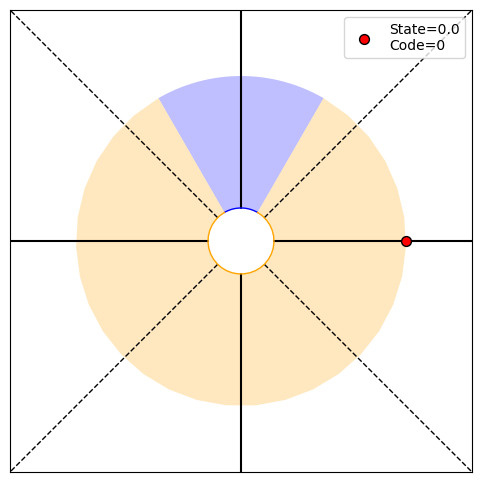

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


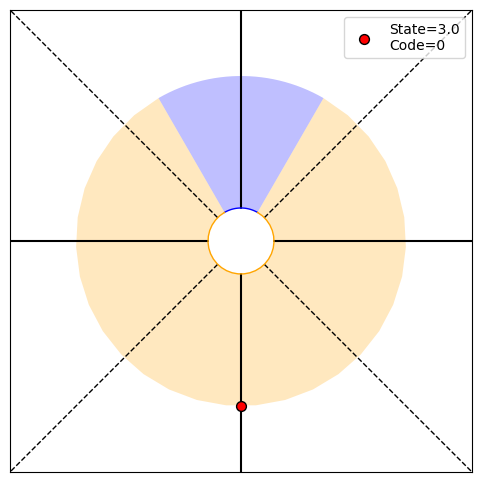

P(O1:2,S2|T)=[0.   0.   0.25 0.25], P(O1:2|actions,T)=0.5, P(T|O1:2)=[0.66666667 0.33333333], H2=0.92
PRINT 1: 0.9182958340544896, [4.82187462e-23 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.31668909], [0.66666667 0.33333333]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


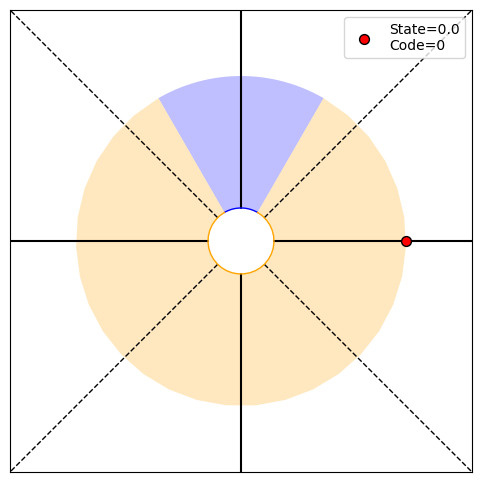

P(O1:3,S3|T)=[0.25 0.   0.   0.25], P(O1:3|actions,T)=0.5, P(T|O1:3)=[0.8 0.2], H3=0.72
PRINT 1: 0.7219280948873623, [2.50000000e-01 0.00000000e+00 9.30018994e-45 2.50000000e-01]
PRINT 2: [0.26899559 0.        ], [0.8 0.2]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


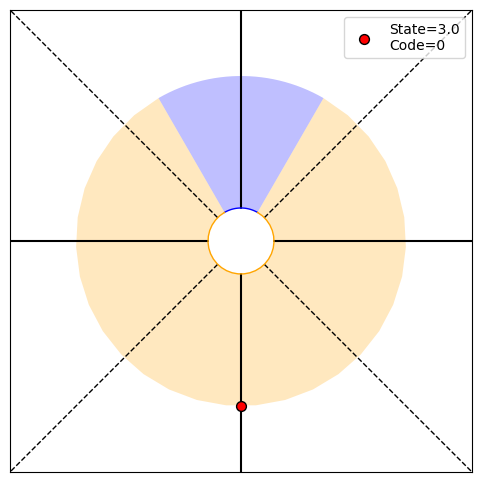

P(O1:4,S4|T)=[0.   0.   0.25 0.25], P(O1:4|actions,T)=0.5, P(T|O1:4)=[0.88888889 0.11111111], H4=0.50
PRINT 1: 0.5032583347756456, [1.79377399e-66 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.19843232], [0.88888889 0.11111111]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


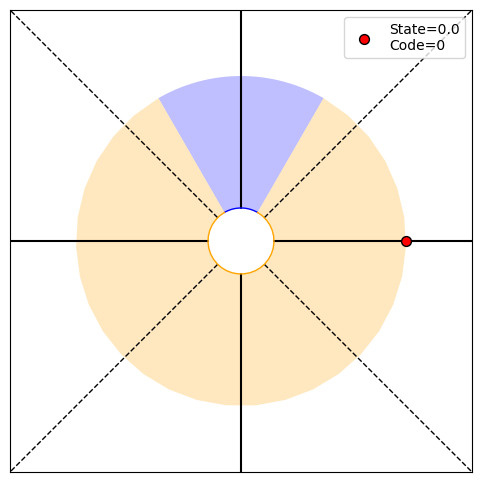

P(O1:5,S5|T)=[0.25 0.   0.   0.25], P(O1:5|actions,T)=0.5, P(T|O1:5)=[0.94117647 0.05882353], H5=0.32
PRINT 1: 0.32275695889739825, [2.50000000e-01 0.00000000e+00 6.91948263e-88 2.50000000e-01]
PRINT 2: [0.13260973 0.        ], [0.94117647 0.05882353]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


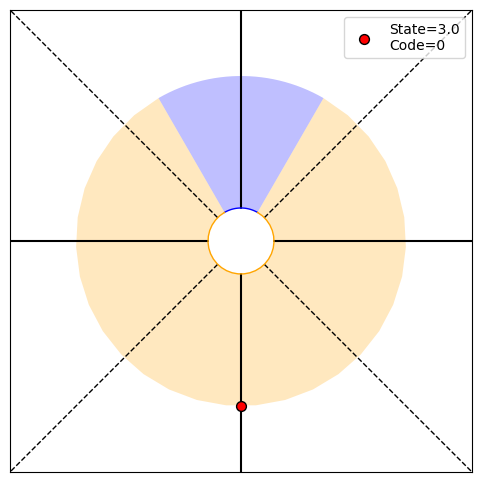

P(O1:6,S6|T)=[0.   0.   0.25 0.25], P(O1:6|actions,T)=0.5, P(T|O1:6)=[0.96969697 0.03030303], H6=0.20
PRINT 1: 0.19590927087360493, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.08297127], [0.96969697 0.03030303]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


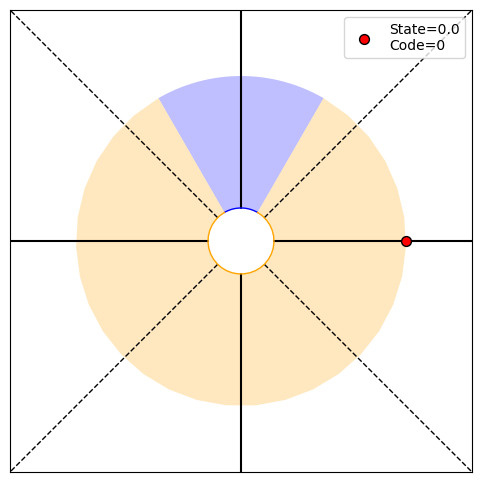

P(O1:7,S7|T)=[0.25 0.   0.   0.25], P(O1:7|actions,T)=0.5, P(T|O1:7)=[0.98461538 0.01538462], H7=0.11
PRINT 1: 0.11467550533614675, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.04968846 0.        ], [0.98461538 0.01538462]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


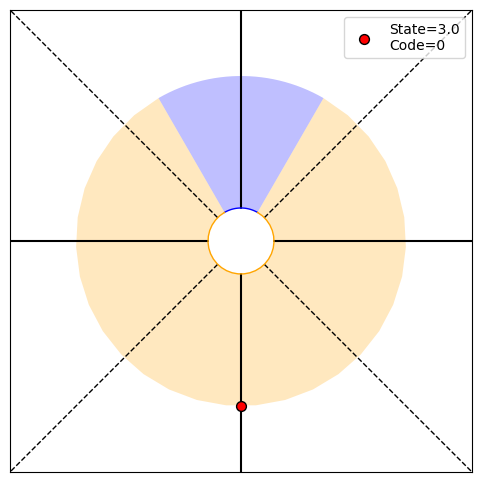

P(O1:8,S8|T)=[0.   0.   0.25 0.25], P(O1:8|actions,T)=0.5, P(T|O1:8)=[0.99224806 0.00775194], H8=0.07
PRINT 1: 0.06549082131472701, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.02888032], [0.99224806 0.00775194]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


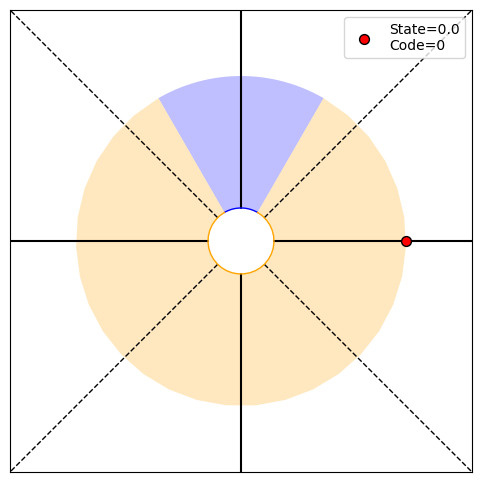

P(O1:9,S9|T)=[0.25 0.   0.   0.25], P(O1:9|actions,T)=0.5, P(T|O1:9)=[0.99610895 0.00389105], H9=0.04
PRINT 1: 0.03675295386313879, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.01643369 0.        ], [0.99610895 0.00389105]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


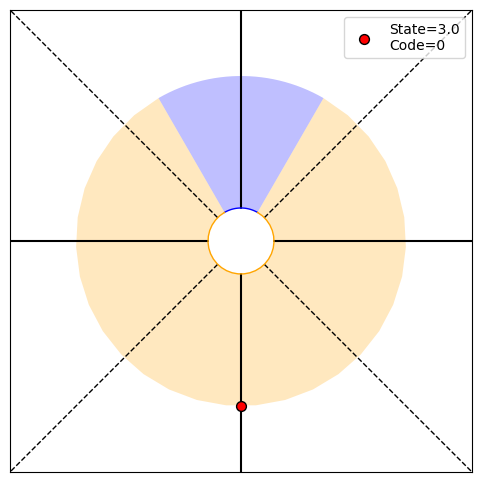

P(O1:10,S10|T)=[0.   0.   0.25 0.25], P(O1:10|actions,T)=0.5, P(T|O1:10)=[0.99805068 0.00194932], H10=0.02
PRINT 1: 0.020358875256176766, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00920546], [0.99805068 0.00194932]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


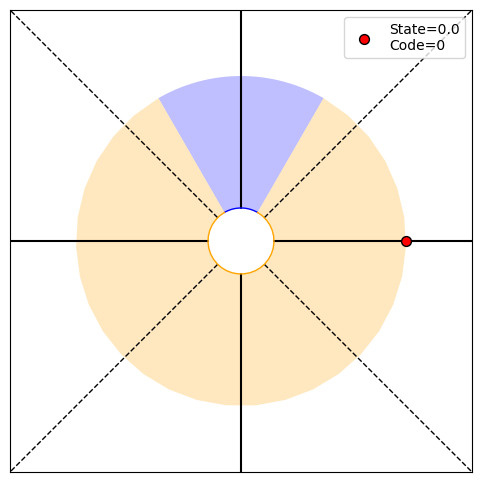

P(O1:11,S11|T)=[0.25 0.   0.   0.25], P(O1:11|actions,T)=0.5, P(T|O1:11)=[9.99024390e-01 9.75609756e-04], H11=0.01
PRINT 1: 0.011164291953784001, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00509451 0.        ], [9.99024390e-01 9.75609756e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


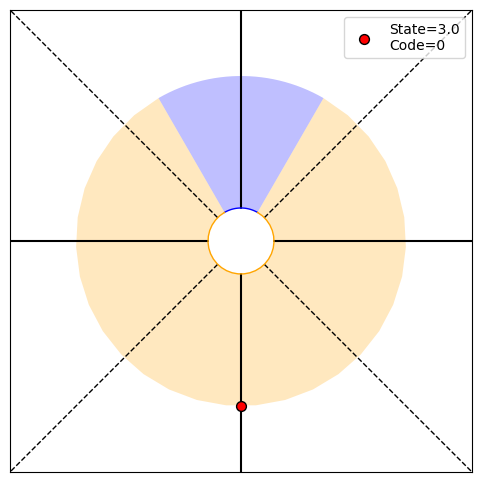

P(O1:12,S12|T)=[0.   0.   0.25 0.25], P(O1:12|actions,T)=0.5, P(T|O1:12)=[9.99511957e-01 4.88042948e-04], H12=0.01
PRINT 1: 0.006072741436820054, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


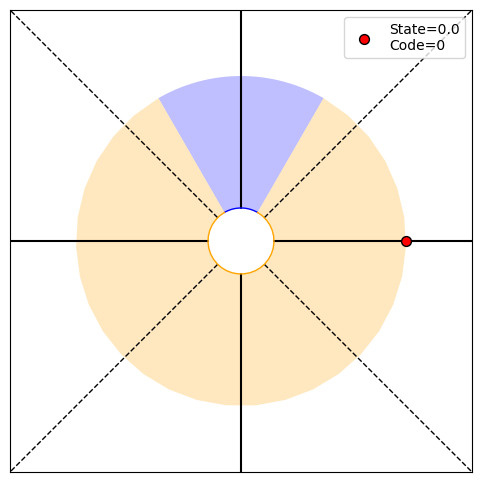

P(O1:13,S13|T)=[0.25 0.   0.   0.25], P(O1:13|actions,T)=0.5, P(T|O1:13)=[9.99755919e-01 2.44081035e-04], H13=0.00
PRINT 1: 0.0032811498991440822, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00151855 0.        ], [9.99755919e-01 2.44081035e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


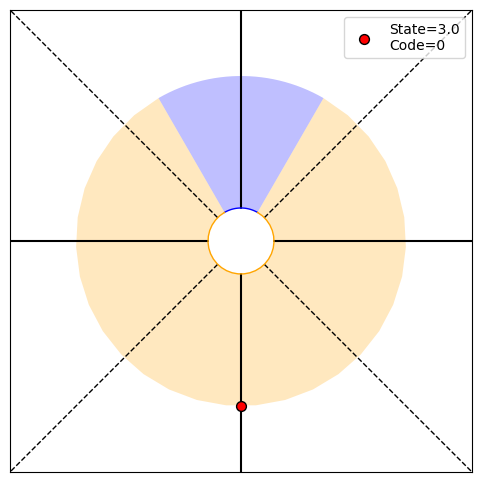

P(O1:14,S14|T)=[0.   0.   0.25 0.25], P(O1:14|actions,T)=0.5, P(T|O1:14)=[9.99877945e-01 1.22055413e-04], H14=0.00
PRINT 1: 0.001762819857490962, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


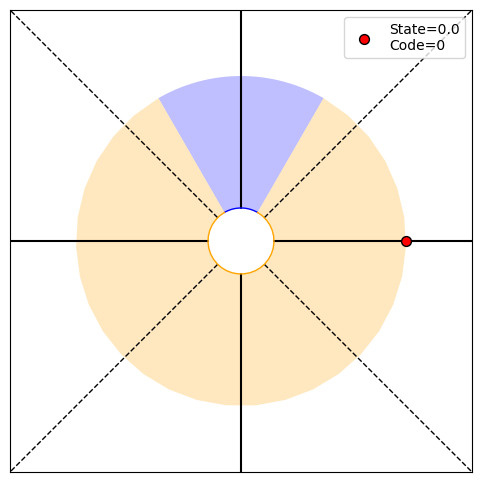

P(O1:15,S15|T)=[0.25 0.   0.   0.25], P(O1:15|actions,T)=0.5, P(T|O1:15)=[9.99938969e-01 6.10314312e-05], H15=0.00
PRINT 1: 0.0009424924667410557, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00044073 0.        ], [9.99938969e-01 6.10314312e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


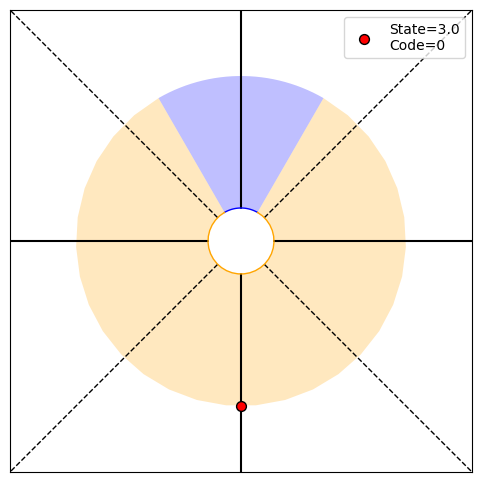

P(O1:16,S16|T)=[0.   0.   0.25 0.25], P(O1:16|actions,T)=0.5, P(T|O1:16)=[9.99969483e-01 3.05166468e-05], H16=0.00
PRINT 1: 0.0005017765892900114, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


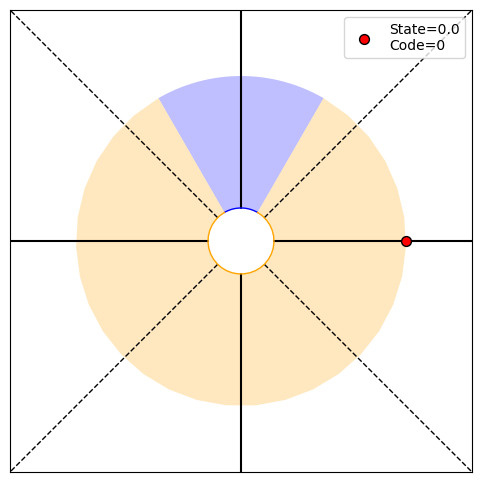

P(O1:17,S17|T)=[0.25 0.   0.   0.25], P(O1:17|actions,T)=0.5, P(T|O1:17)=[9.99984741e-01 1.52585562e-05], H17=0.00
PRINT 1: 0.0002661505111268847, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00012545 0.        ], [9.99984741e-01 1.52585562e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


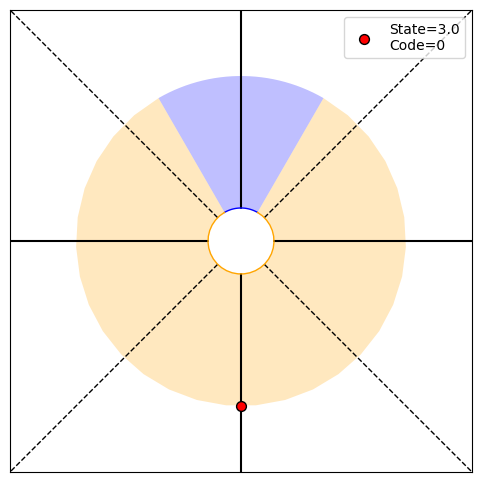

P(O1:18,S18|T)=[0.   0.   0.25 0.25], P(O1:18|actions,T)=0.5, P(T|O1:18)=[9.99992371e-01 7.62933632e-06], H18=0.00
PRINT 1: 0.0001407055651760454, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


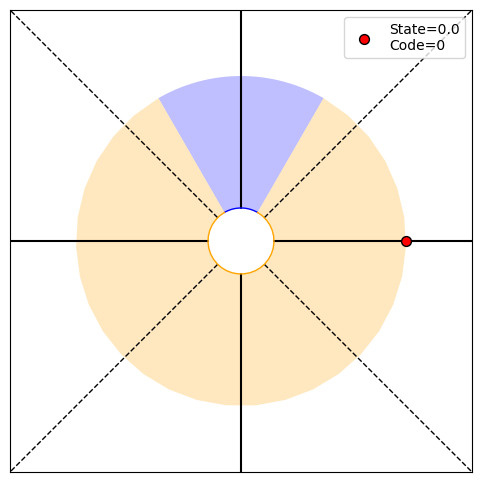

P(O1:19,S19|T)=[0.25 0.   0.   0.25], P(O1:19|actions,T)=0.5, P(T|O1:19)=[9.99996185e-01 3.81468271e-06], H19=0.00
PRINT 1: 7.416772317850379e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.51765229e-05 0.00000000e+00], [9.99996185e-01 3.81468271e-06]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


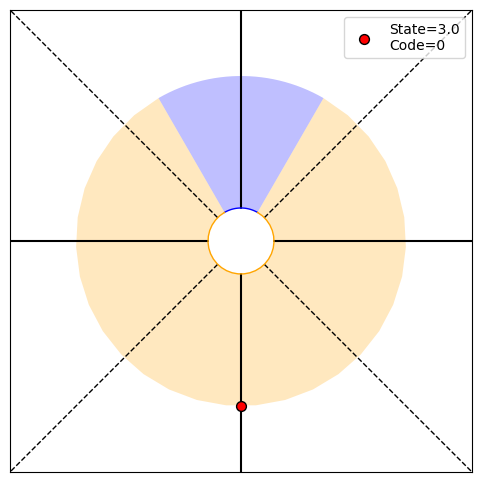

P(O1:20,S20|T)=[0.   0.   0.25 0.25], P(O1:20|actions,T)=0.5, P(T|O1:20)=[9.99998093e-01 1.90734499e-06], H20=0.00
PRINT 1: 3.899127469152328e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


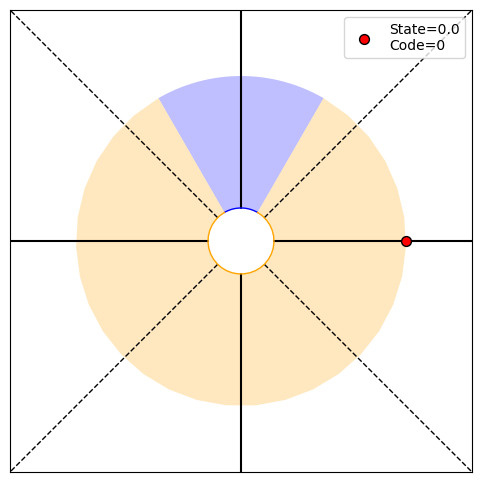

P(O1:21,S21|T)=[0.25 0.   0.   0.25], P(O1:21|actions,T)=0.5, P(T|O1:21)=[9.99999046e-01 9.53673407e-07], H21=0.00
PRINT 1: 2.04493286890882e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [9.74782781e-06 0.00000000e+00], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


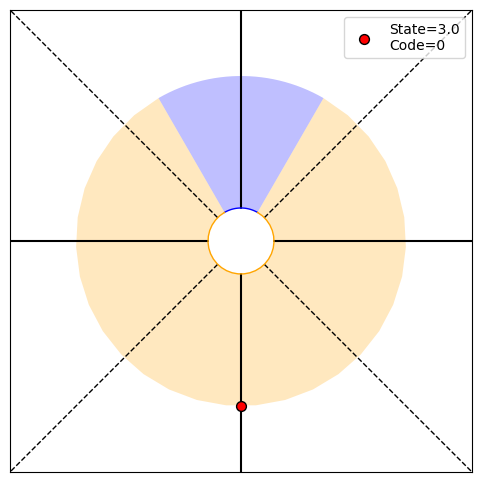

P(O1:22,S22|T)=[0.   0.   0.25 0.25], P(O1:22|actions,T)=0.5, P(T|O1:22)=[9.99999523e-01 4.76836931e-07], H22=0.00
PRINT 1: 1.070150598685641e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


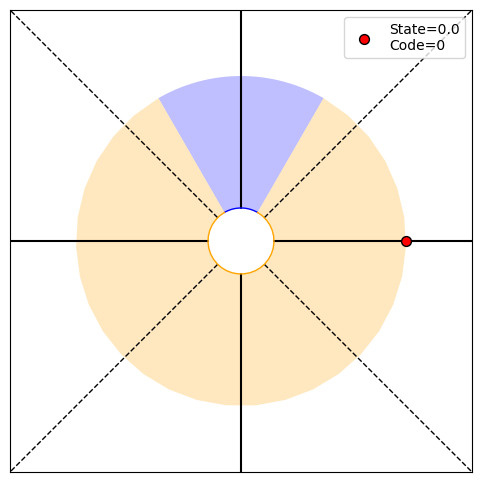

P(O1:23,S23|T)=[0.25 0.   0.   0.25], P(O1:23|actions,T)=0.5, P(T|O1:23)=[9.99999762e-01 2.38418522e-07], H23=0.00
PRINT 1: 5.589172750401204e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.67537712e-06 0.00000000e+00], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


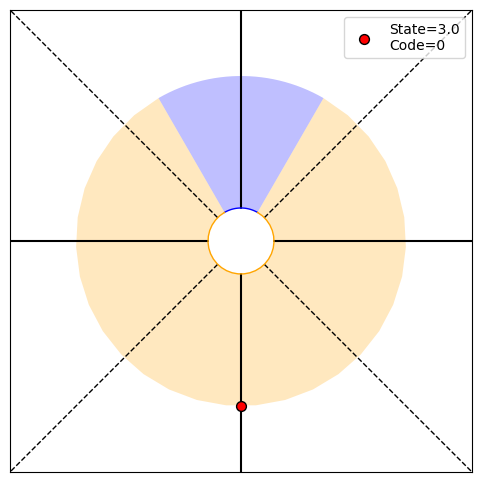

P(O1:24,S24|T)=[0.   0.   0.25 0.25], P(O1:24|actions,T)=0.5, P(T|O1:24)=[9.99999881e-01 1.19209275e-07], H24=0.00
PRINT 1: 2.913795973430192e-06, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


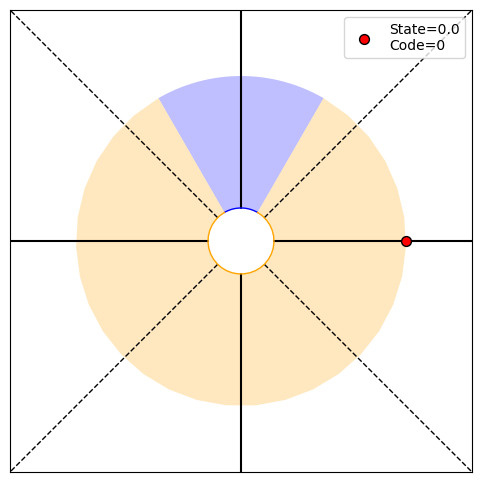

P(O1:25,S25|T)=[0.25 0.   0.   0.25], P(O1:25|actions,T)=0.5, P(T|O1:25)=[9.99999940e-01 5.96046412e-08], H25=0.00
PRINT 1: 1.516502712212915e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [7.28449036e-07 0.00000000e+00], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


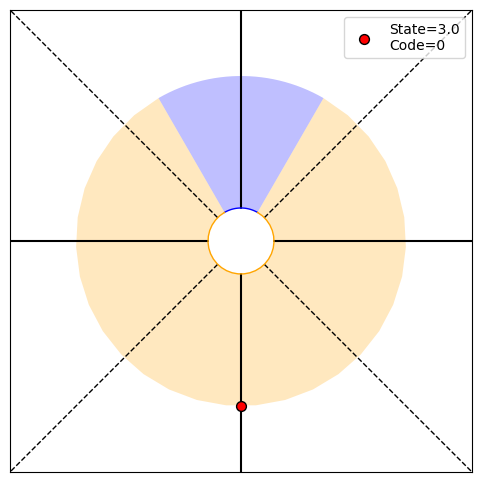

P(O1:26,S26|T)=[0.   0.   0.25 0.25], P(O1:26|actions,T)=0.5, P(T|O1:26)=[9.99999970e-01 2.98023215e-08], H26=0.00
PRINT 1: 7.880536995629399e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


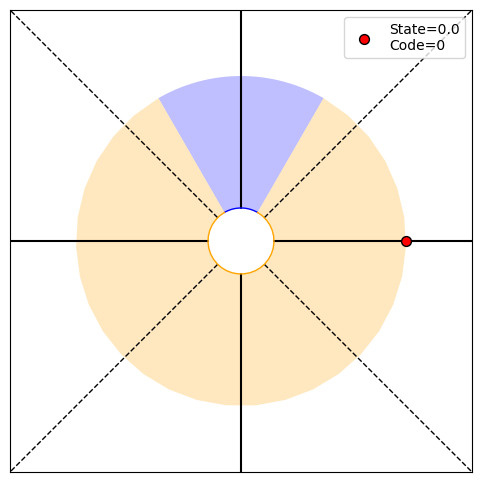

P(O1:27,S27|T)=[0.25 0.   0.   0.25], P(O1:27|actions,T)=0.5, P(T|O1:27)=[9.99999985e-01 1.49011610e-08], H27=0.00
PRINT 1: 4.089280164645592e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.97013428e-07 0.00000000e+00], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


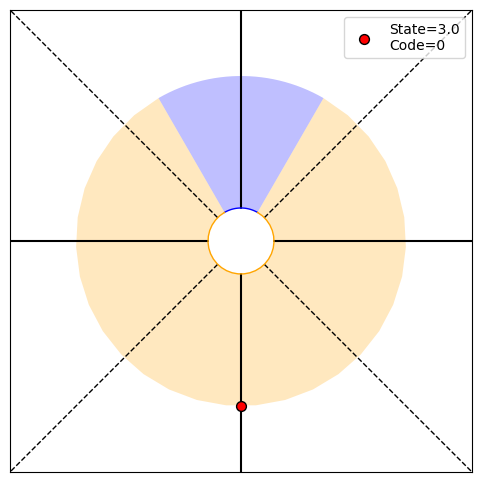

P(O1:28,S28|T)=[0.   0.   0.25 0.25], P(O1:28|actions,T)=0.5, P(T|O1:28)=[9.99999993e-01 7.45058054e-09], H28=0.00
PRINT 1: 2.1191459017693938e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


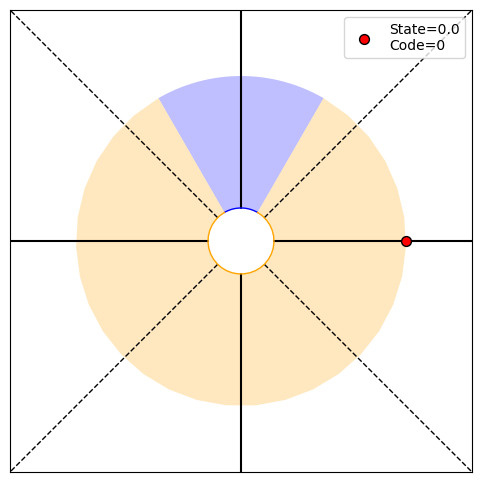

P(O1:29,S29|T)=[0.25 0.   0.   0.25], P(O1:29|actions,T)=0.5, P(T|O1:29)=[9.99999996e-01 3.72529028e-09], H29=0.00
PRINT 1: 1.0968258581782902e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [5.29786478e-08 0.00000000e+00], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


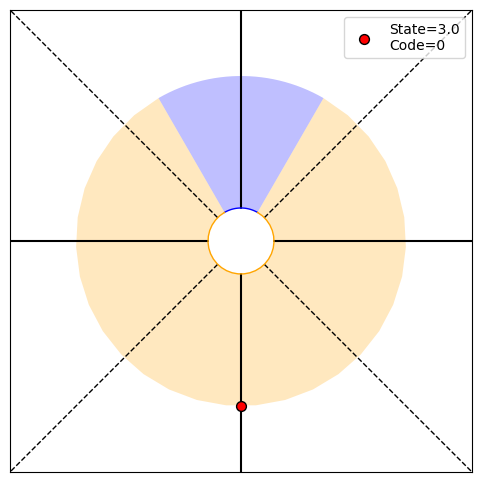

P(O1:30,S30|T)=[0.   0.   0.25 0.25], P(O1:30|actions,T)=0.5, P(T|O1:30)=[9.99999998e-01 1.86264515e-09], H30=0.00
PRINT 1: 5.670393814931786e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


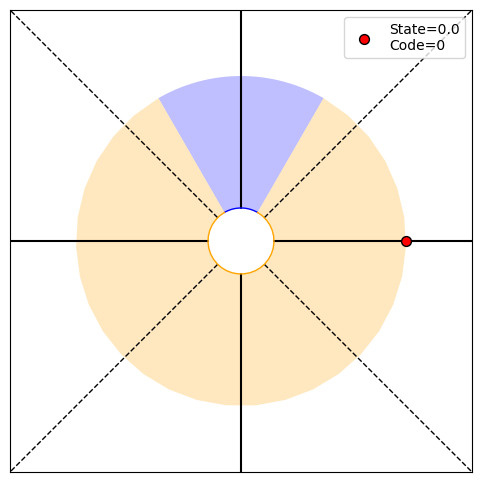

P(O1:31,S31|T)=[0.25 0.   0.   0.25], P(O1:31|actions,T)=0.5, P(T|O1:31)=[9.99999999e-01 9.31322574e-10], H31=0.00
PRINT 1: 2.928329167293487e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.41759846e-08 0.00000000e+00], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


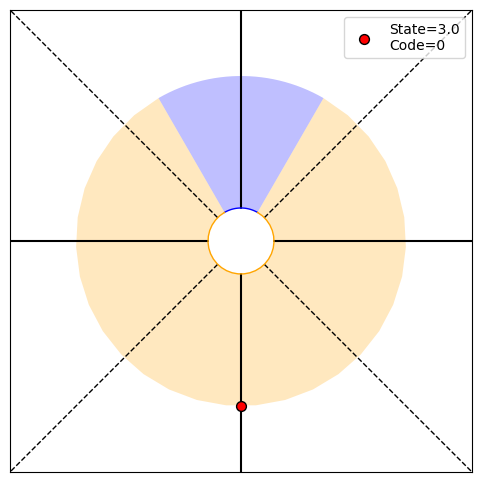

P(O1:32,S32|T)=[0.   0.   0.25 0.25], P(O1:32|actions,T)=0.5, P(T|O1:32)=[1.00000000e+00 4.65661287e-10], H32=0.00
PRINT 1: 1.510730712990713e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


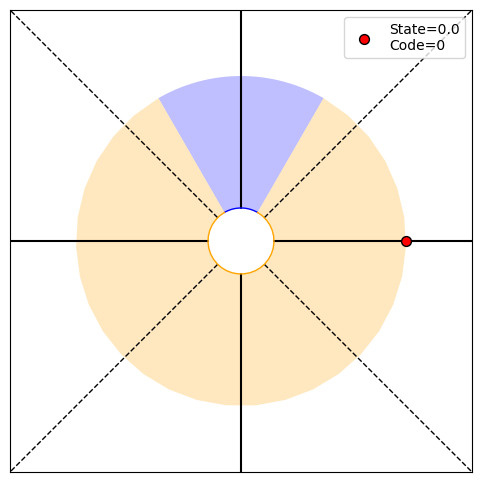

P(O1:33,S33|T)=[0.25 0.   0.   0.25], P(O1:33|actions,T)=0.5, P(T|O1:33)=[1.00000000e+00 2.32830644e-10], H33=0.00
PRINT 1: 7.786484210194632e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.77682678e-09 0.00000000e+00], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


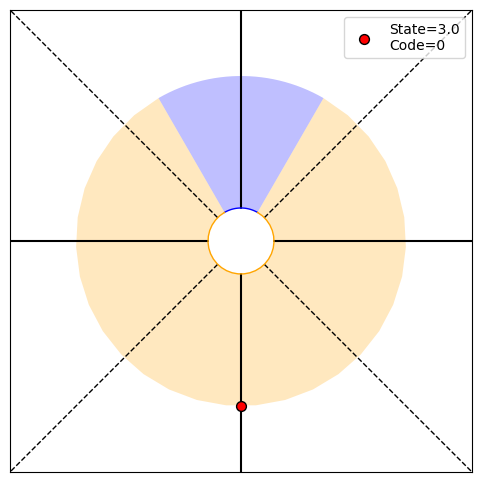

P(O1:34,S34|T)=[0.   0.   0.25 0.25], P(O1:34|actions,T)=0.5, P(T|O1:34)=[1.00000000e+00 1.16415322e-10], H34=0.00
PRINT 1: 4.0096574273346035e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


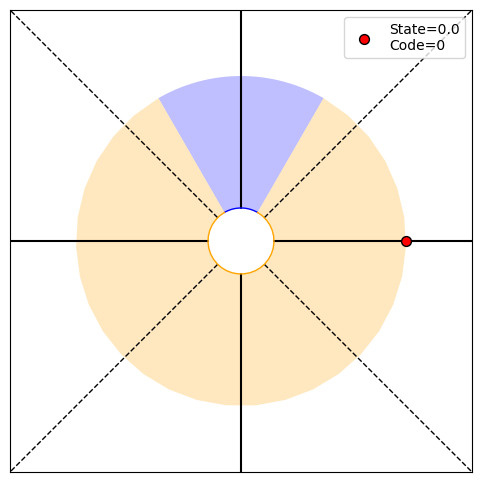

P(O1:35,S35|T)=[0.25 0.   0.   0.25], P(O1:35|actions,T)=0.5, P(T|O1:35)=[1.00000000e+00 5.82076609e-11], H35=0.00
PRINT 1: 2.063036374686746e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.00241436e-09 0.00000000e+00], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


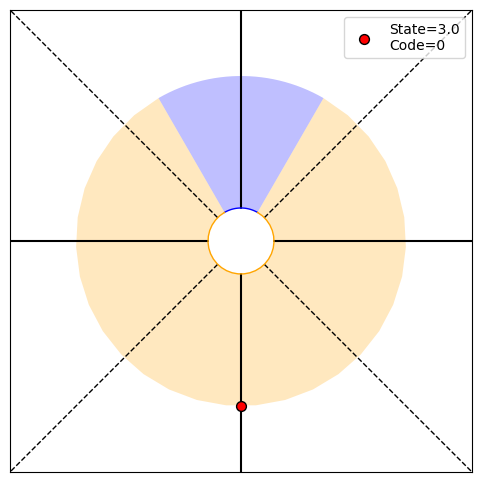

P(O1:36,S36|T)=[0.   0.   0.25 0.25], P(O1:36|actions,T)=0.5, P(T|O1:36)=[1.00000000e+00 2.91038305e-11], H36=0.00
PRINT 1: 1.0606220178274475e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


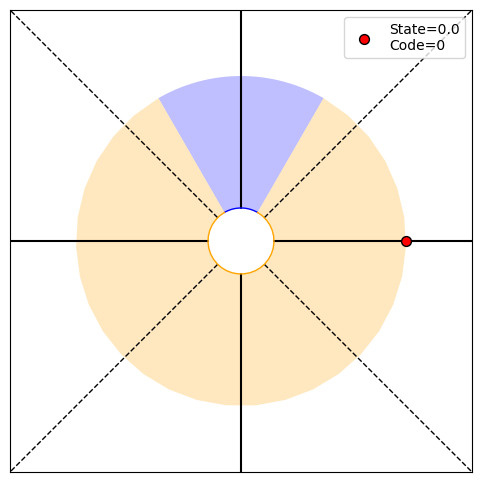

P(O1:37,S37|T)=[0.25 0.   0.   0.25], P(O1:37|actions,T)=0.5, P(T|O1:37)=[1.00000000e+00 1.45519152e-11], H37=0.00
PRINT 1: 5.448629241491377e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.65155504e-10 0.00000000e+00], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


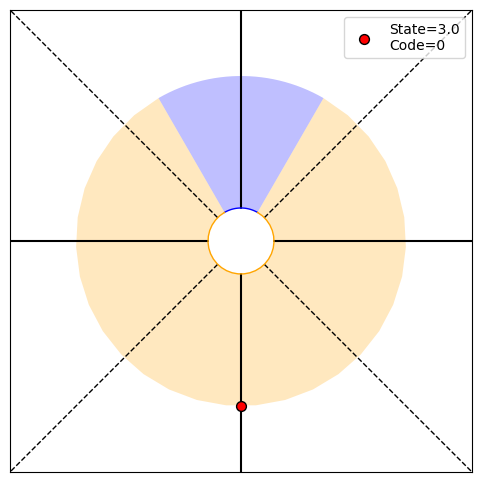

P(O1:38,S38|T)=[0.   0.   0.25 0.25], P(O1:38|actions,T)=0.5, P(T|O1:38)=[1.00000000e+00 7.27595761e-12], H38=0.00
PRINT 1: 2.797074196905669e-10, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


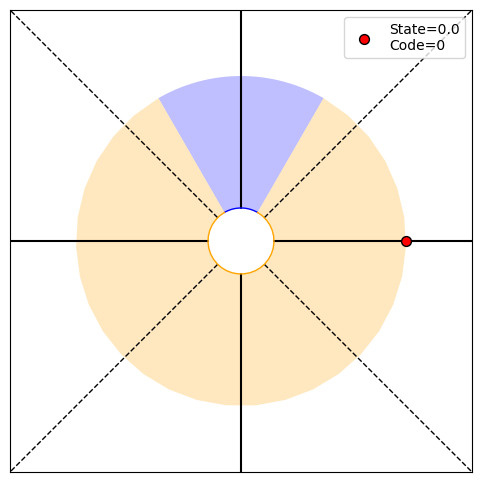

P(O1:39,S39|T)=[0.25 0.   0.   0.25], P(O1:39|actions,T)=0.5, P(T|O1:39)=[1.00000000e+00 3.63797881e-12], H39=0.00
PRINT 1: 1.4349168865284212e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [6.99268549e-11 0.00000000e+00], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


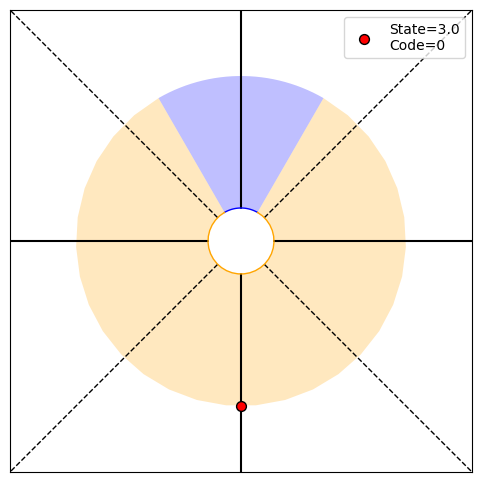

P(O1:40,S40|T)=[0.   0.   0.25 0.25], P(O1:40|actions,T)=0.5, P(T|O1:40)=[1.0000000e+00 1.8189894e-12], H40=0.00
PRINT 1: 7.356483373008693e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.58729222e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


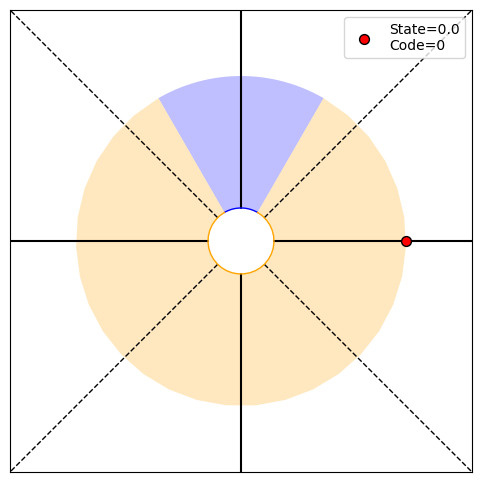

P(O1:41,S41|T)=[0.25 0.   0.   0.25], P(O1:41|actions,T)=0.5, P(T|O1:41)=[1.00000000e+00 9.09494702e-13], H41=0.00
PRINT 1: 3.769191156684724e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.83912084e-11 0.00000000e+00], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


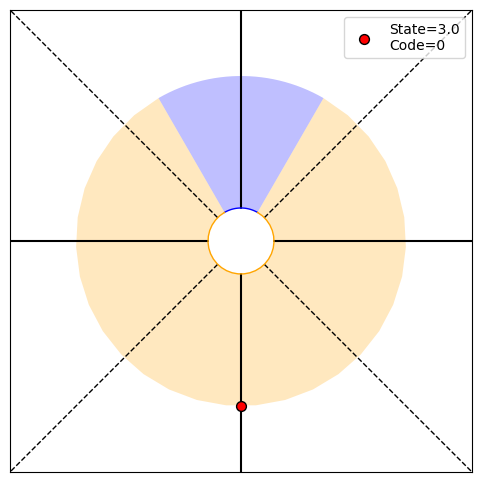

P(O1:42,S42|T)=[0.   0.   0.25 0.25], P(O1:42|actions,T)=0.5, P(T|O1:42)=[1.00000000e+00 4.54747351e-13], H42=0.00
PRINT 1: 1.9300703134317997e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 9.42297789e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


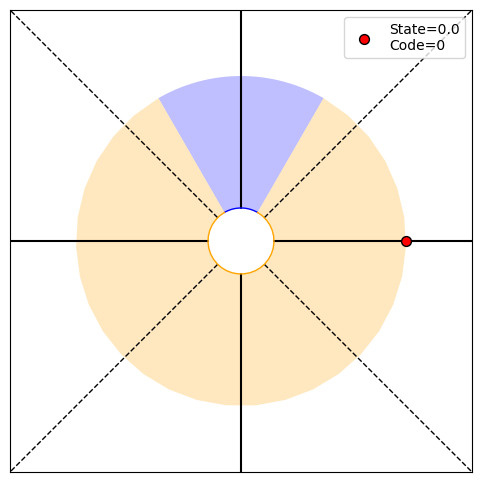

P(O1:43,S43|T)=[0.25 0.   0.   0.25], P(O1:43|actions,T)=0.5, P(T|O1:43)=[1.00000000e+00 2.27373675e-13], H43=0.00
PRINT 1: 9.877725242604262e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [4.82517578e-12 0.00000000e+00], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


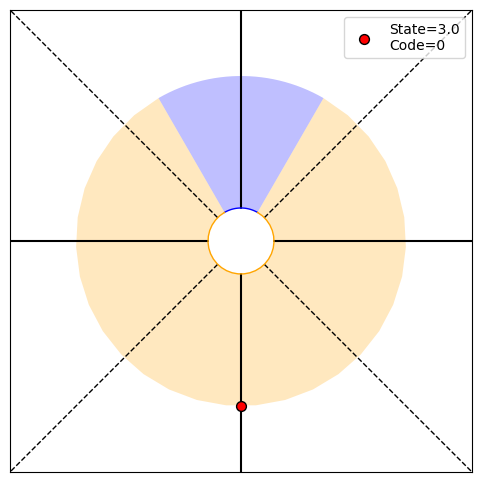

P(O1:44,S44|T)=[0.   0.   0.25 0.25], P(O1:44|actions,T)=0.5, P(T|O1:44)=[1.00000000e+00 1.13686838e-13], H44=0.00
PRINT 1: 5.052549459024267e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.46943131e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


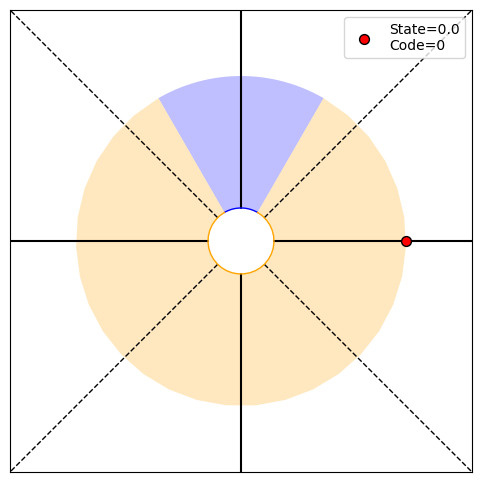

P(O1:45,S45|T)=[0.25 0.   0.   0.25], P(O1:45|actions,T)=0.5, P(T|O1:45)=[1.00000000e+00 5.68434189e-14], H45=0.00
PRINT 1: 2.5831181483730752e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.26313736e-12 0.00000000e+00], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


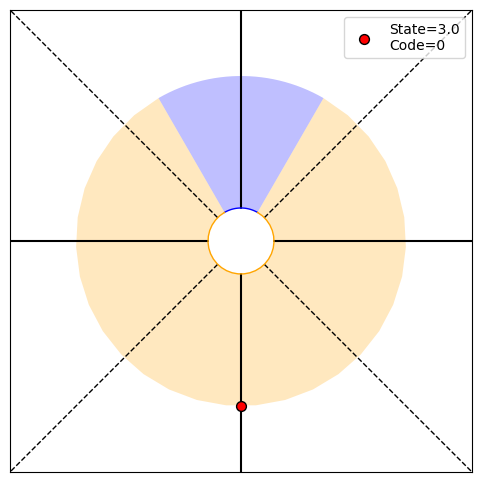

P(O1:46,S46|T)=[0.   0.   0.25 0.25], P(O1:46|actions,T)=0.5, P(T|O1:46)=[1.00000000e+00 2.84217094e-14], H46=0.00
PRINT 1: 1.3199807836169758e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.45779537e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


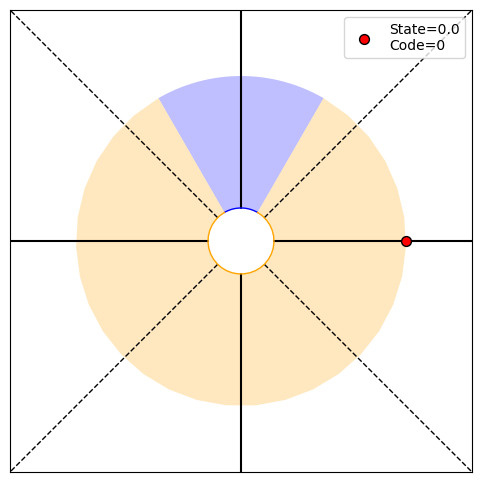

P(O1:47,S47|T)=[0.25 0.   0.   0.25], P(O1:47|actions,T)=0.5, P(T|O1:47)=[1.00000000e+00 1.42108547e-14], H47=0.00
PRINT 1: 6.742012465236986e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.29995196e-13 0.00000000e+00], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


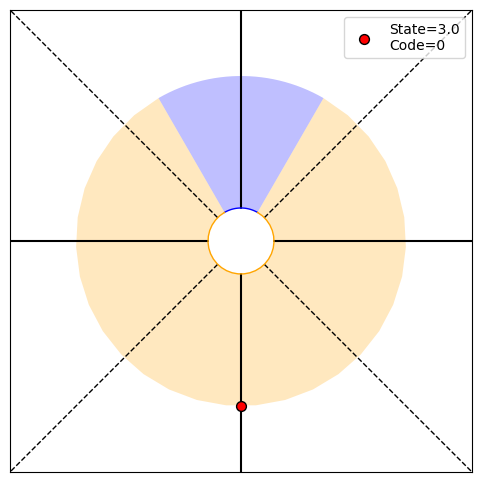

P(O1:48,S48|T)=[0.   0.   0.25 0.25], P(O1:48|actions,T)=0.5, P(T|O1:48)=[1.00000000e+00 7.10542736e-15], H48=0.00
PRINT 1: 3.442060506194525e-13, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.68550312e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


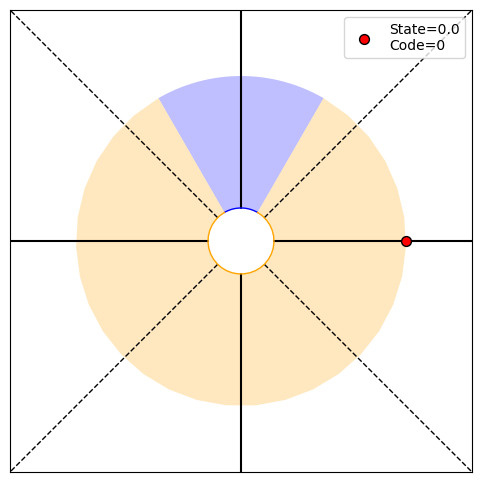

P(O1:49,S49|T)=[0.25 0.   0.   0.25], P(O1:49|actions,T)=0.5, P(T|O1:49)=[1.00000000e+00 3.55271368e-15], H49=0.00
PRINT 1: 1.7565573898852736e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [8.60515127e-14 0.00000000e+00], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


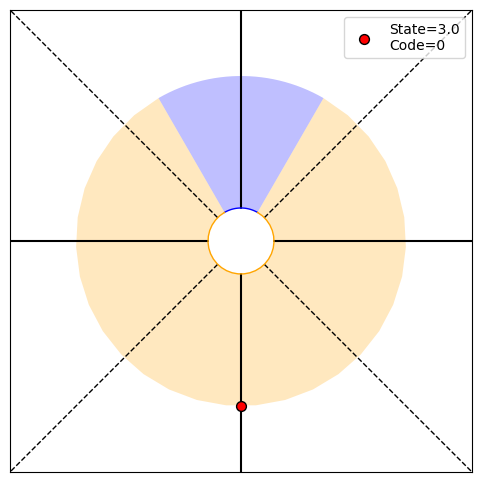

P(O1:50,S50|T)=[0.   0.   0.25 0.25], P(O1:50|actions,T)=0.5, P(T|O1:50)=[1.00000000e+00 1.77635684e-15], H50=0.00
PRINT 1: 8.960422633366407e-14, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 4.39139347e-14], [1.00000000e+00 1.77635684e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


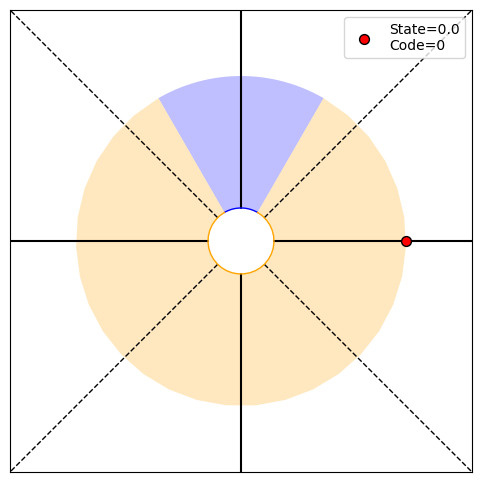

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: 90.0, Code received: 1.0


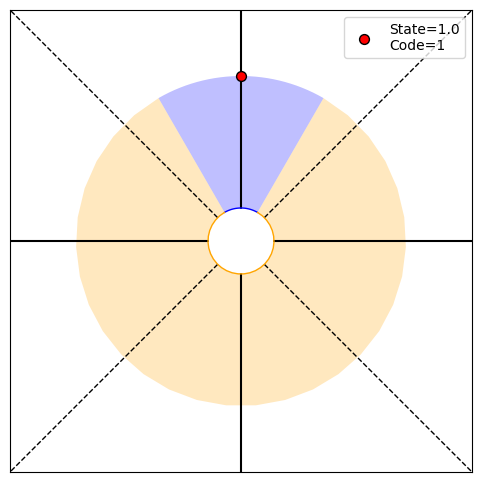

P(O1:2,S2|T)=[0.   0.25 0.   0.  ], P(O1:2|actions,T)=0.25, P(T|O1:2)=[0.5 0.5], H2=1.00
PRINT 1: 1.0, [0.   0.25 0.   0.  ]
PRINT 2: [0.31127812 0.31127812], [0.5 0.5]
Choosing randomly
Current angle: 0.0, Code received: 0.0


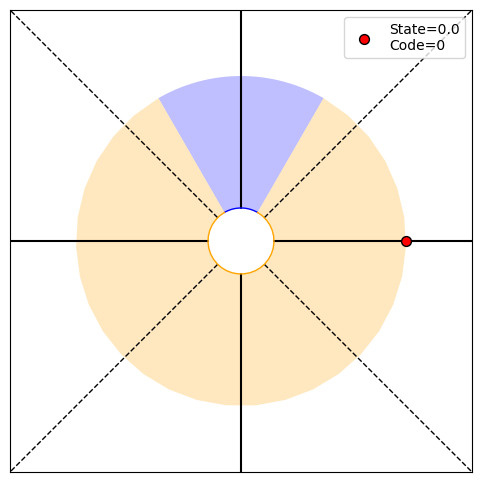

P(O1:3,S3|T)=[0.25 0.   0.   0.  ], P(O1:3|actions,T)=0.25, P(T|O1:3)=[0.66666667 0.33333333], H3=0.92
PRINT 1: 0.9182958340544896, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.31668909 0.31668909], [0.66666667 0.33333333]
Choosing randomly
Current angle: -90.0, Code received: 0.0


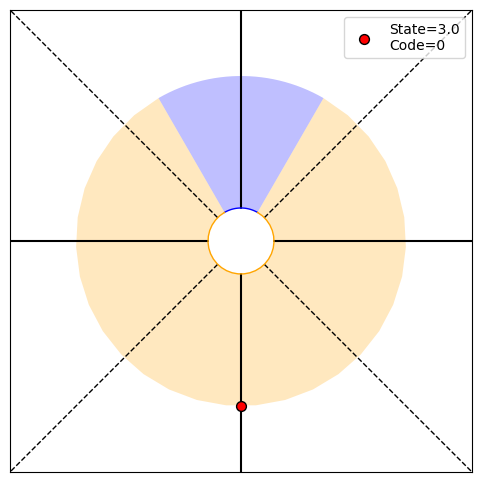

P(O1:4,S4|T)=[0.   0.   0.   0.25], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.8 0.2], H4=0.72
PRINT 1: 0.7219280948873623, [1.33459511e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [0.26899559 0.26899559], [0.8 0.2]
Choosing randomly
Current angle: -180.0, Code received: 0.0


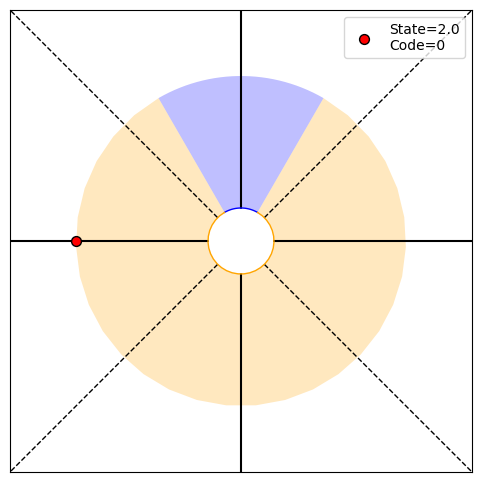

P(O1:5,S5|T)=[0.   0.   0.25 0.  ], P(O1:5|actions,T)=0.25, P(T|O1:5)=[0.88888889 0.11111111], H5=0.50
PRINT 1: 0.5032583347756456, [1.86003799e-044 0.00000000e+000 2.50000000e-001 2.66919022e-109]
PRINT 2: [0.19843232 0.19843232], [0.88888889 0.11111111]
Choosing randomly
Current angle: -270.0, Code received: 1.0


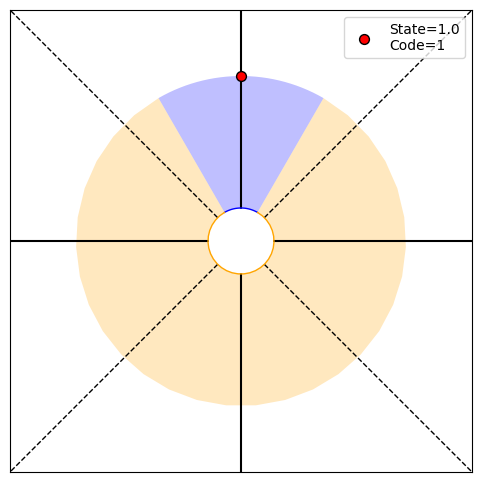

P(O1:6,S6|T)=[0.   0.25 0.   0.  ], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.94117647 0.05882353], H6=0.32
PRINT 1: 0.3227569588973982, [0.   0.25 0.   0.  ]
PRINT 2: [0.13260973 0.13260973], [0.94117647 0.05882353]
Choosing randomly
Current angle: -180.0, Code received: 0.0


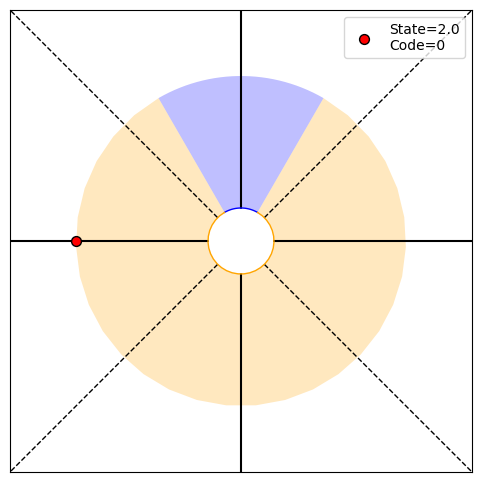

P(O1:7,S7|T)=[0.   0.   0.25 0.  ], P(O1:7|actions,T)=0.25, P(T|O1:7)=[0.96969697 0.03030303], H7=0.20
PRINT 1: 0.19590927087360493, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-23]
PRINT 2: [0.08297127 0.08297127], [0.96969697 0.03030303]
Choosing randomly
Current angle: -90.0, Code received: 0.0


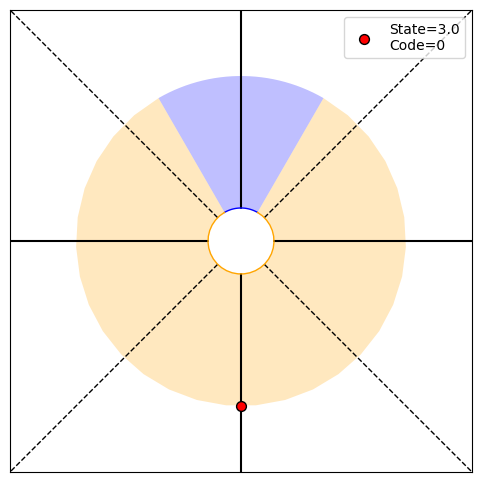

P(O1:8,S8|T)=[0.   0.   0.   0.25], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.98461538 0.01538462], H8=0.11
PRINT 1: 0.11467550533614673, [9.64374924e-023 0.00000000e+000 1.33459511e-109 2.50000000e-001]
PRINT 2: [0.04968846 0.04968846], [0.98461538 0.01538462]
Choosing randomly
Current angle: -180.0, Code received: 0.0


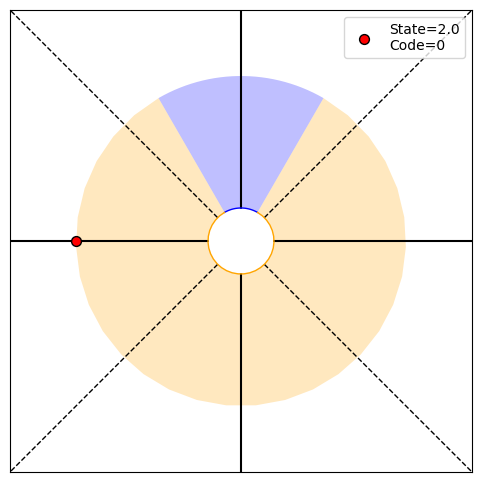

P(O1:9,S9|T)=[0.   0.   0.25 0.  ], P(O1:9|actions,T)=0.25, P(T|O1:9)=[0.99224806 0.00775194], H9=0.07
PRINT 1: 0.065490821314727, [3.45974132e-88 0.00000000e+00 2.50000000e-01 9.64374924e-23]
PRINT 2: [0.02888032 0.02888032], [0.99224806 0.00775194]
Choosing randomly
Current angle: -270.0, Code received: 1.0


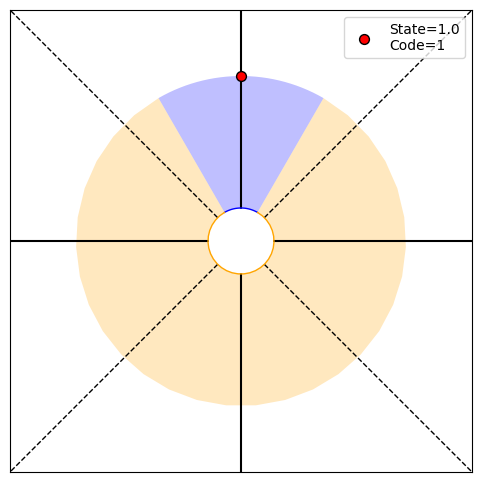

P(O1:10,S10|T)=[0.   0.25 0.   0.  ], P(O1:10|actions,T)=0.25, P(T|O1:10)=[0.99610895 0.00389105], H10=0.04
PRINT 1: 0.03675295386313879, [0.   0.25 0.   0.  ]
PRINT 2: [0.01643369 0.01643369], [0.99610895 0.00389105]
Choosing randomly
Current angle: -180.0, Code received: 0.0


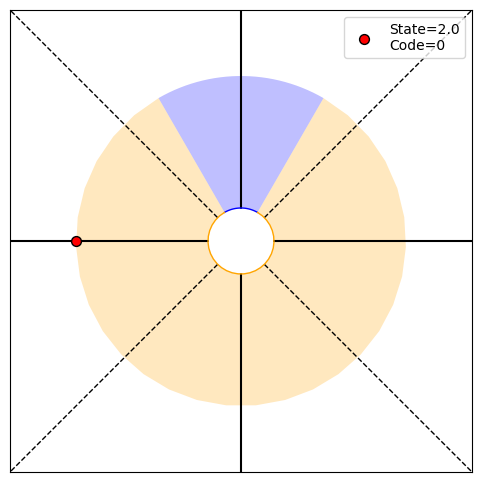

P(O1:11,S11|T)=[0.   0.   0.25 0.  ], P(O1:11|actions,T)=0.25, P(T|O1:11)=[0.99805068 0.00194932], H11=0.02
PRINT 1: 0.020358875256176766, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-23]
PRINT 2: [0.00920546 0.00920546], [0.99805068 0.00194932]
Choosing randomly
Current angle: -90.0, Code received: 0.0


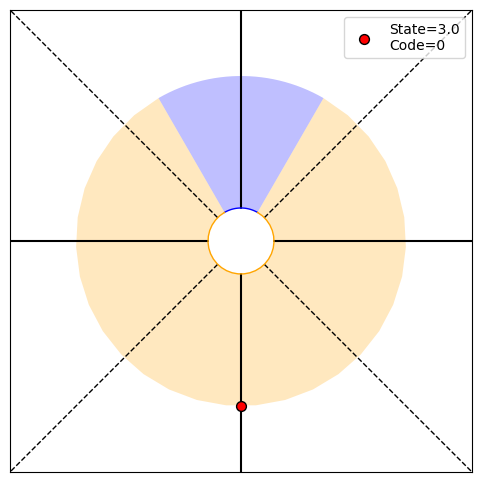

P(O1:12,S12|T)=[0.   0.   0.   0.25], P(O1:12|actions,T)=0.25, P(T|O1:12)=[9.99024390e-01 9.75609756e-04], H12=0.01
PRINT 1: 0.011164291953784, [9.64374924e-023 0.00000000e+000 1.33459511e-109 2.50000000e-001]
PRINT 2: [0.00509451 0.00509451], [9.99024390e-01 9.75609756e-04]
Choosing randomly
Current angle: -180.0, Code received: 0.0


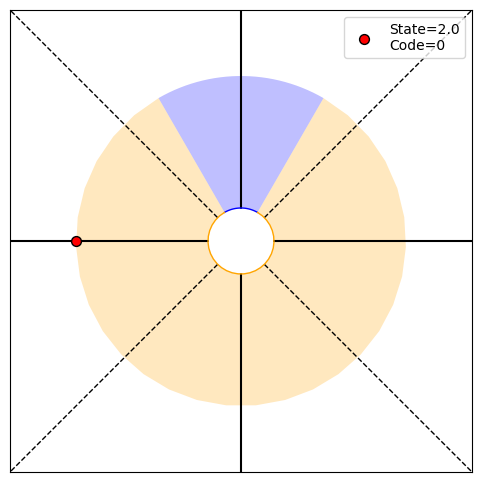

P(O1:13,S13|T)=[0.   0.   0.25 0.  ], P(O1:13|actions,T)=0.25, P(T|O1:13)=[9.99511957e-01 4.88042948e-04], H13=0.01
PRINT 1: 0.006072741436820054, [3.45974132e-88 0.00000000e+00 2.50000000e-01 9.64374924e-23]
PRINT 2: [0.00279239 0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


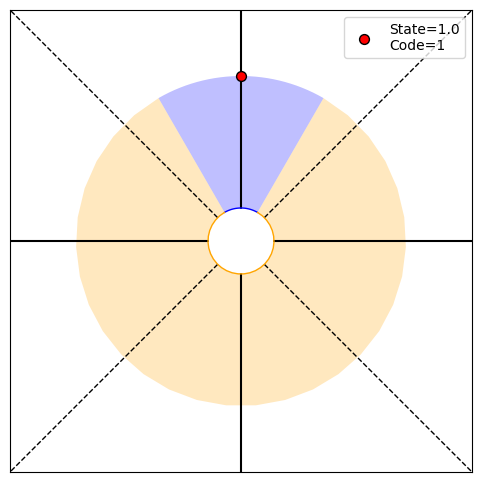

P(O1:14,S14|T)=[0.   0.25 0.   0.  ], P(O1:14|actions,T)=0.25, P(T|O1:14)=[9.99755919e-01 2.44081035e-04], H14=0.00
PRINT 1: 0.003281149899144082, [0.   0.25 0.   0.  ]
PRINT 2: [0.00151855 0.00151855], [9.99755919e-01 2.44081035e-04]
Choosing randomly
Current angle: -360.0, Code received: 0.0


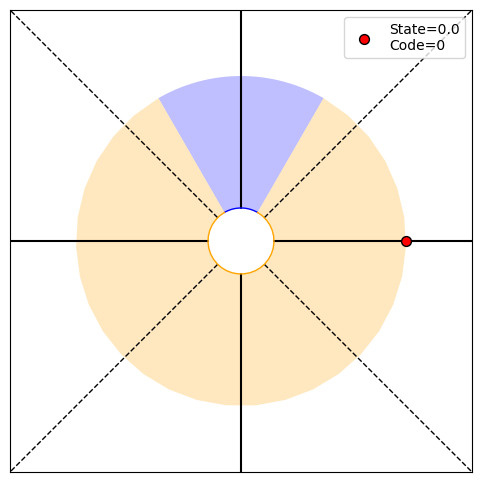

P(O1:15,S15|T)=[0.25 0.   0.   0.  ], P(O1:15|actions,T)=0.25, P(T|O1:15)=[9.99877945e-01 1.22055413e-04], H15=0.00
PRINT 1: 0.0017628198574909618, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.00082038 0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


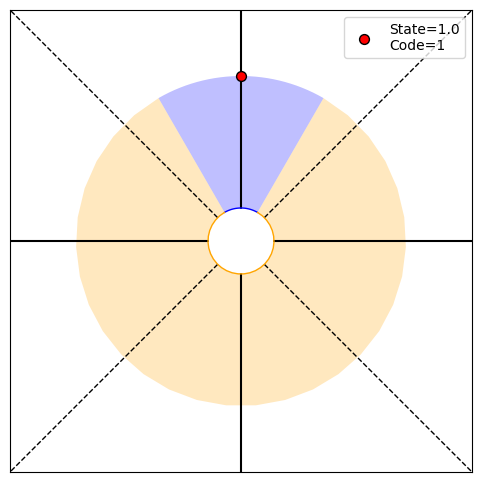

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[9.99938969e-01 6.10314312e-05], H16=0.00
PRINT 1: 0.0009424924667410556, [0.   0.25 0.   0.  ]
PRINT 2: [0.00044073 0.00044073], [9.99938969e-01 6.10314312e-05]
Choosing randomly
Current angle: -180.0, Code received: 0.0


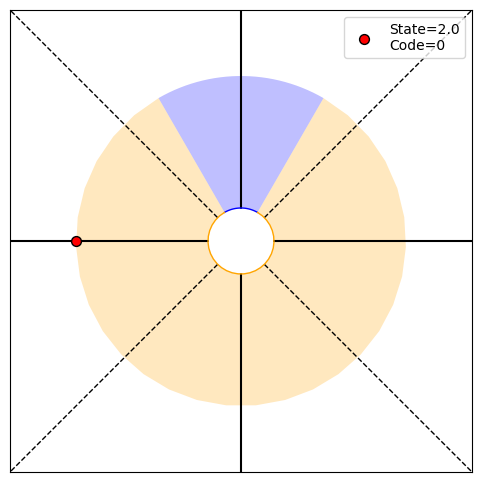

P(O1:17,S17|T)=[0.   0.   0.25 0.  ], P(O1:17|actions,T)=0.25, P(T|O1:17)=[9.99969483e-01 3.05166468e-05], H17=0.00
PRINT 1: 0.0005017765892900114, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-23]
PRINT 2: [0.00023563 0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing randomly
Current angle: -90.0, Code received: 0.0


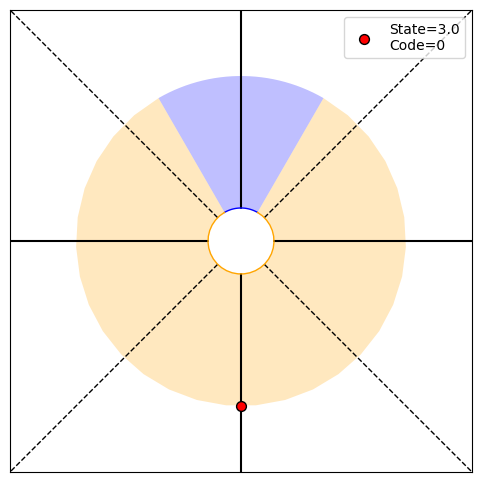

P(O1:18,S18|T)=[0.   0.   0.   0.25], P(O1:18|actions,T)=0.25, P(T|O1:18)=[9.99984741e-01 1.52585562e-05], H18=0.00
PRINT 1: 0.0002661505111268847, [9.64374924e-023 0.00000000e+000 1.33459511e-109 2.50000000e-001]
PRINT 2: [0.00012545 0.00012545], [9.99984741e-01 1.52585562e-05]
Choosing randomly
Current angle: 0.0, Code received: 0.0


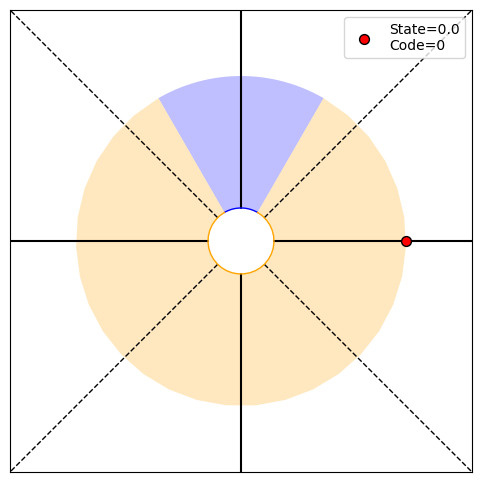

P(O1:19,S19|T)=[0.25 0.   0.   0.  ], P(O1:19|actions,T)=0.25, P(T|O1:19)=[9.99992371e-01 7.62933632e-06], H19=0.00
PRINT 1: 0.00014070556517604537, [2.50000000e-001 0.00000000e+000 1.86003799e-044 2.66919022e-109]
PRINT 2: [6.65381249e-05 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing randomly
Current angle: 90.0, Code received: 1.0


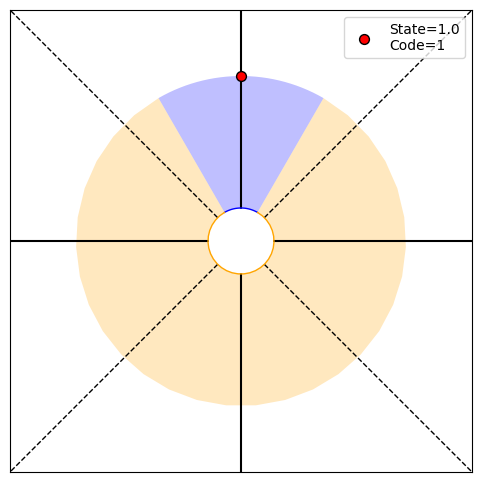

P(O1:20,S20|T)=[0.   0.25 0.   0.  ], P(O1:20|actions,T)=0.25, P(T|O1:20)=[9.99996185e-01 3.81468271e-06], H20=0.00
PRINT 1: 7.416772317850377e-05, [0.   0.25 0.   0.  ]
PRINT 2: [3.51765229e-05 3.51765229e-05], [9.99996185e-01 3.81468271e-06]
Choosing randomly
Current angle: 180.0, Code received: 0.0


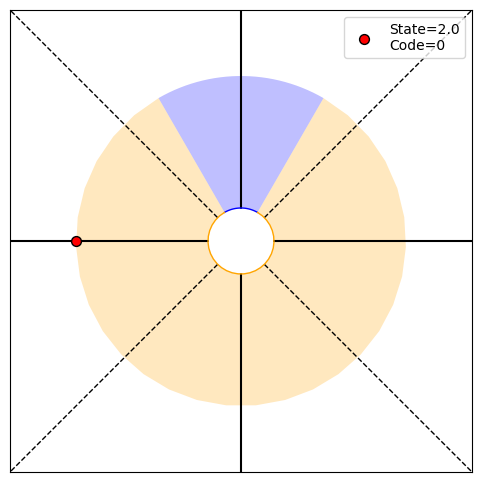

P(O1:21,S21|T)=[0.   0.   0.25 0.  ], P(O1:21|actions,T)=0.25, P(T|O1:21)=[9.99998093e-01 1.90734499e-06], H21=0.00
PRINT 1: 3.899127469152328e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-23]
PRINT 2: [1.85419655e-05 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


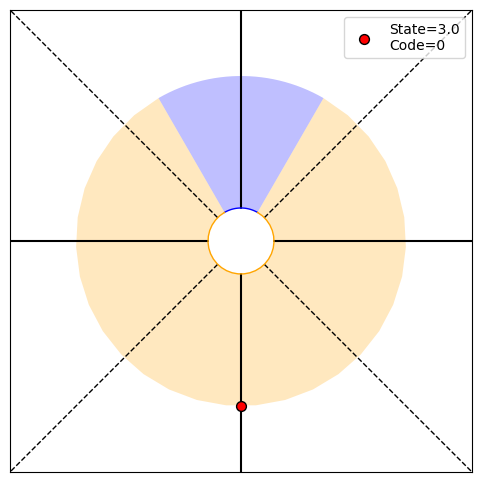

P(O1:22,S22|T)=[0.   0.   0.   0.25], P(O1:22|actions,T)=0.25, P(T|O1:22)=[9.99999046e-01 9.53673407e-07], H22=0.00
PRINT 1: 2.0449328689088202e-05, [9.64374924e-023 0.00000000e+000 1.33459511e-109 2.50000000e-001]
PRINT 2: [9.74782781e-06 9.74782781e-06], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


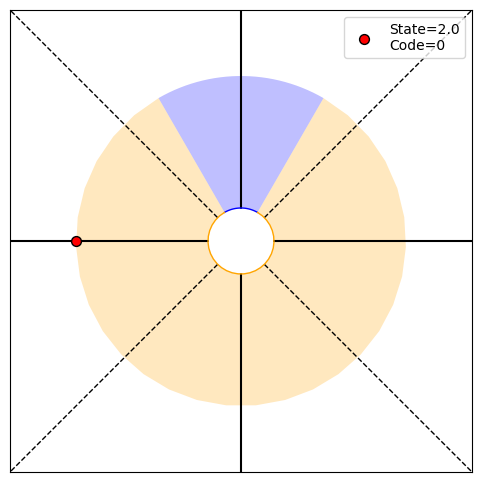

P(O1:23,S23|T)=[0.   0.   0.25 0.  ], P(O1:23|actions,T)=0.25, P(T|O1:23)=[9.99999523e-01 4.76836931e-07], H23=0.00
PRINT 1: 1.070150598685641e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 9.64374924e-23]
PRINT 2: [5.11233457e-06 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


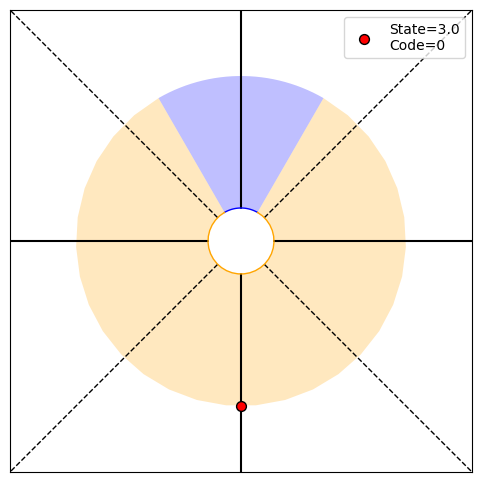

P(O1:24,S24|T)=[0.   0.   0.   0.25], P(O1:24|actions,T)=0.25, P(T|O1:24)=[9.99999762e-01 2.38418522e-07], H24=0.00
PRINT 1: 5.589172750401203e-06, [1.44656239e-022 0.00000000e+000 2.00189266e-109 2.50000000e-001]
PRINT 2: [2.67537712e-06 2.67537712e-06], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


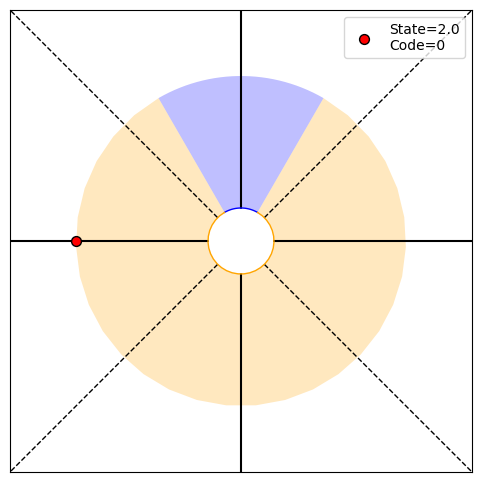

P(O1:25,S25|T)=[0.   0.   0.25 0.  ], P(O1:25|actions,T)=0.25, P(T|O1:25)=[9.99999881e-01 1.19209275e-07], H25=0.00
PRINT 1: 2.9137959734301916e-06, [3.45974132e-88 0.00000000e+00 2.50000000e-01 1.44656239e-22]
PRINT 2: [1.39729335e-06 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


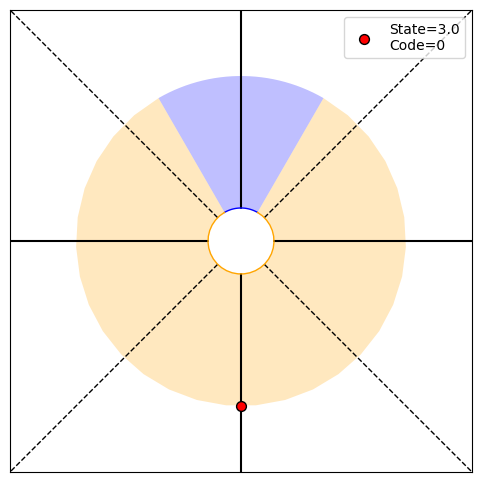

P(O1:26,S26|T)=[0.   0.   0.   0.25], P(O1:26|actions,T)=0.25, P(T|O1:26)=[9.99999940e-01 5.96046412e-08], H26=0.00
PRINT 1: 1.516502712212915e-06, [1.92874985e-022 0.00000000e+000 2.66919022e-109 2.50000000e-001]
PRINT 2: [7.28449036e-07 7.28449036e-07], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


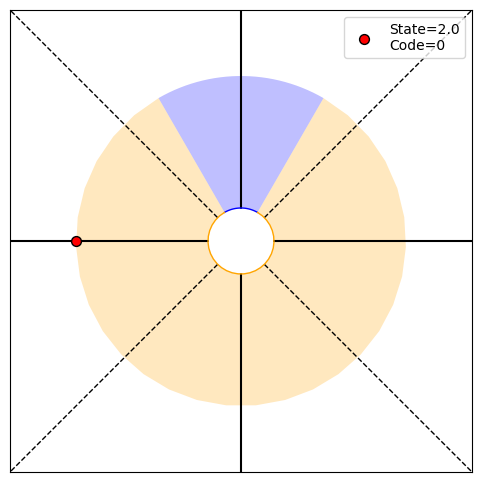

P(O1:27,S27|T)=[0.   0.   0.25 0.  ], P(O1:27|actions,T)=0.25, P(T|O1:27)=[9.99999970e-01 2.98023215e-08], H27=0.00
PRINT 1: 7.880536995629398e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 1.92874985e-22]
PRINT 2: [3.79125689e-07 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


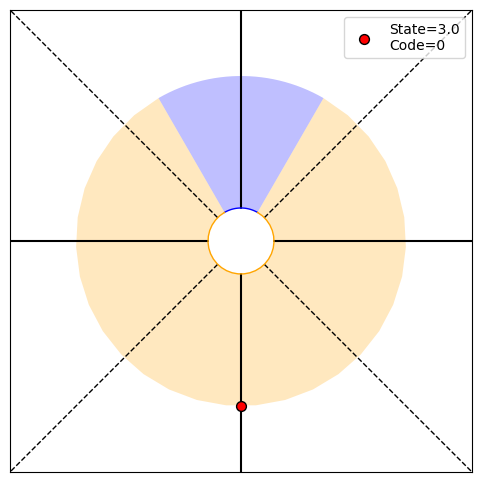

P(O1:28,S28|T)=[0.   0.   0.   0.25], P(O1:28|actions,T)=0.25, P(T|O1:28)=[9.99999985e-01 1.49011610e-08], H28=0.00
PRINT 1: 4.0892801646455924e-07, [2.41093731e-022 0.00000000e+000 3.33648777e-109 2.50000000e-001]
PRINT 2: [1.97013428e-07 1.97013428e-07], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


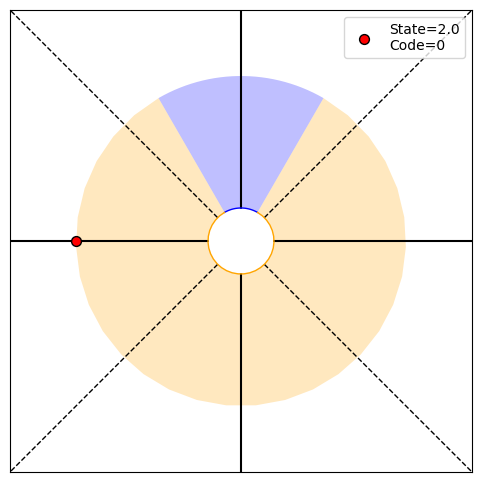

P(O1:29,S29|T)=[0.   0.   0.25 0.  ], P(O1:29|actions,T)=0.25, P(T|O1:29)=[9.99999993e-01 7.45058054e-09], H29=0.00
PRINT 1: 2.1191459017693936e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.41093731e-22]
PRINT 2: [1.02232005e-07 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


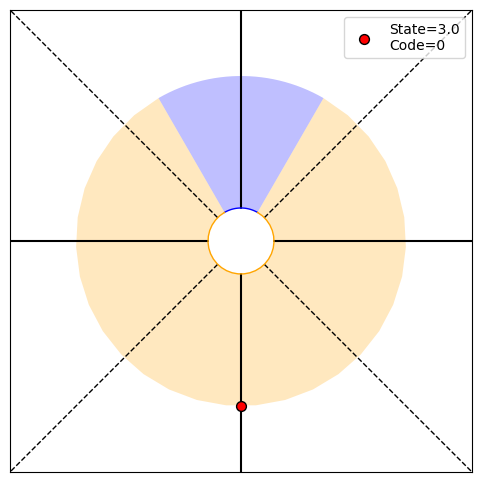

P(O1:30,S30|T)=[0.   0.   0.   0.25], P(O1:30|actions,T)=0.25, P(T|O1:30)=[9.99999996e-01 3.72529028e-09], H30=0.00
PRINT 1: 1.09682585817829e-07, [2.89312477e-022 0.00000000e+000 4.00378532e-109 2.50000000e-001]
PRINT 2: [5.29786478e-08 5.29786478e-08], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


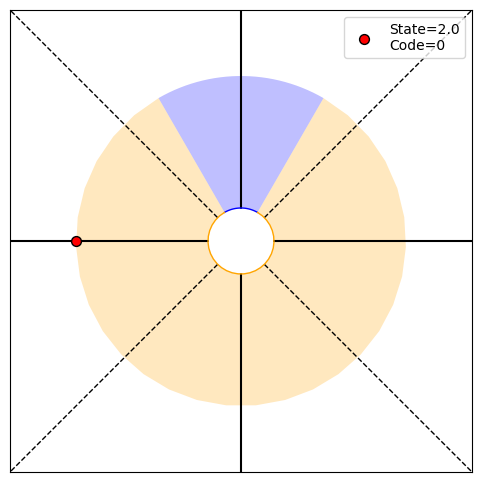

P(O1:31,S31|T)=[0.   0.   0.25 0.  ], P(O1:31|actions,T)=0.25, P(T|O1:31)=[9.99999998e-01 1.86264515e-09], H31=0.00
PRINT 1: 5.6703938149317856e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.89312477e-22]
PRINT 2: [2.74206465e-08 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


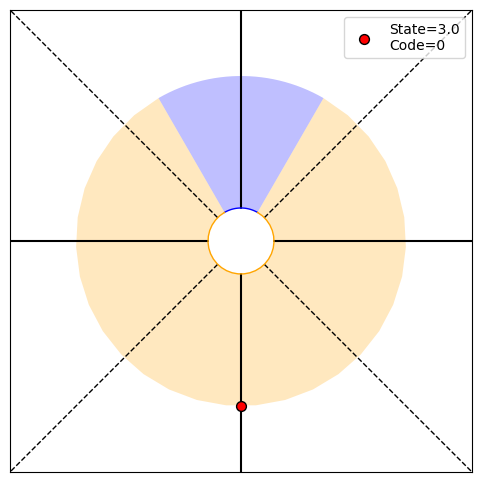

P(O1:32,S32|T)=[0.   0.   0.   0.25], P(O1:32|actions,T)=0.25, P(T|O1:32)=[9.99999999e-01 9.31322574e-10], H32=0.00
PRINT 1: 2.9283291672934866e-08, [3.37531223e-022 0.00000000e+000 4.67108288e-109 2.50000000e-001]
PRINT 2: [1.41759846e-08 1.41759846e-08], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


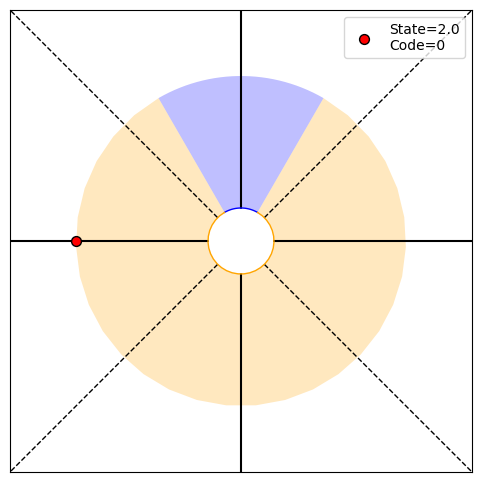

P(O1:33,S33|T)=[0.   0.   0.25 0.  ], P(O1:33|actions,T)=0.25, P(T|O1:33)=[1.00000000e+00 4.65661287e-10], H33=0.00
PRINT 1: 1.5107307129907126e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 3.37531223e-22]
PRINT 2: [7.32082292e-09 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


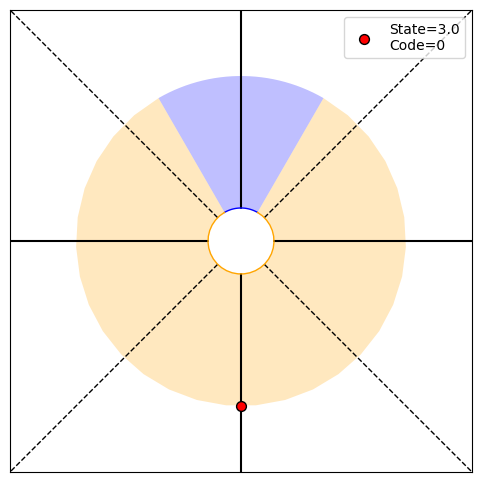

P(O1:34,S34|T)=[0.   0.   0.   0.25], P(O1:34|actions,T)=0.25, P(T|O1:34)=[1.00000000e+00 2.32830644e-10], H34=0.00
PRINT 1: 7.786484210194632e-09, [3.85749970e-022 0.00000000e+000 5.33838043e-109 2.50000000e-001]
PRINT 2: [3.77682678e-09 3.77682678e-09], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


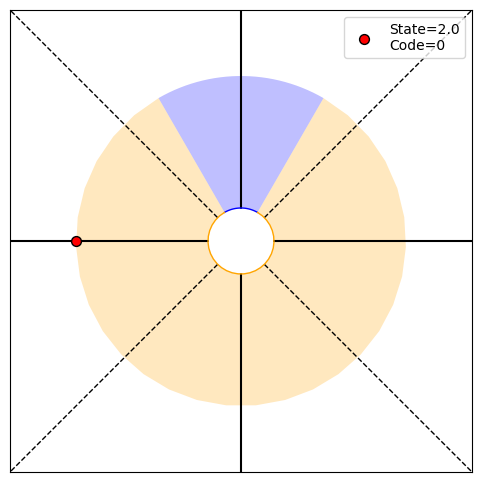

P(O1:35,S35|T)=[0.   0.   0.25 0.  ], P(O1:35|actions,T)=0.25, P(T|O1:35)=[1.00000000e+00 1.16415322e-10], H35=0.00
PRINT 1: 4.009657427334603e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 3.85749970e-22]
PRINT 2: [1.94662105e-09 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


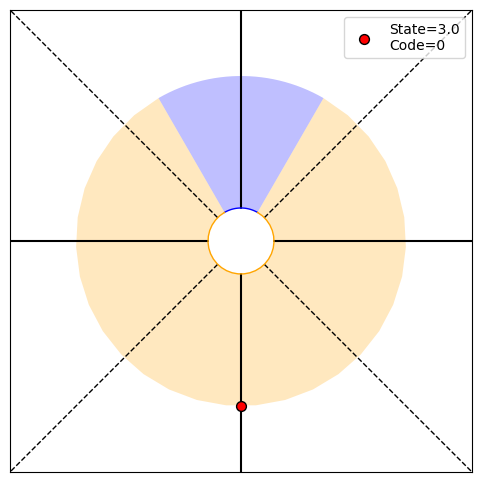

P(O1:36,S36|T)=[0.   0.   0.   0.25], P(O1:36|actions,T)=0.25, P(T|O1:36)=[1.00000000e+00 5.82076609e-11], H36=0.00
PRINT 1: 2.0630363746867455e-09, [4.33968716e-022 0.00000000e+000 6.00567798e-109 2.50000000e-001]
PRINT 2: [1.00241436e-09 1.00241436e-09], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


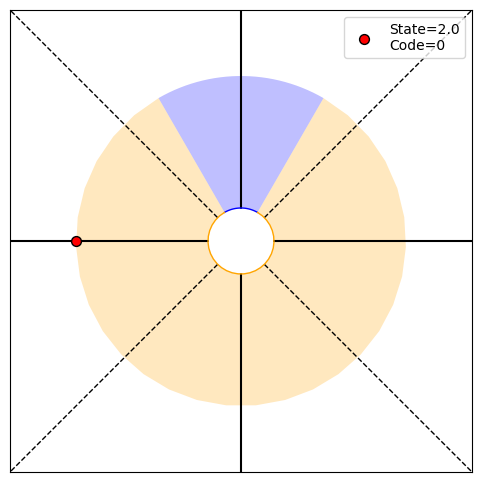

P(O1:37,S37|T)=[0.   0.   0.25 0.  ], P(O1:37|actions,T)=0.25, P(T|O1:37)=[1.00000000e+00 2.91038305e-11], H37=0.00
PRINT 1: 1.0606220178274472e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.33968716e-22]
PRINT 2: [5.15759094e-10 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


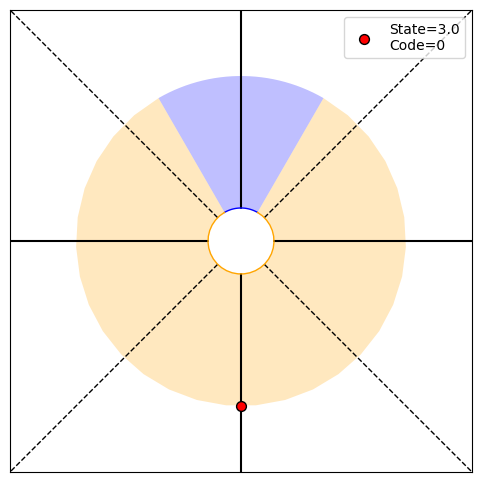

P(O1:38,S38|T)=[0.   0.   0.   0.25], P(O1:38|actions,T)=0.25, P(T|O1:38)=[1.00000000e+00 1.45519152e-11], H38=0.00
PRINT 1: 5.448629241491376e-10, [4.82187462e-022 0.00000000e+000 6.67297554e-109 2.50000000e-001]
PRINT 2: [2.65155504e-10 2.65155504e-10], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


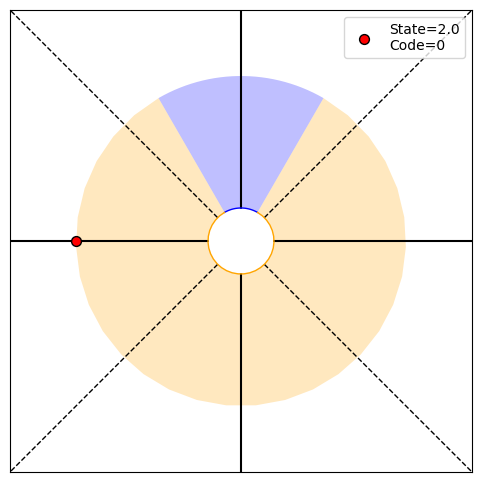

P(O1:39,S39|T)=[0.   0.   0.25 0.  ], P(O1:39|actions,T)=0.25, P(T|O1:39)=[1.00000000e+00 7.27595761e-12], H39=0.00
PRINT 1: 2.7970741969056687e-10, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-22]
PRINT 2: [1.36215731e-10 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


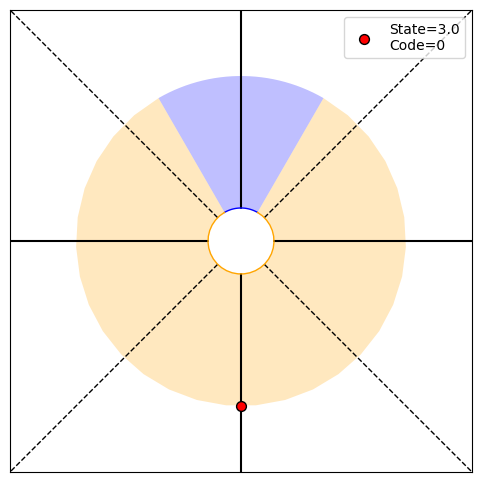

P(O1:40,S40|T)=[0.   0.   0.   0.25], P(O1:40|actions,T)=0.25, P(T|O1:40)=[1.00000000e+00 3.63797881e-12], H40=0.00
PRINT 1: 1.434916886528421e-10, [5.30406208e-022 0.00000000e+000 7.34027309e-109 2.50000000e-001]
PRINT 2: [6.99268549e-11 6.99268549e-11], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


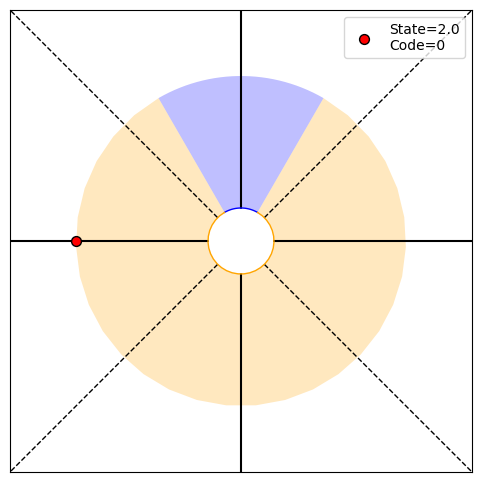

P(O1:41,S41|T)=[0.   0.   0.25 0.  ], P(O1:41|actions,T)=0.25, P(T|O1:41)=[1.0000000e+00 1.8189894e-12], H41=0.00
PRINT 1: 7.356483373008692e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 5.30406208e-22]
PRINT 2: [3.58729221e-11 3.58729222e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


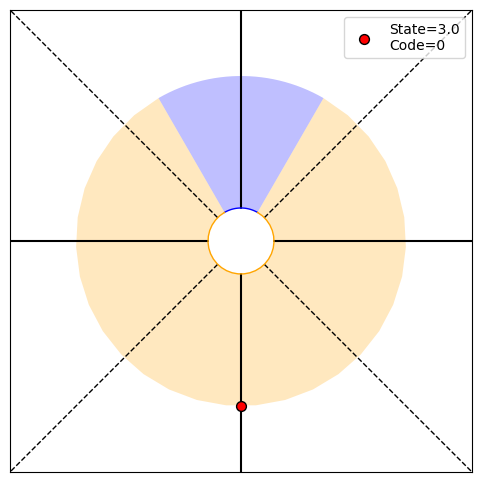

P(O1:42,S42|T)=[0.   0.   0.   0.25], P(O1:42|actions,T)=0.25, P(T|O1:42)=[1.00000000e+00 9.09494702e-13], H42=0.00
PRINT 1: 3.7691911566847234e-11, [5.78624954e-022 0.00000000e+000 8.00757065e-109 2.50000000e-001]
PRINT 2: [1.83912084e-11 1.83912084e-11], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


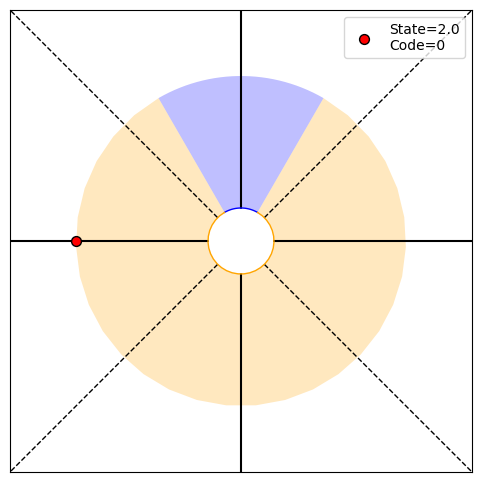

P(O1:43,S43|T)=[0.   0.   0.25 0.  ], P(O1:43|actions,T)=0.25, P(T|O1:43)=[1.00000000e+00 4.54747351e-13], H43=0.00
PRINT 1: 1.9300703134317994e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 5.78624954e-22]
PRINT 2: [9.42297783e-12 9.42297789e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


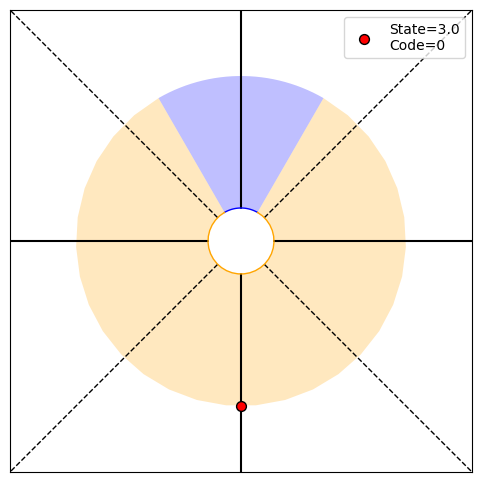

P(O1:44,S44|T)=[0.   0.   0.   0.25], P(O1:44|actions,T)=0.25, P(T|O1:44)=[1.00000000e+00 2.27373675e-13], H44=0.00
PRINT 1: 9.87772524260426e-12, [6.26843701e-022 0.00000000e+000 8.67486820e-109 2.50000000e-001]
PRINT 2: [4.82517578e-12 4.82517572e-12], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


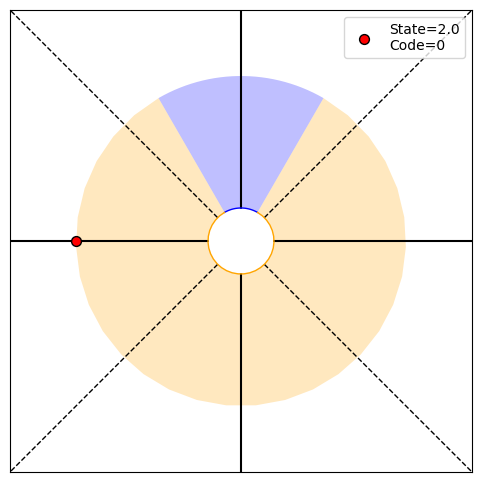

P(O1:45,S45|T)=[0.   0.   0.25 0.  ], P(O1:45|actions,T)=0.25, P(T|O1:45)=[1.00000000e+00 1.13686838e-13], H45=0.00
PRINT 1: 5.052549459024266e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 6.26843701e-22]
PRINT 2: [2.46943125e-12 2.46943131e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


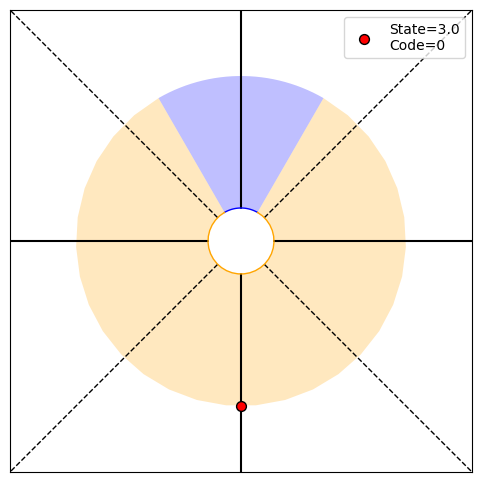

P(O1:46,S46|T)=[0.   0.   0.   0.25], P(O1:46|actions,T)=0.25, P(T|O1:46)=[1.00000000e+00 5.68434189e-14], H46=0.00
PRINT 1: 2.583118148373075e-12, [6.75062447e-022 0.00000000e+000 9.34216575e-109 2.50000000e-001]
PRINT 2: [1.26313736e-12 1.26313730e-12], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


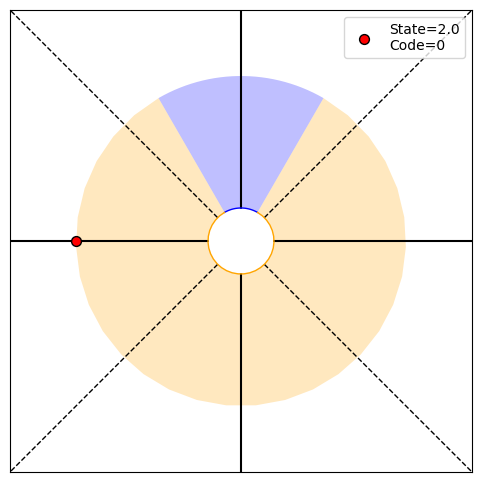

P(O1:47,S47|T)=[0.   0.   0.25 0.  ], P(O1:47|actions,T)=0.25, P(T|O1:47)=[1.00000000e+00 2.84217094e-14], H47=0.00
PRINT 1: 1.3199807836169755e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 6.75062447e-22]
PRINT 2: [6.45779473e-13 6.45779537e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


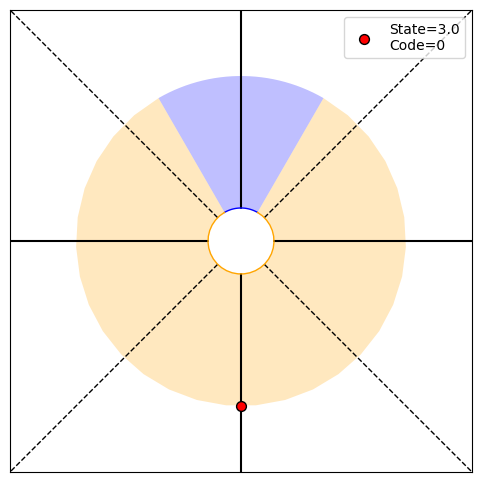

P(O1:48,S48|T)=[0.   0.   0.   0.25], P(O1:48|actions,T)=0.25, P(T|O1:48)=[1.00000000e+00 1.42108547e-14], H48=0.00
PRINT 1: 6.742012465236986e-13, [7.23281193e-022 0.00000000e+000 1.00094633e-108 2.50000000e-001]
PRINT 2: [3.29995196e-13 3.29995130e-13], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


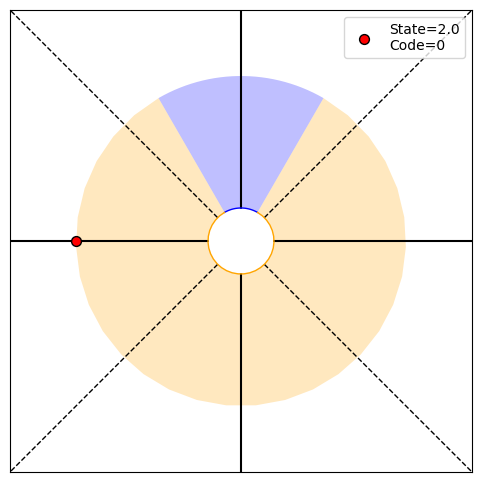

P(O1:49,S49|T)=[0.   0.   0.25 0.  ], P(O1:49|actions,T)=0.25, P(T|O1:49)=[1.00000000e+00 7.10542736e-15], H49=0.00
PRINT 1: 3.4420605061945245e-13, [3.45974132e-88 0.00000000e+00 2.50000000e-01 7.23281193e-22]
PRINT 2: [1.68550249e-13 1.68550312e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


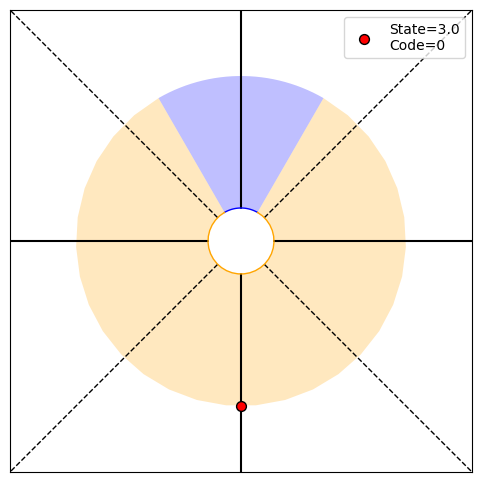

P(O1:50,S50|T)=[0.   0.   0.   0.25], P(O1:50|actions,T)=0.25, P(T|O1:50)=[1.00000000e+00 3.55271368e-15], H50=0.00
PRINT 1: 1.7565573898852733e-13, [7.71499939e-022 0.00000000e+000 1.06767609e-108 2.50000000e-001]
PRINT 2: [8.60515127e-14 8.60514492e-14], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


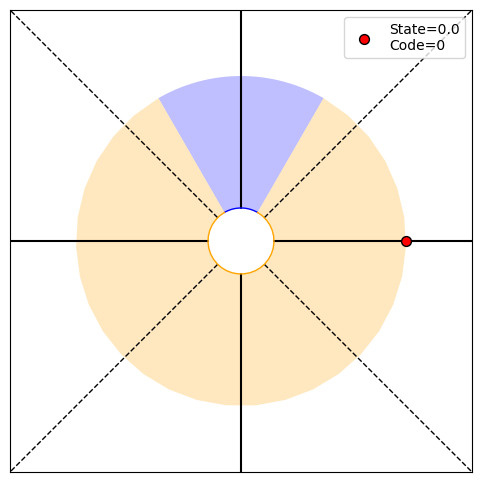

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: 90.0, Code received: 1.0


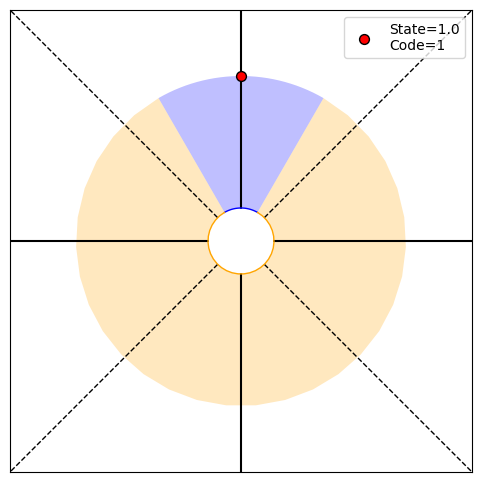

P(O1:2,S2|T)=[0.   0.25 0.   0.  ], P(O1:2|actions,T)=0.25, P(T|O1:2)=[0.5 0.5], H2=1.00
PRINT 1: 1.0, [0.   0.25 0.   0.  ]
PRINT 2: [0.31127812 0.31127812], [0.5 0.5]
Choosing randomly
Current angle: 0.0, Code received: 0.0


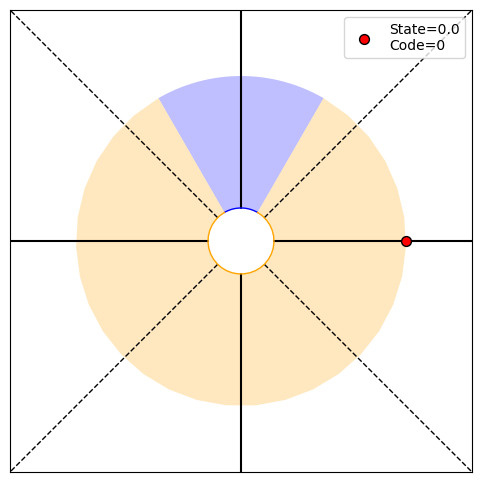

P(O1:3,S3|T)=[0.25 0.   0.   0.  ], P(O1:3|actions,T)=0.25, P(T|O1:3)=[0.66666667 0.33333333], H3=0.92
PRINT 1: 0.9182958340544896, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.31668909 0.31668909], [0.66666667 0.33333333]
Choosing randomly
Current angle: -90.0, Code received: 0.0


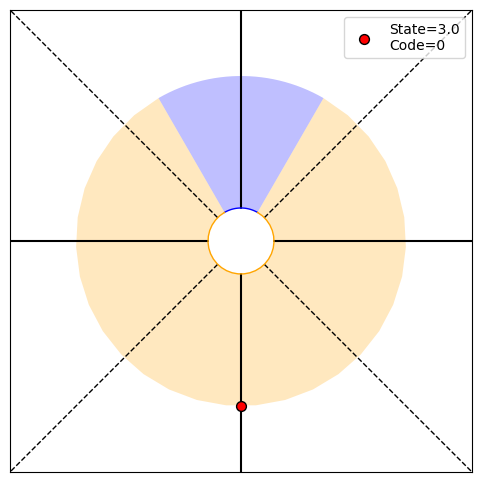

P(O1:4,S4|T)=[0.   0.   0.   0.25], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.8 0.2], H4=0.72
PRINT 1: 0.7219280948873623, [1.33459511e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [0.26899559 0.26899559], [0.8 0.2]
Choosing randomly
Current angle: 0.0, Code received: 0.0


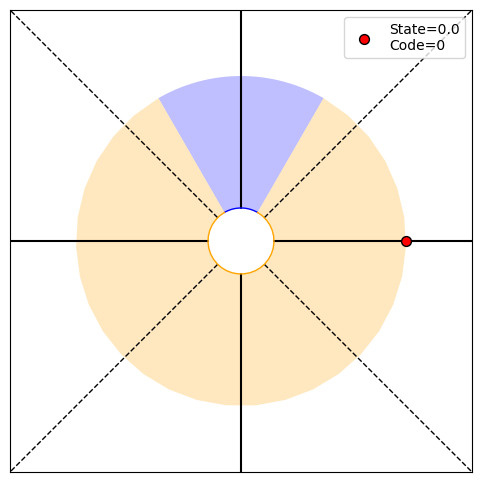

P(O1:5,S5|T)=[0.25 0.   0.   0.  ], P(O1:5|actions,T)=0.25, P(T|O1:5)=[0.88888889 0.11111111], H5=0.50
PRINT 1: 0.5032583347756456, [2.50000000e-01 0.00000000e+00 3.45974132e-88 9.64374924e-23]
PRINT 2: [0.19843232 0.19843232], [0.88888889 0.11111111]
Choosing randomly
Current angle: 90.0, Code received: 1.0


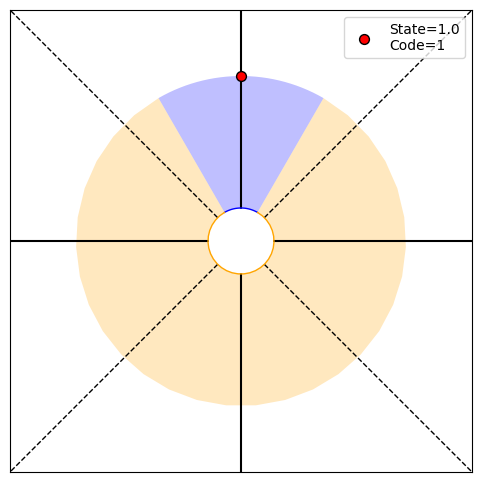

P(O1:6,S6|T)=[0.   0.25 0.   0.  ], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.94117647 0.05882353], H6=0.32
PRINT 1: 0.3227569588973982, [0.   0.25 0.   0.  ]
PRINT 2: [0.13260973 0.13260973], [0.94117647 0.05882353]
Choosing randomly
Current angle: 180.0, Code received: 0.0


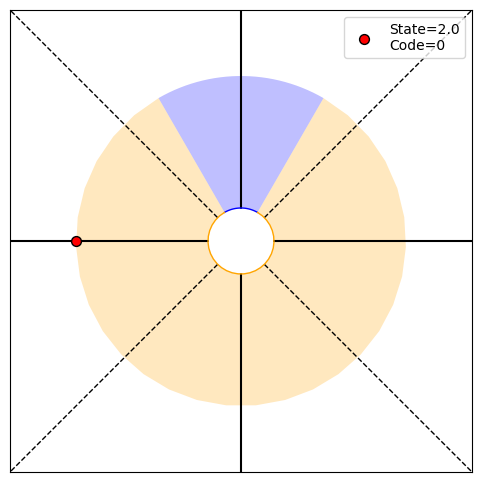

P(O1:7,S7|T)=[0.   0.   0.25 0.  ], P(O1:7|actions,T)=0.25, P(T|O1:7)=[0.96969697 0.03030303], H7=0.20
PRINT 1: 0.19590927087360493, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-23]
PRINT 2: [0.08297127 0.08297127], [0.96969697 0.03030303]
Choosing randomly
Current angle: 270.0, Code received: 0.0


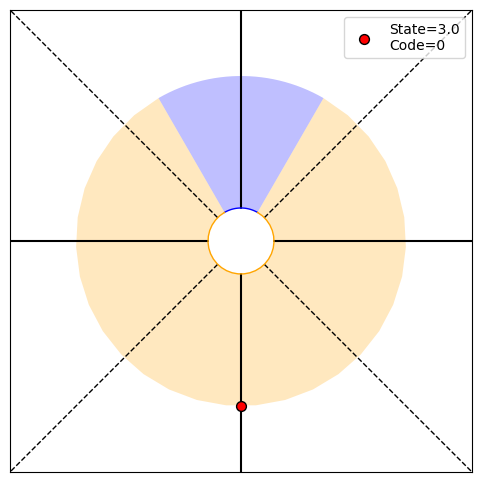

P(O1:8,S8|T)=[0.   0.   0.   0.25], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.98461538 0.01538462], H8=0.11
PRINT 1: 0.11467550533614673, [9.64374924e-023 0.00000000e+000 1.33459511e-109 2.50000000e-001]
PRINT 2: [0.04968846 0.04968846], [0.98461538 0.01538462]
Choosing randomly
Current angle: 180.0, Code received: 0.0


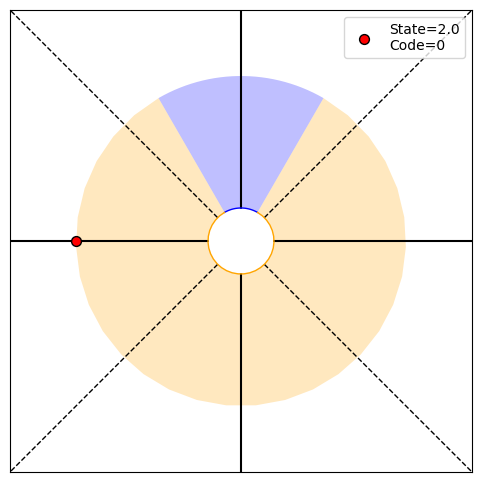

P(O1:9,S9|T)=[0.   0.   0.25 0.  ], P(O1:9|actions,T)=0.25, P(T|O1:9)=[0.99224806 0.00775194], H9=0.07
PRINT 1: 0.065490821314727, [3.45974132e-88 0.00000000e+00 2.50000000e-01 9.64374924e-23]
PRINT 2: [0.02888032 0.02888032], [0.99224806 0.00775194]
Choosing randomly
Current angle: 90.0, Code received: 1.0


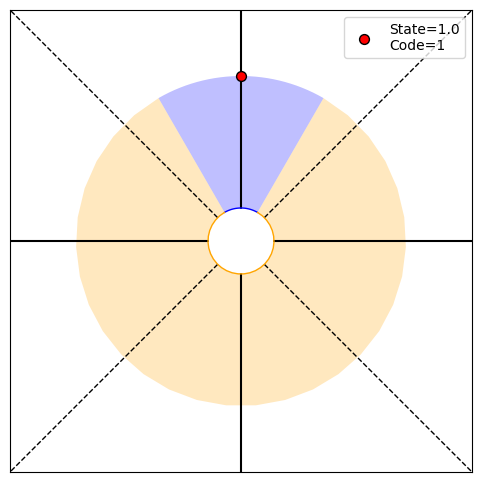

P(O1:10,S10|T)=[0.   0.25 0.   0.  ], P(O1:10|actions,T)=0.25, P(T|O1:10)=[0.99610895 0.00389105], H10=0.04
PRINT 1: 0.03675295386313879, [0.   0.25 0.   0.  ]
PRINT 2: [0.01643369 0.01643369], [0.99610895 0.00389105]
Choosing randomly
Current angle: 0.0, Code received: 0.0


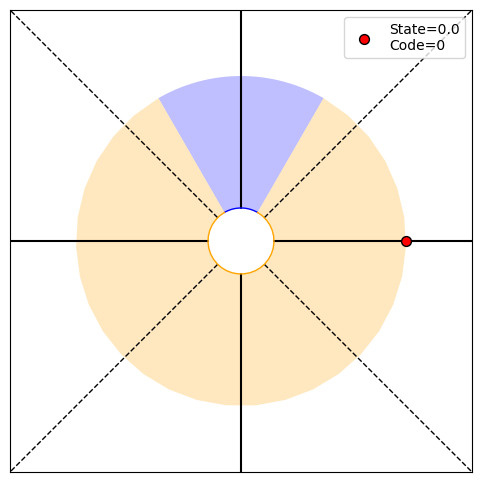

P(O1:11,S11|T)=[0.25 0.   0.   0.  ], P(O1:11|actions,T)=0.25, P(T|O1:11)=[0.99805068 0.00194932], H11=0.02
PRINT 1: 0.020358875256176766, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.00920546 0.00920546], [0.99805068 0.00194932]
Choosing randomly
Current angle: 90.0, Code received: 1.0


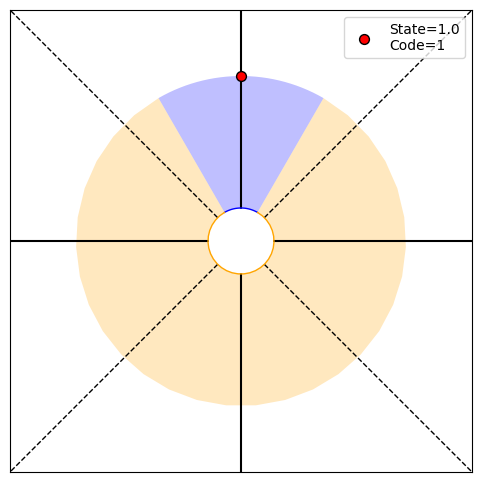

P(O1:12,S12|T)=[0.   0.25 0.   0.  ], P(O1:12|actions,T)=0.25, P(T|O1:12)=[9.99024390e-01 9.75609756e-04], H12=0.01
PRINT 1: 0.011164291953784, [0.   0.25 0.   0.  ]
PRINT 2: [0.00509451 0.00509451], [9.99024390e-01 9.75609756e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


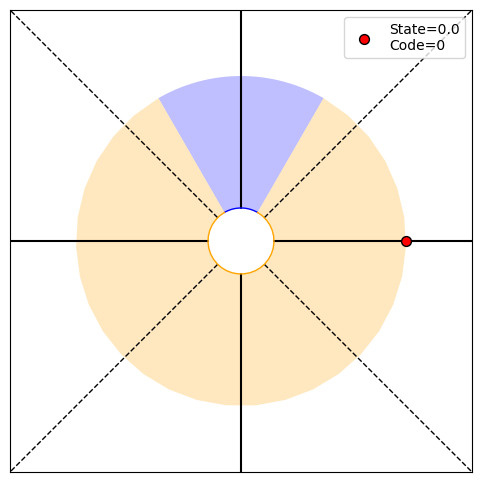

P(O1:13,S13|T)=[0.25 0.   0.   0.  ], P(O1:13|actions,T)=0.25, P(T|O1:13)=[9.99511957e-01 4.88042948e-04], H13=0.01
PRINT 1: 0.006072741436820054, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.00279239 0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing randomly
Current angle: -90.0, Code received: 0.0


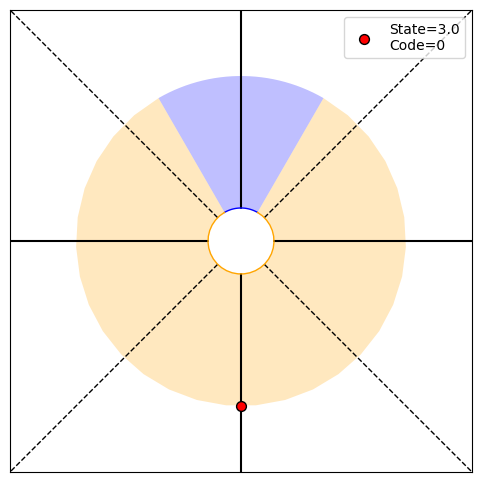

P(O1:14,S14|T)=[0.   0.   0.   0.25], P(O1:14|actions,T)=0.25, P(T|O1:14)=[9.99755919e-01 2.44081035e-04], H14=0.00
PRINT 1: 0.003281149899144082, [1.33459511e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [0.00151855 0.00151855], [9.99755919e-01 2.44081035e-04]
Choosing randomly
Current angle: 0.0, Code received: 0.0


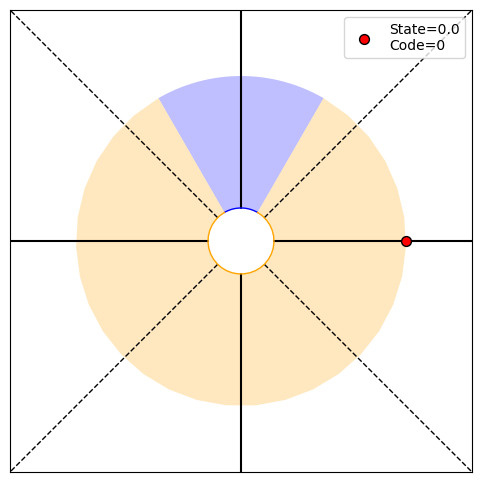

P(O1:15,S15|T)=[0.25 0.   0.   0.  ], P(O1:15|actions,T)=0.25, P(T|O1:15)=[9.99877945e-01 1.22055413e-04], H15=0.00
PRINT 1: 0.0017628198574909618, [2.50000000e-01 0.00000000e+00 3.45974132e-88 9.64374924e-23]
PRINT 2: [0.00082038 0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing randomly
Current angle: -90.0, Code received: 0.0


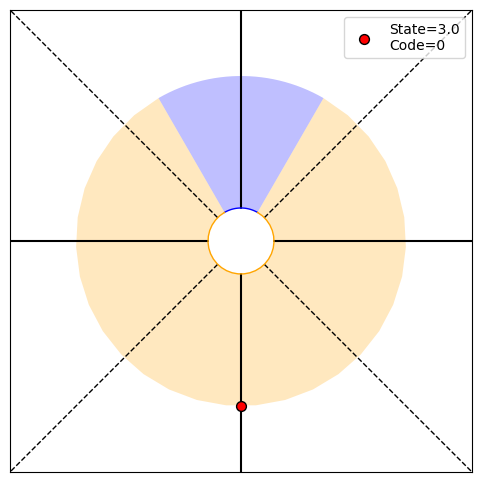

P(O1:16,S16|T)=[0.   0.   0.   0.25], P(O1:16|actions,T)=0.25, P(T|O1:16)=[9.99938969e-01 6.10314312e-05], H16=0.00
PRINT 1: 0.0009424924667410556, [2.00189266e-109 0.00000000e+000 1.44656239e-022 2.50000000e-001]
PRINT 2: [0.00044073 0.00044073], [9.99938969e-01 6.10314312e-05]
Choosing randomly
Current angle: -180.0, Code received: 0.0


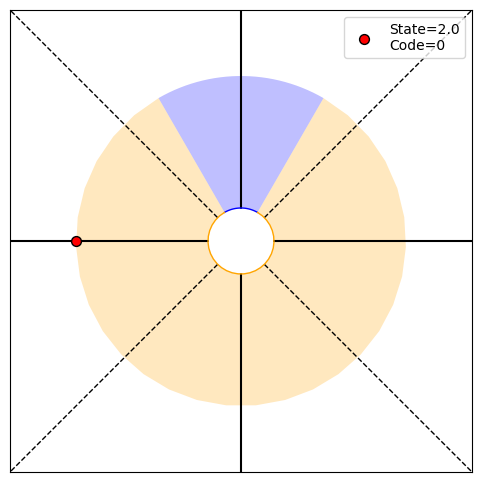

P(O1:17,S17|T)=[0.   0.   0.25 0.  ], P(O1:17|actions,T)=0.25, P(T|O1:17)=[9.99969483e-01 3.05166468e-05], H17=0.00
PRINT 1: 0.0005017765892900114, [2.79005698e-044 0.00000000e+000 2.50000000e-001 4.00378532e-109]
PRINT 2: [0.00023563 0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing randomly
Current angle: -90.0, Code received: 0.0


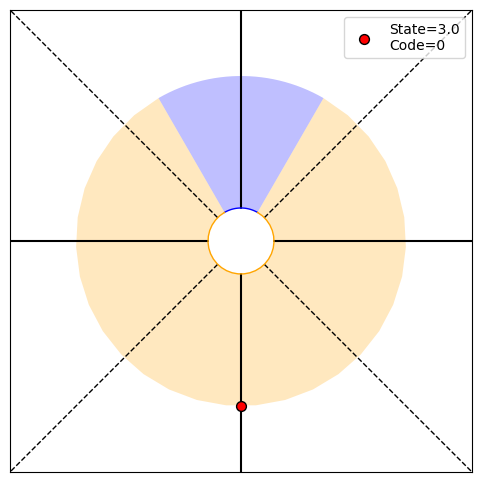

P(O1:18,S18|T)=[0.   0.   0.   0.25], P(O1:18|actions,T)=0.25, P(T|O1:18)=[9.99984741e-01 1.52585562e-05], H18=0.00
PRINT 1: 0.0002661505111268847, [4.82187462e-23 0.00000000e+00 5.38132198e-66 2.50000000e-01]
PRINT 2: [0.00012545 0.00012545], [9.99984741e-01 1.52585562e-05]
Choosing randomly
Current angle: 0.0, Code received: 0.0


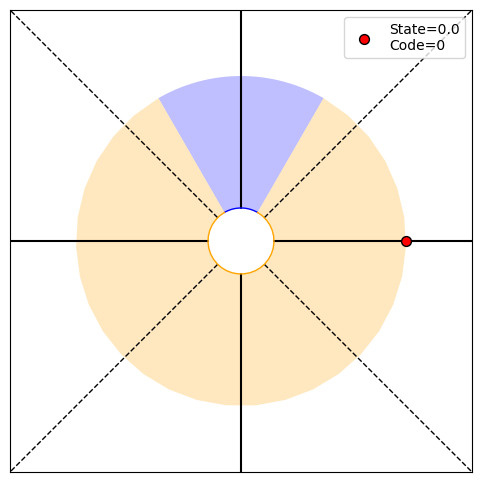

P(O1:19,S19|T)=[0.25 0.   0.   0.  ], P(O1:19|actions,T)=0.25, P(T|O1:19)=[9.99992371e-01 7.62933632e-06], H19=0.00
PRINT 1: 0.00014070556517604537, [2.50000000e-01 0.00000000e+00 9.30018994e-45 5.38132198e-66]
PRINT 2: [6.65381249e-05 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing randomly
Current angle: 90.0, Code received: 1.0


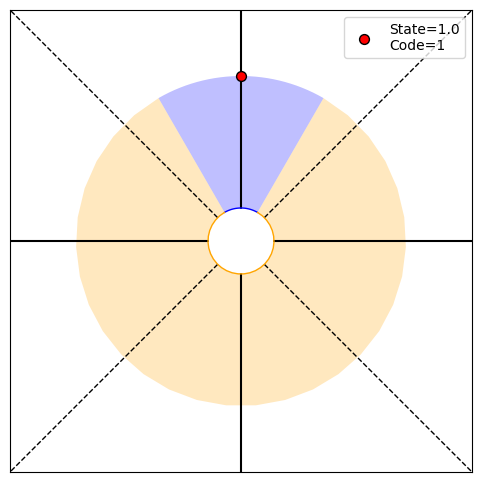

P(O1:20,S20|T)=[0.   0.25 0.   0.  ], P(O1:20|actions,T)=0.25, P(T|O1:20)=[9.99996185e-01 3.81468271e-06], H20=0.00
PRINT 1: 7.416772317850377e-05, [0.   0.25 0.   0.  ]
PRINT 2: [3.51765229e-05 3.51765229e-05], [9.99996185e-01 3.81468271e-06]
Choosing randomly
Current angle: 180.0, Code received: 0.0


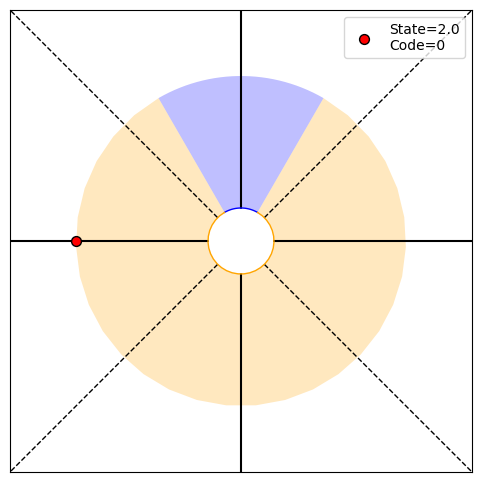

P(O1:21,S21|T)=[0.   0.   0.25 0.  ], P(O1:21|actions,T)=0.25, P(T|O1:21)=[9.99998093e-01 1.90734499e-06], H21=0.00
PRINT 1: 3.899127469152328e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-23]
PRINT 2: [1.85419655e-05 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


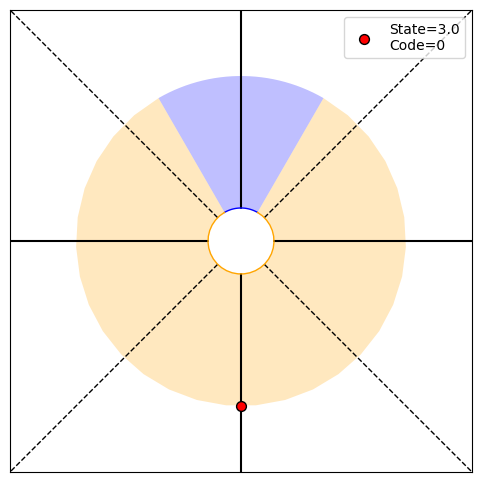

P(O1:22,S22|T)=[0.   0.   0.   0.25], P(O1:22|actions,T)=0.25, P(T|O1:22)=[9.99999046e-01 9.53673407e-07], H22=0.00
PRINT 1: 2.0449328689088202e-05, [9.64374924e-023 0.00000000e+000 1.33459511e-109 2.50000000e-001]
PRINT 2: [9.74782781e-06 9.74782781e-06], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


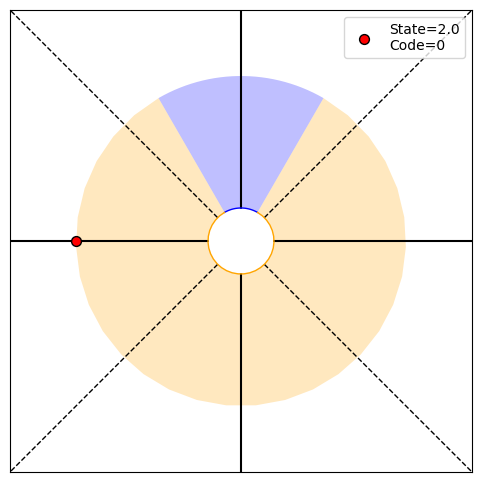

P(O1:23,S23|T)=[0.   0.   0.25 0.  ], P(O1:23|actions,T)=0.25, P(T|O1:23)=[9.99999523e-01 4.76836931e-07], H23=0.00
PRINT 1: 1.070150598685641e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 9.64374924e-23]
PRINT 2: [5.11233457e-06 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


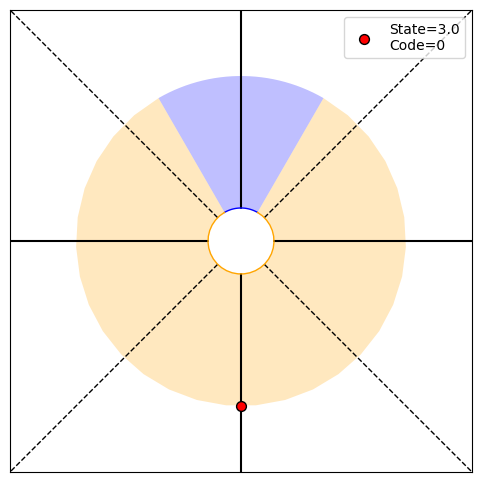

P(O1:24,S24|T)=[0.   0.   0.   0.25], P(O1:24|actions,T)=0.25, P(T|O1:24)=[9.99999762e-01 2.38418522e-07], H24=0.00
PRINT 1: 5.589172750401203e-06, [1.44656239e-022 0.00000000e+000 2.00189266e-109 2.50000000e-001]
PRINT 2: [2.67537712e-06 2.67537712e-06], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


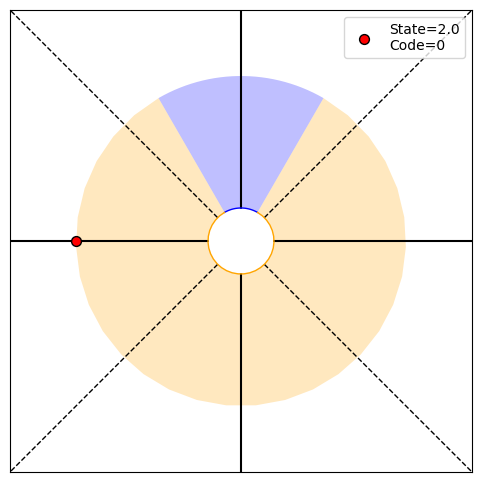

P(O1:25,S25|T)=[0.   0.   0.25 0.  ], P(O1:25|actions,T)=0.25, P(T|O1:25)=[9.99999881e-01 1.19209275e-07], H25=0.00
PRINT 1: 2.9137959734301916e-06, [3.45974132e-88 0.00000000e+00 2.50000000e-01 1.44656239e-22]
PRINT 2: [1.39729335e-06 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


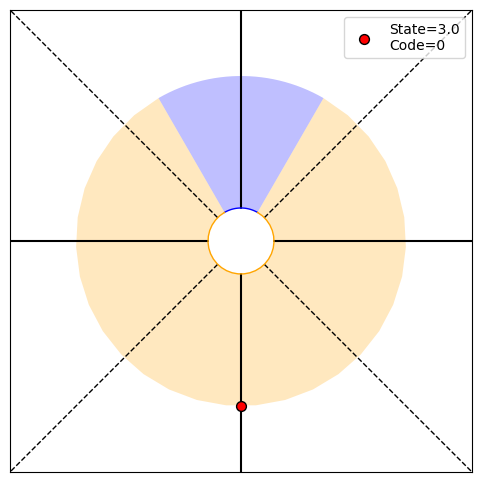

P(O1:26,S26|T)=[0.   0.   0.   0.25], P(O1:26|actions,T)=0.25, P(T|O1:26)=[9.99999940e-01 5.96046412e-08], H26=0.00
PRINT 1: 1.516502712212915e-06, [1.92874985e-022 0.00000000e+000 2.66919022e-109 2.50000000e-001]
PRINT 2: [7.28449036e-07 7.28449036e-07], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


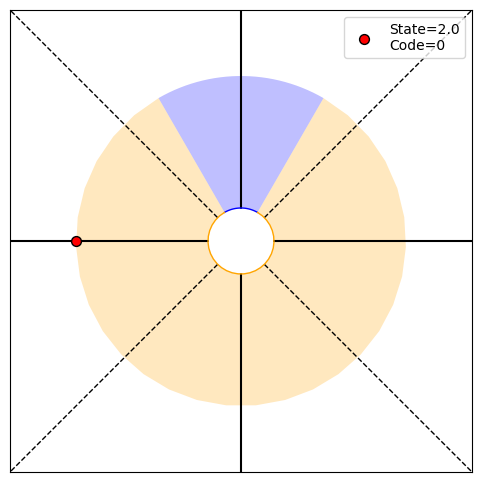

P(O1:27,S27|T)=[0.   0.   0.25 0.  ], P(O1:27|actions,T)=0.25, P(T|O1:27)=[9.99999970e-01 2.98023215e-08], H27=0.00
PRINT 1: 7.880536995629398e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 1.92874985e-22]
PRINT 2: [3.79125689e-07 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


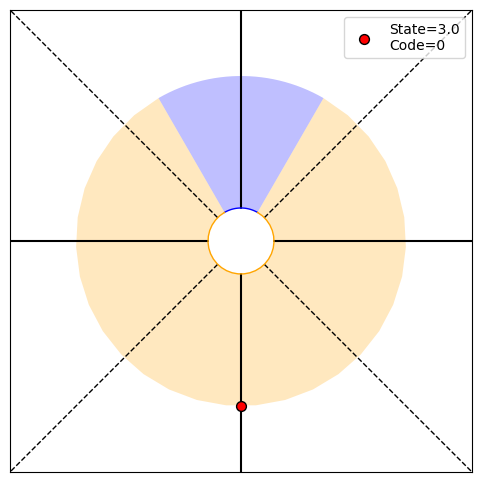

P(O1:28,S28|T)=[0.   0.   0.   0.25], P(O1:28|actions,T)=0.25, P(T|O1:28)=[9.99999985e-01 1.49011610e-08], H28=0.00
PRINT 1: 4.0892801646455924e-07, [2.41093731e-022 0.00000000e+000 3.33648777e-109 2.50000000e-001]
PRINT 2: [1.97013428e-07 1.97013428e-07], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


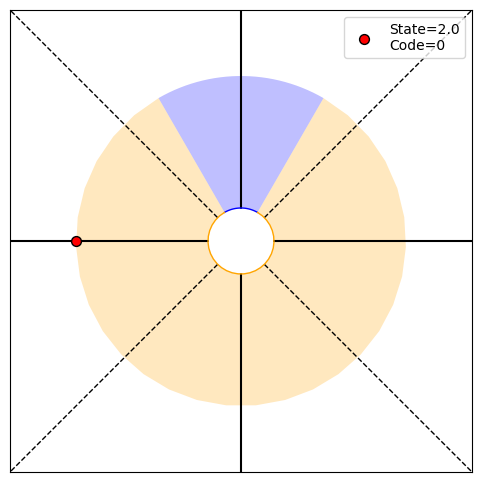

P(O1:29,S29|T)=[0.   0.   0.25 0.  ], P(O1:29|actions,T)=0.25, P(T|O1:29)=[9.99999993e-01 7.45058054e-09], H29=0.00
PRINT 1: 2.1191459017693936e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.41093731e-22]
PRINT 2: [1.02232005e-07 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


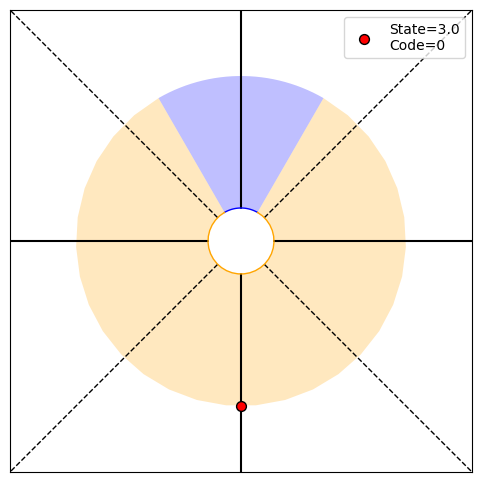

P(O1:30,S30|T)=[0.   0.   0.   0.25], P(O1:30|actions,T)=0.25, P(T|O1:30)=[9.99999996e-01 3.72529028e-09], H30=0.00
PRINT 1: 1.09682585817829e-07, [2.89312477e-022 0.00000000e+000 4.00378532e-109 2.50000000e-001]
PRINT 2: [5.29786478e-08 5.29786478e-08], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


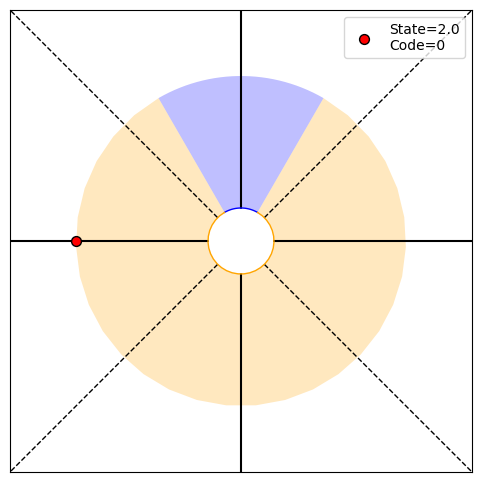

P(O1:31,S31|T)=[0.   0.   0.25 0.  ], P(O1:31|actions,T)=0.25, P(T|O1:31)=[9.99999998e-01 1.86264515e-09], H31=0.00
PRINT 1: 5.6703938149317856e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.89312477e-22]
PRINT 2: [2.74206465e-08 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


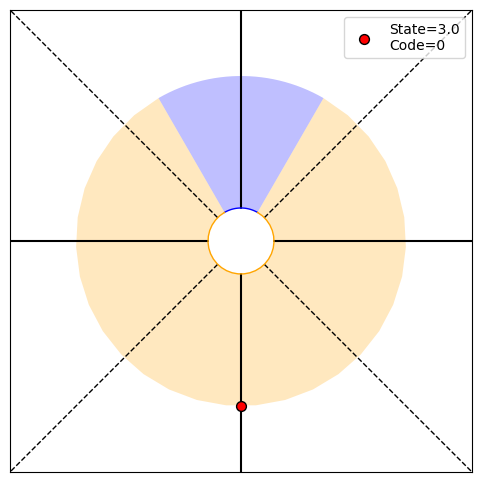

P(O1:32,S32|T)=[0.   0.   0.   0.25], P(O1:32|actions,T)=0.25, P(T|O1:32)=[9.99999999e-01 9.31322574e-10], H32=0.00
PRINT 1: 2.9283291672934866e-08, [3.37531223e-022 0.00000000e+000 4.67108288e-109 2.50000000e-001]
PRINT 2: [1.41759846e-08 1.41759846e-08], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


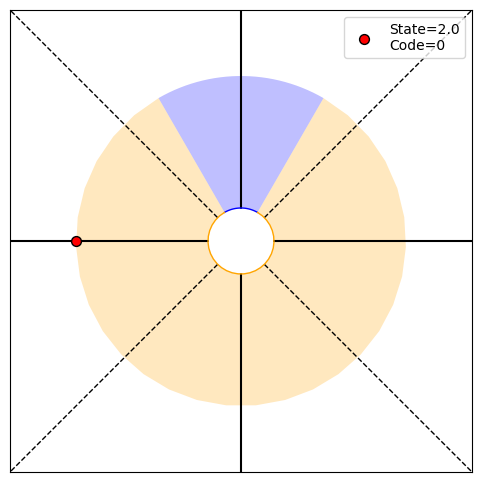

P(O1:33,S33|T)=[0.   0.   0.25 0.  ], P(O1:33|actions,T)=0.25, P(T|O1:33)=[1.00000000e+00 4.65661287e-10], H33=0.00
PRINT 1: 1.5107307129907126e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 3.37531223e-22]
PRINT 2: [7.32082292e-09 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


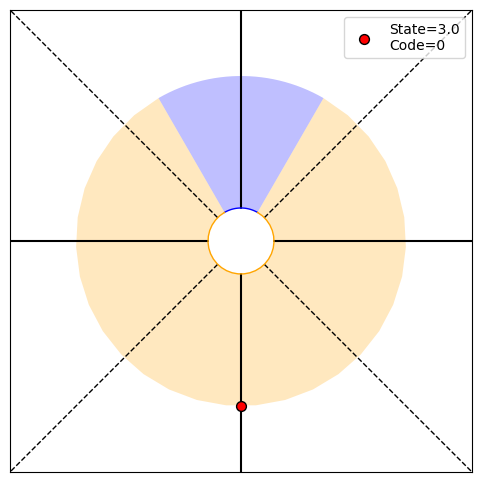

P(O1:34,S34|T)=[0.   0.   0.   0.25], P(O1:34|actions,T)=0.25, P(T|O1:34)=[1.00000000e+00 2.32830644e-10], H34=0.00
PRINT 1: 7.786484210194632e-09, [3.85749970e-022 0.00000000e+000 5.33838043e-109 2.50000000e-001]
PRINT 2: [3.77682678e-09 3.77682678e-09], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


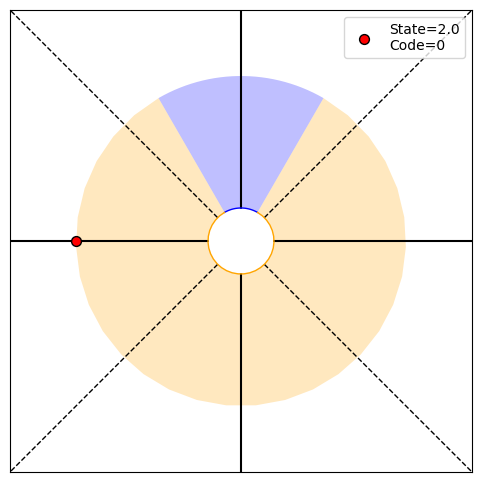

P(O1:35,S35|T)=[0.   0.   0.25 0.  ], P(O1:35|actions,T)=0.25, P(T|O1:35)=[1.00000000e+00 1.16415322e-10], H35=0.00
PRINT 1: 4.009657427334603e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 3.85749970e-22]
PRINT 2: [1.94662105e-09 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


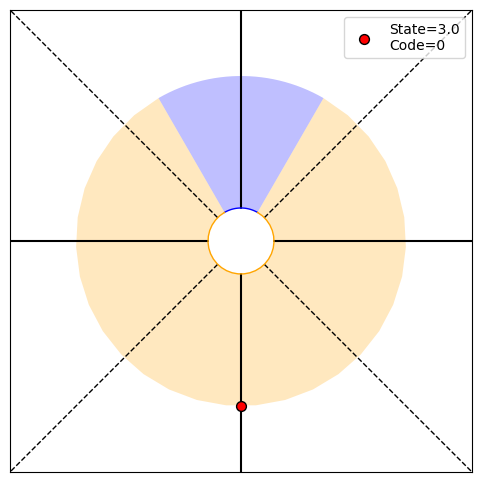

P(O1:36,S36|T)=[0.   0.   0.   0.25], P(O1:36|actions,T)=0.25, P(T|O1:36)=[1.00000000e+00 5.82076609e-11], H36=0.00
PRINT 1: 2.0630363746867455e-09, [4.33968716e-022 0.00000000e+000 6.00567798e-109 2.50000000e-001]
PRINT 2: [1.00241436e-09 1.00241436e-09], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


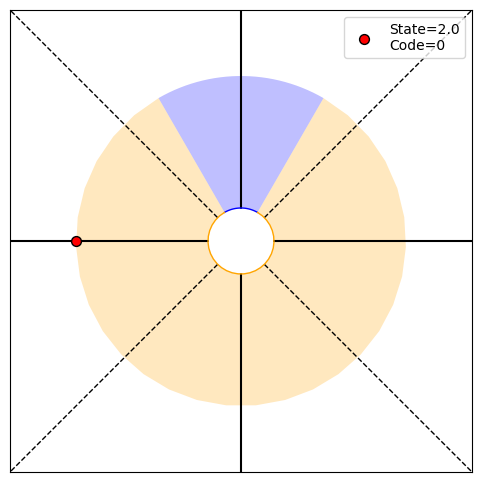

P(O1:37,S37|T)=[0.   0.   0.25 0.  ], P(O1:37|actions,T)=0.25, P(T|O1:37)=[1.00000000e+00 2.91038305e-11], H37=0.00
PRINT 1: 1.0606220178274472e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.33968716e-22]
PRINT 2: [5.15759094e-10 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


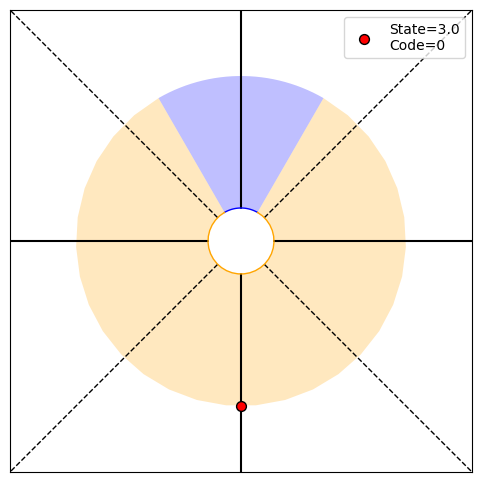

P(O1:38,S38|T)=[0.   0.   0.   0.25], P(O1:38|actions,T)=0.25, P(T|O1:38)=[1.00000000e+00 1.45519152e-11], H38=0.00
PRINT 1: 5.448629241491376e-10, [4.82187462e-022 0.00000000e+000 6.67297554e-109 2.50000000e-001]
PRINT 2: [2.65155504e-10 2.65155504e-10], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


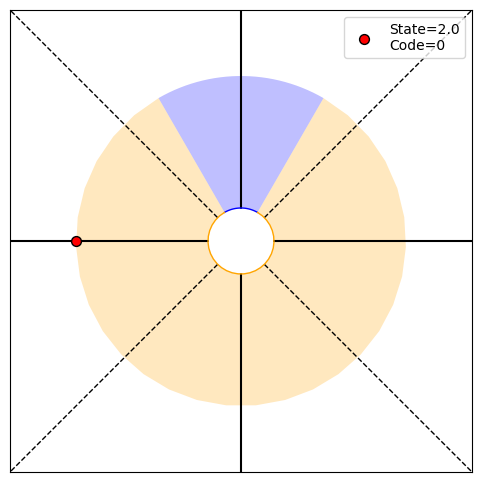

P(O1:39,S39|T)=[0.   0.   0.25 0.  ], P(O1:39|actions,T)=0.25, P(T|O1:39)=[1.00000000e+00 7.27595761e-12], H39=0.00
PRINT 1: 2.7970741969056687e-10, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-22]
PRINT 2: [1.36215731e-10 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


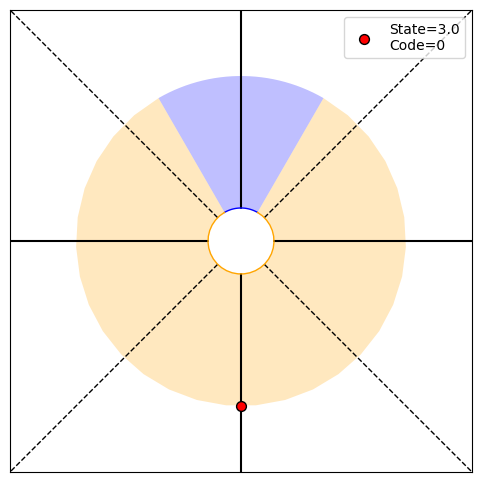

P(O1:40,S40|T)=[0.   0.   0.   0.25], P(O1:40|actions,T)=0.25, P(T|O1:40)=[1.00000000e+00 3.63797881e-12], H40=0.00
PRINT 1: 1.434916886528421e-10, [5.30406208e-022 0.00000000e+000 7.34027309e-109 2.50000000e-001]
PRINT 2: [6.99268549e-11 6.99268549e-11], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


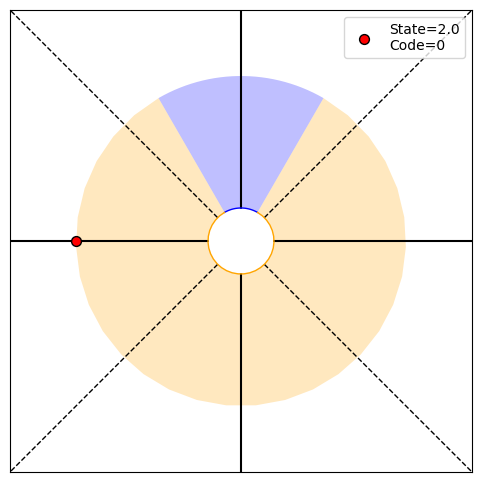

P(O1:41,S41|T)=[0.   0.   0.25 0.  ], P(O1:41|actions,T)=0.25, P(T|O1:41)=[1.0000000e+00 1.8189894e-12], H41=0.00
PRINT 1: 7.356483373008692e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 5.30406208e-22]
PRINT 2: [3.58729221e-11 3.58729222e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


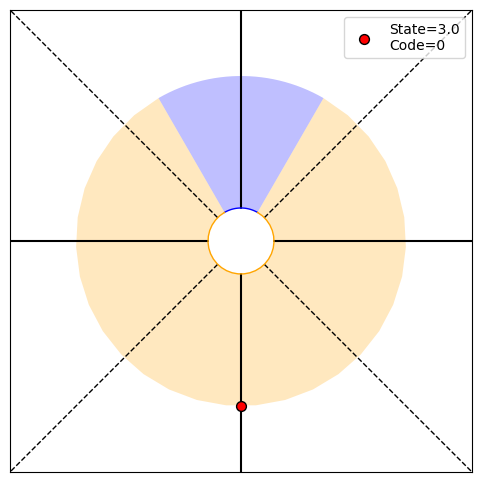

P(O1:42,S42|T)=[0.   0.   0.   0.25], P(O1:42|actions,T)=0.25, P(T|O1:42)=[1.00000000e+00 9.09494702e-13], H42=0.00
PRINT 1: 3.7691911566847234e-11, [5.78624954e-022 0.00000000e+000 8.00757065e-109 2.50000000e-001]
PRINT 2: [1.83912084e-11 1.83912084e-11], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


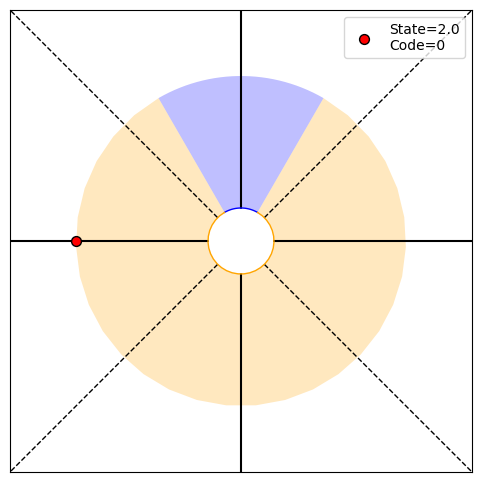

P(O1:43,S43|T)=[0.   0.   0.25 0.  ], P(O1:43|actions,T)=0.25, P(T|O1:43)=[1.00000000e+00 4.54747351e-13], H43=0.00
PRINT 1: 1.9300703134317994e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 5.78624954e-22]
PRINT 2: [9.42297783e-12 9.42297789e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


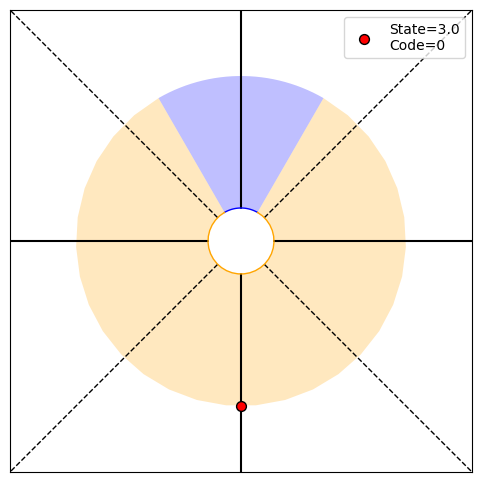

P(O1:44,S44|T)=[0.   0.   0.   0.25], P(O1:44|actions,T)=0.25, P(T|O1:44)=[1.00000000e+00 2.27373675e-13], H44=0.00
PRINT 1: 9.87772524260426e-12, [6.26843701e-022 0.00000000e+000 8.67486820e-109 2.50000000e-001]
PRINT 2: [4.82517578e-12 4.82517572e-12], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


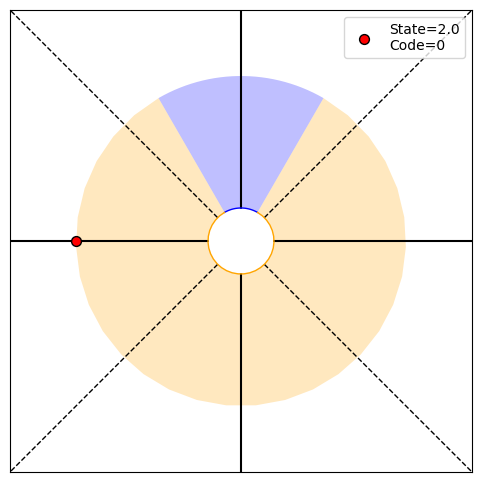

P(O1:45,S45|T)=[0.   0.   0.25 0.  ], P(O1:45|actions,T)=0.25, P(T|O1:45)=[1.00000000e+00 1.13686838e-13], H45=0.00
PRINT 1: 5.052549459024266e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 6.26843701e-22]
PRINT 2: [2.46943125e-12 2.46943131e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


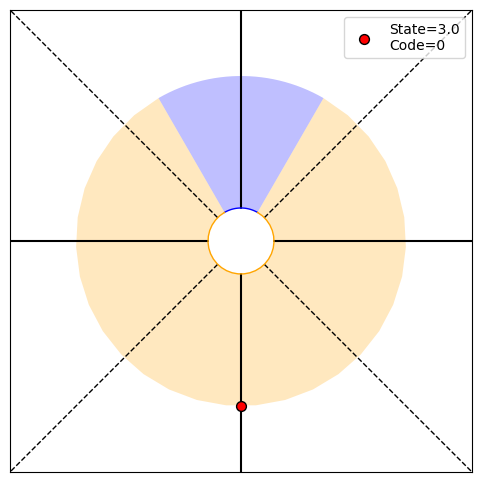

P(O1:46,S46|T)=[0.   0.   0.   0.25], P(O1:46|actions,T)=0.25, P(T|O1:46)=[1.00000000e+00 5.68434189e-14], H46=0.00
PRINT 1: 2.583118148373075e-12, [6.75062447e-022 0.00000000e+000 9.34216575e-109 2.50000000e-001]
PRINT 2: [1.26313736e-12 1.26313730e-12], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


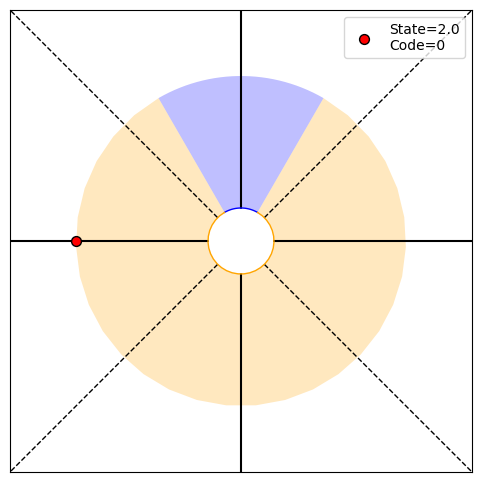

P(O1:47,S47|T)=[0.   0.   0.25 0.  ], P(O1:47|actions,T)=0.25, P(T|O1:47)=[1.00000000e+00 2.84217094e-14], H47=0.00
PRINT 1: 1.3199807836169755e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 6.75062447e-22]
PRINT 2: [6.45779473e-13 6.45779537e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


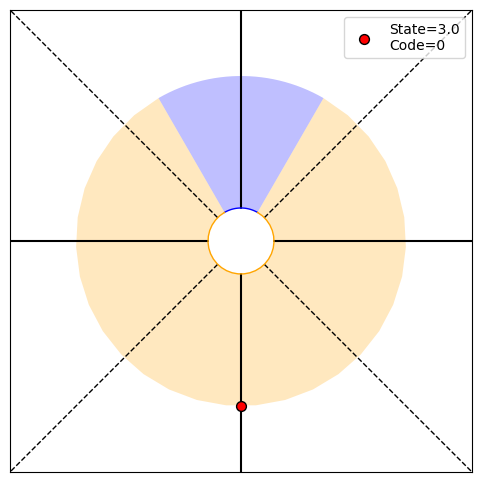

P(O1:48,S48|T)=[0.   0.   0.   0.25], P(O1:48|actions,T)=0.25, P(T|O1:48)=[1.00000000e+00 1.42108547e-14], H48=0.00
PRINT 1: 6.742012465236986e-13, [7.23281193e-022 0.00000000e+000 1.00094633e-108 2.50000000e-001]
PRINT 2: [3.29995196e-13 3.29995130e-13], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: 180.0, Code received: 0.0


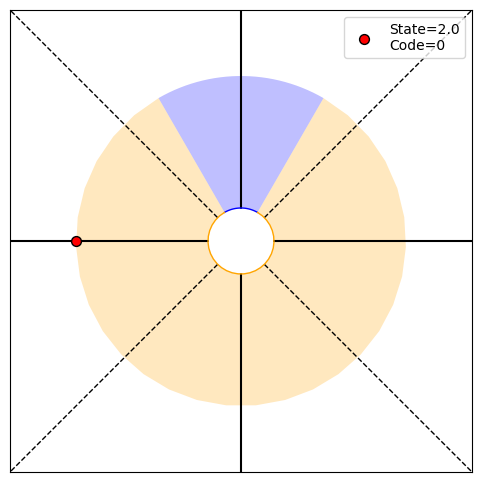

P(O1:49,S49|T)=[0.   0.   0.25 0.  ], P(O1:49|actions,T)=0.25, P(T|O1:49)=[1.00000000e+00 7.10542736e-15], H49=0.00
PRINT 1: 3.4420605061945245e-13, [3.45974132e-88 0.00000000e+00 2.50000000e-01 7.23281193e-22]
PRINT 2: [1.68550249e-13 1.68550312e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


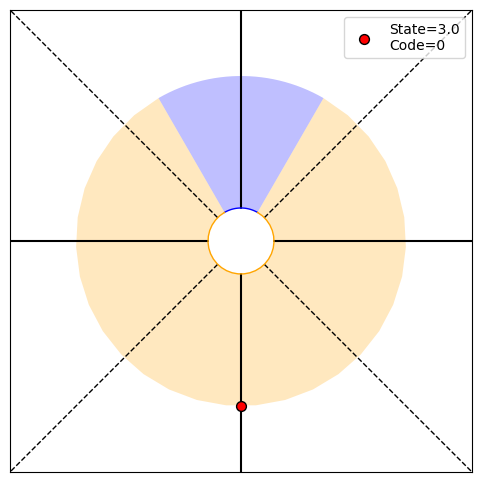

P(O1:50,S50|T)=[0.   0.   0.   0.25], P(O1:50|actions,T)=0.25, P(T|O1:50)=[1.00000000e+00 3.55271368e-15], H50=0.00
PRINT 1: 1.7565573898852733e-13, [7.71499939e-022 0.00000000e+000 1.06767609e-108 2.50000000e-001]
PRINT 2: [8.60515127e-14 8.60514492e-14], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


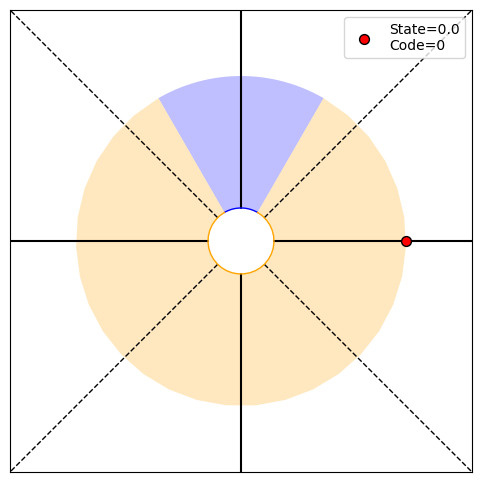

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


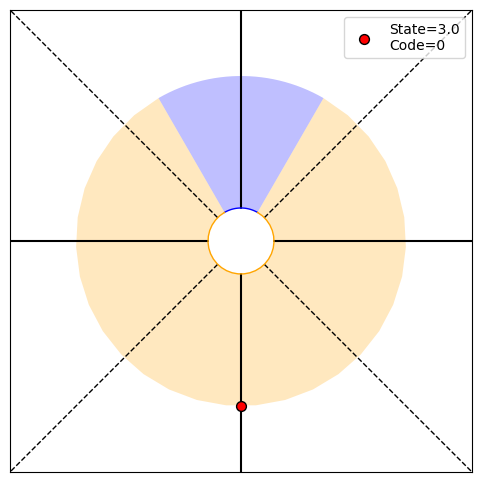

P(O1:2,S2|T)=[0.   0.   0.25 0.25], P(O1:2|actions,T)=0.5, P(T|O1:2)=[0.66666667 0.33333333], H2=0.92
PRINT 1: 0.9182958340544896, [4.82187462e-23 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.31668909], [0.66666667 0.33333333]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


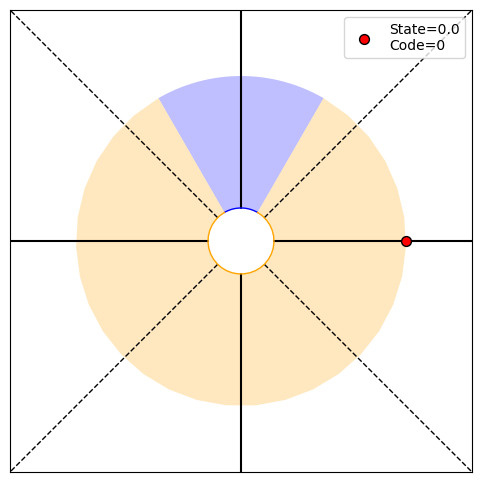

P(O1:3,S3|T)=[0.25 0.   0.   0.25], P(O1:3|actions,T)=0.5, P(T|O1:3)=[0.8 0.2], H3=0.72
PRINT 1: 0.7219280948873623, [2.50000000e-01 0.00000000e+00 9.30018994e-45 2.50000000e-01]
PRINT 2: [0.26899559 0.        ], [0.8 0.2]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


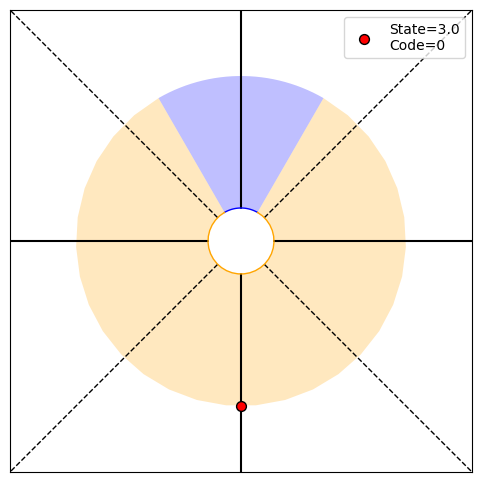

P(O1:4,S4|T)=[0.   0.   0.25 0.25], P(O1:4|actions,T)=0.5, P(T|O1:4)=[0.88888889 0.11111111], H4=0.50
PRINT 1: 0.5032583347756456, [1.79377399e-66 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.19843232], [0.88888889 0.11111111]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


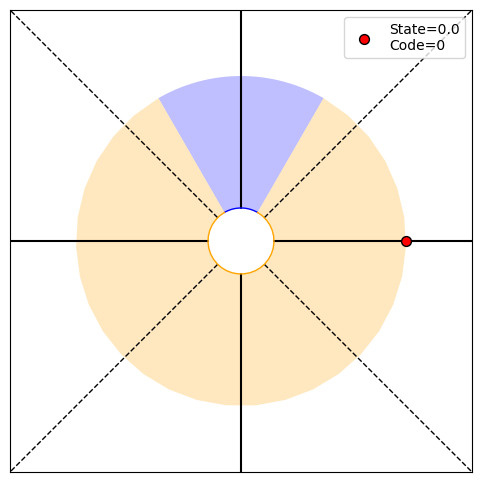

P(O1:5,S5|T)=[0.25 0.   0.   0.25], P(O1:5|actions,T)=0.5, P(T|O1:5)=[0.94117647 0.05882353], H5=0.32
PRINT 1: 0.32275695889739825, [2.50000000e-01 0.00000000e+00 6.91948263e-88 2.50000000e-01]
PRINT 2: [0.13260973 0.        ], [0.94117647 0.05882353]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


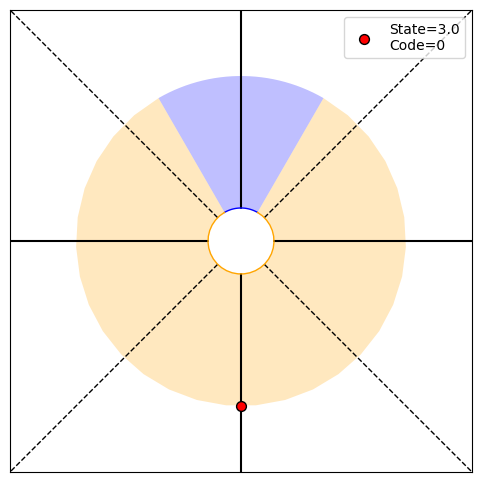

P(O1:6,S6|T)=[0.   0.   0.25 0.25], P(O1:6|actions,T)=0.5, P(T|O1:6)=[0.96969697 0.03030303], H6=0.20
PRINT 1: 0.19590927087360493, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.08297127], [0.96969697 0.03030303]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


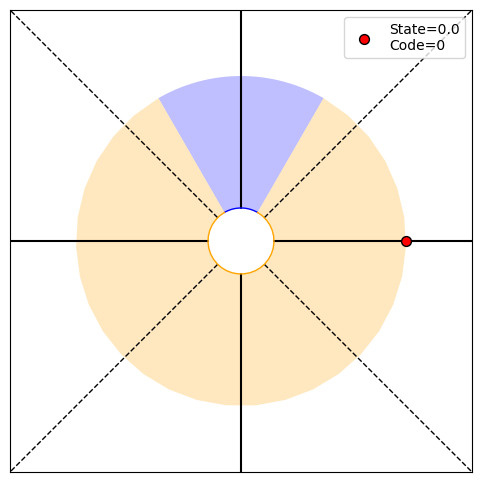

P(O1:7,S7|T)=[0.25 0.   0.   0.25], P(O1:7|actions,T)=0.5, P(T|O1:7)=[0.98461538 0.01538462], H7=0.11
PRINT 1: 0.11467550533614675, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.04968846 0.        ], [0.98461538 0.01538462]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


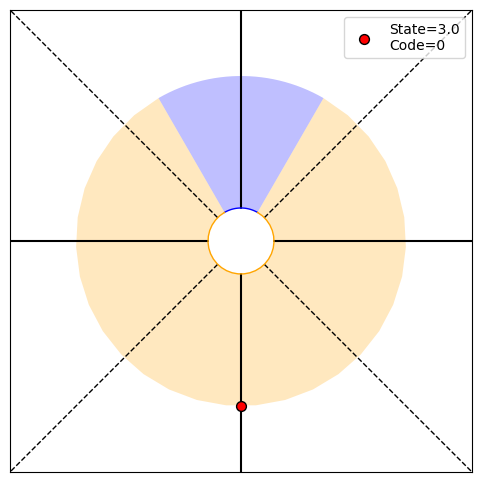

P(O1:8,S8|T)=[0.   0.   0.25 0.25], P(O1:8|actions,T)=0.5, P(T|O1:8)=[0.99224806 0.00775194], H8=0.07
PRINT 1: 0.06549082131472701, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.02888032], [0.99224806 0.00775194]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


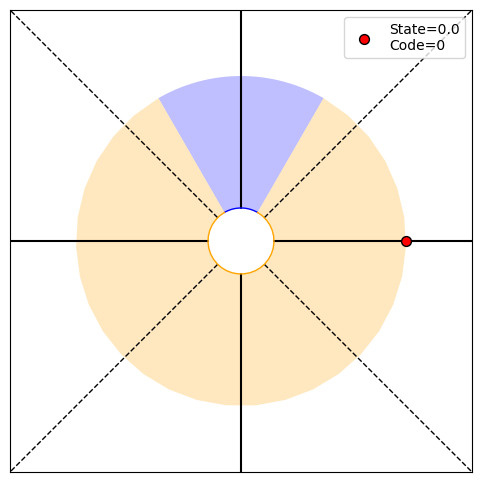

P(O1:9,S9|T)=[0.25 0.   0.   0.25], P(O1:9|actions,T)=0.5, P(T|O1:9)=[0.99610895 0.00389105], H9=0.04
PRINT 1: 0.03675295386313879, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.01643369 0.        ], [0.99610895 0.00389105]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


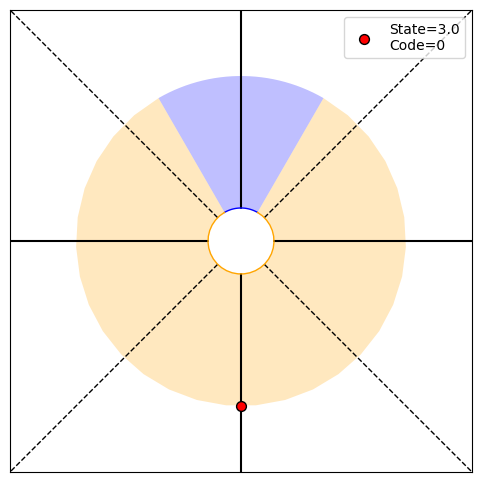

P(O1:10,S10|T)=[0.   0.   0.25 0.25], P(O1:10|actions,T)=0.5, P(T|O1:10)=[0.99805068 0.00194932], H10=0.02
PRINT 1: 0.020358875256176766, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00920546], [0.99805068 0.00194932]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


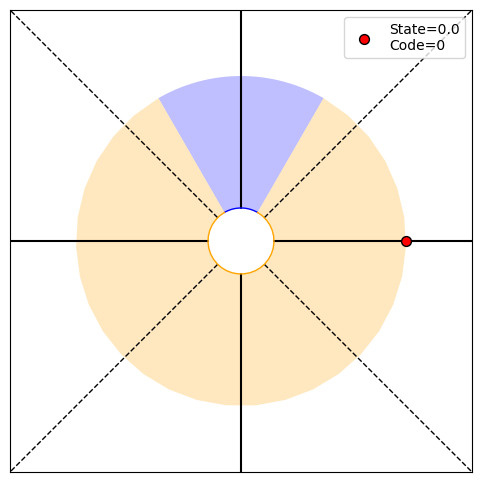

P(O1:11,S11|T)=[0.25 0.   0.   0.25], P(O1:11|actions,T)=0.5, P(T|O1:11)=[9.99024390e-01 9.75609756e-04], H11=0.01
PRINT 1: 0.011164291953784001, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00509451 0.        ], [9.99024390e-01 9.75609756e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


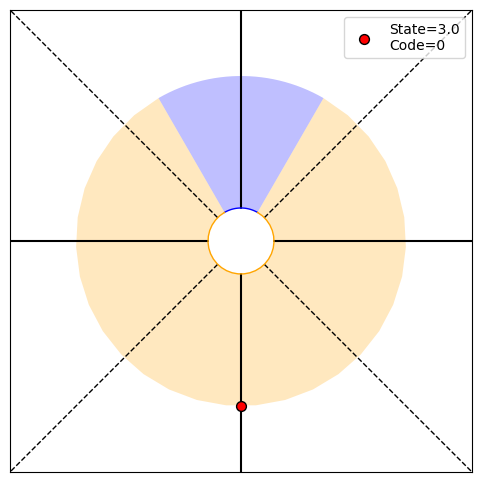

P(O1:12,S12|T)=[0.   0.   0.25 0.25], P(O1:12|actions,T)=0.5, P(T|O1:12)=[9.99511957e-01 4.88042948e-04], H12=0.01
PRINT 1: 0.006072741436820054, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


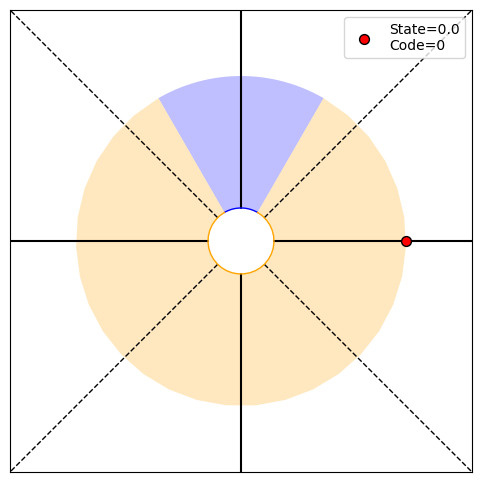

P(O1:13,S13|T)=[0.25 0.   0.   0.25], P(O1:13|actions,T)=0.5, P(T|O1:13)=[9.99755919e-01 2.44081035e-04], H13=0.00
PRINT 1: 0.0032811498991440822, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00151855 0.        ], [9.99755919e-01 2.44081035e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


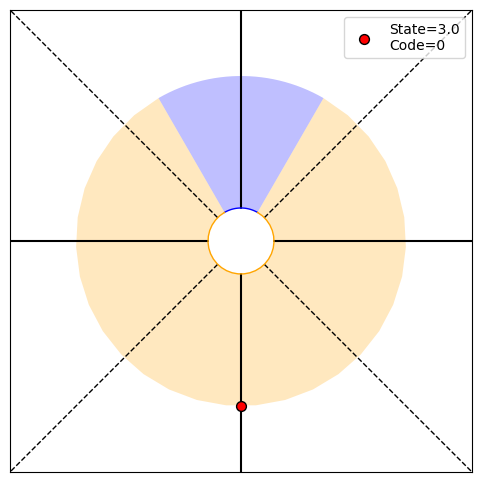

P(O1:14,S14|T)=[0.   0.   0.25 0.25], P(O1:14|actions,T)=0.5, P(T|O1:14)=[9.99877945e-01 1.22055413e-04], H14=0.00
PRINT 1: 0.001762819857490962, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


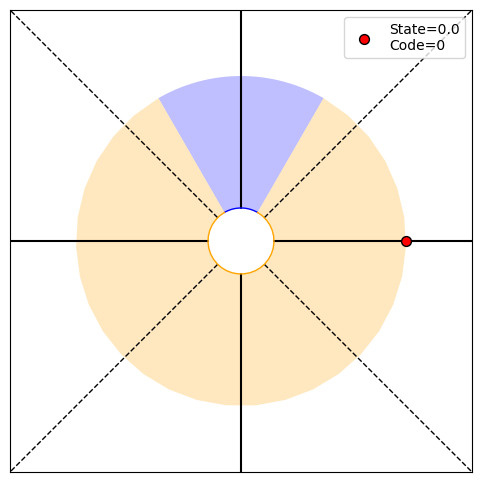

P(O1:15,S15|T)=[0.25 0.   0.   0.25], P(O1:15|actions,T)=0.5, P(T|O1:15)=[9.99938969e-01 6.10314312e-05], H15=0.00
PRINT 1: 0.0009424924667410557, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00044073 0.        ], [9.99938969e-01 6.10314312e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


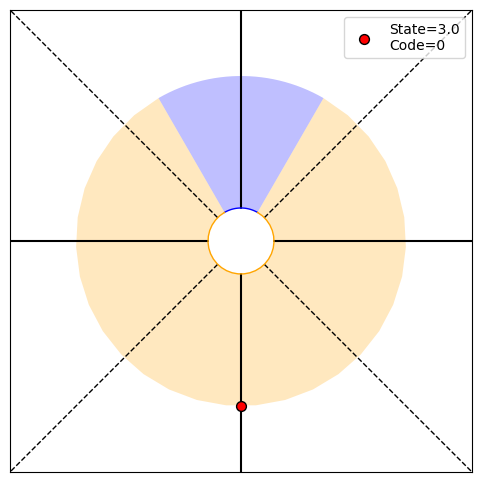

P(O1:16,S16|T)=[0.   0.   0.25 0.25], P(O1:16|actions,T)=0.5, P(T|O1:16)=[9.99969483e-01 3.05166468e-05], H16=0.00
PRINT 1: 0.0005017765892900114, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


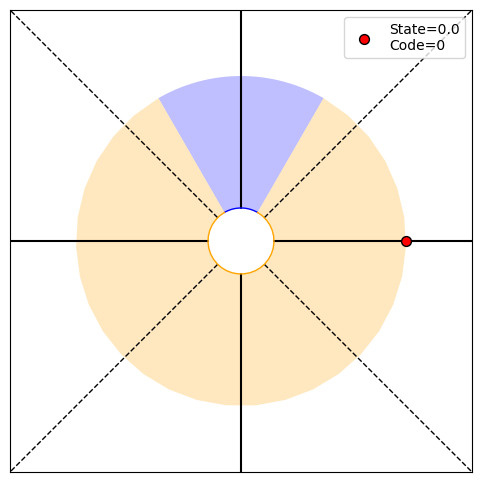

P(O1:17,S17|T)=[0.25 0.   0.   0.25], P(O1:17|actions,T)=0.5, P(T|O1:17)=[9.99984741e-01 1.52585562e-05], H17=0.00
PRINT 1: 0.0002661505111268847, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00012545 0.        ], [9.99984741e-01 1.52585562e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


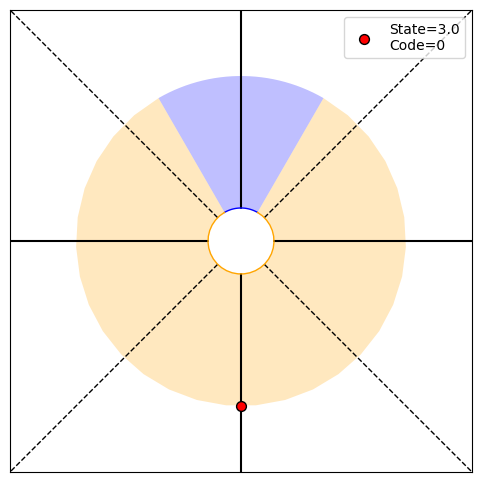

P(O1:18,S18|T)=[0.   0.   0.25 0.25], P(O1:18|actions,T)=0.5, P(T|O1:18)=[9.99992371e-01 7.62933632e-06], H18=0.00
PRINT 1: 0.0001407055651760454, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


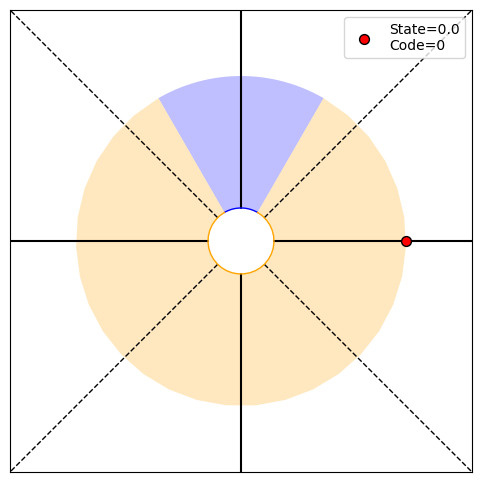

P(O1:19,S19|T)=[0.25 0.   0.   0.25], P(O1:19|actions,T)=0.5, P(T|O1:19)=[9.99996185e-01 3.81468271e-06], H19=0.00
PRINT 1: 7.416772317850379e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.51765229e-05 0.00000000e+00], [9.99996185e-01 3.81468271e-06]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


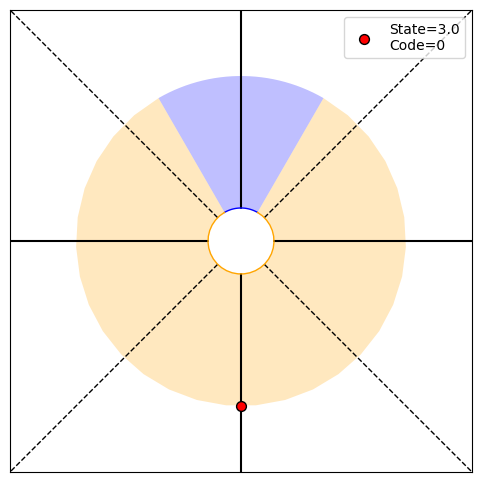

P(O1:20,S20|T)=[0.   0.   0.25 0.25], P(O1:20|actions,T)=0.5, P(T|O1:20)=[9.99998093e-01 1.90734499e-06], H20=0.00
PRINT 1: 3.899127469152328e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


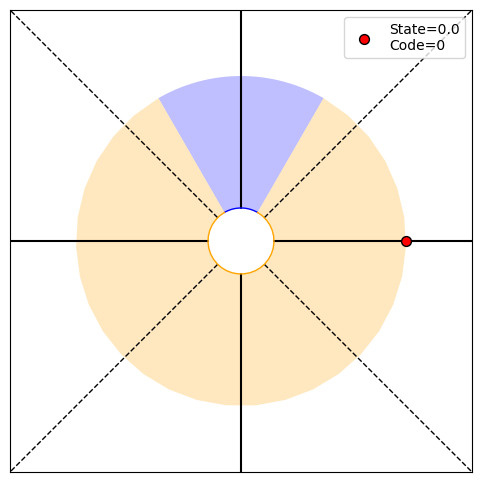

P(O1:21,S21|T)=[0.25 0.   0.   0.25], P(O1:21|actions,T)=0.5, P(T|O1:21)=[9.99999046e-01 9.53673407e-07], H21=0.00
PRINT 1: 2.04493286890882e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [9.74782781e-06 0.00000000e+00], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


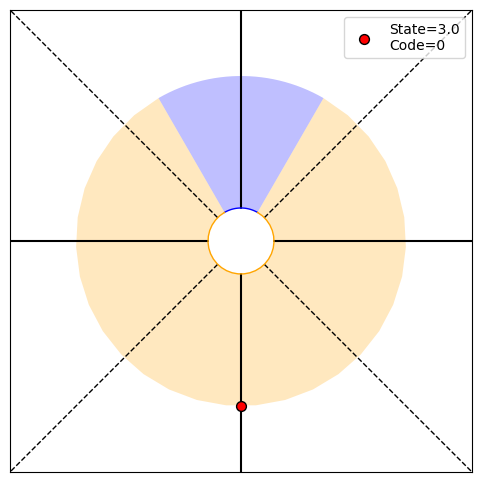

P(O1:22,S22|T)=[0.   0.   0.25 0.25], P(O1:22|actions,T)=0.5, P(T|O1:22)=[9.99999523e-01 4.76836931e-07], H22=0.00
PRINT 1: 1.070150598685641e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


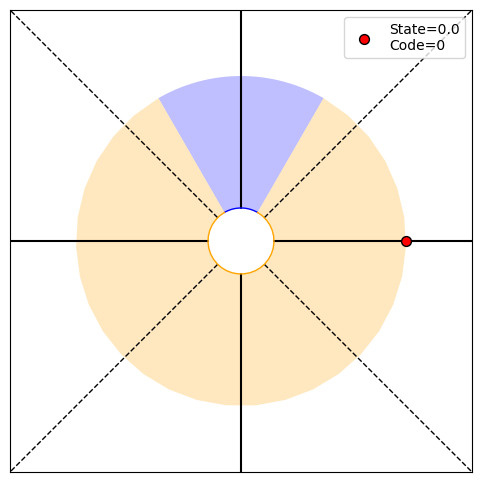

P(O1:23,S23|T)=[0.25 0.   0.   0.25], P(O1:23|actions,T)=0.5, P(T|O1:23)=[9.99999762e-01 2.38418522e-07], H23=0.00
PRINT 1: 5.589172750401204e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.67537712e-06 0.00000000e+00], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


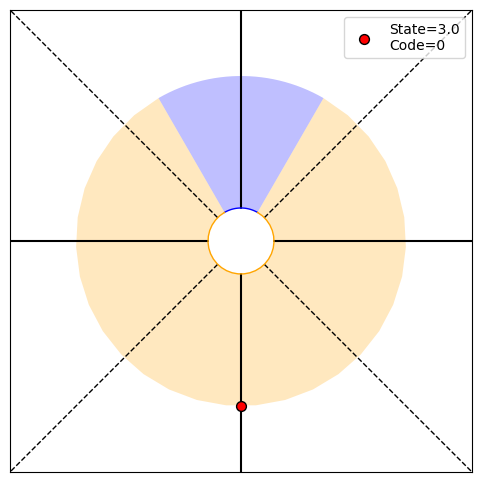

P(O1:24,S24|T)=[0.   0.   0.25 0.25], P(O1:24|actions,T)=0.5, P(T|O1:24)=[9.99999881e-01 1.19209275e-07], H24=0.00
PRINT 1: 2.913795973430192e-06, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


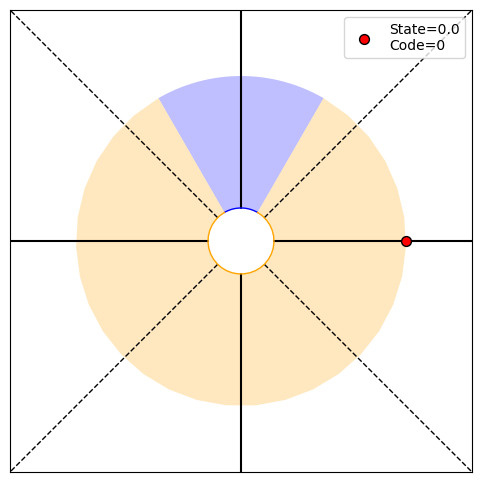

P(O1:25,S25|T)=[0.25 0.   0.   0.25], P(O1:25|actions,T)=0.5, P(T|O1:25)=[9.99999940e-01 5.96046412e-08], H25=0.00
PRINT 1: 1.516502712212915e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [7.28449036e-07 0.00000000e+00], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


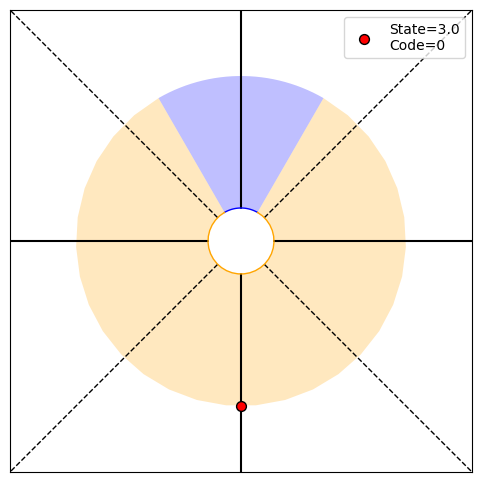

P(O1:26,S26|T)=[0.   0.   0.25 0.25], P(O1:26|actions,T)=0.5, P(T|O1:26)=[9.99999970e-01 2.98023215e-08], H26=0.00
PRINT 1: 7.880536995629399e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


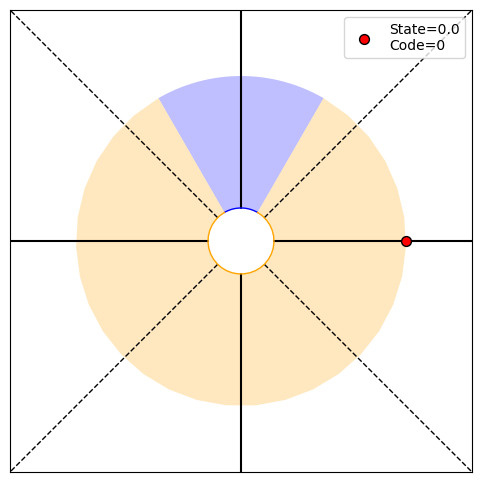

P(O1:27,S27|T)=[0.25 0.   0.   0.25], P(O1:27|actions,T)=0.5, P(T|O1:27)=[9.99999985e-01 1.49011610e-08], H27=0.00
PRINT 1: 4.089280164645592e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.97013428e-07 0.00000000e+00], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


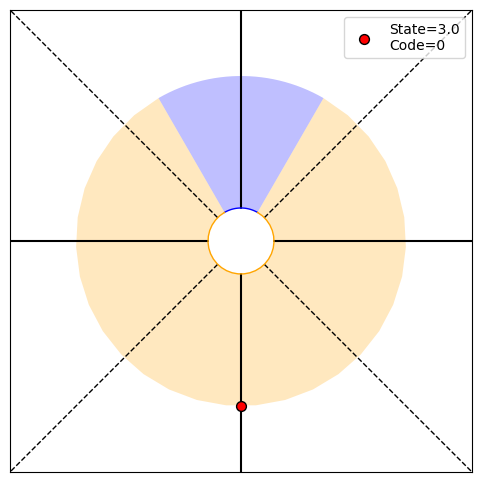

P(O1:28,S28|T)=[0.   0.   0.25 0.25], P(O1:28|actions,T)=0.5, P(T|O1:28)=[9.99999993e-01 7.45058054e-09], H28=0.00
PRINT 1: 2.1191459017693938e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


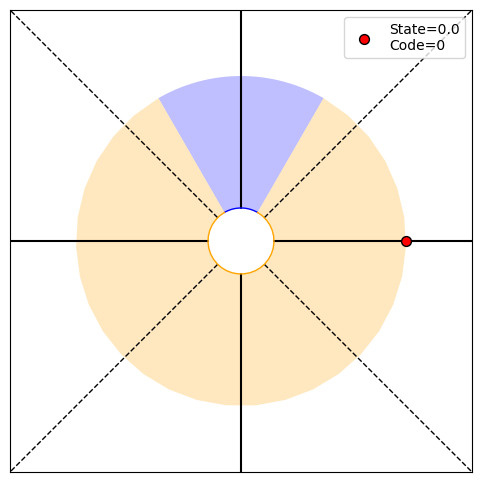

P(O1:29,S29|T)=[0.25 0.   0.   0.25], P(O1:29|actions,T)=0.5, P(T|O1:29)=[9.99999996e-01 3.72529028e-09], H29=0.00
PRINT 1: 1.0968258581782902e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [5.29786478e-08 0.00000000e+00], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


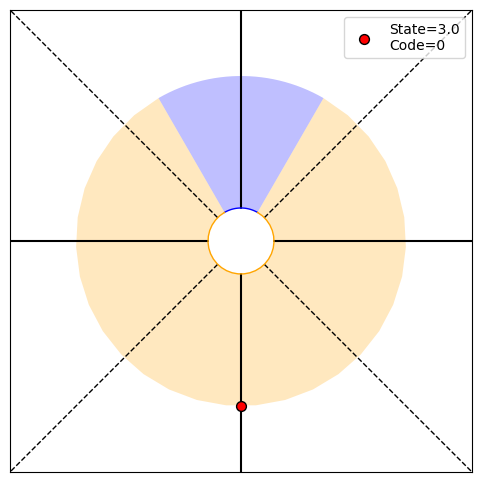

P(O1:30,S30|T)=[0.   0.   0.25 0.25], P(O1:30|actions,T)=0.5, P(T|O1:30)=[9.99999998e-01 1.86264515e-09], H30=0.00
PRINT 1: 5.670393814931786e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


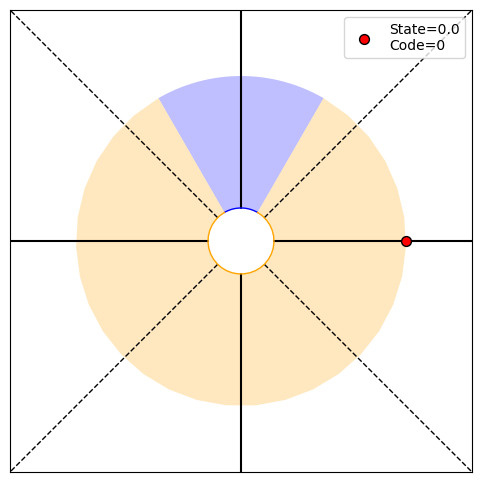

P(O1:31,S31|T)=[0.25 0.   0.   0.25], P(O1:31|actions,T)=0.5, P(T|O1:31)=[9.99999999e-01 9.31322574e-10], H31=0.00
PRINT 1: 2.928329167293487e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.41759846e-08 0.00000000e+00], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


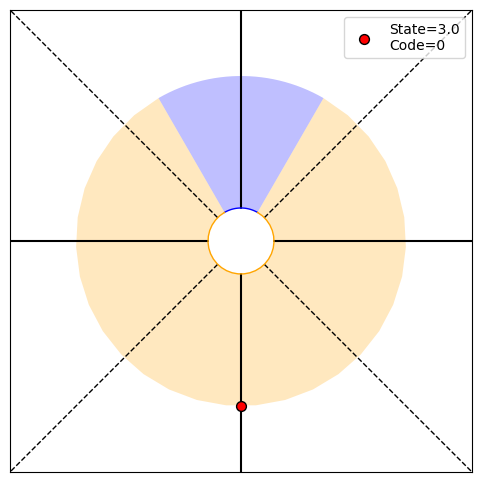

P(O1:32,S32|T)=[0.   0.   0.25 0.25], P(O1:32|actions,T)=0.5, P(T|O1:32)=[1.00000000e+00 4.65661287e-10], H32=0.00
PRINT 1: 1.510730712990713e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


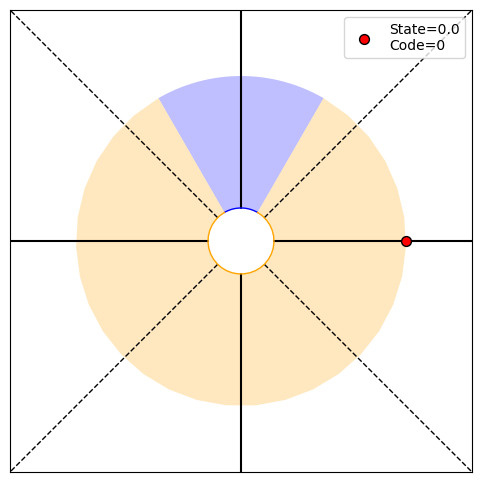

P(O1:33,S33|T)=[0.25 0.   0.   0.25], P(O1:33|actions,T)=0.5, P(T|O1:33)=[1.00000000e+00 2.32830644e-10], H33=0.00
PRINT 1: 7.786484210194632e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.77682678e-09 0.00000000e+00], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


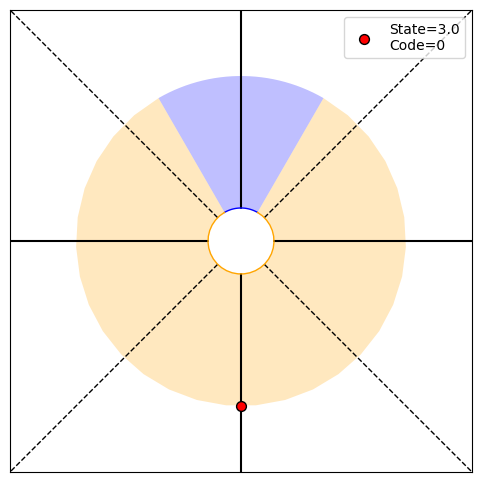

P(O1:34,S34|T)=[0.   0.   0.25 0.25], P(O1:34|actions,T)=0.5, P(T|O1:34)=[1.00000000e+00 1.16415322e-10], H34=0.00
PRINT 1: 4.0096574273346035e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


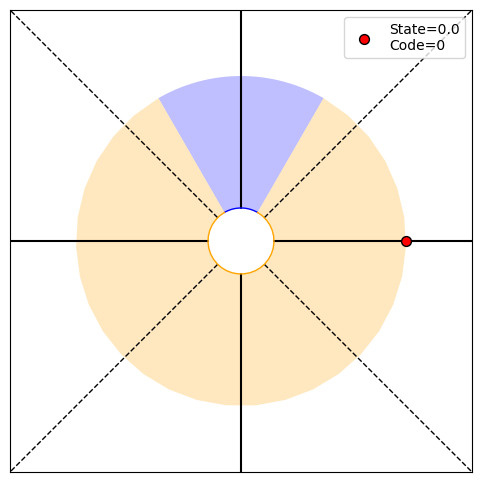

P(O1:35,S35|T)=[0.25 0.   0.   0.25], P(O1:35|actions,T)=0.5, P(T|O1:35)=[1.00000000e+00 5.82076609e-11], H35=0.00
PRINT 1: 2.063036374686746e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.00241436e-09 0.00000000e+00], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


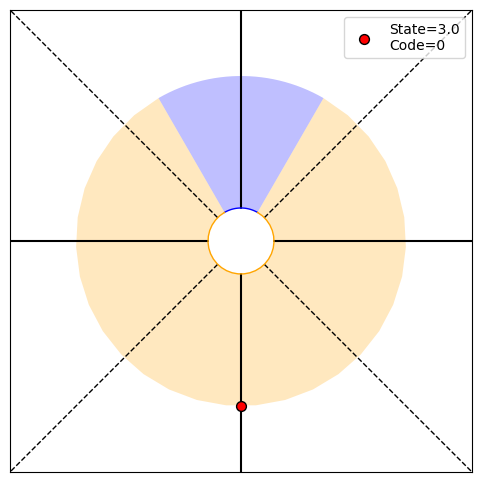

P(O1:36,S36|T)=[0.   0.   0.25 0.25], P(O1:36|actions,T)=0.5, P(T|O1:36)=[1.00000000e+00 2.91038305e-11], H36=0.00
PRINT 1: 1.0606220178274475e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


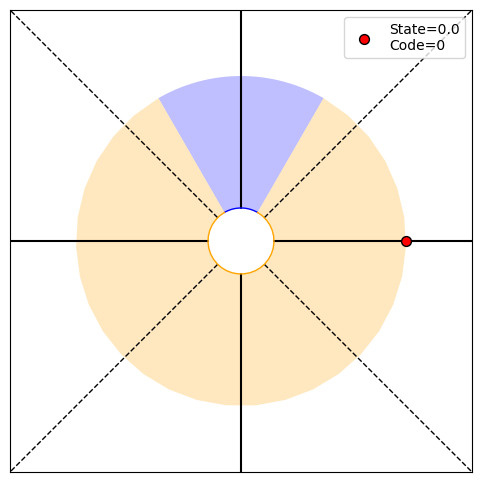

P(O1:37,S37|T)=[0.25 0.   0.   0.25], P(O1:37|actions,T)=0.5, P(T|O1:37)=[1.00000000e+00 1.45519152e-11], H37=0.00
PRINT 1: 5.448629241491377e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.65155504e-10 0.00000000e+00], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


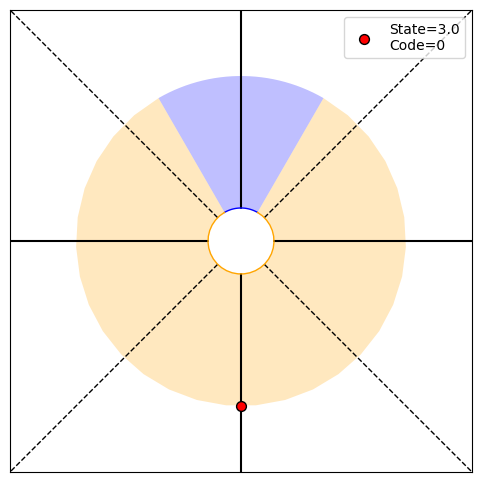

P(O1:38,S38|T)=[0.   0.   0.25 0.25], P(O1:38|actions,T)=0.5, P(T|O1:38)=[1.00000000e+00 7.27595761e-12], H38=0.00
PRINT 1: 2.797074196905669e-10, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


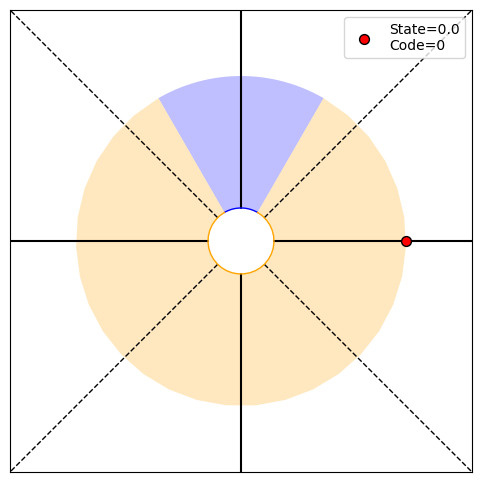

P(O1:39,S39|T)=[0.25 0.   0.   0.25], P(O1:39|actions,T)=0.5, P(T|O1:39)=[1.00000000e+00 3.63797881e-12], H39=0.00
PRINT 1: 1.4349168865284212e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [6.99268549e-11 0.00000000e+00], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


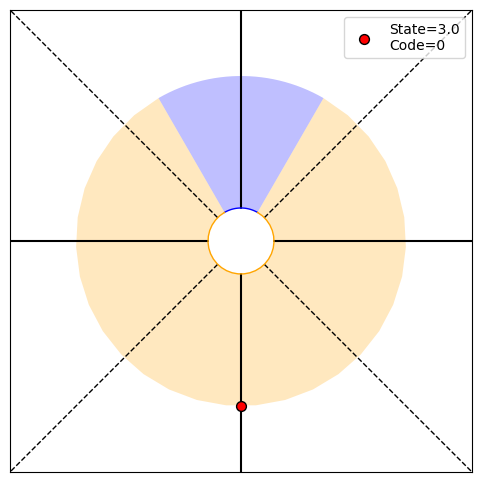

P(O1:40,S40|T)=[0.   0.   0.25 0.25], P(O1:40|actions,T)=0.5, P(T|O1:40)=[1.0000000e+00 1.8189894e-12], H40=0.00
PRINT 1: 7.356483373008693e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.58729222e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


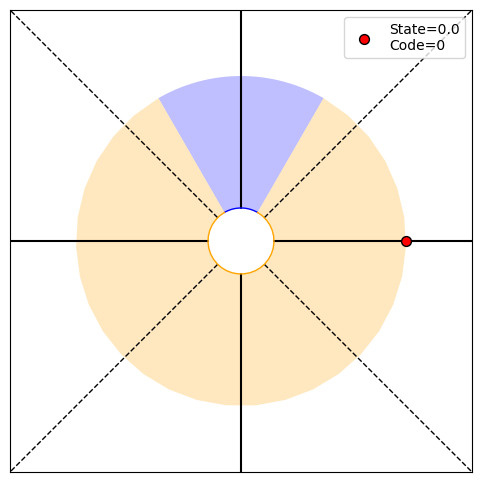

P(O1:41,S41|T)=[0.25 0.   0.   0.25], P(O1:41|actions,T)=0.5, P(T|O1:41)=[1.00000000e+00 9.09494702e-13], H41=0.00
PRINT 1: 3.769191156684724e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.83912084e-11 0.00000000e+00], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


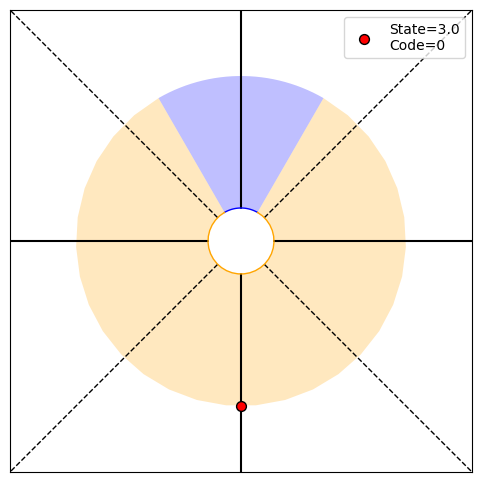

P(O1:42,S42|T)=[0.   0.   0.25 0.25], P(O1:42|actions,T)=0.5, P(T|O1:42)=[1.00000000e+00 4.54747351e-13], H42=0.00
PRINT 1: 1.9300703134317997e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 9.42297789e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


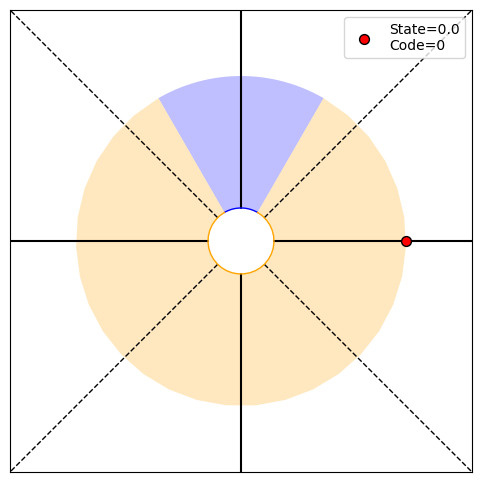

P(O1:43,S43|T)=[0.25 0.   0.   0.25], P(O1:43|actions,T)=0.5, P(T|O1:43)=[1.00000000e+00 2.27373675e-13], H43=0.00
PRINT 1: 9.877725242604262e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [4.82517578e-12 0.00000000e+00], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


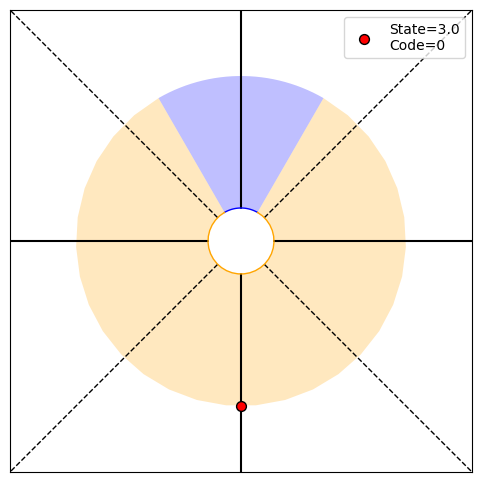

P(O1:44,S44|T)=[0.   0.   0.25 0.25], P(O1:44|actions,T)=0.5, P(T|O1:44)=[1.00000000e+00 1.13686838e-13], H44=0.00
PRINT 1: 5.052549459024267e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.46943131e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


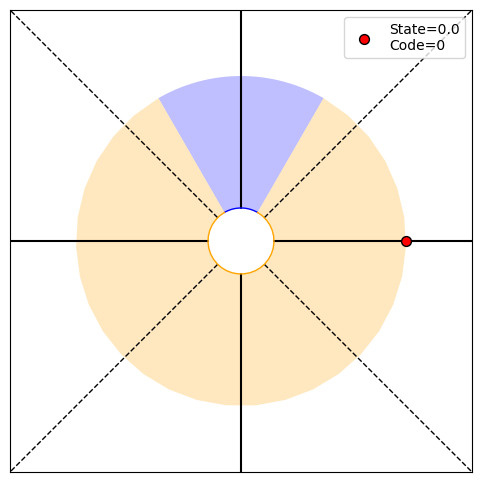

P(O1:45,S45|T)=[0.25 0.   0.   0.25], P(O1:45|actions,T)=0.5, P(T|O1:45)=[1.00000000e+00 5.68434189e-14], H45=0.00
PRINT 1: 2.5831181483730752e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.26313736e-12 0.00000000e+00], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


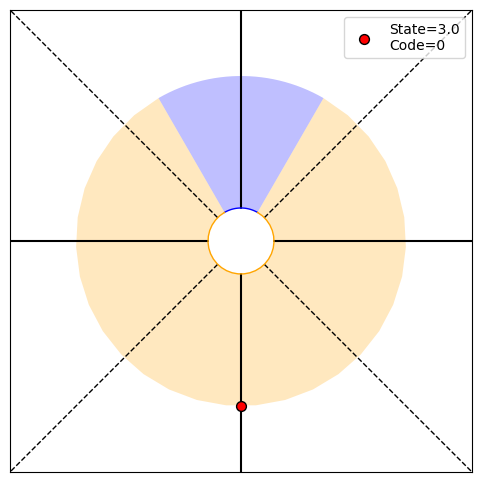

P(O1:46,S46|T)=[0.   0.   0.25 0.25], P(O1:46|actions,T)=0.5, P(T|O1:46)=[1.00000000e+00 2.84217094e-14], H46=0.00
PRINT 1: 1.3199807836169758e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.45779537e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


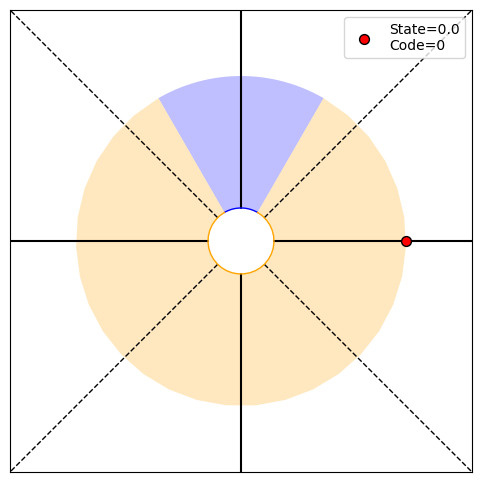

P(O1:47,S47|T)=[0.25 0.   0.   0.25], P(O1:47|actions,T)=0.5, P(T|O1:47)=[1.00000000e+00 1.42108547e-14], H47=0.00
PRINT 1: 6.742012465236986e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.29995196e-13 0.00000000e+00], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


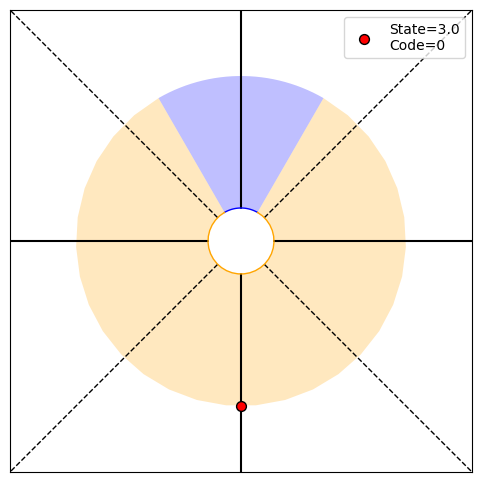

P(O1:48,S48|T)=[0.   0.   0.25 0.25], P(O1:48|actions,T)=0.5, P(T|O1:48)=[1.00000000e+00 7.10542736e-15], H48=0.00
PRINT 1: 3.442060506194525e-13, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.68550312e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


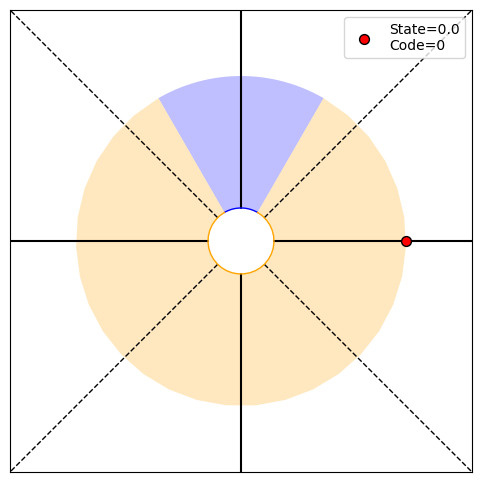

P(O1:49,S49|T)=[0.25 0.   0.   0.25], P(O1:49|actions,T)=0.5, P(T|O1:49)=[1.00000000e+00 3.55271368e-15], H49=0.00
PRINT 1: 1.7565573898852736e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [8.60515127e-14 0.00000000e+00], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


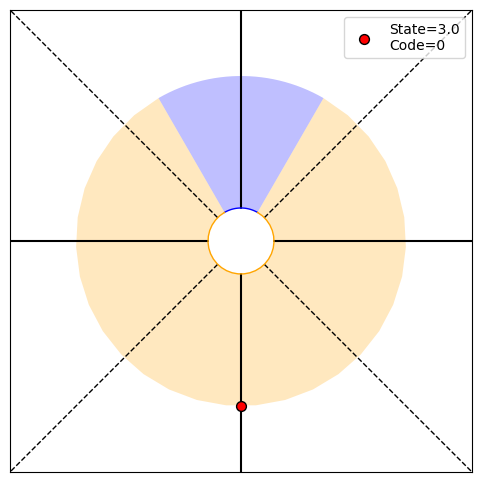

P(O1:50,S50|T)=[0.   0.   0.25 0.25], P(O1:50|actions,T)=0.5, P(T|O1:50)=[1.00000000e+00 1.77635684e-15], H50=0.00
PRINT 1: 8.960422633366407e-14, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 4.39139347e-14], [1.00000000e+00 1.77635684e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


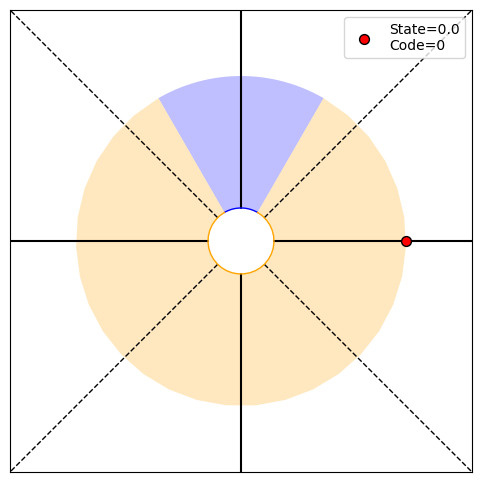

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


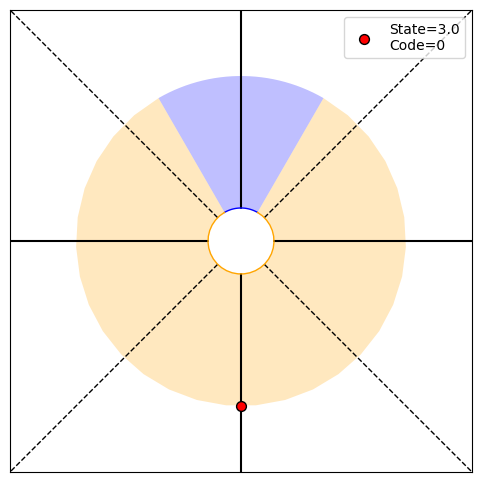

P(O1:2,S2|T)=[0.   0.   0.25 0.25], P(O1:2|actions,T)=0.5, P(T|O1:2)=[0.66666667 0.33333333], H2=0.92
PRINT 1: 0.9182958340544896, [4.82187462e-23 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.31668909], [0.66666667 0.33333333]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


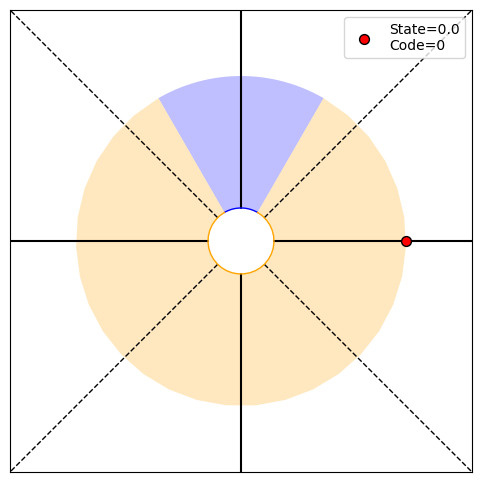

P(O1:3,S3|T)=[0.25 0.   0.   0.25], P(O1:3|actions,T)=0.5, P(T|O1:3)=[0.8 0.2], H3=0.72
PRINT 1: 0.7219280948873623, [2.50000000e-01 0.00000000e+00 9.30018994e-45 2.50000000e-01]
PRINT 2: [0.26899559 0.        ], [0.8 0.2]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


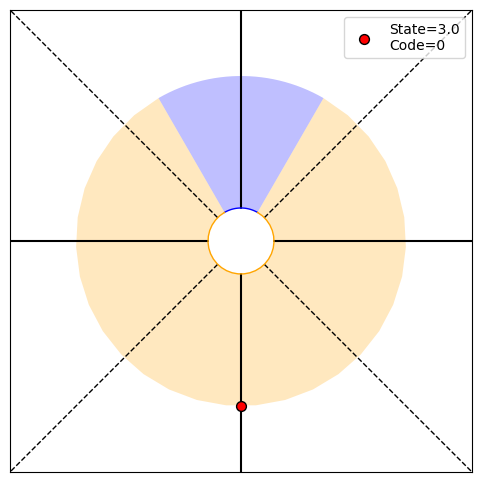

P(O1:4,S4|T)=[0.   0.   0.25 0.25], P(O1:4|actions,T)=0.5, P(T|O1:4)=[0.88888889 0.11111111], H4=0.50
PRINT 1: 0.5032583347756456, [1.79377399e-66 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.19843232], [0.88888889 0.11111111]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


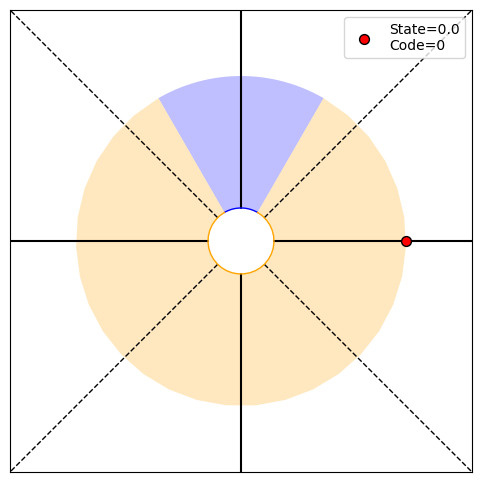

P(O1:5,S5|T)=[0.25 0.   0.   0.25], P(O1:5|actions,T)=0.5, P(T|O1:5)=[0.94117647 0.05882353], H5=0.32
PRINT 1: 0.32275695889739825, [2.50000000e-01 0.00000000e+00 6.91948263e-88 2.50000000e-01]
PRINT 2: [0.13260973 0.        ], [0.94117647 0.05882353]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


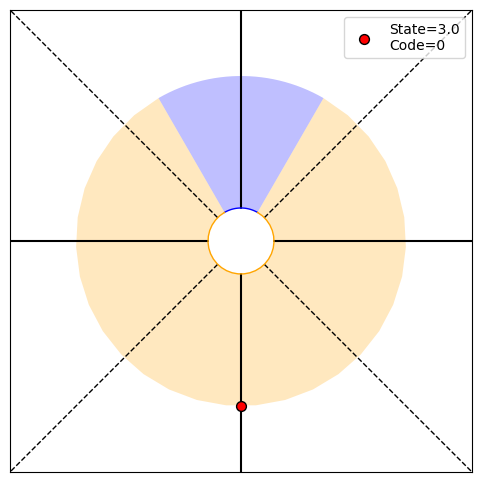

P(O1:6,S6|T)=[0.   0.   0.25 0.25], P(O1:6|actions,T)=0.5, P(T|O1:6)=[0.96969697 0.03030303], H6=0.20
PRINT 1: 0.19590927087360493, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.08297127], [0.96969697 0.03030303]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


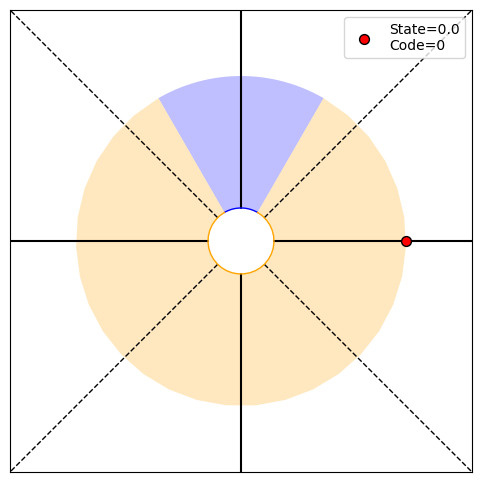

P(O1:7,S7|T)=[0.25 0.   0.   0.25], P(O1:7|actions,T)=0.5, P(T|O1:7)=[0.98461538 0.01538462], H7=0.11
PRINT 1: 0.11467550533614675, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.04968846 0.        ], [0.98461538 0.01538462]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


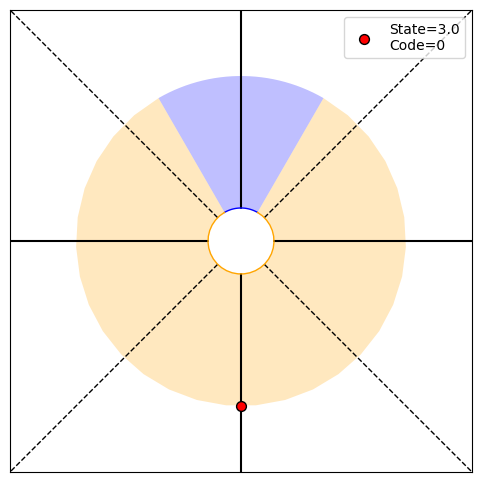

P(O1:8,S8|T)=[0.   0.   0.25 0.25], P(O1:8|actions,T)=0.5, P(T|O1:8)=[0.99224806 0.00775194], H8=0.07
PRINT 1: 0.06549082131472701, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.02888032], [0.99224806 0.00775194]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


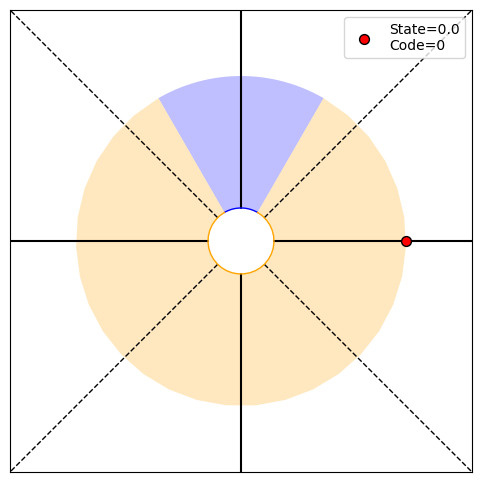

P(O1:9,S9|T)=[0.25 0.   0.   0.25], P(O1:9|actions,T)=0.5, P(T|O1:9)=[0.99610895 0.00389105], H9=0.04
PRINT 1: 0.03675295386313879, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.01643369 0.        ], [0.99610895 0.00389105]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


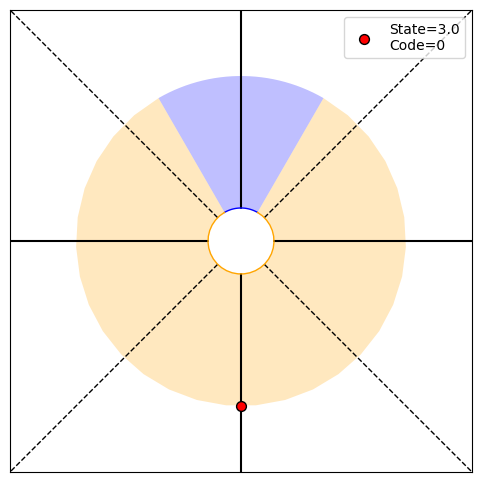

P(O1:10,S10|T)=[0.   0.   0.25 0.25], P(O1:10|actions,T)=0.5, P(T|O1:10)=[0.99805068 0.00194932], H10=0.02
PRINT 1: 0.020358875256176766, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00920546], [0.99805068 0.00194932]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


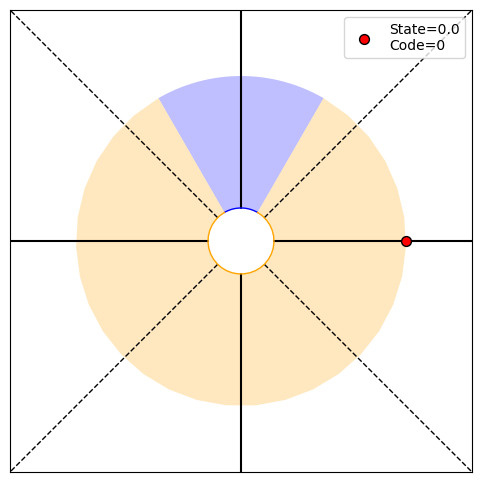

P(O1:11,S11|T)=[0.25 0.   0.   0.25], P(O1:11|actions,T)=0.5, P(T|O1:11)=[9.99024390e-01 9.75609756e-04], H11=0.01
PRINT 1: 0.011164291953784001, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00509451 0.        ], [9.99024390e-01 9.75609756e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


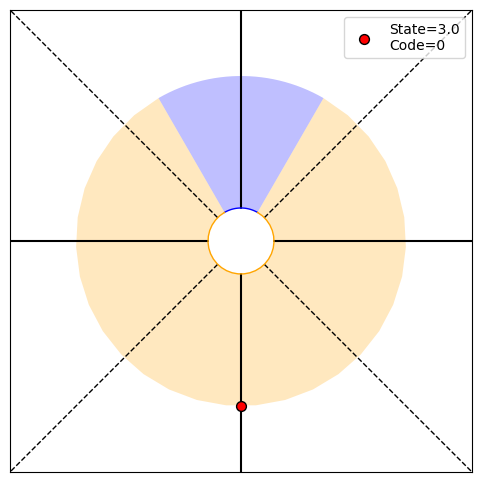

P(O1:12,S12|T)=[0.   0.   0.25 0.25], P(O1:12|actions,T)=0.5, P(T|O1:12)=[9.99511957e-01 4.88042948e-04], H12=0.01
PRINT 1: 0.006072741436820054, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


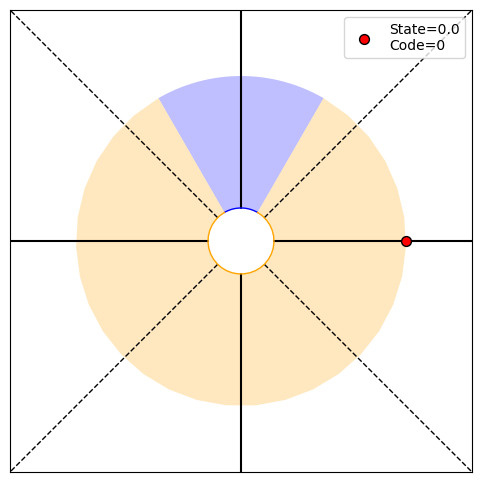

P(O1:13,S13|T)=[0.25 0.   0.   0.25], P(O1:13|actions,T)=0.5, P(T|O1:13)=[9.99755919e-01 2.44081035e-04], H13=0.00
PRINT 1: 0.0032811498991440822, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00151855 0.        ], [9.99755919e-01 2.44081035e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


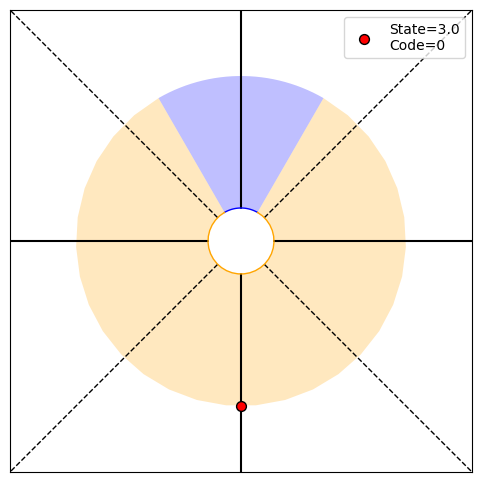

P(O1:14,S14|T)=[0.   0.   0.25 0.25], P(O1:14|actions,T)=0.5, P(T|O1:14)=[9.99877945e-01 1.22055413e-04], H14=0.00
PRINT 1: 0.001762819857490962, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


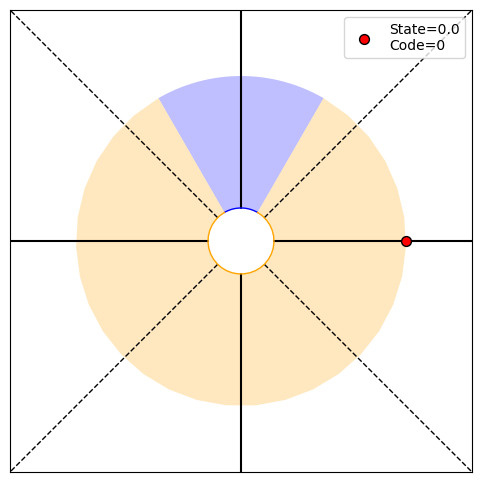

P(O1:15,S15|T)=[0.25 0.   0.   0.25], P(O1:15|actions,T)=0.5, P(T|O1:15)=[9.99938969e-01 6.10314312e-05], H15=0.00
PRINT 1: 0.0009424924667410557, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00044073 0.        ], [9.99938969e-01 6.10314312e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


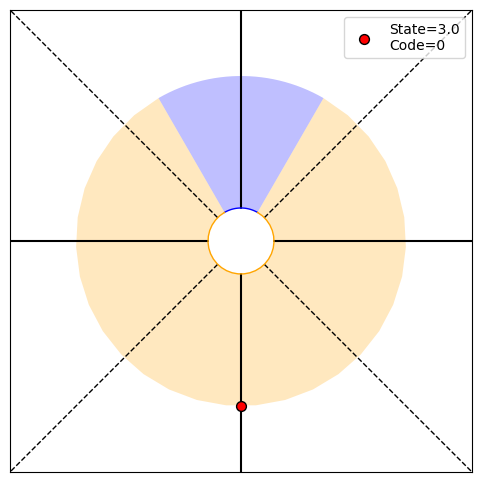

P(O1:16,S16|T)=[0.   0.   0.25 0.25], P(O1:16|actions,T)=0.5, P(T|O1:16)=[9.99969483e-01 3.05166468e-05], H16=0.00
PRINT 1: 0.0005017765892900114, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


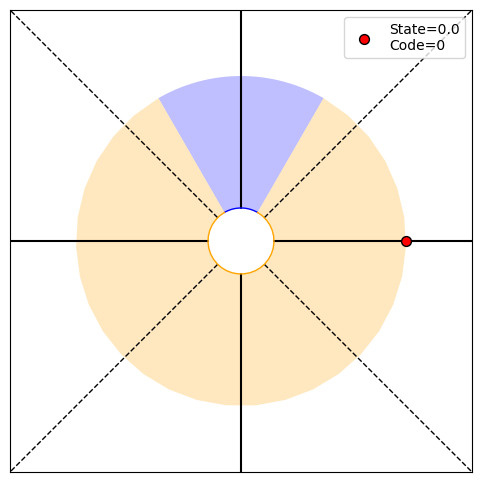

P(O1:17,S17|T)=[0.25 0.   0.   0.25], P(O1:17|actions,T)=0.5, P(T|O1:17)=[9.99984741e-01 1.52585562e-05], H17=0.00
PRINT 1: 0.0002661505111268847, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00012545 0.        ], [9.99984741e-01 1.52585562e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


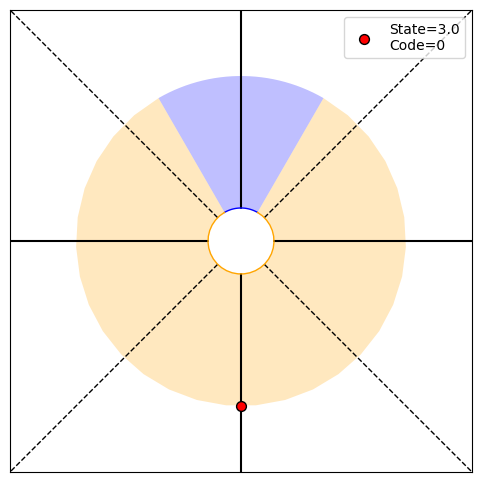

P(O1:18,S18|T)=[0.   0.   0.25 0.25], P(O1:18|actions,T)=0.5, P(T|O1:18)=[9.99992371e-01 7.62933632e-06], H18=0.00
PRINT 1: 0.0001407055651760454, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


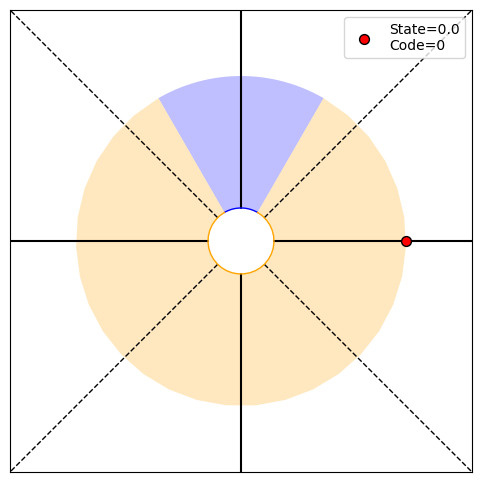

P(O1:19,S19|T)=[0.25 0.   0.   0.25], P(O1:19|actions,T)=0.5, P(T|O1:19)=[9.99996185e-01 3.81468271e-06], H19=0.00
PRINT 1: 7.416772317850379e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.51765229e-05 0.00000000e+00], [9.99996185e-01 3.81468271e-06]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


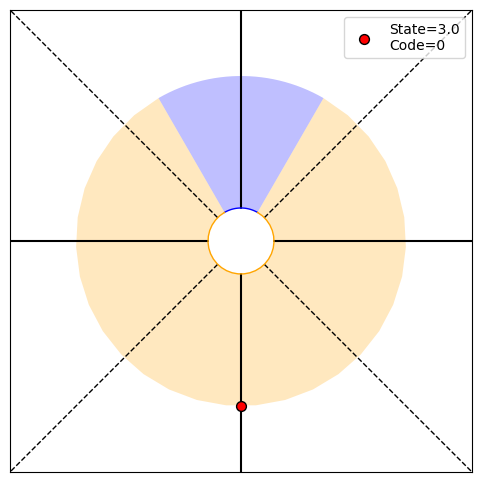

P(O1:20,S20|T)=[0.   0.   0.25 0.25], P(O1:20|actions,T)=0.5, P(T|O1:20)=[9.99998093e-01 1.90734499e-06], H20=0.00
PRINT 1: 3.899127469152328e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


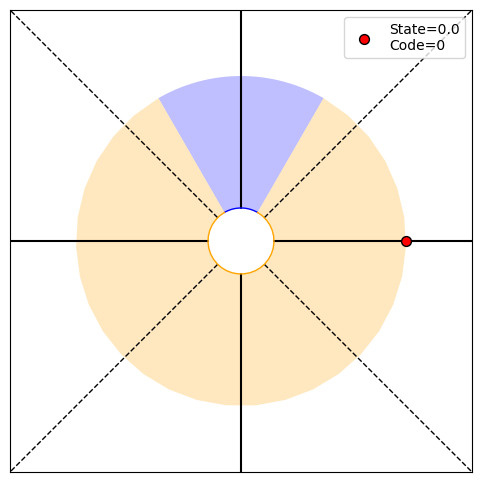

P(O1:21,S21|T)=[0.25 0.   0.   0.25], P(O1:21|actions,T)=0.5, P(T|O1:21)=[9.99999046e-01 9.53673407e-07], H21=0.00
PRINT 1: 2.04493286890882e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [9.74782781e-06 0.00000000e+00], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


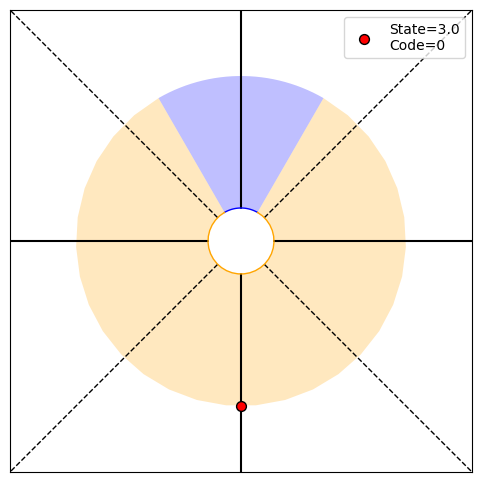

P(O1:22,S22|T)=[0.   0.   0.25 0.25], P(O1:22|actions,T)=0.5, P(T|O1:22)=[9.99999523e-01 4.76836931e-07], H22=0.00
PRINT 1: 1.070150598685641e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


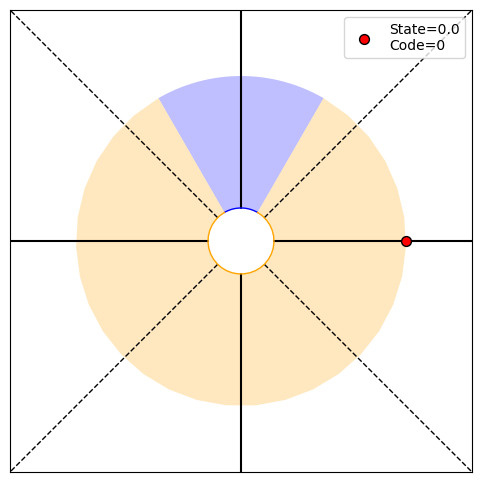

P(O1:23,S23|T)=[0.25 0.   0.   0.25], P(O1:23|actions,T)=0.5, P(T|O1:23)=[9.99999762e-01 2.38418522e-07], H23=0.00
PRINT 1: 5.589172750401204e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.67537712e-06 0.00000000e+00], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


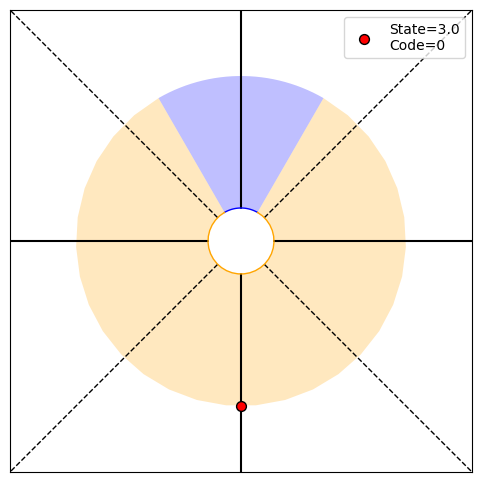

P(O1:24,S24|T)=[0.   0.   0.25 0.25], P(O1:24|actions,T)=0.5, P(T|O1:24)=[9.99999881e-01 1.19209275e-07], H24=0.00
PRINT 1: 2.913795973430192e-06, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


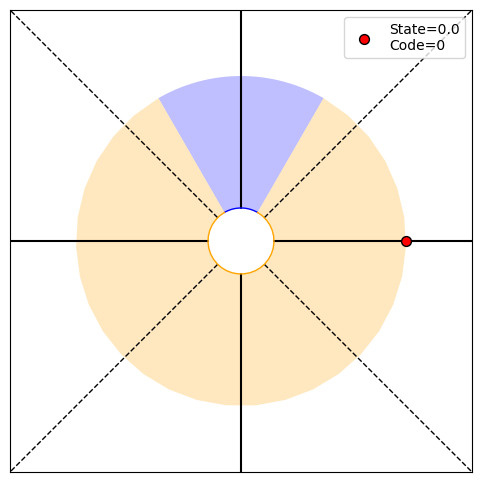

P(O1:25,S25|T)=[0.25 0.   0.   0.25], P(O1:25|actions,T)=0.5, P(T|O1:25)=[9.99999940e-01 5.96046412e-08], H25=0.00
PRINT 1: 1.516502712212915e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [7.28449036e-07 0.00000000e+00], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


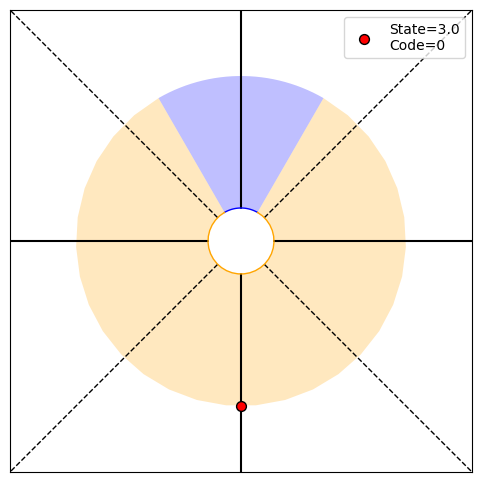

P(O1:26,S26|T)=[0.   0.   0.25 0.25], P(O1:26|actions,T)=0.5, P(T|O1:26)=[9.99999970e-01 2.98023215e-08], H26=0.00
PRINT 1: 7.880536995629399e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


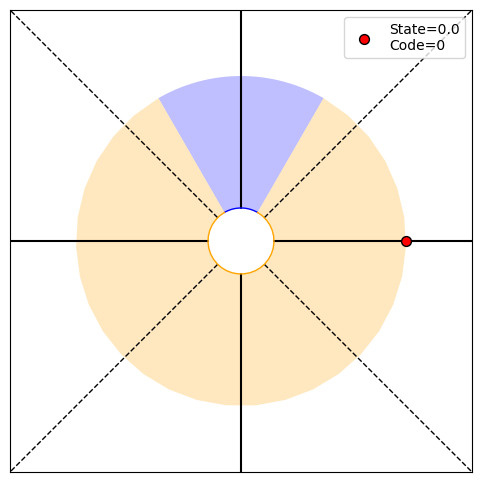

P(O1:27,S27|T)=[0.25 0.   0.   0.25], P(O1:27|actions,T)=0.5, P(T|O1:27)=[9.99999985e-01 1.49011610e-08], H27=0.00
PRINT 1: 4.089280164645592e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.97013428e-07 0.00000000e+00], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


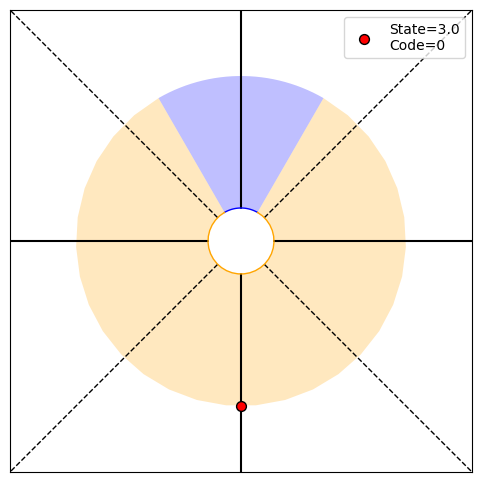

P(O1:28,S28|T)=[0.   0.   0.25 0.25], P(O1:28|actions,T)=0.5, P(T|O1:28)=[9.99999993e-01 7.45058054e-09], H28=0.00
PRINT 1: 2.1191459017693938e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


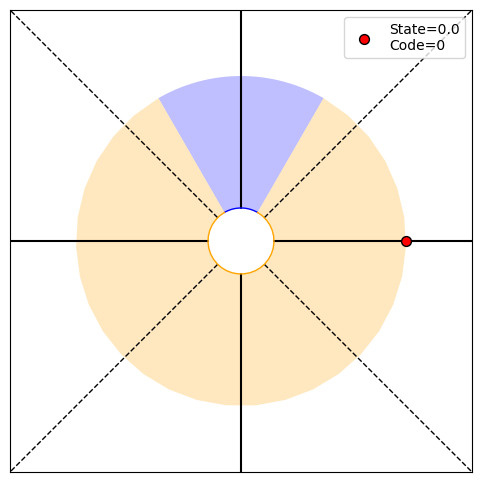

P(O1:29,S29|T)=[0.25 0.   0.   0.25], P(O1:29|actions,T)=0.5, P(T|O1:29)=[9.99999996e-01 3.72529028e-09], H29=0.00
PRINT 1: 1.0968258581782902e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [5.29786478e-08 0.00000000e+00], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


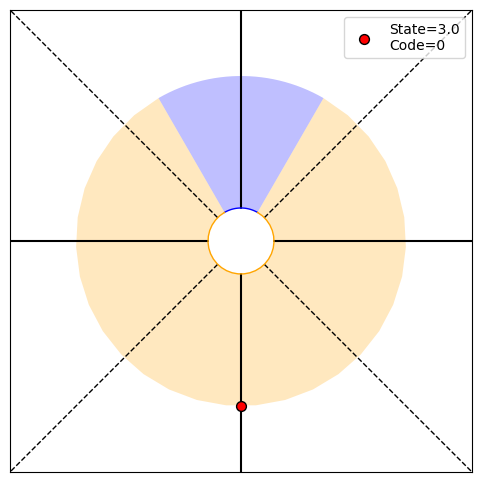

P(O1:30,S30|T)=[0.   0.   0.25 0.25], P(O1:30|actions,T)=0.5, P(T|O1:30)=[9.99999998e-01 1.86264515e-09], H30=0.00
PRINT 1: 5.670393814931786e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


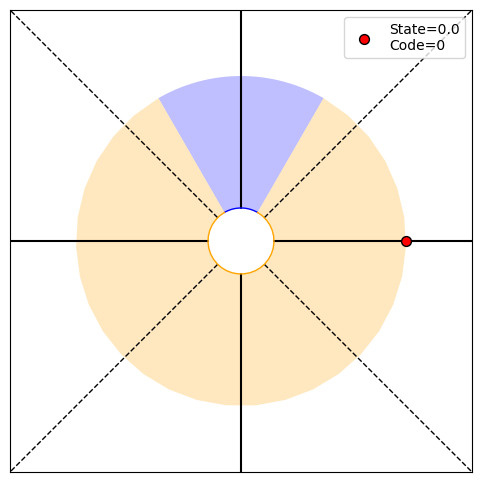

P(O1:31,S31|T)=[0.25 0.   0.   0.25], P(O1:31|actions,T)=0.5, P(T|O1:31)=[9.99999999e-01 9.31322574e-10], H31=0.00
PRINT 1: 2.928329167293487e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.41759846e-08 0.00000000e+00], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


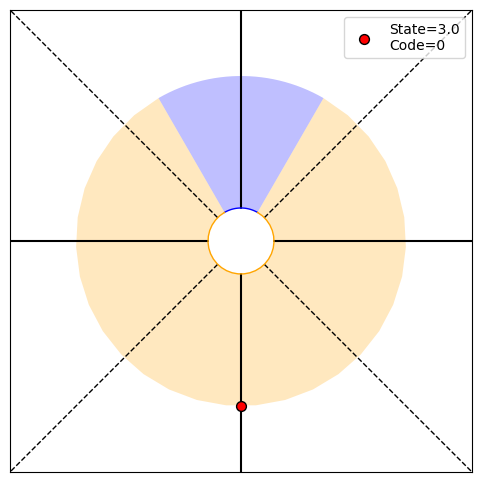

P(O1:32,S32|T)=[0.   0.   0.25 0.25], P(O1:32|actions,T)=0.5, P(T|O1:32)=[1.00000000e+00 4.65661287e-10], H32=0.00
PRINT 1: 1.510730712990713e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


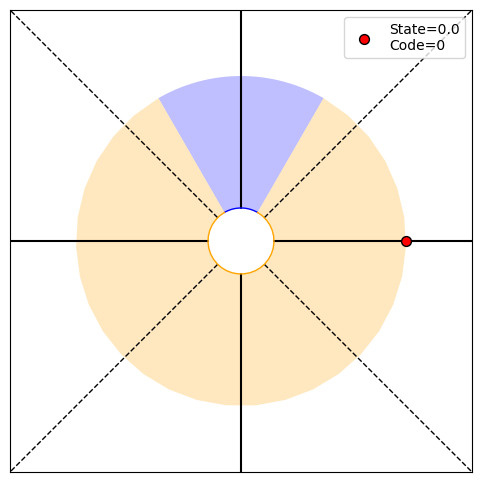

P(O1:33,S33|T)=[0.25 0.   0.   0.25], P(O1:33|actions,T)=0.5, P(T|O1:33)=[1.00000000e+00 2.32830644e-10], H33=0.00
PRINT 1: 7.786484210194632e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.77682678e-09 0.00000000e+00], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


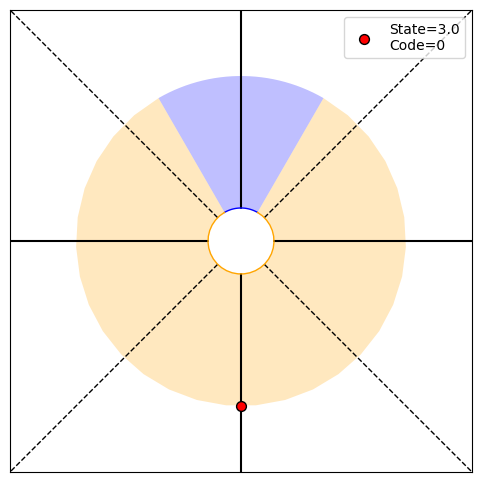

P(O1:34,S34|T)=[0.   0.   0.25 0.25], P(O1:34|actions,T)=0.5, P(T|O1:34)=[1.00000000e+00 1.16415322e-10], H34=0.00
PRINT 1: 4.0096574273346035e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


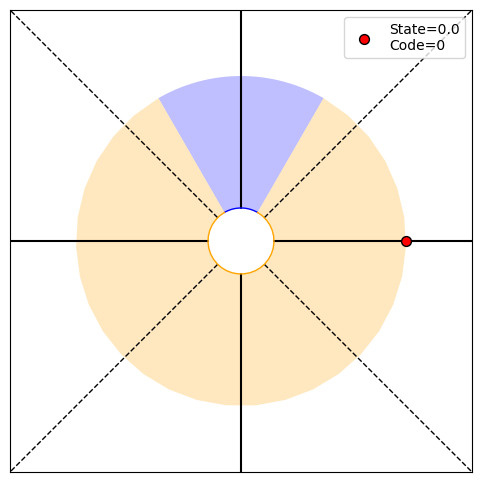

P(O1:35,S35|T)=[0.25 0.   0.   0.25], P(O1:35|actions,T)=0.5, P(T|O1:35)=[1.00000000e+00 5.82076609e-11], H35=0.00
PRINT 1: 2.063036374686746e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.00241436e-09 0.00000000e+00], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


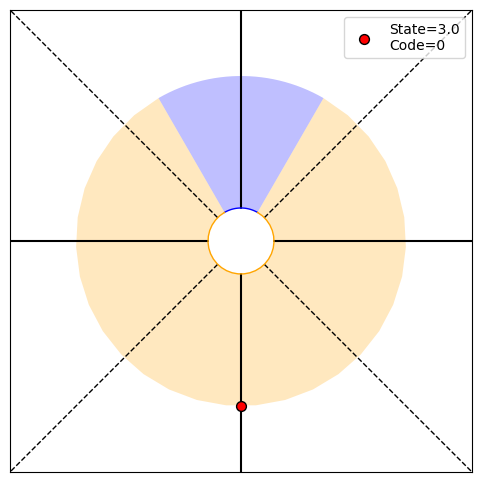

P(O1:36,S36|T)=[0.   0.   0.25 0.25], P(O1:36|actions,T)=0.5, P(T|O1:36)=[1.00000000e+00 2.91038305e-11], H36=0.00
PRINT 1: 1.0606220178274475e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


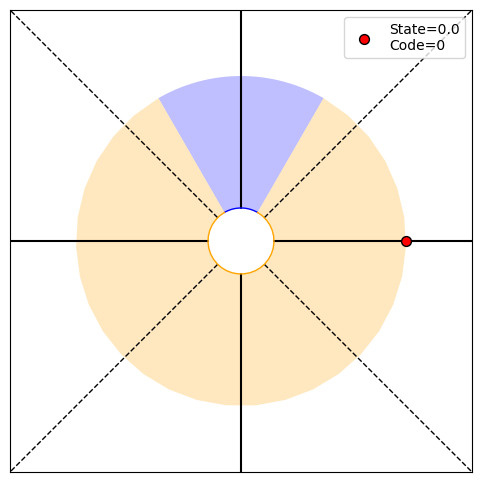

P(O1:37,S37|T)=[0.25 0.   0.   0.25], P(O1:37|actions,T)=0.5, P(T|O1:37)=[1.00000000e+00 1.45519152e-11], H37=0.00
PRINT 1: 5.448629241491377e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.65155504e-10 0.00000000e+00], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


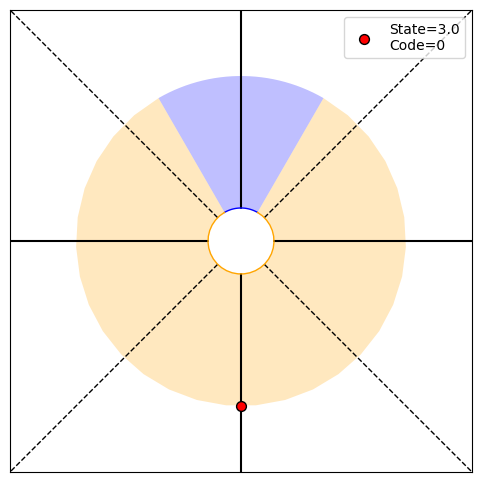

P(O1:38,S38|T)=[0.   0.   0.25 0.25], P(O1:38|actions,T)=0.5, P(T|O1:38)=[1.00000000e+00 7.27595761e-12], H38=0.00
PRINT 1: 2.797074196905669e-10, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


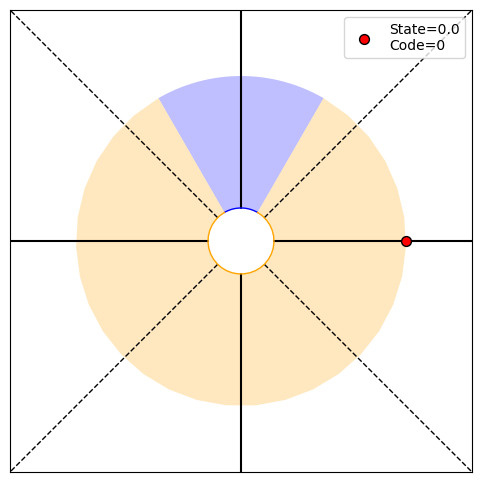

P(O1:39,S39|T)=[0.25 0.   0.   0.25], P(O1:39|actions,T)=0.5, P(T|O1:39)=[1.00000000e+00 3.63797881e-12], H39=0.00
PRINT 1: 1.4349168865284212e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [6.99268549e-11 0.00000000e+00], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


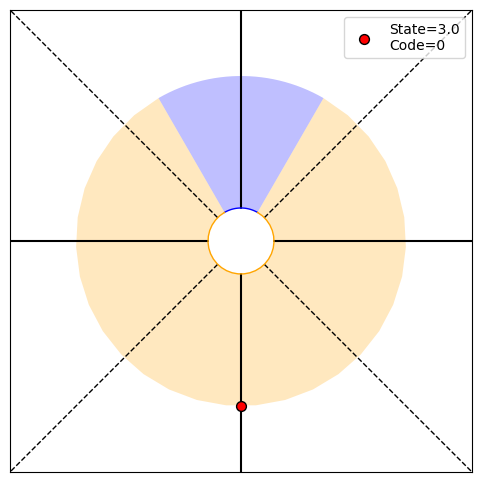

P(O1:40,S40|T)=[0.   0.   0.25 0.25], P(O1:40|actions,T)=0.5, P(T|O1:40)=[1.0000000e+00 1.8189894e-12], H40=0.00
PRINT 1: 7.356483373008693e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.58729222e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


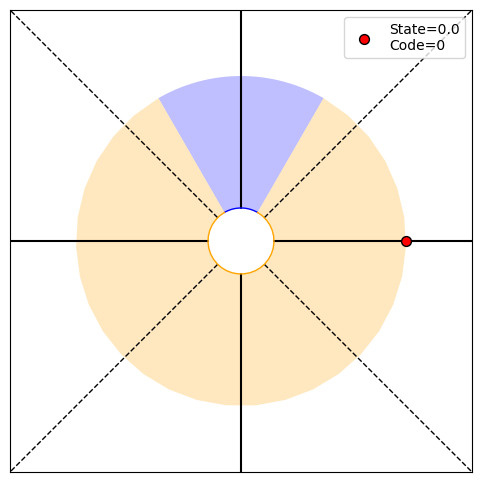

P(O1:41,S41|T)=[0.25 0.   0.   0.25], P(O1:41|actions,T)=0.5, P(T|O1:41)=[1.00000000e+00 9.09494702e-13], H41=0.00
PRINT 1: 3.769191156684724e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.83912084e-11 0.00000000e+00], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


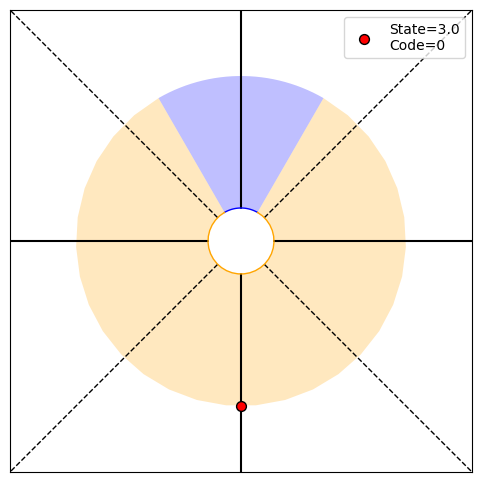

P(O1:42,S42|T)=[0.   0.   0.25 0.25], P(O1:42|actions,T)=0.5, P(T|O1:42)=[1.00000000e+00 4.54747351e-13], H42=0.00
PRINT 1: 1.9300703134317997e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 9.42297789e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


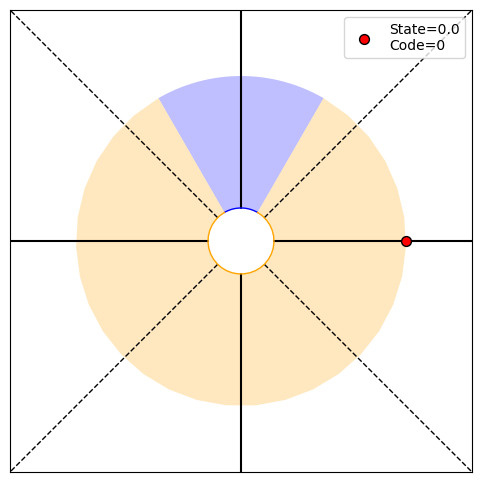

P(O1:43,S43|T)=[0.25 0.   0.   0.25], P(O1:43|actions,T)=0.5, P(T|O1:43)=[1.00000000e+00 2.27373675e-13], H43=0.00
PRINT 1: 9.877725242604262e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [4.82517578e-12 0.00000000e+00], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


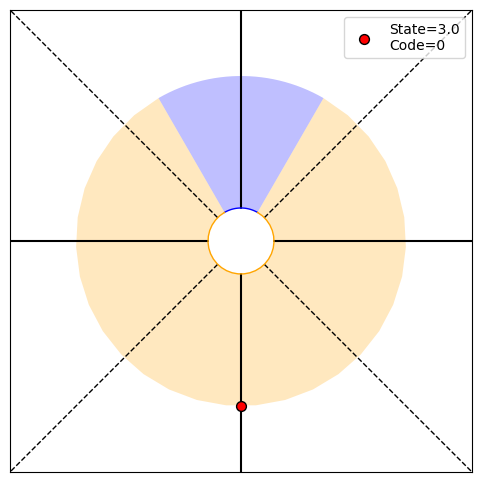

P(O1:44,S44|T)=[0.   0.   0.25 0.25], P(O1:44|actions,T)=0.5, P(T|O1:44)=[1.00000000e+00 1.13686838e-13], H44=0.00
PRINT 1: 5.052549459024267e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.46943131e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


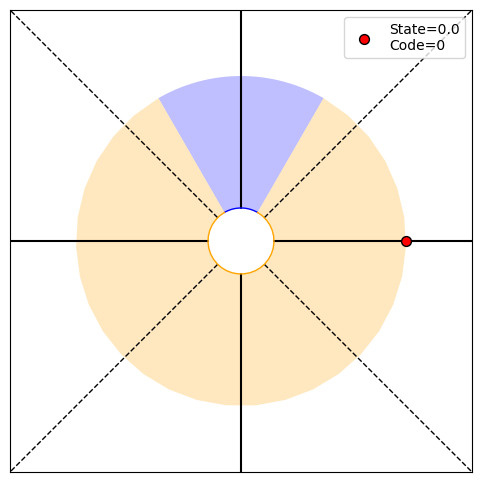

P(O1:45,S45|T)=[0.25 0.   0.   0.25], P(O1:45|actions,T)=0.5, P(T|O1:45)=[1.00000000e+00 5.68434189e-14], H45=0.00
PRINT 1: 2.5831181483730752e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.26313736e-12 0.00000000e+00], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


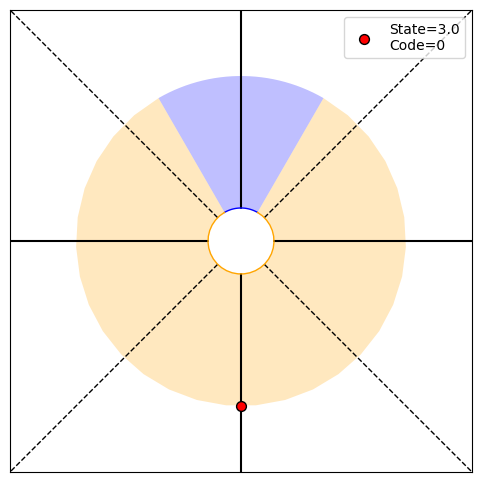

P(O1:46,S46|T)=[0.   0.   0.25 0.25], P(O1:46|actions,T)=0.5, P(T|O1:46)=[1.00000000e+00 2.84217094e-14], H46=0.00
PRINT 1: 1.3199807836169758e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.45779537e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


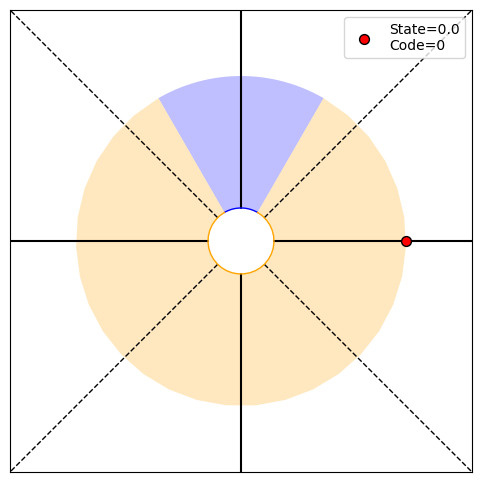

P(O1:47,S47|T)=[0.25 0.   0.   0.25], P(O1:47|actions,T)=0.5, P(T|O1:47)=[1.00000000e+00 1.42108547e-14], H47=0.00
PRINT 1: 6.742012465236986e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.29995196e-13 0.00000000e+00], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


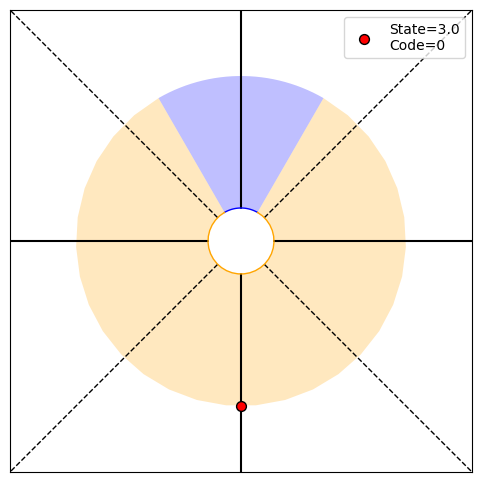

P(O1:48,S48|T)=[0.   0.   0.25 0.25], P(O1:48|actions,T)=0.5, P(T|O1:48)=[1.00000000e+00 7.10542736e-15], H48=0.00
PRINT 1: 3.442060506194525e-13, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.68550312e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


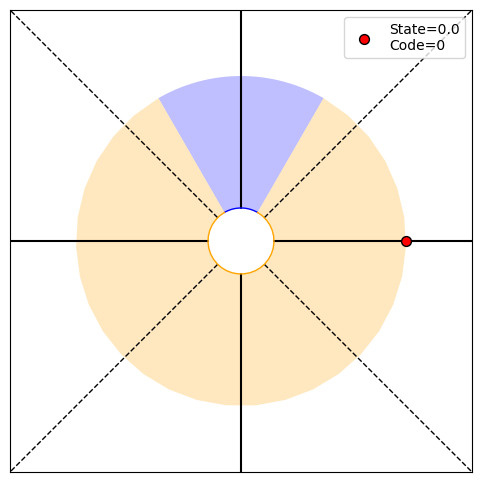

P(O1:49,S49|T)=[0.25 0.   0.   0.25], P(O1:49|actions,T)=0.5, P(T|O1:49)=[1.00000000e+00 3.55271368e-15], H49=0.00
PRINT 1: 1.7565573898852736e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [8.60515127e-14 0.00000000e+00], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


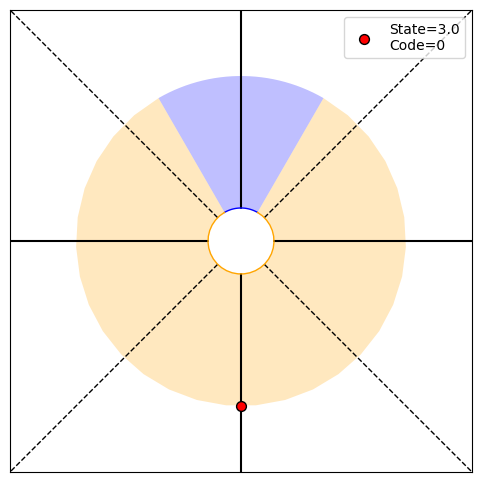

P(O1:50,S50|T)=[0.   0.   0.25 0.25], P(O1:50|actions,T)=0.5, P(T|O1:50)=[1.00000000e+00 1.77635684e-15], H50=0.00
PRINT 1: 8.960422633366407e-14, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 4.39139347e-14], [1.00000000e+00 1.77635684e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


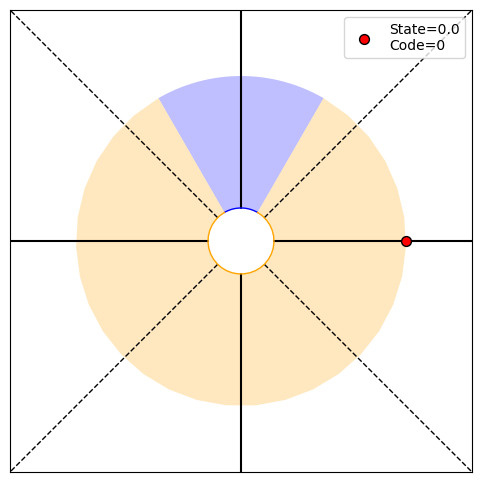

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: 90.0, Code received: 1.0


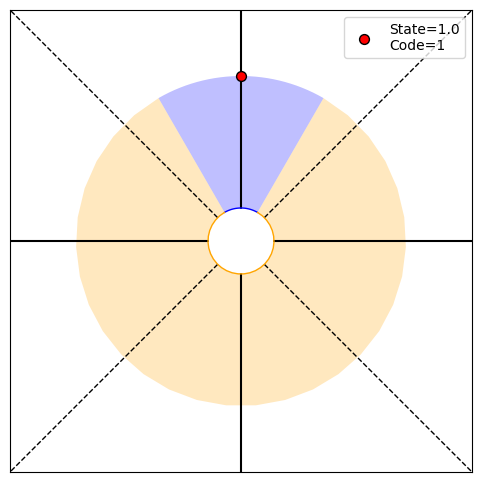

P(O1:2,S2|T)=[0.   0.25 0.   0.  ], P(O1:2|actions,T)=0.25, P(T|O1:2)=[0.5 0.5], H2=1.00
PRINT 1: 1.0, [0.   0.25 0.   0.  ]
PRINT 2: [0.31127812 0.31127812], [0.5 0.5]
Choosing randomly
Current angle: 0.0, Code received: 0.0


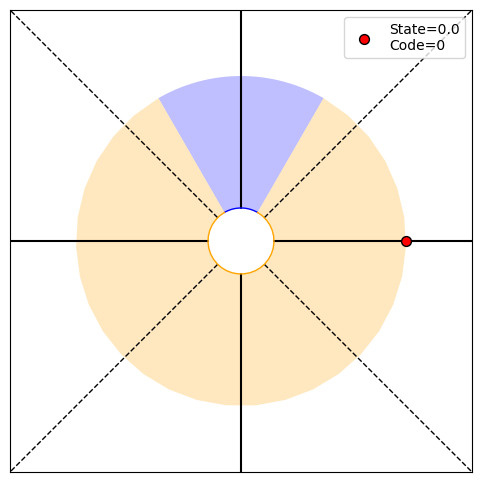

P(O1:3,S3|T)=[0.25 0.   0.   0.  ], P(O1:3|actions,T)=0.25, P(T|O1:3)=[0.66666667 0.33333333], H3=0.92
PRINT 1: 0.9182958340544896, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.31668909 0.31668909], [0.66666667 0.33333333]
Choosing randomly
Current angle: -90.0, Code received: 0.0


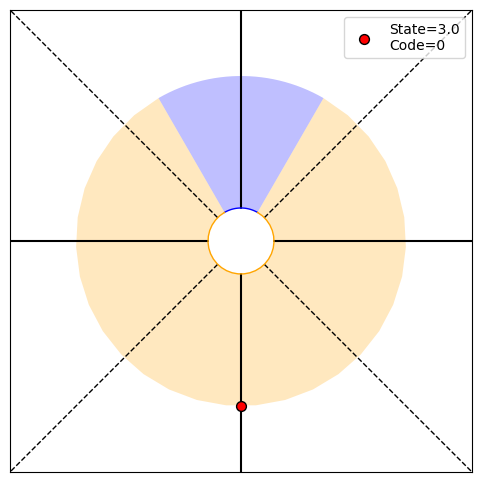

P(O1:4,S4|T)=[0.   0.   0.   0.25], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.8 0.2], H4=0.72
PRINT 1: 0.7219280948873623, [1.33459511e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [0.26899559 0.26899559], [0.8 0.2]
Choosing randomly
Current angle: -180.0, Code received: 0.0


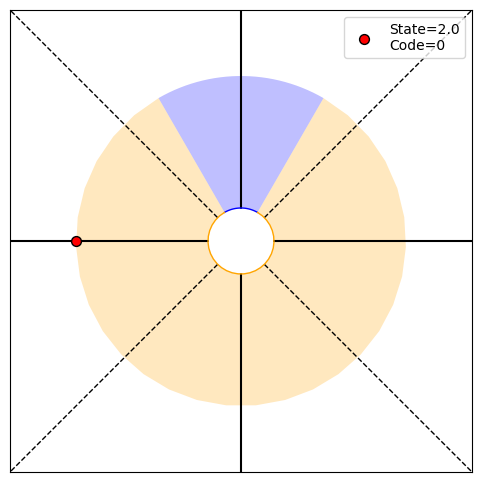

P(O1:5,S5|T)=[0.   0.   0.25 0.  ], P(O1:5|actions,T)=0.25, P(T|O1:5)=[0.88888889 0.11111111], H5=0.50
PRINT 1: 0.5032583347756456, [1.86003799e-044 0.00000000e+000 2.50000000e-001 2.66919022e-109]
PRINT 2: [0.19843232 0.19843232], [0.88888889 0.11111111]
Choosing randomly
Current angle: -270.0, Code received: 1.0


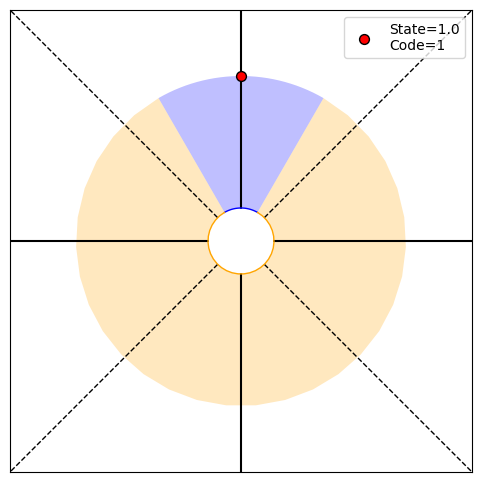

P(O1:6,S6|T)=[0.   0.25 0.   0.  ], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.94117647 0.05882353], H6=0.32
PRINT 1: 0.3227569588973982, [0.   0.25 0.   0.  ]
PRINT 2: [0.13260973 0.13260973], [0.94117647 0.05882353]
Choosing randomly
Current angle: -360.0, Code received: 0.0


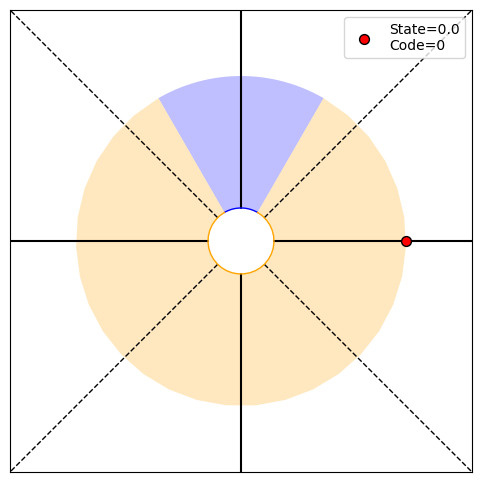

P(O1:7,S7|T)=[0.25 0.   0.   0.  ], P(O1:7|actions,T)=0.25, P(T|O1:7)=[0.96969697 0.03030303], H7=0.20
PRINT 1: 0.19590927087360493, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.08297127 0.08297127], [0.96969697 0.03030303]
Choosing randomly
Current angle: -450.0, Code received: 0.0


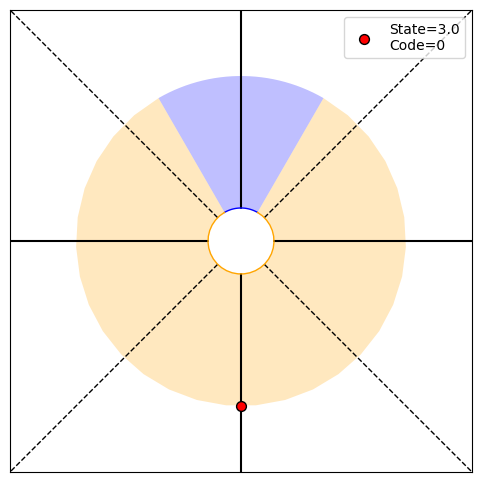

P(O1:8,S8|T)=[0.   0.   0.   0.25], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.98461538 0.01538462], H8=0.11
PRINT 1: 0.11467550533614673, [1.33459511e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [0.04968846 0.04968846], [0.98461538 0.01538462]
Choosing randomly
Current angle: -360.0, Code received: 0.0


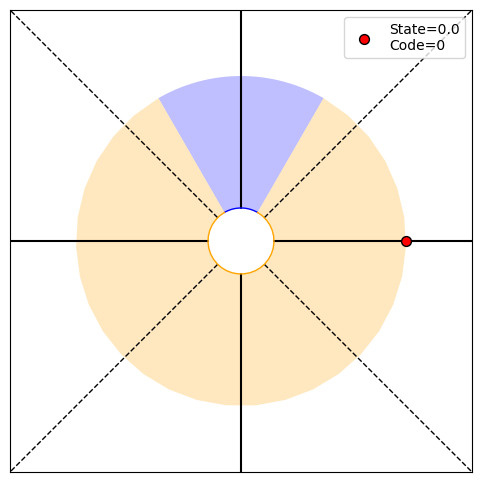

P(O1:9,S9|T)=[0.25 0.   0.   0.  ], P(O1:9|actions,T)=0.25, P(T|O1:9)=[0.99224806 0.00775194], H9=0.07
PRINT 1: 0.065490821314727, [2.50000000e-01 0.00000000e+00 3.45974132e-88 9.64374924e-23]
PRINT 2: [0.02888032 0.02888032], [0.99224806 0.00775194]
Choosing randomly
Current angle: -270.0, Code received: 1.0


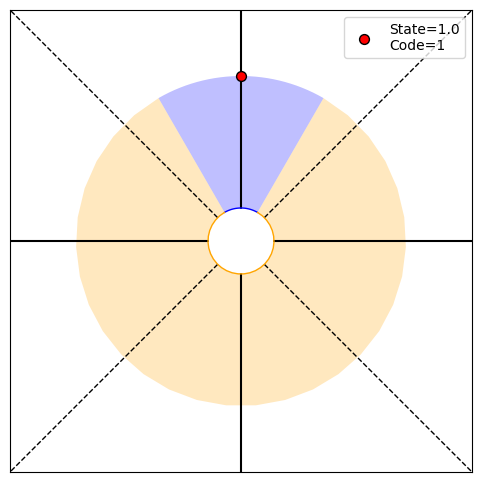

P(O1:10,S10|T)=[0.   0.25 0.   0.  ], P(O1:10|actions,T)=0.25, P(T|O1:10)=[0.99610895 0.00389105], H10=0.04
PRINT 1: 0.03675295386313879, [0.   0.25 0.   0.  ]
PRINT 2: [0.01643369 0.01643369], [0.99610895 0.00389105]
Choosing randomly
Current angle: -360.0, Code received: 0.0


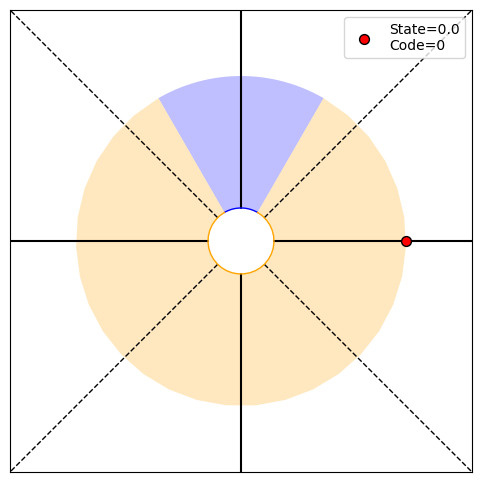

P(O1:11,S11|T)=[0.25 0.   0.   0.  ], P(O1:11|actions,T)=0.25, P(T|O1:11)=[0.99805068 0.00194932], H11=0.02
PRINT 1: 0.020358875256176766, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.00920546 0.00920546], [0.99805068 0.00194932]
Choosing randomly
Current angle: -270.0, Code received: 1.0


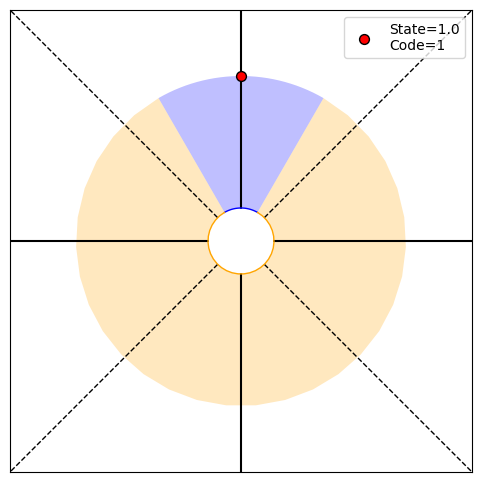

P(O1:12,S12|T)=[0.   0.25 0.   0.  ], P(O1:12|actions,T)=0.25, P(T|O1:12)=[9.99024390e-01 9.75609756e-04], H12=0.01
PRINT 1: 0.011164291953784, [0.   0.25 0.   0.  ]
PRINT 2: [0.00509451 0.00509451], [9.99024390e-01 9.75609756e-04]
Choosing randomly
Current angle: -360.0, Code received: 0.0


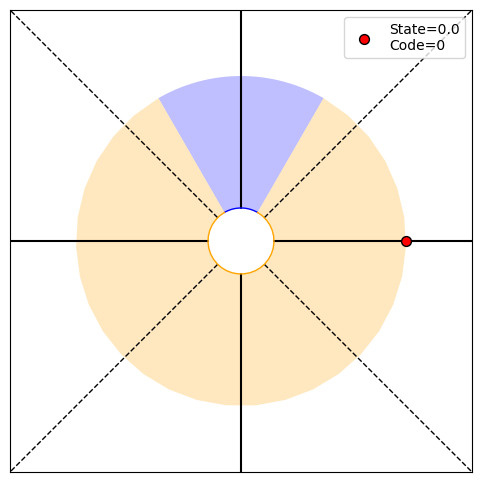

P(O1:13,S13|T)=[0.25 0.   0.   0.  ], P(O1:13|actions,T)=0.25, P(T|O1:13)=[9.99511957e-01 4.88042948e-04], H13=0.01
PRINT 1: 0.006072741436820054, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.00279239 0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


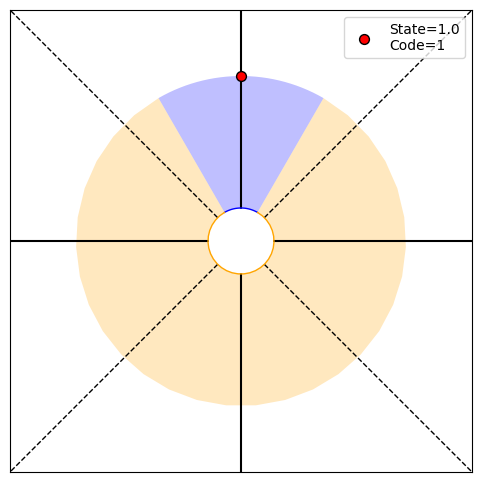

P(O1:14,S14|T)=[0.   0.25 0.   0.  ], P(O1:14|actions,T)=0.25, P(T|O1:14)=[9.99755919e-01 2.44081035e-04], H14=0.00
PRINT 1: 0.003281149899144082, [0.   0.25 0.   0.  ]
PRINT 2: [0.00151855 0.00151855], [9.99755919e-01 2.44081035e-04]
Choosing randomly
Current angle: -360.0, Code received: 0.0


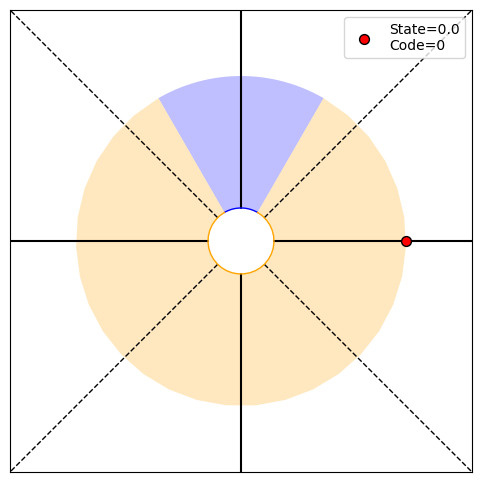

P(O1:15,S15|T)=[0.25 0.   0.   0.  ], P(O1:15|actions,T)=0.25, P(T|O1:15)=[9.99877945e-01 1.22055413e-04], H15=0.00
PRINT 1: 0.0017628198574909618, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.00082038 0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing randomly
Current angle: -270.0, Code received: 1.0


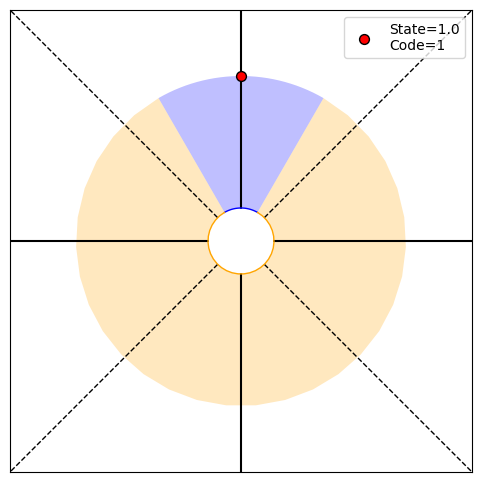

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[9.99938969e-01 6.10314312e-05], H16=0.00
PRINT 1: 0.0009424924667410556, [0.   0.25 0.   0.  ]
PRINT 2: [0.00044073 0.00044073], [9.99938969e-01 6.10314312e-05]
Choosing randomly
Current angle: -360.0, Code received: 0.0


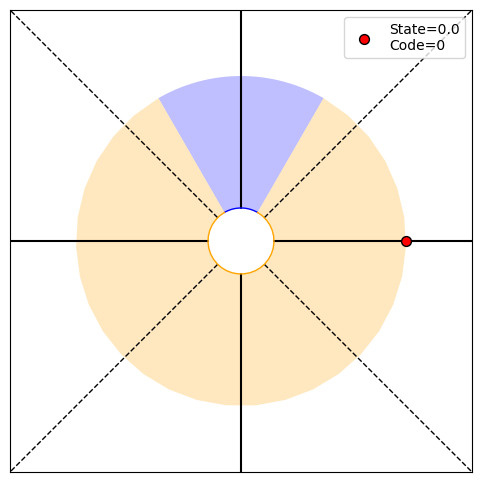

P(O1:17,S17|T)=[0.25 0.   0.   0.  ], P(O1:17|actions,T)=0.25, P(T|O1:17)=[9.99969483e-01 3.05166468e-05], H17=0.00
PRINT 1: 0.0005017765892900114, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.00023563 0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing randomly
Current angle: -450.0, Code received: 0.0


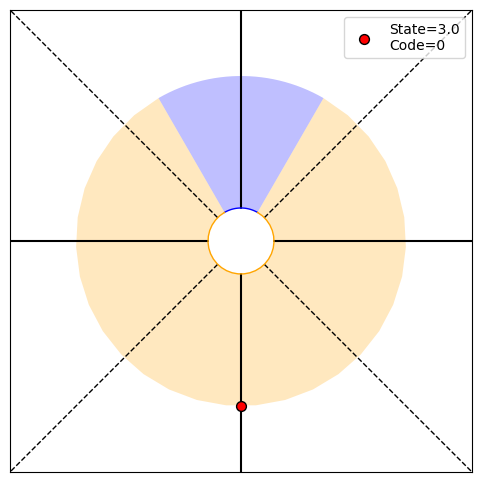

P(O1:18,S18|T)=[0.   0.   0.   0.25], P(O1:18|actions,T)=0.25, P(T|O1:18)=[9.99984741e-01 1.52585562e-05], H18=0.00
PRINT 1: 0.0002661505111268847, [1.33459511e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [0.00012545 0.00012545], [9.99984741e-01 1.52585562e-05]
Choosing randomly
Current angle: -360.0, Code received: 0.0


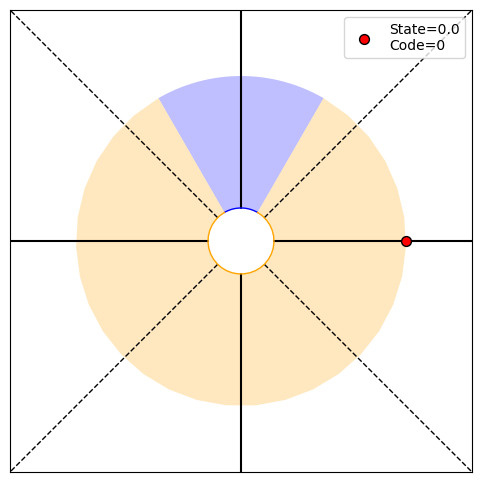

P(O1:19,S19|T)=[0.25 0.   0.   0.  ], P(O1:19|actions,T)=0.25, P(T|O1:19)=[9.99992371e-01 7.62933632e-06], H19=0.00
PRINT 1: 0.00014070556517604537, [2.50000000e-01 0.00000000e+00 3.45974132e-88 9.64374924e-23]
PRINT 2: [6.65381249e-05 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


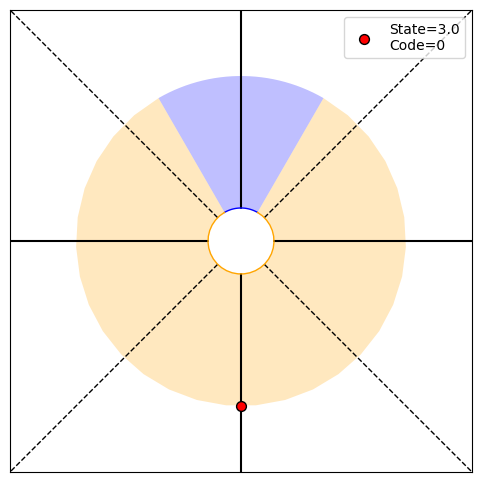

P(O1:20,S20|T)=[0.   0.   0.   0.25], P(O1:20|actions,T)=0.25, P(T|O1:20)=[9.99996185e-01 3.81468271e-06], H20=0.00
PRINT 1: 7.416772317850377e-05, [2.00189266e-109 0.00000000e+000 1.44656239e-022 2.50000000e-001]
PRINT 2: [3.51765229e-05 3.51765229e-05], [9.99996185e-01 3.81468271e-06]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


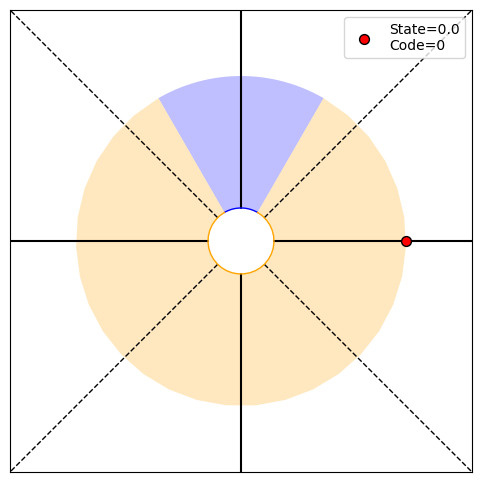

P(O1:21,S21|T)=[0.25 0.   0.   0.  ], P(O1:21|actions,T)=0.25, P(T|O1:21)=[9.99998093e-01 1.90734499e-06], H21=0.00
PRINT 1: 3.899127469152328e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 1.44656239e-22]
PRINT 2: [1.85419655e-05 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


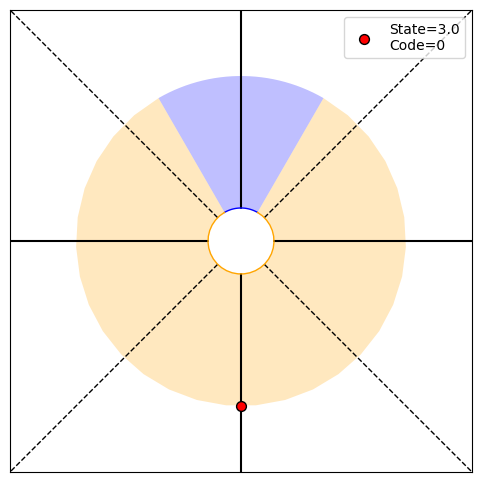

P(O1:22,S22|T)=[0.   0.   0.   0.25], P(O1:22|actions,T)=0.25, P(T|O1:22)=[9.99999046e-01 9.53673407e-07], H22=0.00
PRINT 1: 2.0449328689088202e-05, [2.66919022e-109 0.00000000e+000 1.92874985e-022 2.50000000e-001]
PRINT 2: [9.74782781e-06 9.74782781e-06], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


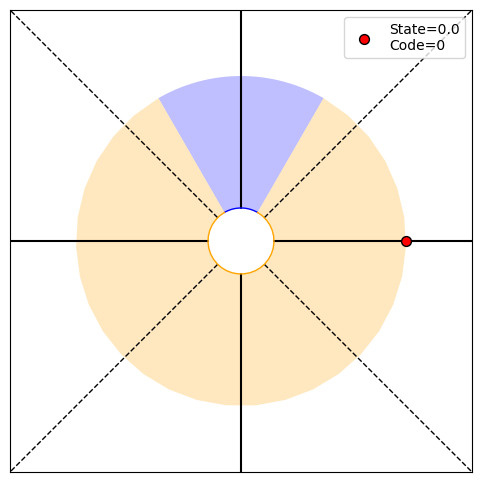

P(O1:23,S23|T)=[0.25 0.   0.   0.  ], P(O1:23|actions,T)=0.25, P(T|O1:23)=[9.99999523e-01 4.76836931e-07], H23=0.00
PRINT 1: 1.070150598685641e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 1.92874985e-22]
PRINT 2: [5.11233457e-06 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


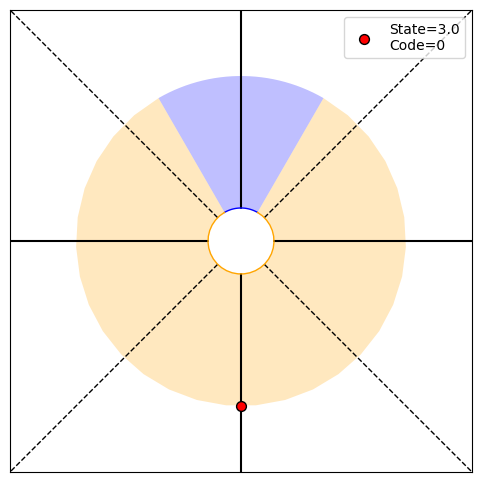

P(O1:24,S24|T)=[0.   0.   0.   0.25], P(O1:24|actions,T)=0.25, P(T|O1:24)=[9.99999762e-01 2.38418522e-07], H24=0.00
PRINT 1: 5.589172750401203e-06, [3.33648777e-109 0.00000000e+000 2.41093731e-022 2.50000000e-001]
PRINT 2: [2.67537712e-06 2.67537712e-06], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


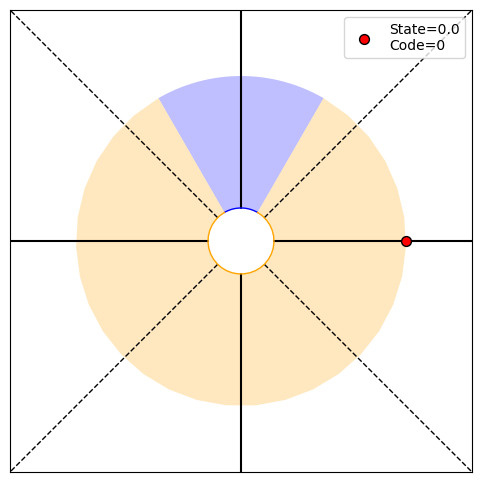

P(O1:25,S25|T)=[0.25 0.   0.   0.  ], P(O1:25|actions,T)=0.25, P(T|O1:25)=[9.99999881e-01 1.19209275e-07], H25=0.00
PRINT 1: 2.9137959734301916e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.41093731e-22]
PRINT 2: [1.39729335e-06 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


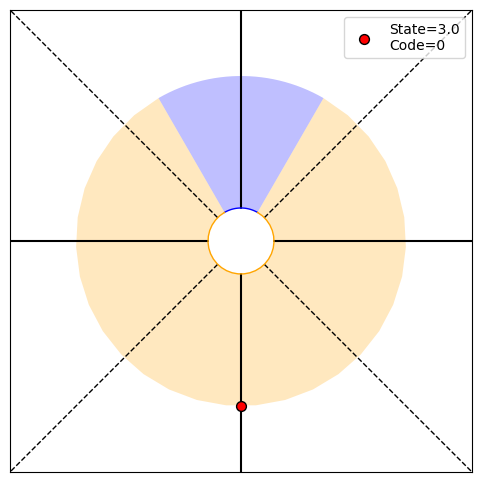

P(O1:26,S26|T)=[0.   0.   0.   0.25], P(O1:26|actions,T)=0.25, P(T|O1:26)=[9.99999940e-01 5.96046412e-08], H26=0.00
PRINT 1: 1.516502712212915e-06, [4.00378532e-109 0.00000000e+000 2.89312477e-022 2.50000000e-001]
PRINT 2: [7.28449036e-07 7.28449036e-07], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


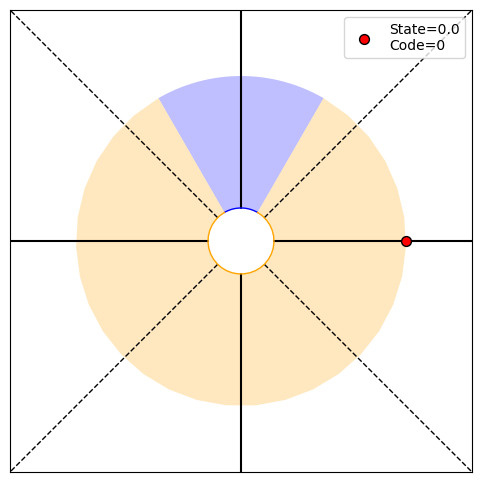

P(O1:27,S27|T)=[0.25 0.   0.   0.  ], P(O1:27|actions,T)=0.25, P(T|O1:27)=[9.99999970e-01 2.98023215e-08], H27=0.00
PRINT 1: 7.880536995629398e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.89312477e-22]
PRINT 2: [3.79125689e-07 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


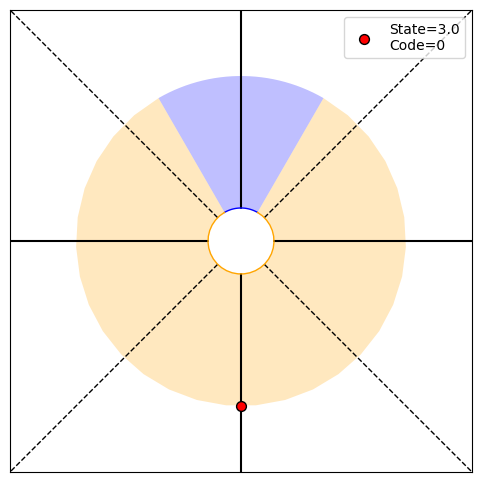

P(O1:28,S28|T)=[0.   0.   0.   0.25], P(O1:28|actions,T)=0.25, P(T|O1:28)=[9.99999985e-01 1.49011610e-08], H28=0.00
PRINT 1: 4.0892801646455924e-07, [4.67108288e-109 0.00000000e+000 3.37531223e-022 2.50000000e-001]
PRINT 2: [1.97013428e-07 1.97013428e-07], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


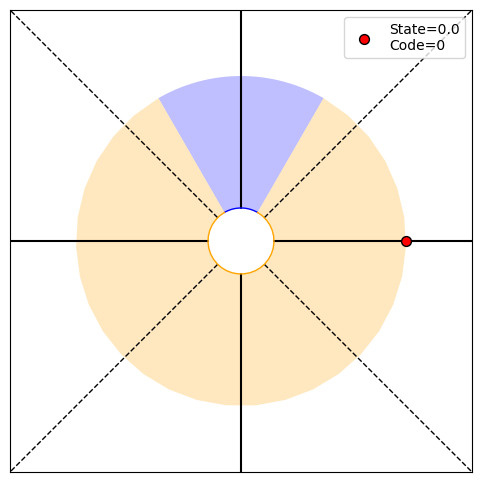

P(O1:29,S29|T)=[0.25 0.   0.   0.  ], P(O1:29|actions,T)=0.25, P(T|O1:29)=[9.99999993e-01 7.45058054e-09], H29=0.00
PRINT 1: 2.1191459017693936e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 3.37531223e-22]
PRINT 2: [1.02232005e-07 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


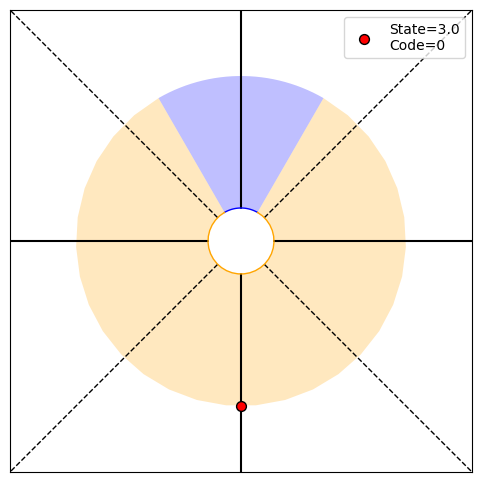

P(O1:30,S30|T)=[0.   0.   0.   0.25], P(O1:30|actions,T)=0.25, P(T|O1:30)=[9.99999996e-01 3.72529028e-09], H30=0.00
PRINT 1: 1.09682585817829e-07, [5.33838043e-109 0.00000000e+000 3.85749970e-022 2.50000000e-001]
PRINT 2: [5.29786478e-08 5.29786478e-08], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


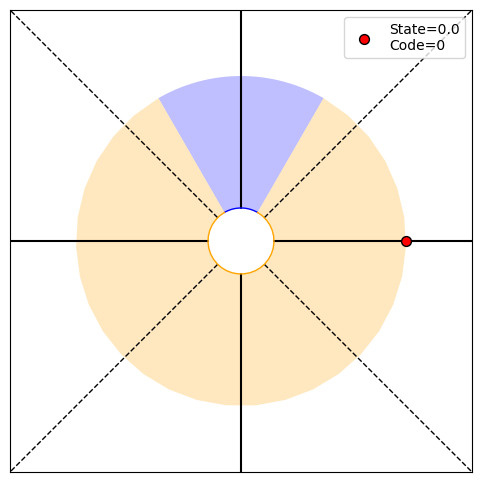

P(O1:31,S31|T)=[0.25 0.   0.   0.  ], P(O1:31|actions,T)=0.25, P(T|O1:31)=[9.99999998e-01 1.86264515e-09], H31=0.00
PRINT 1: 5.6703938149317856e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 3.85749970e-22]
PRINT 2: [2.74206465e-08 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


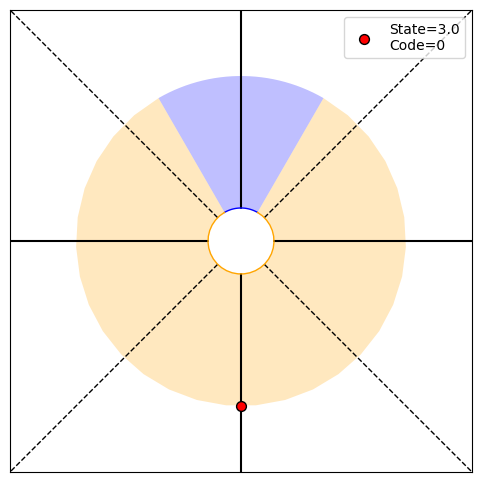

P(O1:32,S32|T)=[0.   0.   0.   0.25], P(O1:32|actions,T)=0.25, P(T|O1:32)=[9.99999999e-01 9.31322574e-10], H32=0.00
PRINT 1: 2.9283291672934866e-08, [6.00567798e-109 0.00000000e+000 4.33968716e-022 2.50000000e-001]
PRINT 2: [1.41759845e-08 1.41759846e-08], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


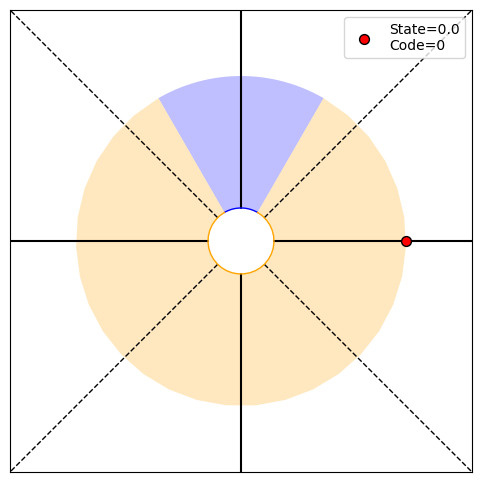

P(O1:33,S33|T)=[0.25 0.   0.   0.  ], P(O1:33|actions,T)=0.25, P(T|O1:33)=[1.00000000e+00 4.65661287e-10], H33=0.00
PRINT 1: 1.5107307129907126e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.33968716e-22]
PRINT 2: [7.32082292e-09 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


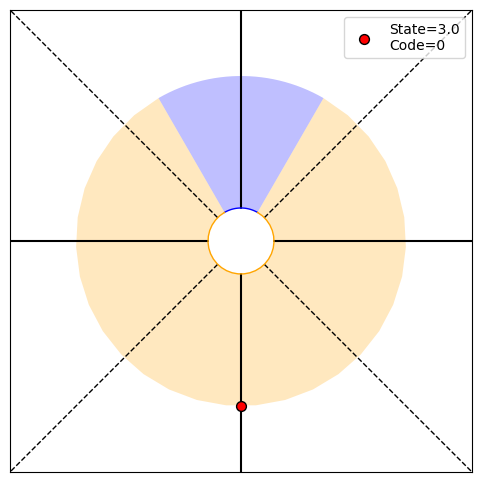

P(O1:34,S34|T)=[0.   0.   0.   0.25], P(O1:34|actions,T)=0.25, P(T|O1:34)=[1.00000000e+00 2.32830644e-10], H34=0.00
PRINT 1: 7.786484210194632e-09, [6.67297554e-109 0.00000000e+000 4.82187462e-022 2.50000000e-001]
PRINT 2: [3.77682678e-09 3.77682678e-09], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


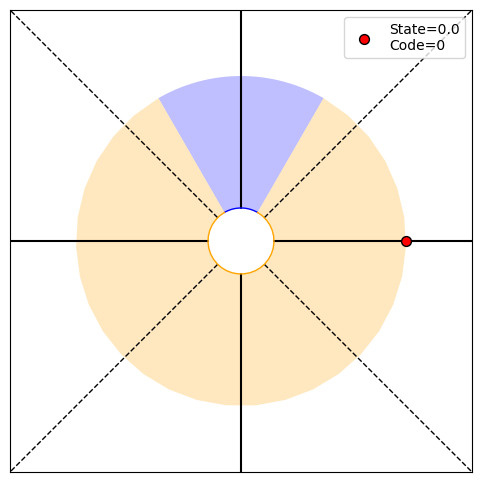

P(O1:35,S35|T)=[0.25 0.   0.   0.  ], P(O1:35|actions,T)=0.25, P(T|O1:35)=[1.00000000e+00 1.16415322e-10], H35=0.00
PRINT 1: 4.009657427334603e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-22]
PRINT 2: [1.94662105e-09 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


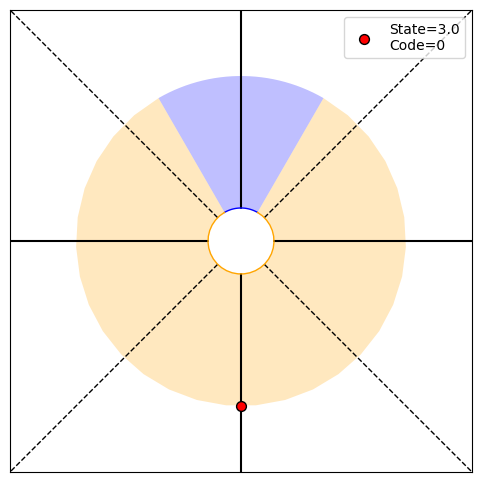

P(O1:36,S36|T)=[0.   0.   0.   0.25], P(O1:36|actions,T)=0.25, P(T|O1:36)=[1.00000000e+00 5.82076609e-11], H36=0.00
PRINT 1: 2.0630363746867455e-09, [7.34027309e-109 0.00000000e+000 5.30406208e-022 2.50000000e-001]
PRINT 2: [1.00241436e-09 1.00241436e-09], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


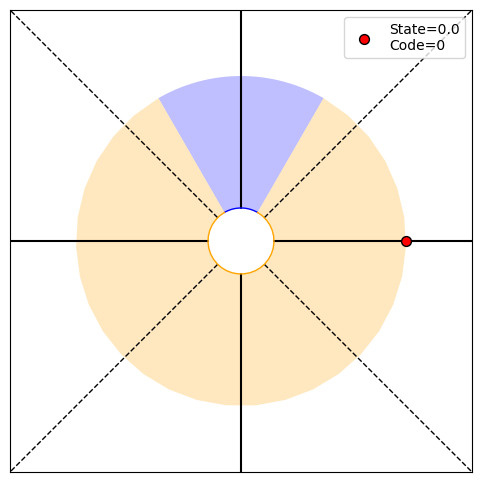

P(O1:37,S37|T)=[0.25 0.   0.   0.  ], P(O1:37|actions,T)=0.25, P(T|O1:37)=[1.00000000e+00 2.91038305e-11], H37=0.00
PRINT 1: 1.0606220178274472e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 5.30406208e-22]
PRINT 2: [5.15759094e-10 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


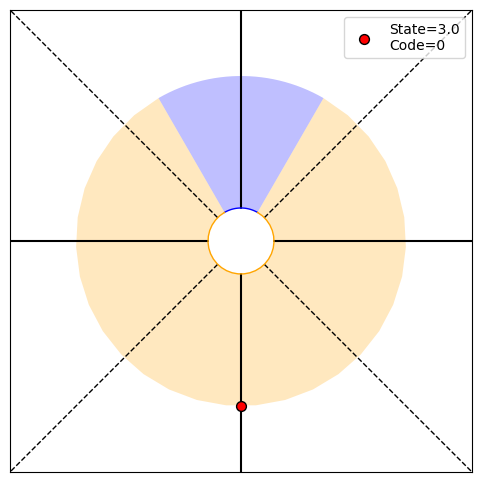

P(O1:38,S38|T)=[0.   0.   0.   0.25], P(O1:38|actions,T)=0.25, P(T|O1:38)=[1.00000000e+00 1.45519152e-11], H38=0.00
PRINT 1: 5.448629241491376e-10, [8.00757065e-109 0.00000000e+000 5.78624954e-022 2.50000000e-001]
PRINT 2: [2.65155504e-10 2.65155504e-10], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


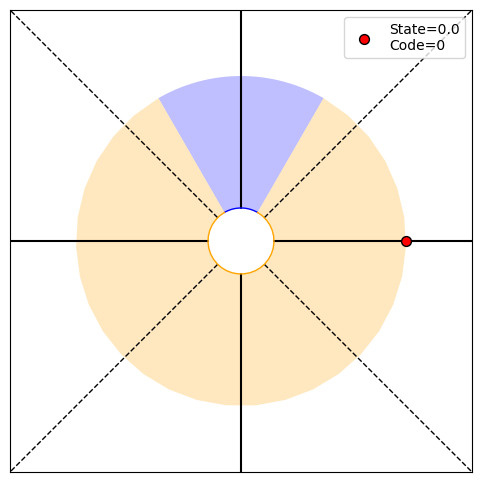

P(O1:39,S39|T)=[0.25 0.   0.   0.  ], P(O1:39|actions,T)=0.25, P(T|O1:39)=[1.00000000e+00 7.27595761e-12], H39=0.00
PRINT 1: 2.7970741969056687e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 5.78624954e-22]
PRINT 2: [1.36215731e-10 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


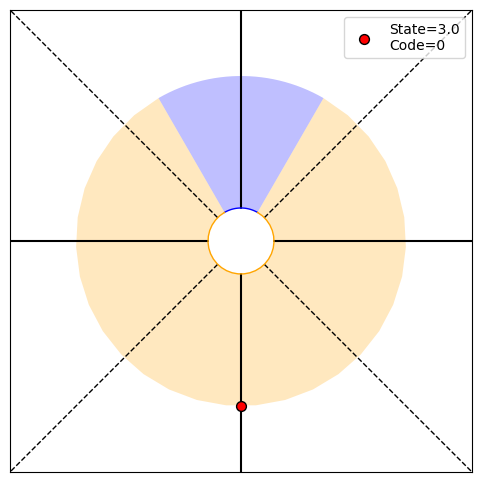

P(O1:40,S40|T)=[0.   0.   0.   0.25], P(O1:40|actions,T)=0.25, P(T|O1:40)=[1.00000000e+00 3.63797881e-12], H40=0.00
PRINT 1: 1.434916886528421e-10, [8.67486820e-109 0.00000000e+000 6.26843701e-022 2.50000000e-001]
PRINT 2: [6.99268548e-11 6.99268549e-11], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


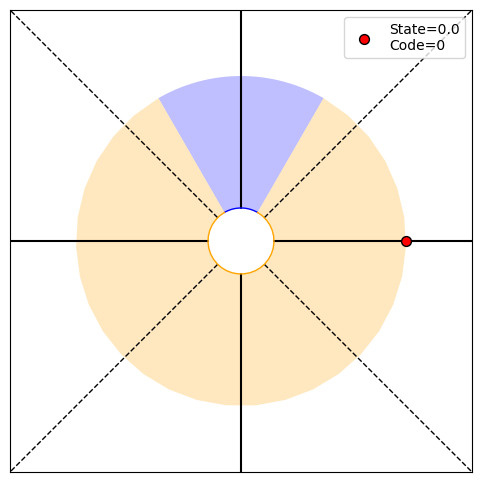

P(O1:41,S41|T)=[0.25 0.   0.   0.  ], P(O1:41|actions,T)=0.25, P(T|O1:41)=[1.0000000e+00 1.8189894e-12], H41=0.00
PRINT 1: 7.356483373008692e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 6.26843701e-22]
PRINT 2: [3.58729222e-11 3.58729221e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


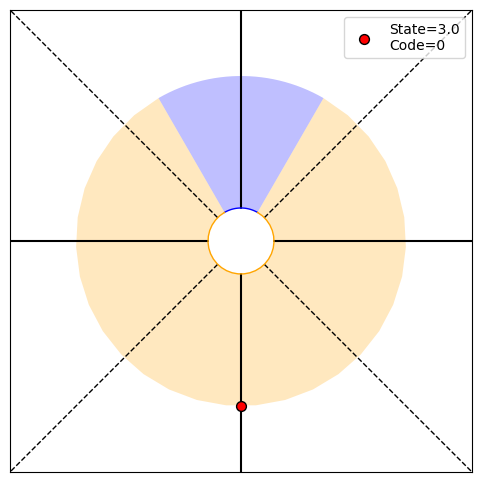

P(O1:42,S42|T)=[0.   0.   0.   0.25], P(O1:42|actions,T)=0.25, P(T|O1:42)=[1.00000000e+00 9.09494702e-13], H42=0.00
PRINT 1: 3.7691911566847234e-11, [9.34216575e-109 0.00000000e+000 6.75062447e-022 2.50000000e-001]
PRINT 2: [1.83912084e-11 1.83912084e-11], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


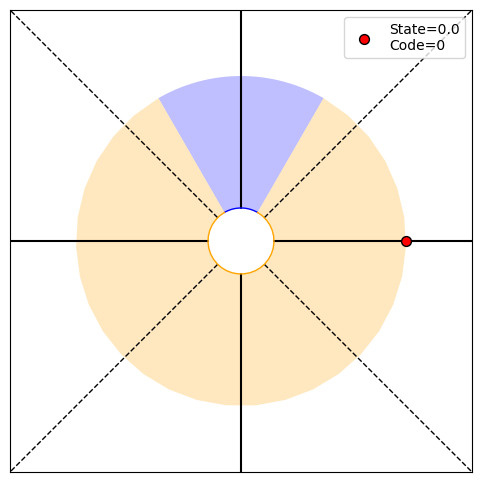

P(O1:43,S43|T)=[0.25 0.   0.   0.  ], P(O1:43|actions,T)=0.25, P(T|O1:43)=[1.00000000e+00 4.54747351e-13], H43=0.00
PRINT 1: 1.9300703134317994e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 6.75062447e-22]
PRINT 2: [9.42297789e-12 9.42297782e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


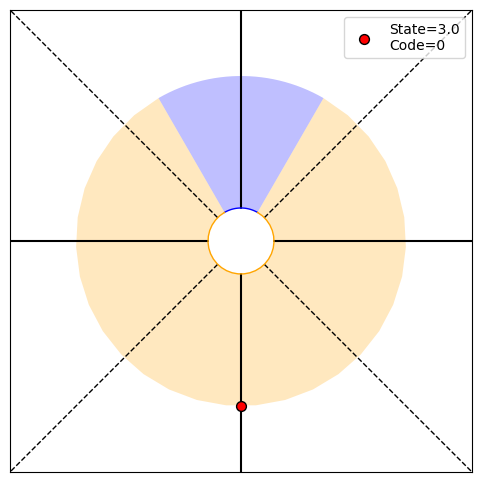

P(O1:44,S44|T)=[0.   0.   0.   0.25], P(O1:44|actions,T)=0.25, P(T|O1:44)=[1.00000000e+00 2.27373675e-13], H44=0.00
PRINT 1: 9.87772524260426e-12, [1.00094633e-108 0.00000000e+000 7.23281193e-022 2.50000000e-001]
PRINT 2: [4.82517571e-12 4.82517578e-12], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


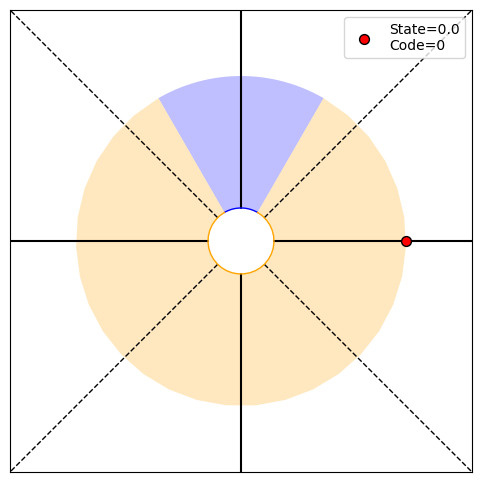

P(O1:45,S45|T)=[0.25 0.   0.   0.  ], P(O1:45|actions,T)=0.25, P(T|O1:45)=[1.00000000e+00 1.13686838e-13], H45=0.00
PRINT 1: 5.052549459024266e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 7.23281193e-22]
PRINT 2: [2.46943131e-12 2.46943124e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


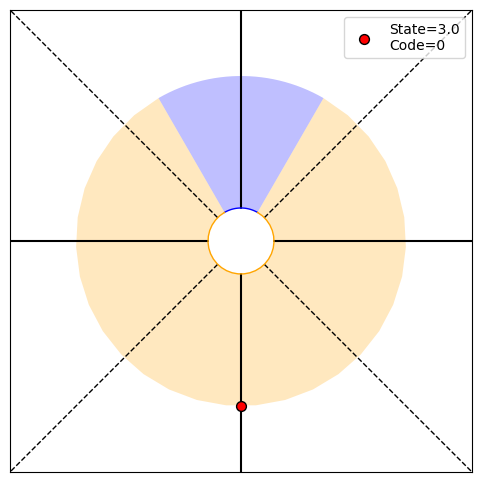

P(O1:46,S46|T)=[0.   0.   0.   0.25], P(O1:46|actions,T)=0.25, P(T|O1:46)=[1.00000000e+00 5.68434189e-14], H46=0.00
PRINT 1: 2.583118148373075e-12, [1.06767609e-108 0.00000000e+000 7.71499939e-022 2.50000000e-001]
PRINT 2: [1.26313729e-12 1.26313736e-12], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


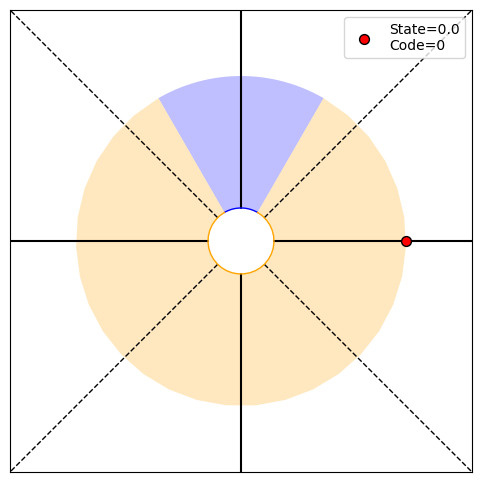

P(O1:47,S47|T)=[0.25 0.   0.   0.  ], P(O1:47|actions,T)=0.25, P(T|O1:47)=[1.00000000e+00 2.84217094e-14], H47=0.00
PRINT 1: 1.3199807836169755e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 7.71499939e-22]
PRINT 2: [6.45779537e-13 6.45779464e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


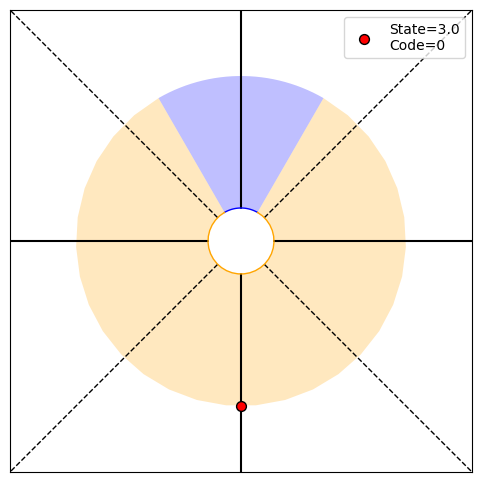

P(O1:48,S48|T)=[0.   0.   0.   0.25], P(O1:48|actions,T)=0.25, P(T|O1:48)=[1.00000000e+00 1.42108547e-14], H48=0.00
PRINT 1: 6.742012465236986e-13, [1.13440584e-108 0.00000000e+000 8.19718685e-022 2.50000000e-001]
PRINT 2: [3.29995122e-13 3.29995196e-13], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: -360.0, Code received: 0.0


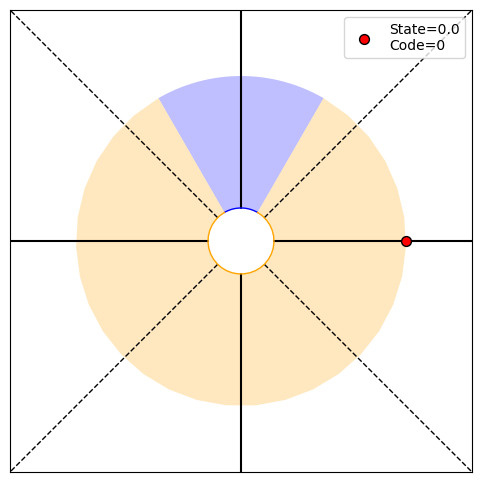

P(O1:49,S49|T)=[0.25 0.   0.   0.  ], P(O1:49|actions,T)=0.25, P(T|O1:49)=[1.00000000e+00 7.10542736e-15], H49=0.00
PRINT 1: 3.4420605061945245e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 8.19718685e-22]
PRINT 2: [1.68550312e-13 1.68550241e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: -450.0, Code received: 0.0


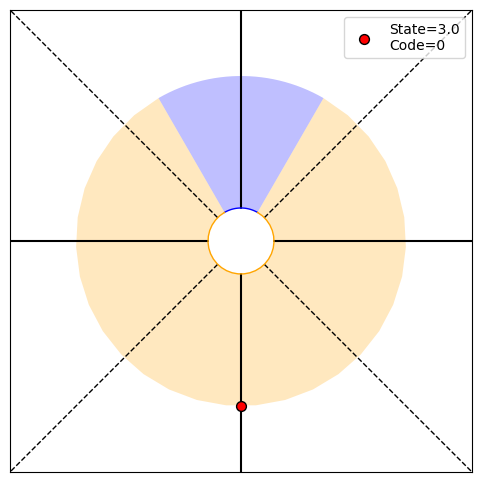

P(O1:50,S50|T)=[0.   0.   0.   0.25], P(O1:50|actions,T)=0.25, P(T|O1:50)=[1.00000000e+00 3.55271368e-15], H50=0.00
PRINT 1: 1.7565573898852733e-13, [1.20113560e-108 0.00000000e+000 8.67937432e-022 2.50000000e-001]
PRINT 2: [8.60514418e-14 8.60515127e-14], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


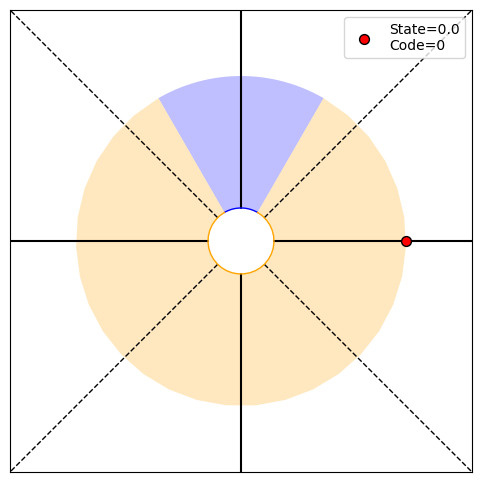

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: 90.0, Code received: 1.0


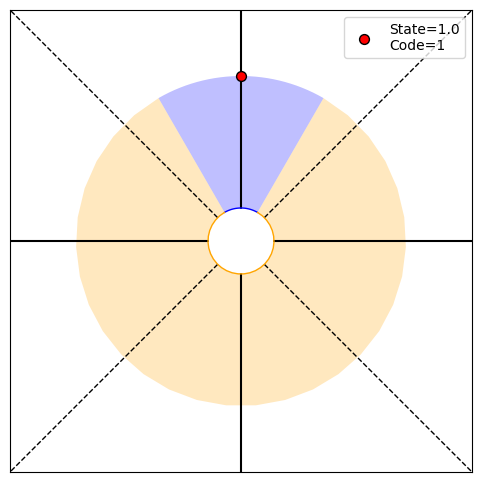

P(O1:2,S2|T)=[0.   0.25 0.   0.  ], P(O1:2|actions,T)=0.25, P(T|O1:2)=[0.5 0.5], H2=1.00
PRINT 1: 1.0, [0.   0.25 0.   0.  ]
PRINT 2: [0.31127812 0.31127812], [0.5 0.5]
Choosing randomly
Current angle: 180.0, Code received: 0.0


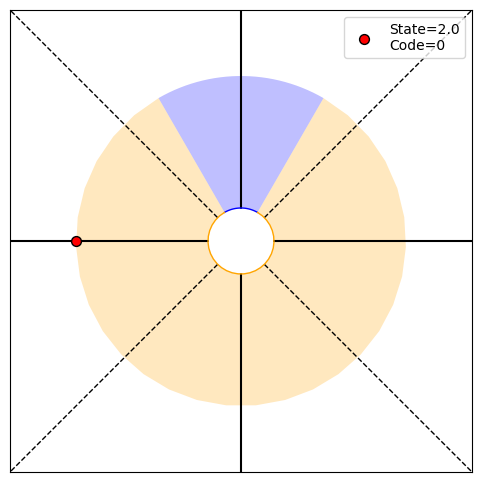

P(O1:3,S3|T)=[0.   0.   0.25 0.  ], P(O1:3|actions,T)=0.25, P(T|O1:3)=[0.66666667 0.33333333], H3=0.92
PRINT 1: 0.9182958340544896, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-23]
PRINT 2: [0.31668909 0.31668909], [0.66666667 0.33333333]
Choosing randomly
Current angle: 90.0, Code received: 1.0


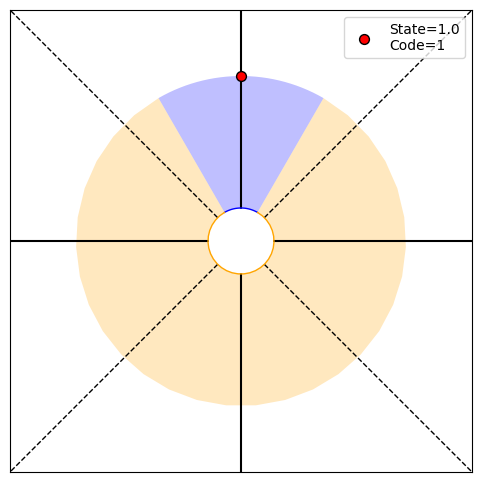

P(O1:4,S4|T)=[0.   0.25 0.   0.  ], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.8 0.2], H4=0.72
PRINT 1: 0.7219280948873623, [0.   0.25 0.   0.  ]
PRINT 2: [0.26899559 0.26899559], [0.8 0.2]
Choosing randomly
Current angle: 180.0, Code received: 0.0


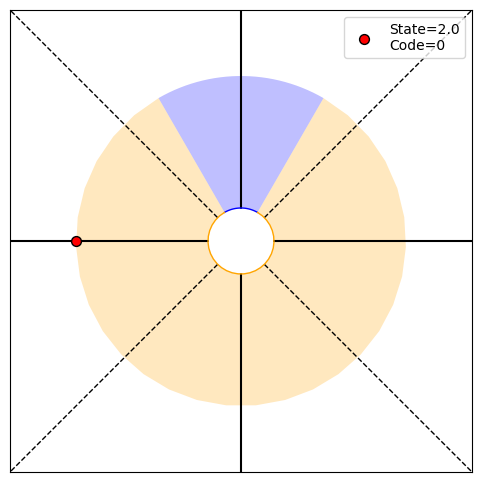

P(O1:5,S5|T)=[0.   0.   0.25 0.  ], P(O1:5|actions,T)=0.25, P(T|O1:5)=[0.88888889 0.11111111], H5=0.50
PRINT 1: 0.5032583347756456, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-23]
PRINT 2: [0.19843232 0.19843232], [0.88888889 0.11111111]
Choosing randomly
Current angle: 270.0, Code received: 0.0


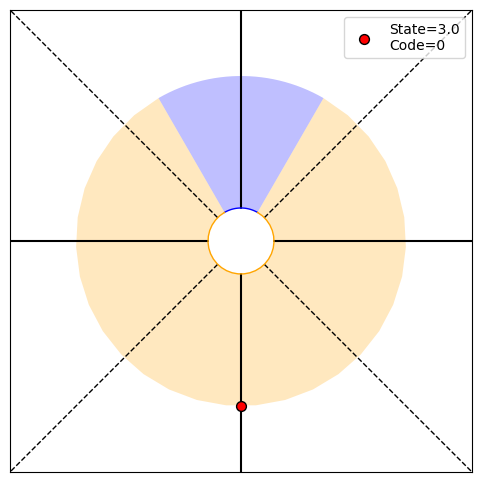

P(O1:6,S6|T)=[0.   0.   0.   0.25], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.94117647 0.05882353], H6=0.32
PRINT 1: 0.3227569588973982, [9.64374924e-023 0.00000000e+000 1.33459511e-109 2.50000000e-001]
PRINT 2: [0.13260973 0.13260973], [0.94117647 0.05882353]
Choosing randomly
Current angle: 180.0, Code received: 0.0


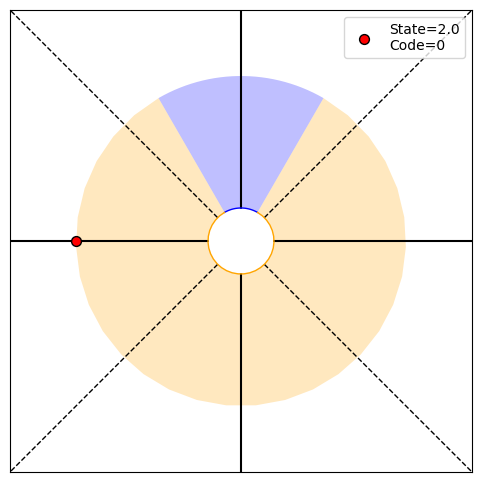

P(O1:7,S7|T)=[0.   0.   0.25 0.  ], P(O1:7|actions,T)=0.25, P(T|O1:7)=[0.96969697 0.03030303], H7=0.20
PRINT 1: 0.19590927087360493, [3.45974132e-88 0.00000000e+00 2.50000000e-01 9.64374924e-23]
PRINT 2: [0.08297127 0.08297127], [0.96969697 0.03030303]
Choosing randomly
Current angle: 270.0, Code received: 0.0


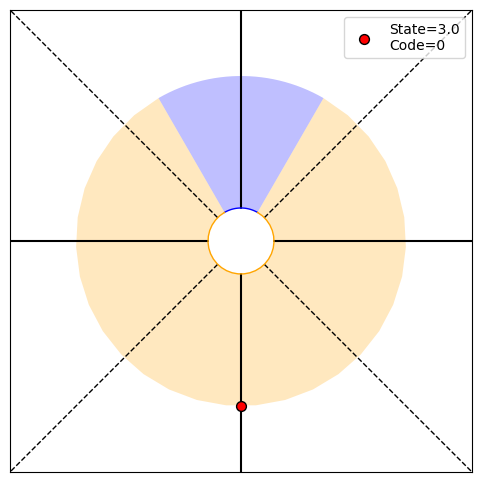

P(O1:8,S8|T)=[0.   0.   0.   0.25], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.98461538 0.01538462], H8=0.11
PRINT 1: 0.11467550533614673, [1.44656239e-022 0.00000000e+000 2.00189266e-109 2.50000000e-001]
PRINT 2: [0.04968846 0.04968846], [0.98461538 0.01538462]
Choosing randomly
Current angle: 180.0, Code received: 0.0


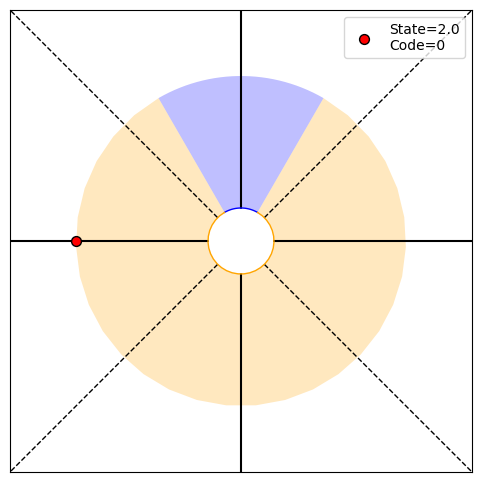

P(O1:9,S9|T)=[0.   0.   0.25 0.  ], P(O1:9|actions,T)=0.25, P(T|O1:9)=[0.99224806 0.00775194], H9=0.07
PRINT 1: 0.065490821314727, [3.45974132e-88 0.00000000e+00 2.50000000e-01 1.44656239e-22]
PRINT 2: [0.02888032 0.02888032], [0.99224806 0.00775194]
Choosing randomly
Current angle: 270.0, Code received: 0.0


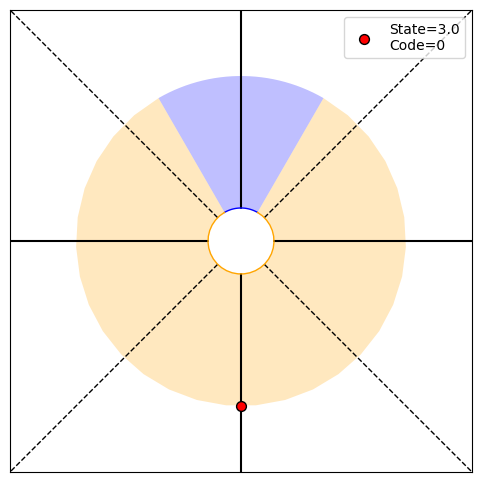

P(O1:10,S10|T)=[0.   0.   0.   0.25], P(O1:10|actions,T)=0.25, P(T|O1:10)=[0.99610895 0.00389105], H10=0.04
PRINT 1: 0.03675295386313879, [1.92874985e-022 0.00000000e+000 2.66919022e-109 2.50000000e-001]
PRINT 2: [0.01643369 0.01643369], [0.99610895 0.00389105]
Choosing randomly
Current angle: 180.0, Code received: 0.0


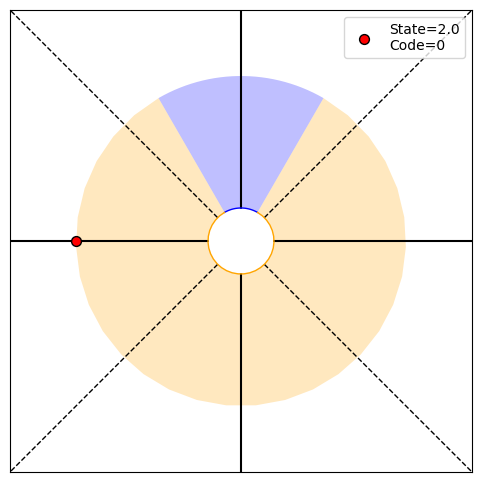

P(O1:11,S11|T)=[0.   0.   0.25 0.  ], P(O1:11|actions,T)=0.25, P(T|O1:11)=[0.99805068 0.00194932], H11=0.02
PRINT 1: 0.020358875256176766, [3.45974132e-88 0.00000000e+00 2.50000000e-01 1.92874985e-22]
PRINT 2: [0.00920546 0.00920546], [0.99805068 0.00194932]
Choosing randomly
Current angle: 270.0, Code received: 0.0


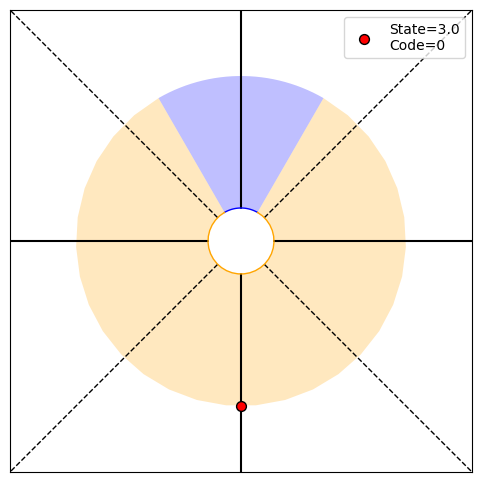

P(O1:12,S12|T)=[0.   0.   0.   0.25], P(O1:12|actions,T)=0.25, P(T|O1:12)=[9.99024390e-01 9.75609756e-04], H12=0.01
PRINT 1: 0.011164291953784, [2.41093731e-022 0.00000000e+000 3.33648777e-109 2.50000000e-001]
PRINT 2: [0.00509451 0.00509451], [9.99024390e-01 9.75609756e-04]
Choosing randomly
Current angle: 180.0, Code received: 0.0


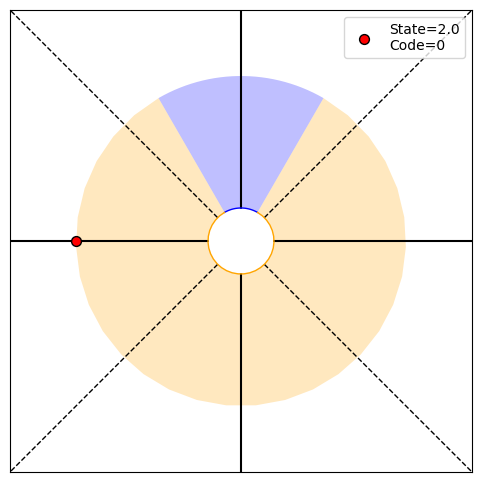

P(O1:13,S13|T)=[0.   0.   0.25 0.  ], P(O1:13|actions,T)=0.25, P(T|O1:13)=[9.99511957e-01 4.88042948e-04], H13=0.01
PRINT 1: 0.006072741436820054, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.41093731e-22]
PRINT 2: [0.00279239 0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing randomly
Current angle: 270.0, Code received: 0.0


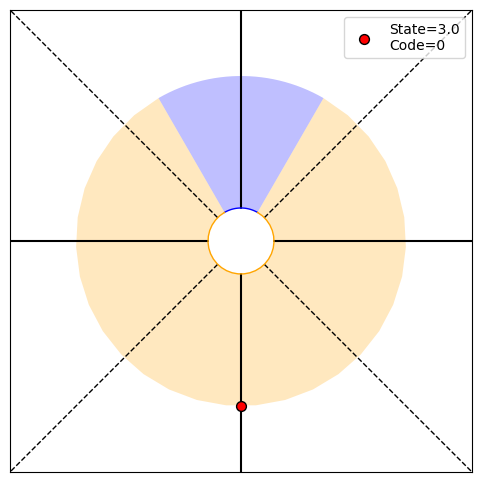

P(O1:14,S14|T)=[0.   0.   0.   0.25], P(O1:14|actions,T)=0.25, P(T|O1:14)=[9.99755919e-01 2.44081035e-04], H14=0.00
PRINT 1: 0.003281149899144082, [2.89312477e-022 0.00000000e+000 4.00378532e-109 2.50000000e-001]
PRINT 2: [0.00151855 0.00151855], [9.99755919e-01 2.44081035e-04]
Choosing randomly
Current angle: 360.0, Code received: 0.0


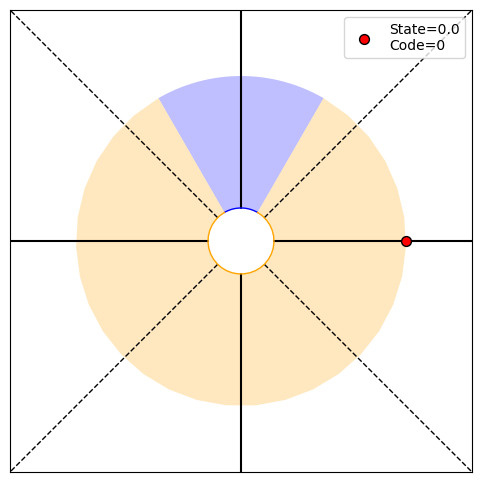

P(O1:15,S15|T)=[0.25 0.   0.   0.  ], P(O1:15|actions,T)=0.25, P(T|O1:15)=[9.99877945e-01 1.22055413e-04], H15=0.00
PRINT 1: 0.0017628198574909618, [2.50000000e-001 0.00000000e+000 5.58011396e-044 8.00757065e-109]
PRINT 2: [0.00082038 0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing randomly
Current angle: 450.0, Code received: 1.0


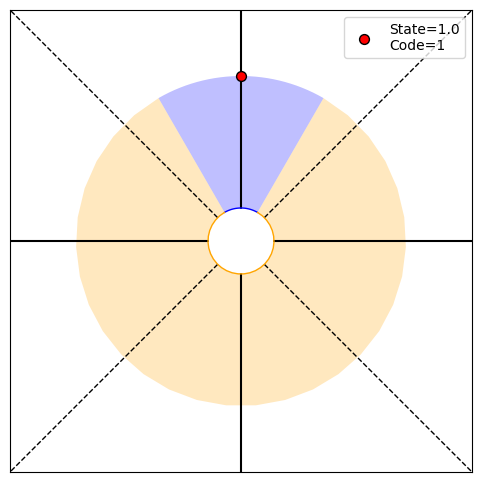

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[9.99938969e-01 6.10314312e-05], H16=0.00
PRINT 1: 0.0009424924667410556, [0.   0.25 0.   0.  ]
PRINT 2: [0.00044073 0.00044073], [9.99938969e-01 6.10314312e-05]
Choosing randomly
Current angle: 360.0, Code received: 0.0


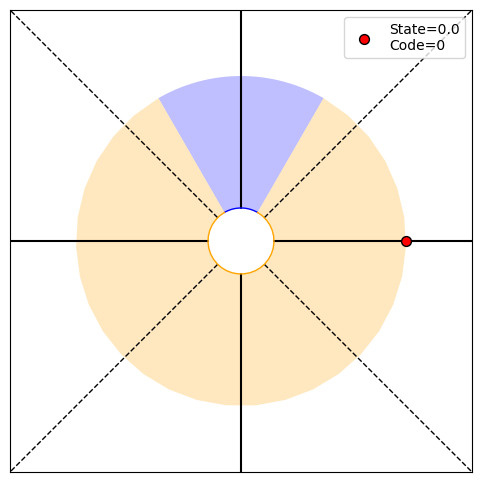

P(O1:17,S17|T)=[0.25 0.   0.   0.  ], P(O1:17|actions,T)=0.25, P(T|O1:17)=[9.99969483e-01 3.05166468e-05], H17=0.00
PRINT 1: 0.0005017765892900114, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.00023563 0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing randomly
Current angle: 450.0, Code received: 1.0


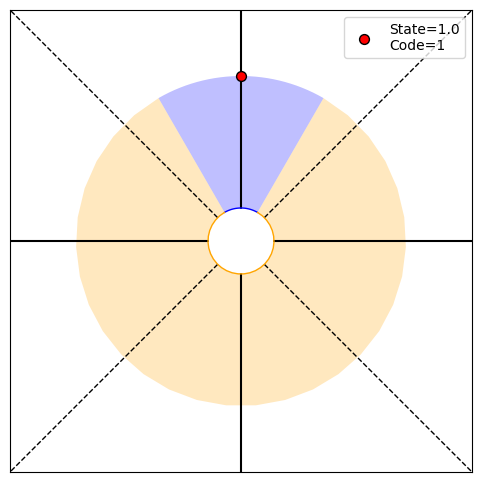

P(O1:18,S18|T)=[0.   0.25 0.   0.  ], P(O1:18|actions,T)=0.25, P(T|O1:18)=[9.99984741e-01 1.52585562e-05], H18=0.00
PRINT 1: 0.0002661505111268847, [0.   0.25 0.   0.  ]
PRINT 2: [0.00012545 0.00012545], [9.99984741e-01 1.52585562e-05]
Choosing randomly
Current angle: 360.0, Code received: 0.0


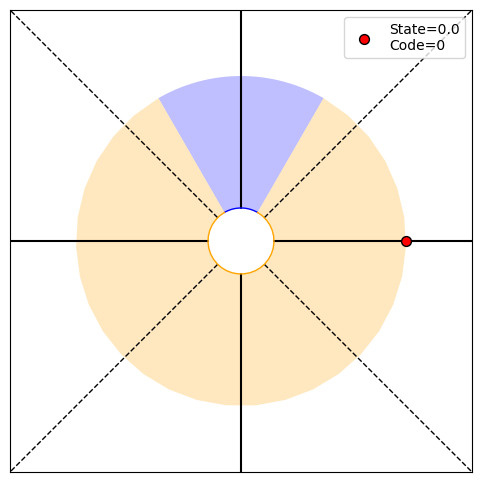

P(O1:19,S19|T)=[0.25 0.   0.   0.  ], P(O1:19|actions,T)=0.25, P(T|O1:19)=[9.99992371e-01 7.62933632e-06], H19=0.00
PRINT 1: 0.00014070556517604537, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [6.65381249e-05 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing randomly
Current angle: 270.0, Code received: 0.0


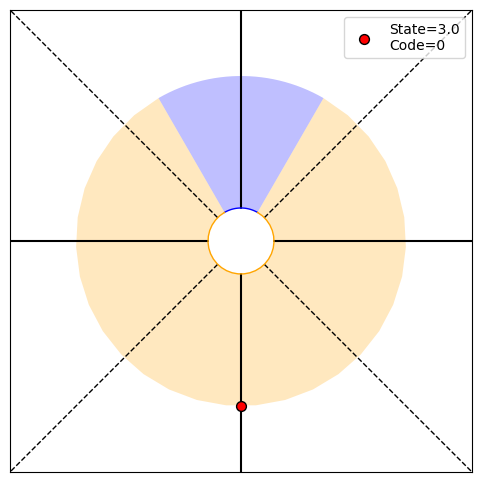

P(O1:20,S20|T)=[0.   0.   0.   0.25], P(O1:20|actions,T)=0.25, P(T|O1:20)=[9.99996185e-01 3.81468271e-06], H20=0.00
PRINT 1: 7.416772317850377e-05, [1.33459511e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [3.51765229e-05 3.51765229e-05], [9.99996185e-01 3.81468271e-06]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


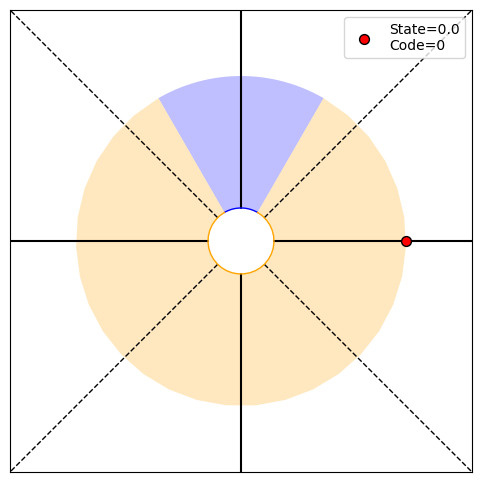

P(O1:21,S21|T)=[0.25 0.   0.   0.  ], P(O1:21|actions,T)=0.25, P(T|O1:21)=[9.99998093e-01 1.90734499e-06], H21=0.00
PRINT 1: 3.899127469152328e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 9.64374924e-23]
PRINT 2: [1.85419655e-05 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


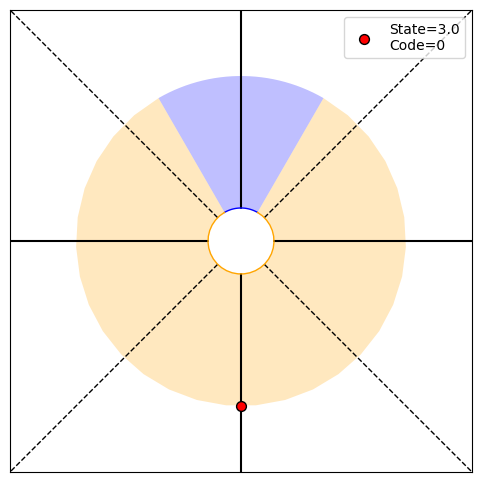

P(O1:22,S22|T)=[0.   0.   0.   0.25], P(O1:22|actions,T)=0.25, P(T|O1:22)=[9.99999046e-01 9.53673407e-07], H22=0.00
PRINT 1: 2.0449328689088202e-05, [2.00189266e-109 0.00000000e+000 1.44656239e-022 2.50000000e-001]
PRINT 2: [9.74782781e-06 9.74782781e-06], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


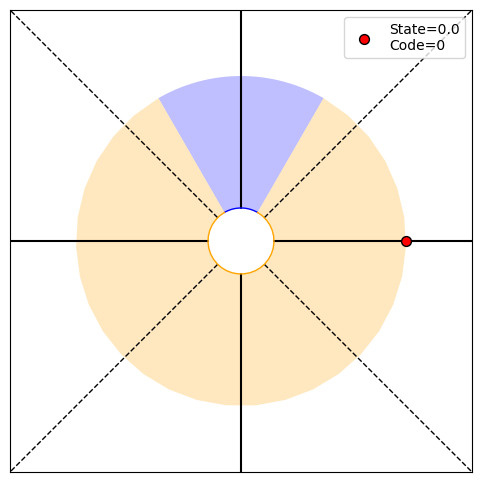

P(O1:23,S23|T)=[0.25 0.   0.   0.  ], P(O1:23|actions,T)=0.25, P(T|O1:23)=[9.99999523e-01 4.76836931e-07], H23=0.00
PRINT 1: 1.070150598685641e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 1.44656239e-22]
PRINT 2: [5.11233457e-06 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


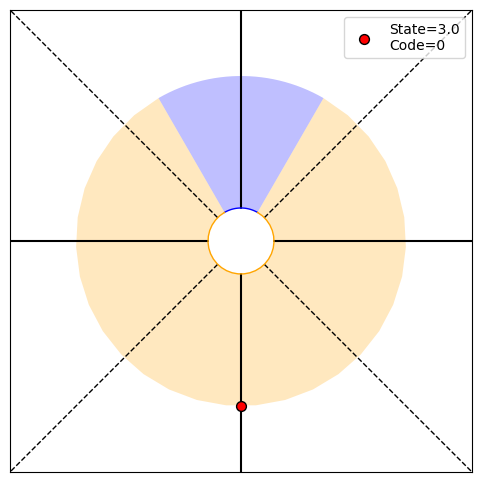

P(O1:24,S24|T)=[0.   0.   0.   0.25], P(O1:24|actions,T)=0.25, P(T|O1:24)=[9.99999762e-01 2.38418522e-07], H24=0.00
PRINT 1: 5.589172750401203e-06, [2.66919022e-109 0.00000000e+000 1.92874985e-022 2.50000000e-001]
PRINT 2: [2.67537712e-06 2.67537712e-06], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


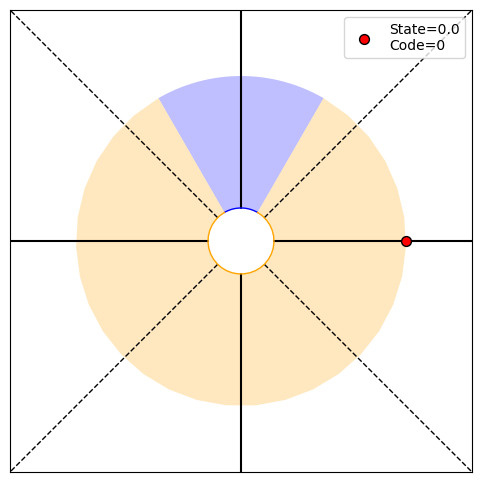

P(O1:25,S25|T)=[0.25 0.   0.   0.  ], P(O1:25|actions,T)=0.25, P(T|O1:25)=[9.99999881e-01 1.19209275e-07], H25=0.00
PRINT 1: 2.9137959734301916e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 1.92874985e-22]
PRINT 2: [1.39729335e-06 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


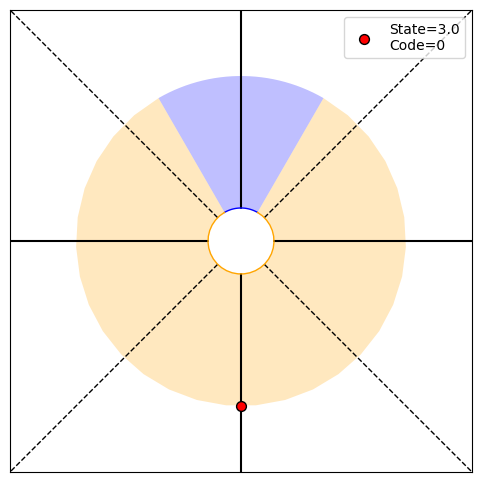

P(O1:26,S26|T)=[0.   0.   0.   0.25], P(O1:26|actions,T)=0.25, P(T|O1:26)=[9.99999940e-01 5.96046412e-08], H26=0.00
PRINT 1: 1.516502712212915e-06, [3.33648777e-109 0.00000000e+000 2.41093731e-022 2.50000000e-001]
PRINT 2: [7.28449036e-07 7.28449036e-07], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


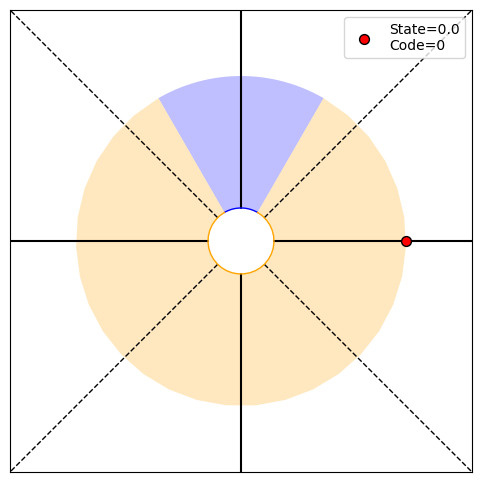

P(O1:27,S27|T)=[0.25 0.   0.   0.  ], P(O1:27|actions,T)=0.25, P(T|O1:27)=[9.99999970e-01 2.98023215e-08], H27=0.00
PRINT 1: 7.880536995629398e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.41093731e-22]
PRINT 2: [3.79125689e-07 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


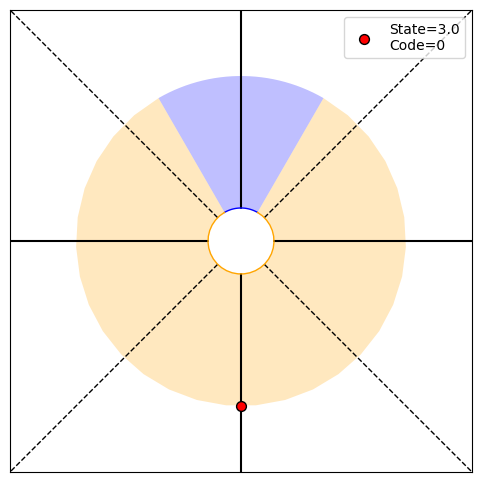

P(O1:28,S28|T)=[0.   0.   0.   0.25], P(O1:28|actions,T)=0.25, P(T|O1:28)=[9.99999985e-01 1.49011610e-08], H28=0.00
PRINT 1: 4.0892801646455924e-07, [4.00378532e-109 0.00000000e+000 2.89312477e-022 2.50000000e-001]
PRINT 2: [1.97013428e-07 1.97013428e-07], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


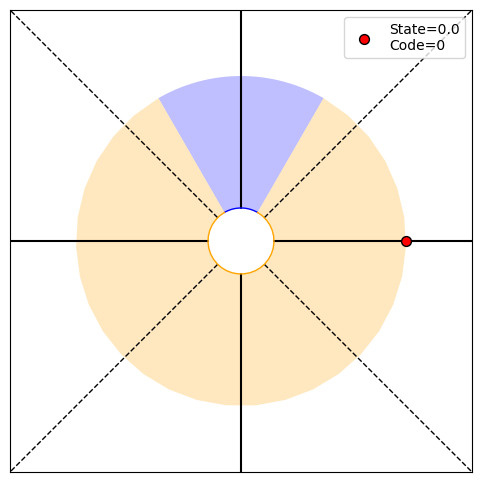

P(O1:29,S29|T)=[0.25 0.   0.   0.  ], P(O1:29|actions,T)=0.25, P(T|O1:29)=[9.99999993e-01 7.45058054e-09], H29=0.00
PRINT 1: 2.1191459017693936e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.89312477e-22]
PRINT 2: [1.02232005e-07 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


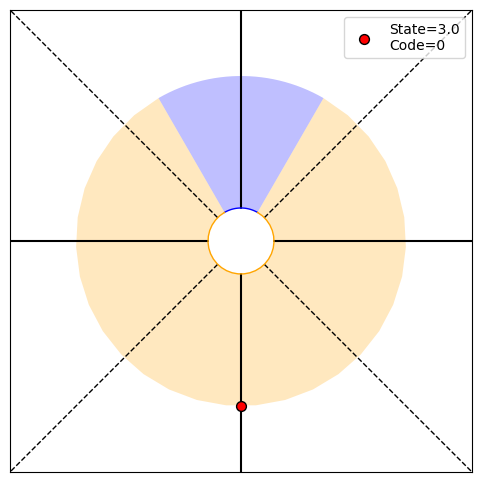

P(O1:30,S30|T)=[0.   0.   0.   0.25], P(O1:30|actions,T)=0.25, P(T|O1:30)=[9.99999996e-01 3.72529028e-09], H30=0.00
PRINT 1: 1.09682585817829e-07, [4.67108288e-109 0.00000000e+000 3.37531223e-022 2.50000000e-001]
PRINT 2: [5.29786478e-08 5.29786478e-08], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


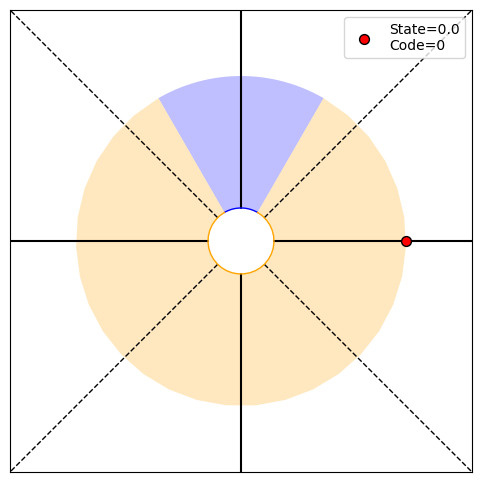

P(O1:31,S31|T)=[0.25 0.   0.   0.  ], P(O1:31|actions,T)=0.25, P(T|O1:31)=[9.99999998e-01 1.86264515e-09], H31=0.00
PRINT 1: 5.6703938149317856e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 3.37531223e-22]
PRINT 2: [2.74206465e-08 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


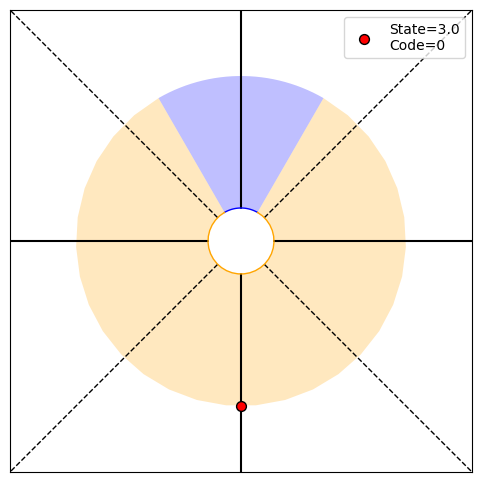

P(O1:32,S32|T)=[0.   0.   0.   0.25], P(O1:32|actions,T)=0.25, P(T|O1:32)=[9.99999999e-01 9.31322574e-10], H32=0.00
PRINT 1: 2.9283291672934866e-08, [5.33838043e-109 0.00000000e+000 3.85749970e-022 2.50000000e-001]
PRINT 2: [1.41759846e-08 1.41759846e-08], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


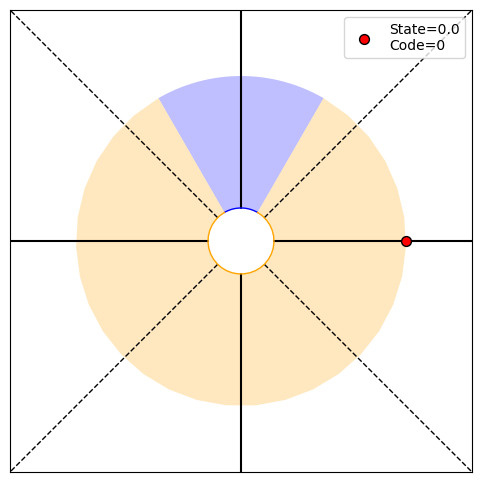

P(O1:33,S33|T)=[0.25 0.   0.   0.  ], P(O1:33|actions,T)=0.25, P(T|O1:33)=[1.00000000e+00 4.65661287e-10], H33=0.00
PRINT 1: 1.5107307129907126e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 3.85749970e-22]
PRINT 2: [7.32082292e-09 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


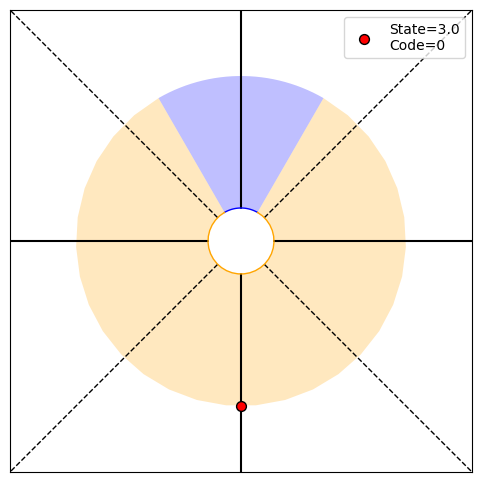

P(O1:34,S34|T)=[0.   0.   0.   0.25], P(O1:34|actions,T)=0.25, P(T|O1:34)=[1.00000000e+00 2.32830644e-10], H34=0.00
PRINT 1: 7.786484210194632e-09, [6.00567798e-109 0.00000000e+000 4.33968716e-022 2.50000000e-001]
PRINT 2: [3.77682678e-09 3.77682678e-09], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


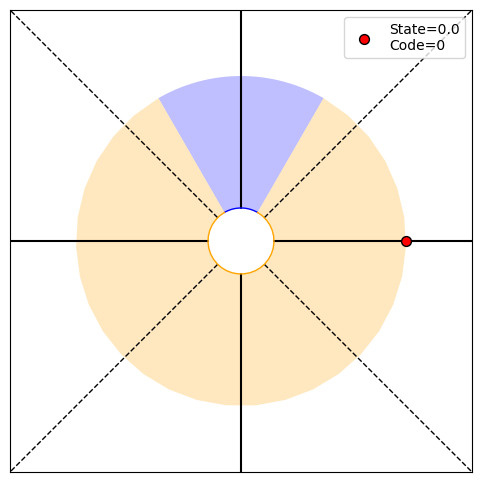

P(O1:35,S35|T)=[0.25 0.   0.   0.  ], P(O1:35|actions,T)=0.25, P(T|O1:35)=[1.00000000e+00 1.16415322e-10], H35=0.00
PRINT 1: 4.009657427334603e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.33968716e-22]
PRINT 2: [1.94662105e-09 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


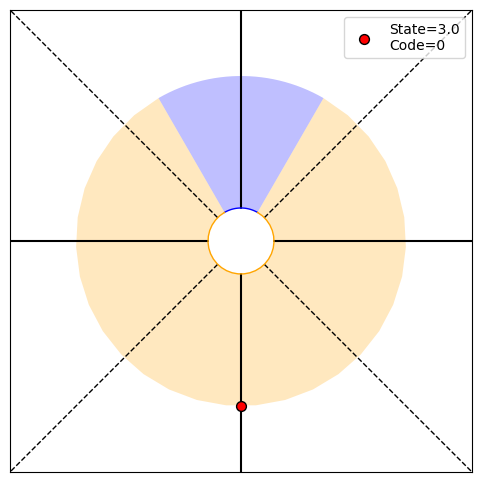

P(O1:36,S36|T)=[0.   0.   0.   0.25], P(O1:36|actions,T)=0.25, P(T|O1:36)=[1.00000000e+00 5.82076609e-11], H36=0.00
PRINT 1: 2.0630363746867455e-09, [6.67297554e-109 0.00000000e+000 4.82187462e-022 2.50000000e-001]
PRINT 2: [1.00241436e-09 1.00241436e-09], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


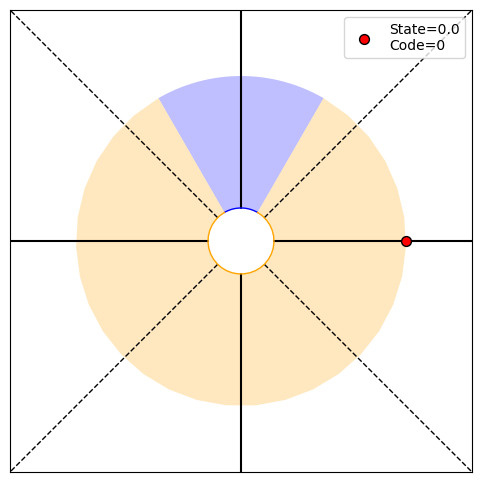

P(O1:37,S37|T)=[0.25 0.   0.   0.  ], P(O1:37|actions,T)=0.25, P(T|O1:37)=[1.00000000e+00 2.91038305e-11], H37=0.00
PRINT 1: 1.0606220178274472e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-22]
PRINT 2: [5.15759094e-10 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


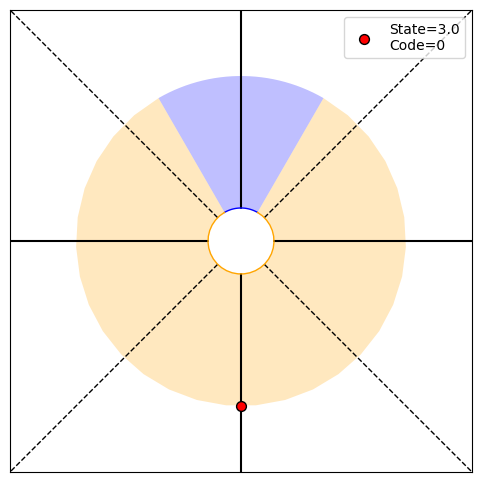

P(O1:38,S38|T)=[0.   0.   0.   0.25], P(O1:38|actions,T)=0.25, P(T|O1:38)=[1.00000000e+00 1.45519152e-11], H38=0.00
PRINT 1: 5.448629241491376e-10, [7.34027309e-109 0.00000000e+000 5.30406208e-022 2.50000000e-001]
PRINT 2: [2.65155504e-10 2.65155504e-10], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


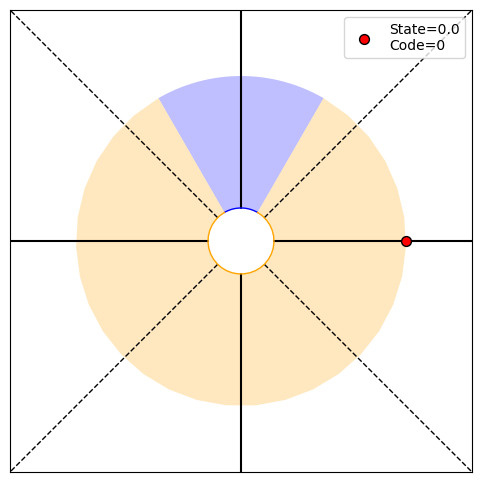

P(O1:39,S39|T)=[0.25 0.   0.   0.  ], P(O1:39|actions,T)=0.25, P(T|O1:39)=[1.00000000e+00 7.27595761e-12], H39=0.00
PRINT 1: 2.7970741969056687e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 5.30406208e-22]
PRINT 2: [1.36215731e-10 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


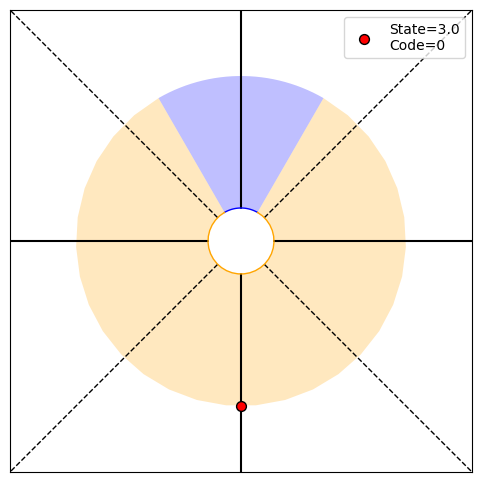

P(O1:40,S40|T)=[0.   0.   0.   0.25], P(O1:40|actions,T)=0.25, P(T|O1:40)=[1.00000000e+00 3.63797881e-12], H40=0.00
PRINT 1: 1.434916886528421e-10, [8.00757065e-109 0.00000000e+000 5.78624954e-022 2.50000000e-001]
PRINT 2: [6.99268549e-11 6.99268549e-11], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


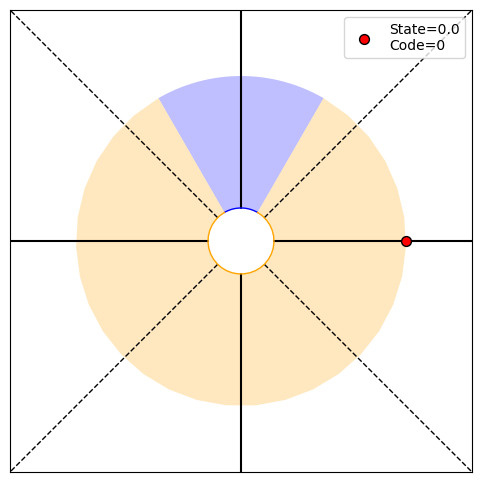

P(O1:41,S41|T)=[0.25 0.   0.   0.  ], P(O1:41|actions,T)=0.25, P(T|O1:41)=[1.0000000e+00 1.8189894e-12], H41=0.00
PRINT 1: 7.356483373008692e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 5.78624954e-22]
PRINT 2: [3.58729222e-11 3.58729221e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


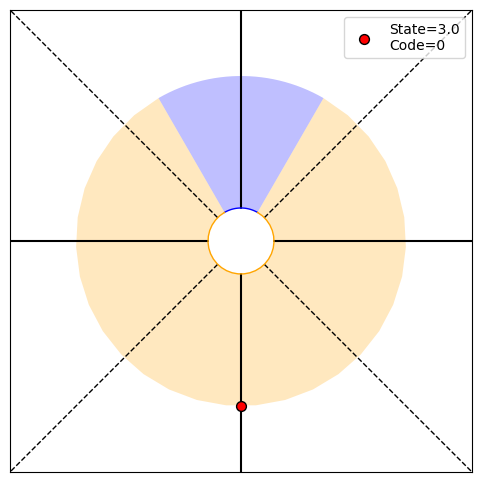

P(O1:42,S42|T)=[0.   0.   0.   0.25], P(O1:42|actions,T)=0.25, P(T|O1:42)=[1.00000000e+00 9.09494702e-13], H42=0.00
PRINT 1: 3.7691911566847234e-11, [8.67486820e-109 0.00000000e+000 6.26843701e-022 2.50000000e-001]
PRINT 2: [1.83912084e-11 1.83912084e-11], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


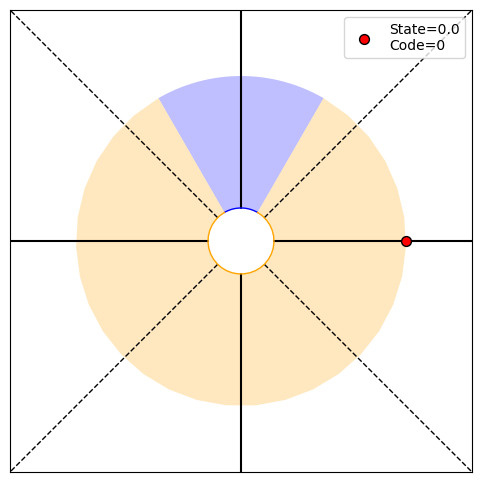

P(O1:43,S43|T)=[0.25 0.   0.   0.  ], P(O1:43|actions,T)=0.25, P(T|O1:43)=[1.00000000e+00 4.54747351e-13], H43=0.00
PRINT 1: 1.9300703134317994e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 6.26843701e-22]
PRINT 2: [9.42297789e-12 9.42297782e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


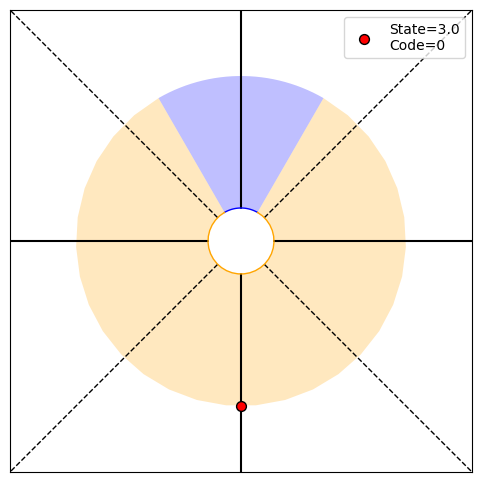

P(O1:44,S44|T)=[0.   0.   0.   0.25], P(O1:44|actions,T)=0.25, P(T|O1:44)=[1.00000000e+00 2.27373675e-13], H44=0.00
PRINT 1: 9.87772524260426e-12, [9.34216575e-109 0.00000000e+000 6.75062447e-022 2.50000000e-001]
PRINT 2: [4.82517571e-12 4.82517578e-12], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


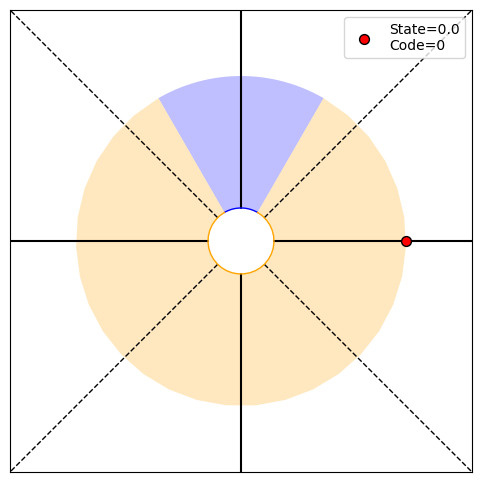

P(O1:45,S45|T)=[0.25 0.   0.   0.  ], P(O1:45|actions,T)=0.25, P(T|O1:45)=[1.00000000e+00 1.13686838e-13], H45=0.00
PRINT 1: 5.052549459024266e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 6.75062447e-22]
PRINT 2: [2.46943131e-12 2.46943124e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


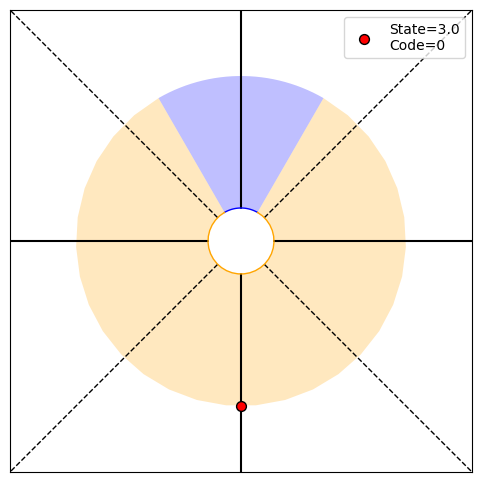

P(O1:46,S46|T)=[0.   0.   0.   0.25], P(O1:46|actions,T)=0.25, P(T|O1:46)=[1.00000000e+00 5.68434189e-14], H46=0.00
PRINT 1: 2.583118148373075e-12, [1.00094633e-108 0.00000000e+000 7.23281193e-022 2.50000000e-001]
PRINT 2: [1.26313729e-12 1.26313736e-12], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


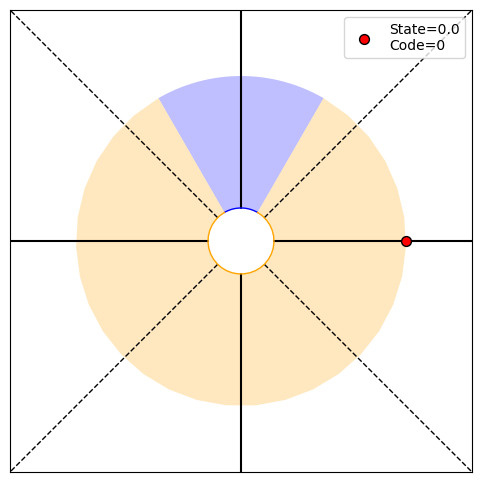

P(O1:47,S47|T)=[0.25 0.   0.   0.  ], P(O1:47|actions,T)=0.25, P(T|O1:47)=[1.00000000e+00 2.84217094e-14], H47=0.00
PRINT 1: 1.3199807836169755e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 7.23281193e-22]
PRINT 2: [6.45779537e-13 6.45779469e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


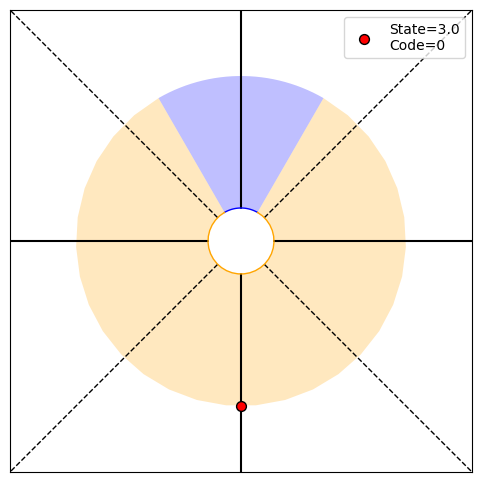

P(O1:48,S48|T)=[0.   0.   0.   0.25], P(O1:48|actions,T)=0.25, P(T|O1:48)=[1.00000000e+00 1.42108547e-14], H48=0.00
PRINT 1: 6.742012465236986e-13, [1.06767609e-108 0.00000000e+000 7.71499939e-022 2.50000000e-001]
PRINT 2: [3.29995126e-13 3.29995196e-13], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


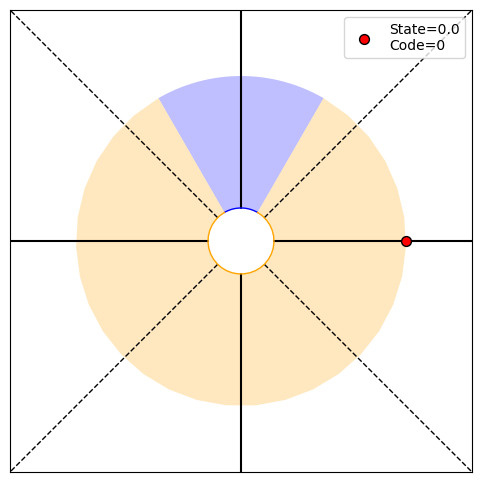

P(O1:49,S49|T)=[0.25 0.   0.   0.  ], P(O1:49|actions,T)=0.25, P(T|O1:49)=[1.00000000e+00 7.10542736e-15], H49=0.00
PRINT 1: 3.4420605061945245e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 7.71499939e-22]
PRINT 2: [1.68550312e-13 1.68550245e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


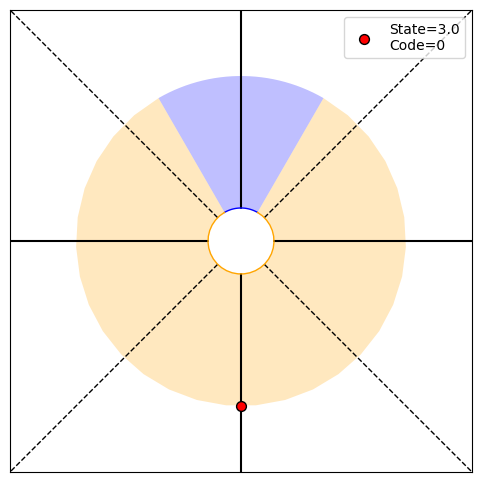

P(O1:50,S50|T)=[0.   0.   0.   0.25], P(O1:50|actions,T)=0.25, P(T|O1:50)=[1.00000000e+00 3.55271368e-15], H50=0.00
PRINT 1: 1.7565573898852733e-13, [1.13440584e-108 0.00000000e+000 8.19718685e-022 2.50000000e-001]
PRINT 2: [8.60514455e-14 8.60515127e-14], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


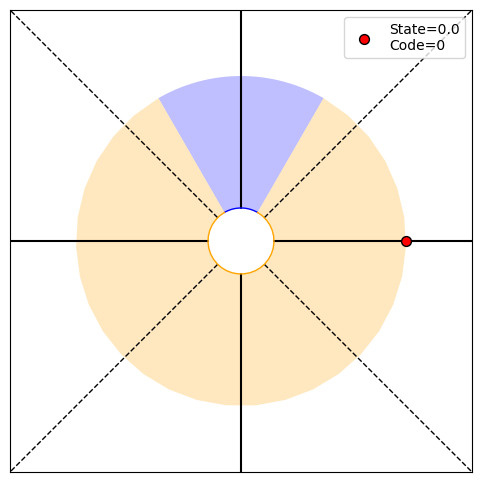

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: 90.0, Code received: 1.0


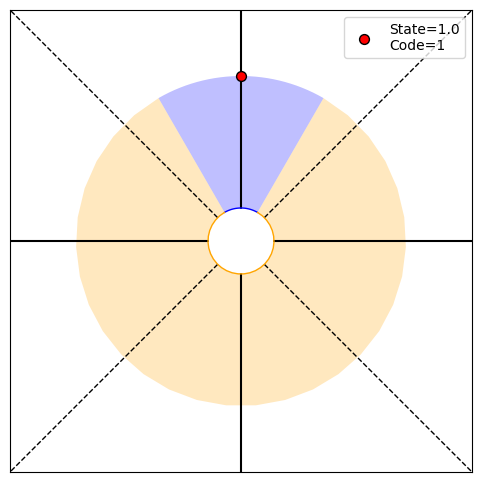

P(O1:2,S2|T)=[0.   0.25 0.   0.  ], P(O1:2|actions,T)=0.25, P(T|O1:2)=[0.5 0.5], H2=1.00
PRINT 1: 1.0, [0.   0.25 0.   0.  ]
PRINT 2: [0.31127812 0.31127812], [0.5 0.5]
Choosing randomly
Current angle: 0.0, Code received: 0.0


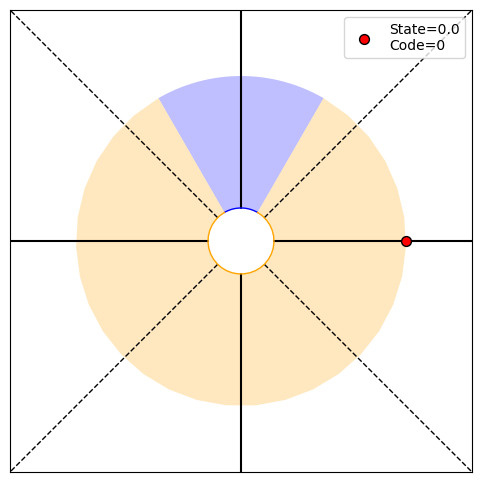

P(O1:3,S3|T)=[0.25 0.   0.   0.  ], P(O1:3|actions,T)=0.25, P(T|O1:3)=[0.66666667 0.33333333], H3=0.92
PRINT 1: 0.9182958340544896, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.31668909 0.31668909], [0.66666667 0.33333333]
Choosing randomly
Current angle: -90.0, Code received: 0.0


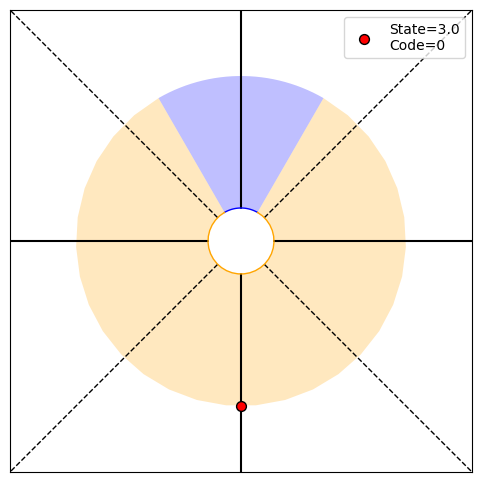

P(O1:4,S4|T)=[0.   0.   0.   0.25], P(O1:4|actions,T)=0.25, P(T|O1:4)=[0.8 0.2], H4=0.72
PRINT 1: 0.7219280948873623, [1.33459511e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [0.26899559 0.26899559], [0.8 0.2]
Choosing randomly
Current angle: 0.0, Code received: 0.0


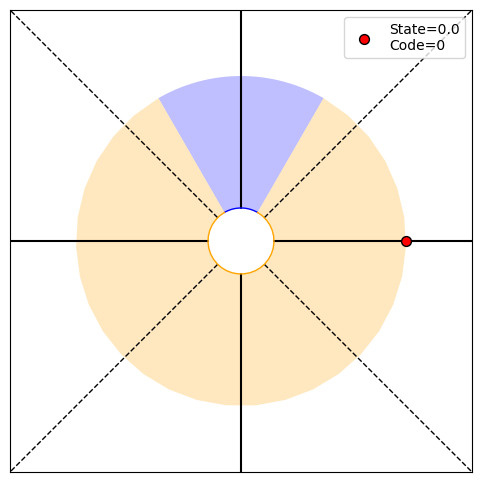

P(O1:5,S5|T)=[0.25 0.   0.   0.  ], P(O1:5|actions,T)=0.25, P(T|O1:5)=[0.88888889 0.11111111], H5=0.50
PRINT 1: 0.5032583347756456, [2.50000000e-01 0.00000000e+00 3.45974132e-88 9.64374924e-23]
PRINT 2: [0.19843232 0.19843232], [0.88888889 0.11111111]
Choosing randomly
Current angle: -90.0, Code received: 0.0


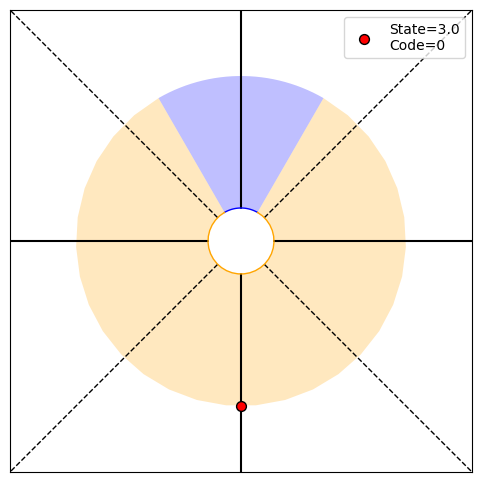

P(O1:6,S6|T)=[0.   0.   0.   0.25], P(O1:6|actions,T)=0.25, P(T|O1:6)=[0.94117647 0.05882353], H6=0.32
PRINT 1: 0.3227569588973982, [2.00189266e-109 0.00000000e+000 1.44656239e-022 2.50000000e-001]
PRINT 2: [0.13260973 0.13260973], [0.94117647 0.05882353]
Choosing randomly
Current angle: 0.0, Code received: 0.0


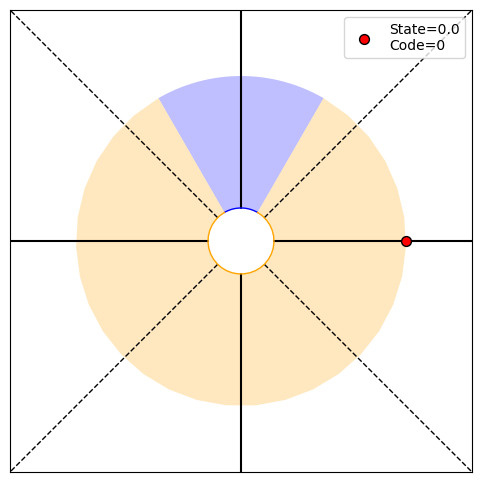

P(O1:7,S7|T)=[0.25 0.   0.   0.  ], P(O1:7|actions,T)=0.25, P(T|O1:7)=[0.96969697 0.03030303], H7=0.20
PRINT 1: 0.19590927087360493, [2.50000000e-01 0.00000000e+00 3.45974132e-88 1.44656239e-22]
PRINT 2: [0.08297127 0.08297127], [0.96969697 0.03030303]
Choosing randomly
Current angle: 90.0, Code received: 1.0


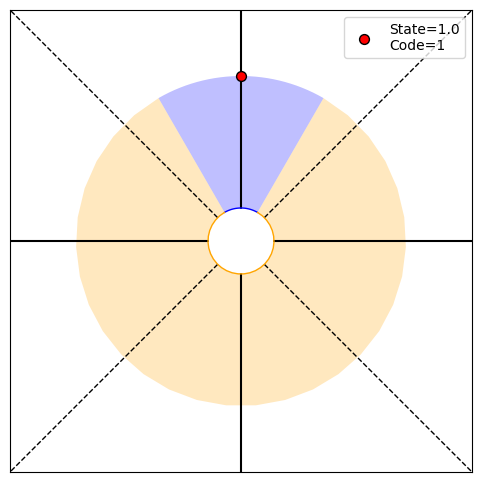

P(O1:8,S8|T)=[0.   0.25 0.   0.  ], P(O1:8|actions,T)=0.25, P(T|O1:8)=[0.98461538 0.01538462], H8=0.11
PRINT 1: 0.11467550533614673, [0.   0.25 0.   0.  ]
PRINT 2: [0.04968846 0.04968846], [0.98461538 0.01538462]
Choosing randomly
Current angle: 180.0, Code received: 0.0


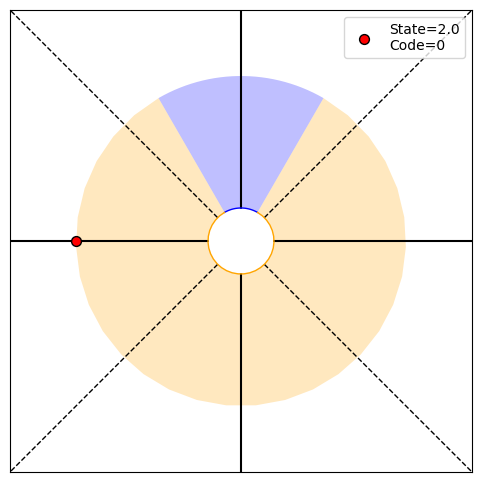

P(O1:9,S9|T)=[0.   0.   0.25 0.  ], P(O1:9|actions,T)=0.25, P(T|O1:9)=[0.99224806 0.00775194], H9=0.07
PRINT 1: 0.065490821314727, [3.45974132e-88 0.00000000e+00 2.50000000e-01 4.82187462e-23]
PRINT 2: [0.02888032 0.02888032], [0.99224806 0.00775194]
Choosing randomly
Current angle: 270.0, Code received: 0.0


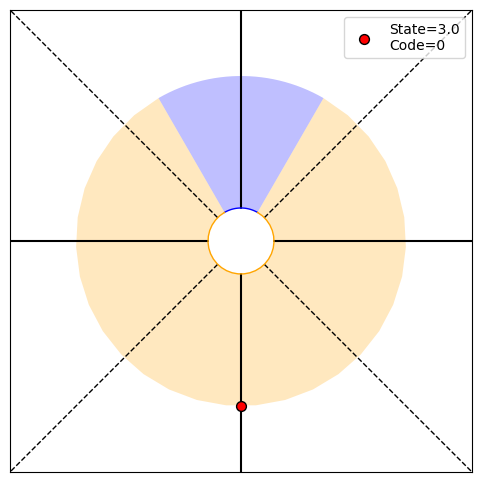

P(O1:10,S10|T)=[0.   0.   0.   0.25], P(O1:10|actions,T)=0.25, P(T|O1:10)=[0.99610895 0.00389105], H10=0.04
PRINT 1: 0.03675295386313879, [9.64374924e-023 0.00000000e+000 1.33459511e-109 2.50000000e-001]
PRINT 2: [0.01643369 0.01643369], [0.99610895 0.00389105]
Choosing randomly
Current angle: 360.0, Code received: 0.0


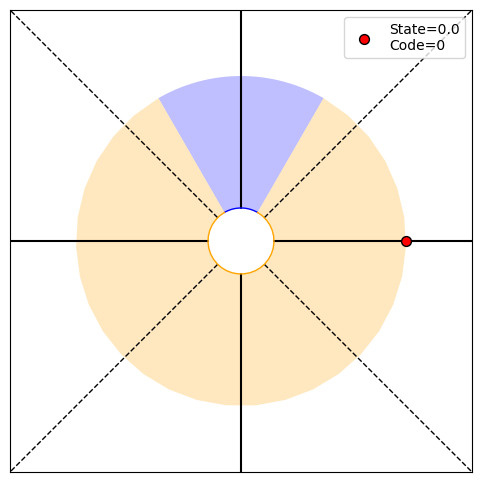

P(O1:11,S11|T)=[0.25 0.   0.   0.  ], P(O1:11|actions,T)=0.25, P(T|O1:11)=[0.99805068 0.00194932], H11=0.02
PRINT 1: 0.020358875256176766, [2.50000000e-001 0.00000000e+000 1.86003799e-044 2.66919022e-109]
PRINT 2: [0.00920546 0.00920546], [0.99805068 0.00194932]
Choosing randomly
Current angle: 270.0, Code received: 0.0


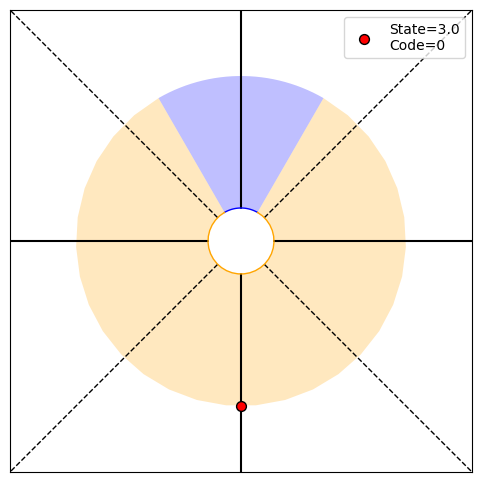

P(O1:12,S12|T)=[0.   0.   0.   0.25], P(O1:12|actions,T)=0.25, P(T|O1:12)=[9.99024390e-01 9.75609756e-04], H12=0.01
PRINT 1: 0.011164291953784, [3.58754799e-66 0.00000000e+00 4.82187462e-23 2.50000000e-01]
PRINT 2: [0.00509451 0.00509451], [9.99024390e-01 9.75609756e-04]
Choosing randomly
Current angle: 360.0, Code received: 0.0


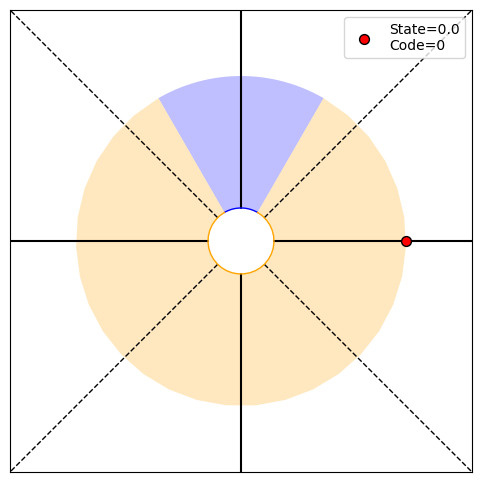

P(O1:13,S13|T)=[0.25 0.   0.   0.  ], P(O1:13|actions,T)=0.25, P(T|O1:13)=[9.99511957e-01 4.88042948e-04], H13=0.01
PRINT 1: 0.006072741436820054, [2.50000000e-01 0.00000000e+00 1.03792240e-87 4.82187462e-23]
PRINT 2: [0.00279239 0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing randomly
Current angle: 270.0, Code received: 0.0


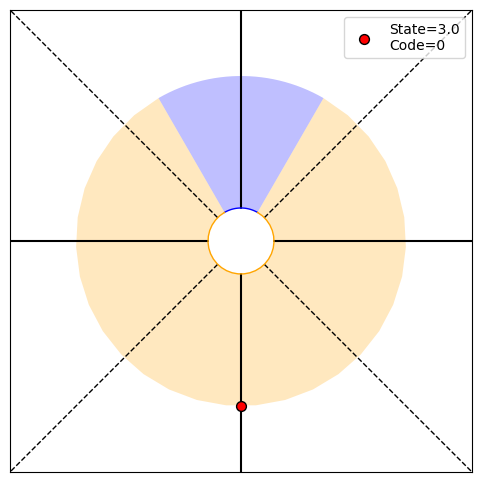

P(O1:14,S14|T)=[0.   0.   0.   0.25], P(O1:14|actions,T)=0.25, P(T|O1:14)=[9.99755919e-01 2.44081035e-04], H14=0.00
PRINT 1: 0.003281149899144082, [2.66919022e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [0.00151855 0.00151855], [9.99755919e-01 2.44081035e-04]
Choosing randomly
Current angle: 360.0, Code received: 0.0


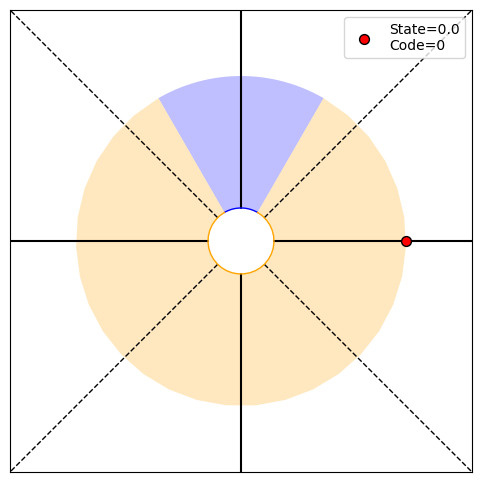

P(O1:15,S15|T)=[0.25 0.   0.   0.  ], P(O1:15|actions,T)=0.25, P(T|O1:15)=[9.99877945e-01 1.22055413e-04], H15=0.00
PRINT 1: 0.0017628198574909618, [2.50000000e-01 0.00000000e+00 3.45974132e-88 9.64374924e-23]
PRINT 2: [0.00082038 0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing randomly
Current angle: 450.0, Code received: 1.0


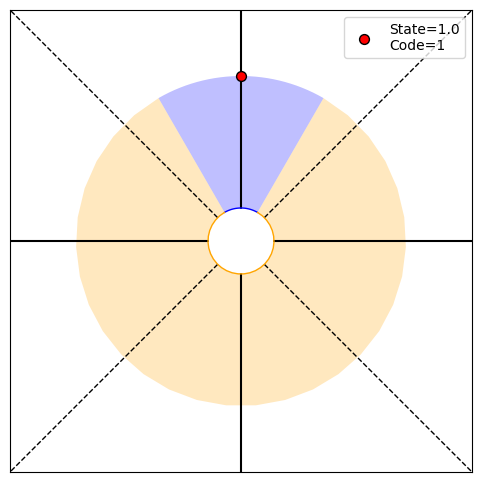

P(O1:16,S16|T)=[0.   0.25 0.   0.  ], P(O1:16|actions,T)=0.25, P(T|O1:16)=[9.99938969e-01 6.10314312e-05], H16=0.00
PRINT 1: 0.0009424924667410556, [0.   0.25 0.   0.  ]
PRINT 2: [0.00044073 0.00044073], [9.99938969e-01 6.10314312e-05]
Choosing randomly
Current angle: 360.0, Code received: 0.0


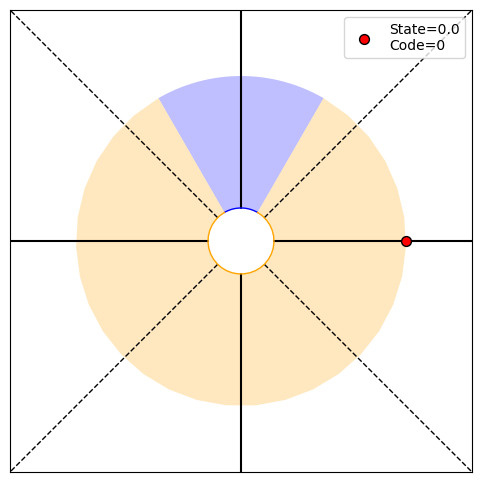

P(O1:17,S17|T)=[0.25 0.   0.   0.  ], P(O1:17|actions,T)=0.25, P(T|O1:17)=[9.99969483e-01 3.05166468e-05], H17=0.00
PRINT 1: 0.0005017765892900114, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [0.00023563 0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing randomly
Current angle: 450.0, Code received: 1.0


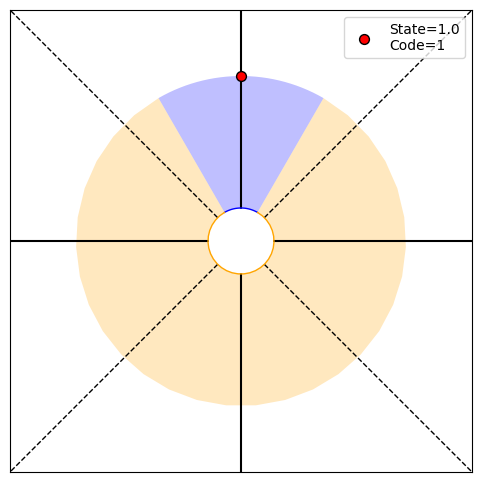

P(O1:18,S18|T)=[0.   0.25 0.   0.  ], P(O1:18|actions,T)=0.25, P(T|O1:18)=[9.99984741e-01 1.52585562e-05], H18=0.00
PRINT 1: 0.0002661505111268847, [0.   0.25 0.   0.  ]
PRINT 2: [0.00012545 0.00012545], [9.99984741e-01 1.52585562e-05]
Choosing randomly
Current angle: 360.0, Code received: 0.0


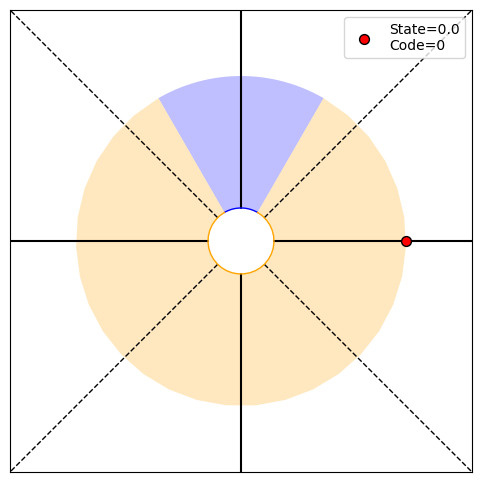

P(O1:19,S19|T)=[0.25 0.   0.   0.  ], P(O1:19|actions,T)=0.25, P(T|O1:19)=[9.99992371e-01 7.62933632e-06], H19=0.00
PRINT 1: 0.00014070556517604537, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-23]
PRINT 2: [6.65381249e-05 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing randomly
Current angle: 270.0, Code received: 0.0


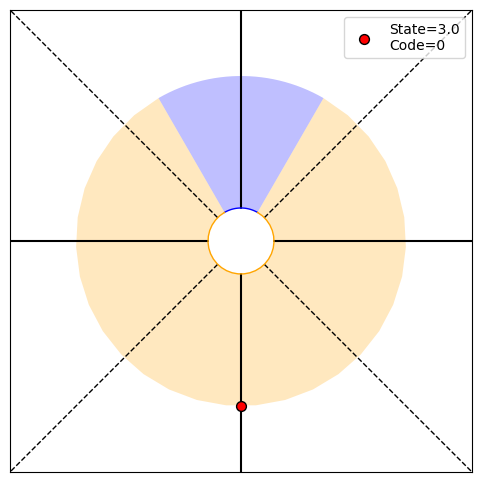

P(O1:20,S20|T)=[0.   0.   0.   0.25], P(O1:20|actions,T)=0.25, P(T|O1:20)=[9.99996185e-01 3.81468271e-06], H20=0.00
PRINT 1: 7.416772317850377e-05, [1.33459511e-109 0.00000000e+000 9.64374924e-023 2.50000000e-001]
PRINT 2: [3.51765229e-05 3.51765229e-05], [9.99996185e-01 3.81468271e-06]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


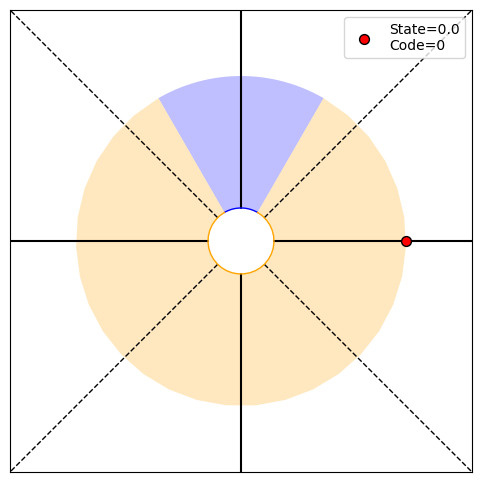

P(O1:21,S21|T)=[0.25 0.   0.   0.  ], P(O1:21|actions,T)=0.25, P(T|O1:21)=[9.99998093e-01 1.90734499e-06], H21=0.00
PRINT 1: 3.899127469152328e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 9.64374924e-23]
PRINT 2: [1.85419655e-05 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


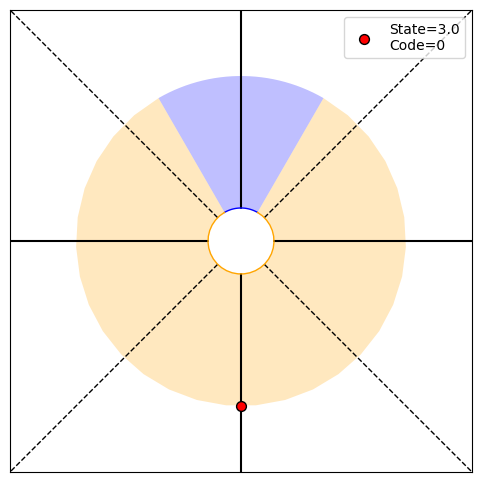

P(O1:22,S22|T)=[0.   0.   0.   0.25], P(O1:22|actions,T)=0.25, P(T|O1:22)=[9.99999046e-01 9.53673407e-07], H22=0.00
PRINT 1: 2.0449328689088202e-05, [2.00189266e-109 0.00000000e+000 1.44656239e-022 2.50000000e-001]
PRINT 2: [9.74782781e-06 9.74782781e-06], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


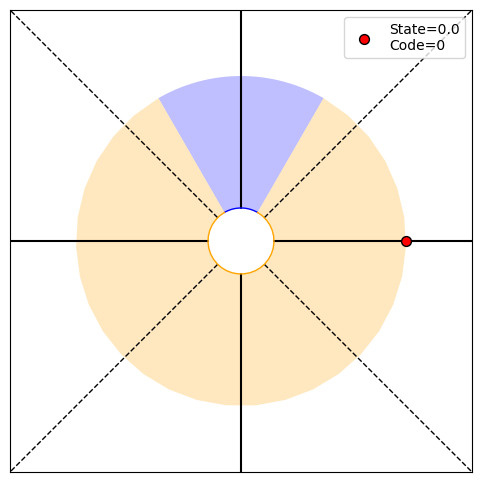

P(O1:23,S23|T)=[0.25 0.   0.   0.  ], P(O1:23|actions,T)=0.25, P(T|O1:23)=[9.99999523e-01 4.76836931e-07], H23=0.00
PRINT 1: 1.070150598685641e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 1.44656239e-22]
PRINT 2: [5.11233457e-06 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


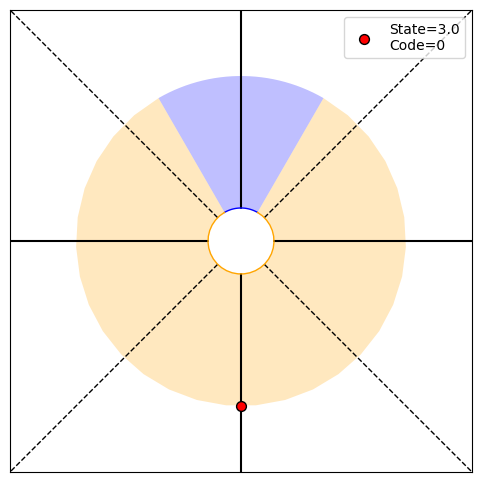

P(O1:24,S24|T)=[0.   0.   0.   0.25], P(O1:24|actions,T)=0.25, P(T|O1:24)=[9.99999762e-01 2.38418522e-07], H24=0.00
PRINT 1: 5.589172750401203e-06, [2.66919022e-109 0.00000000e+000 1.92874985e-022 2.50000000e-001]
PRINT 2: [2.67537712e-06 2.67537712e-06], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


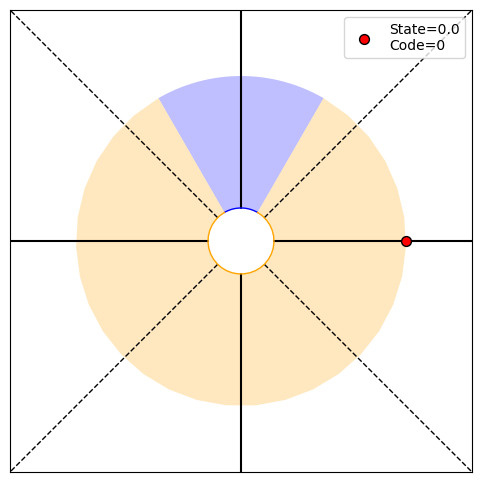

P(O1:25,S25|T)=[0.25 0.   0.   0.  ], P(O1:25|actions,T)=0.25, P(T|O1:25)=[9.99999881e-01 1.19209275e-07], H25=0.00
PRINT 1: 2.9137959734301916e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 1.92874985e-22]
PRINT 2: [1.39729335e-06 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


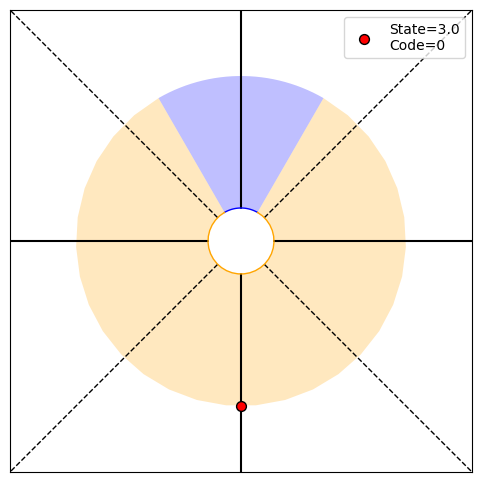

P(O1:26,S26|T)=[0.   0.   0.   0.25], P(O1:26|actions,T)=0.25, P(T|O1:26)=[9.99999940e-01 5.96046412e-08], H26=0.00
PRINT 1: 1.516502712212915e-06, [3.33648777e-109 0.00000000e+000 2.41093731e-022 2.50000000e-001]
PRINT 2: [7.28449036e-07 7.28449036e-07], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


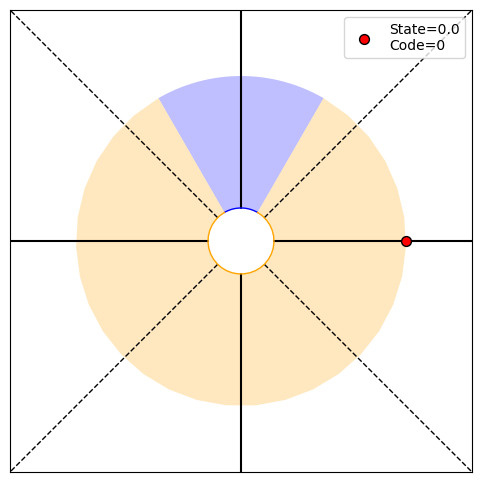

P(O1:27,S27|T)=[0.25 0.   0.   0.  ], P(O1:27|actions,T)=0.25, P(T|O1:27)=[9.99999970e-01 2.98023215e-08], H27=0.00
PRINT 1: 7.880536995629398e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.41093731e-22]
PRINT 2: [3.79125689e-07 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


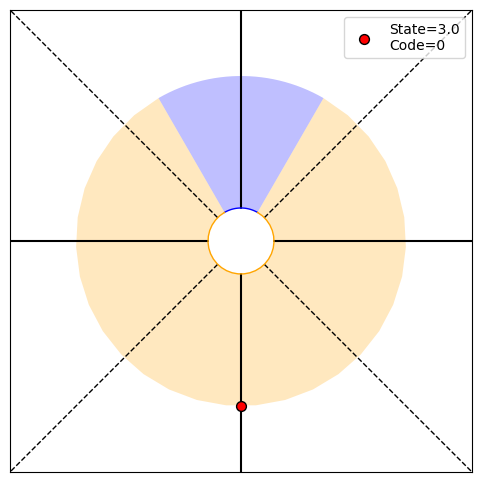

P(O1:28,S28|T)=[0.   0.   0.   0.25], P(O1:28|actions,T)=0.25, P(T|O1:28)=[9.99999985e-01 1.49011610e-08], H28=0.00
PRINT 1: 4.0892801646455924e-07, [4.00378532e-109 0.00000000e+000 2.89312477e-022 2.50000000e-001]
PRINT 2: [1.97013428e-07 1.97013428e-07], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


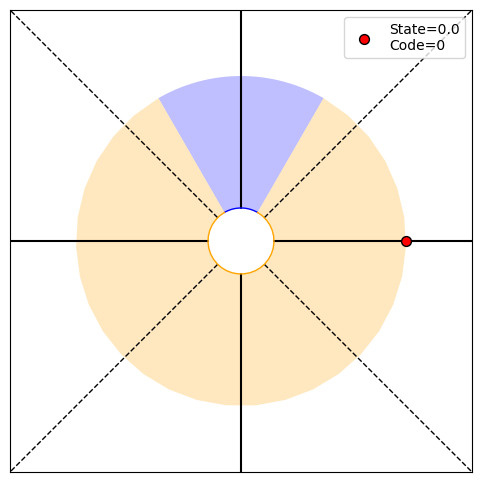

P(O1:29,S29|T)=[0.25 0.   0.   0.  ], P(O1:29|actions,T)=0.25, P(T|O1:29)=[9.99999993e-01 7.45058054e-09], H29=0.00
PRINT 1: 2.1191459017693936e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.89312477e-22]
PRINT 2: [1.02232005e-07 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


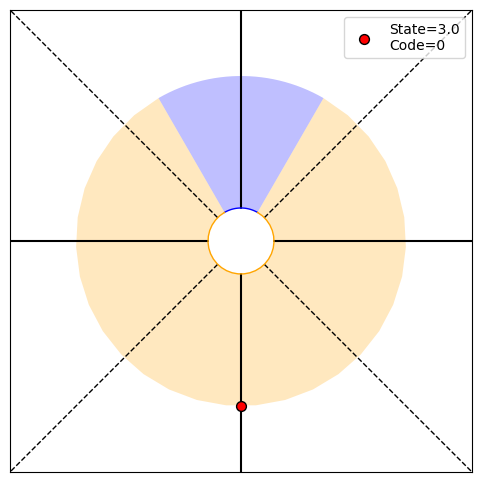

P(O1:30,S30|T)=[0.   0.   0.   0.25], P(O1:30|actions,T)=0.25, P(T|O1:30)=[9.99999996e-01 3.72529028e-09], H30=0.00
PRINT 1: 1.09682585817829e-07, [4.67108288e-109 0.00000000e+000 3.37531223e-022 2.50000000e-001]
PRINT 2: [5.29786478e-08 5.29786478e-08], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


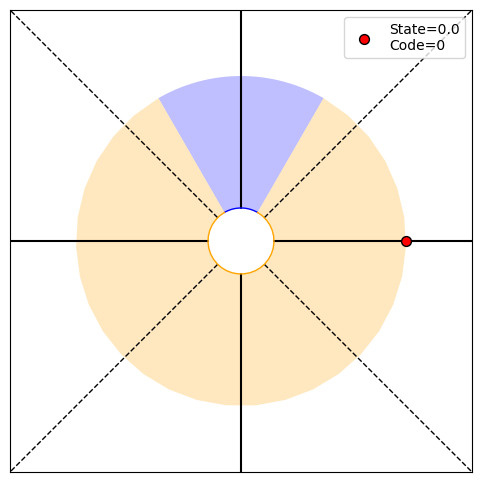

P(O1:31,S31|T)=[0.25 0.   0.   0.  ], P(O1:31|actions,T)=0.25, P(T|O1:31)=[9.99999998e-01 1.86264515e-09], H31=0.00
PRINT 1: 5.6703938149317856e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 3.37531223e-22]
PRINT 2: [2.74206465e-08 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


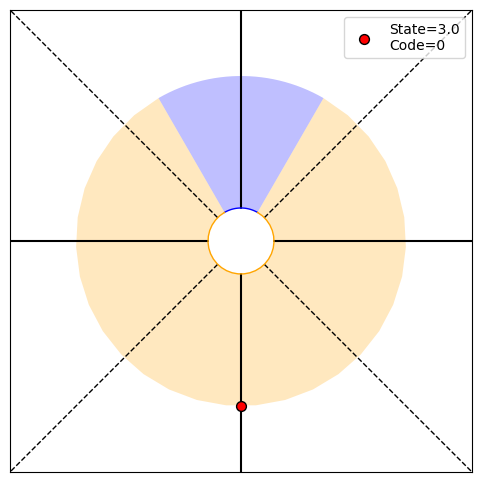

P(O1:32,S32|T)=[0.   0.   0.   0.25], P(O1:32|actions,T)=0.25, P(T|O1:32)=[9.99999999e-01 9.31322574e-10], H32=0.00
PRINT 1: 2.9283291672934866e-08, [5.33838043e-109 0.00000000e+000 3.85749970e-022 2.50000000e-001]
PRINT 2: [1.41759846e-08 1.41759846e-08], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


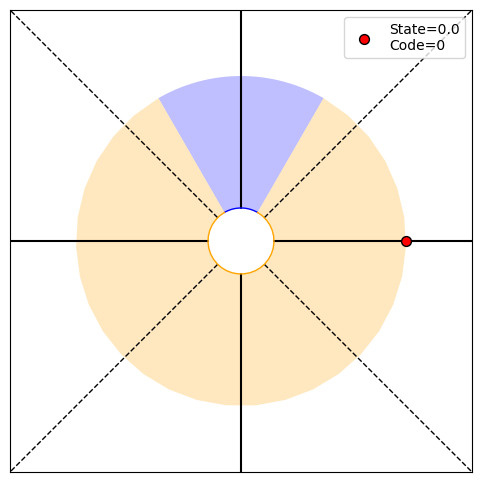

P(O1:33,S33|T)=[0.25 0.   0.   0.  ], P(O1:33|actions,T)=0.25, P(T|O1:33)=[1.00000000e+00 4.65661287e-10], H33=0.00
PRINT 1: 1.5107307129907126e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 3.85749970e-22]
PRINT 2: [7.32082292e-09 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


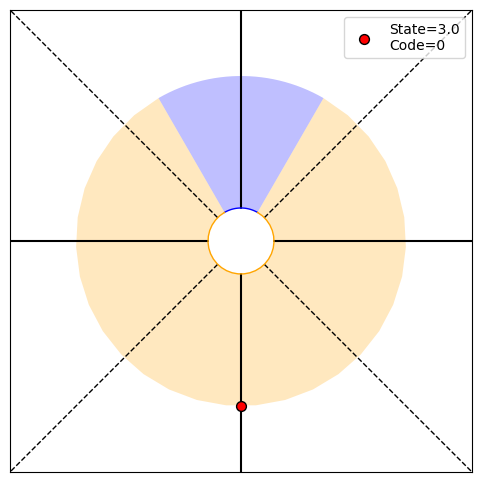

P(O1:34,S34|T)=[0.   0.   0.   0.25], P(O1:34|actions,T)=0.25, P(T|O1:34)=[1.00000000e+00 2.32830644e-10], H34=0.00
PRINT 1: 7.786484210194632e-09, [6.00567798e-109 0.00000000e+000 4.33968716e-022 2.50000000e-001]
PRINT 2: [3.77682678e-09 3.77682678e-09], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


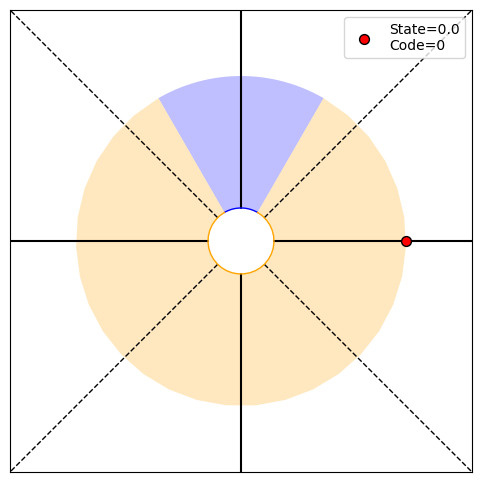

P(O1:35,S35|T)=[0.25 0.   0.   0.  ], P(O1:35|actions,T)=0.25, P(T|O1:35)=[1.00000000e+00 1.16415322e-10], H35=0.00
PRINT 1: 4.009657427334603e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.33968716e-22]
PRINT 2: [1.94662105e-09 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


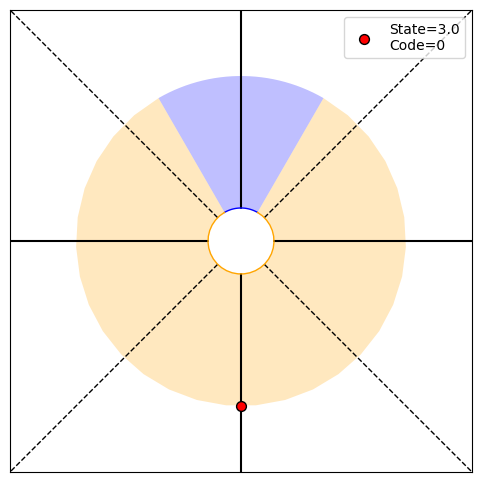

P(O1:36,S36|T)=[0.   0.   0.   0.25], P(O1:36|actions,T)=0.25, P(T|O1:36)=[1.00000000e+00 5.82076609e-11], H36=0.00
PRINT 1: 2.0630363746867455e-09, [6.67297554e-109 0.00000000e+000 4.82187462e-022 2.50000000e-001]
PRINT 2: [1.00241436e-09 1.00241436e-09], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


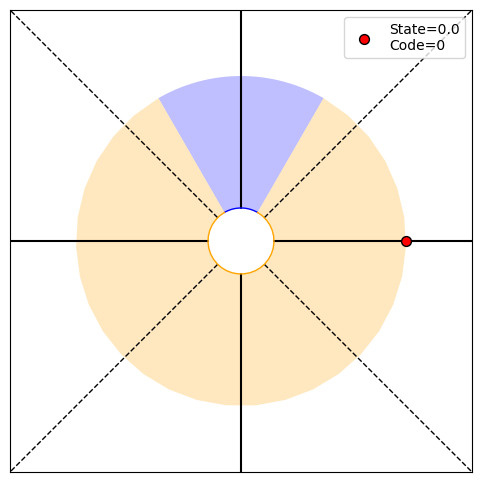

P(O1:37,S37|T)=[0.25 0.   0.   0.  ], P(O1:37|actions,T)=0.25, P(T|O1:37)=[1.00000000e+00 2.91038305e-11], H37=0.00
PRINT 1: 1.0606220178274472e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 4.82187462e-22]
PRINT 2: [5.15759094e-10 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


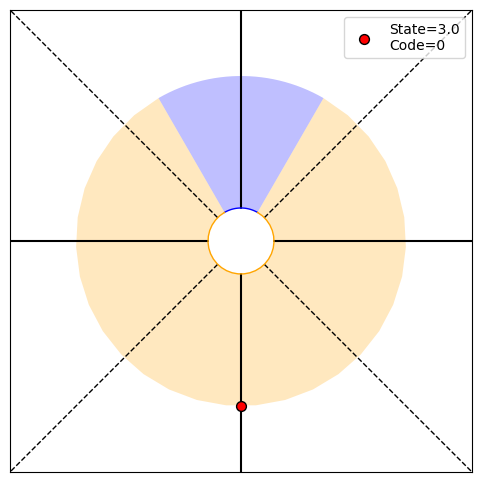

P(O1:38,S38|T)=[0.   0.   0.   0.25], P(O1:38|actions,T)=0.25, P(T|O1:38)=[1.00000000e+00 1.45519152e-11], H38=0.00
PRINT 1: 5.448629241491376e-10, [7.34027309e-109 0.00000000e+000 5.30406208e-022 2.50000000e-001]
PRINT 2: [2.65155504e-10 2.65155504e-10], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


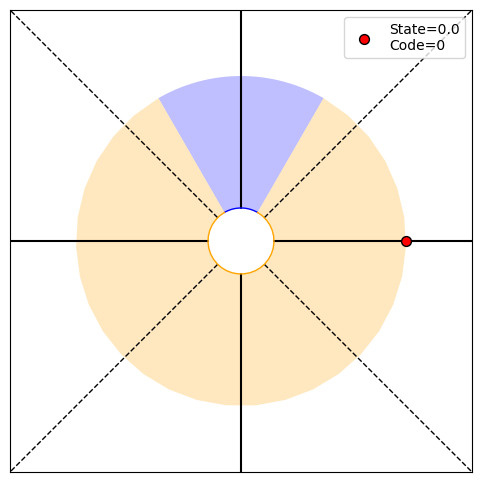

P(O1:39,S39|T)=[0.25 0.   0.   0.  ], P(O1:39|actions,T)=0.25, P(T|O1:39)=[1.00000000e+00 7.27595761e-12], H39=0.00
PRINT 1: 2.7970741969056687e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 5.30406208e-22]
PRINT 2: [1.36215731e-10 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


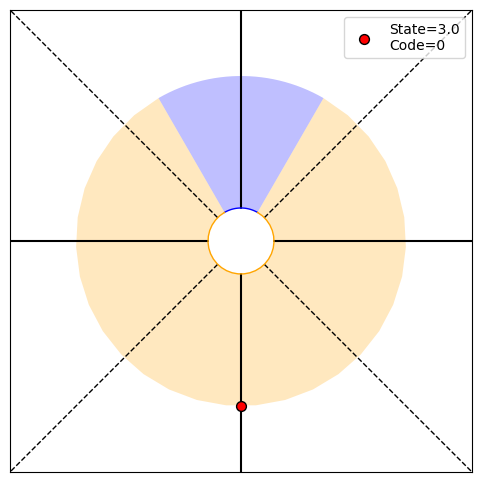

P(O1:40,S40|T)=[0.   0.   0.   0.25], P(O1:40|actions,T)=0.25, P(T|O1:40)=[1.00000000e+00 3.63797881e-12], H40=0.00
PRINT 1: 1.434916886528421e-10, [8.00757065e-109 0.00000000e+000 5.78624954e-022 2.50000000e-001]
PRINT 2: [6.99268549e-11 6.99268549e-11], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


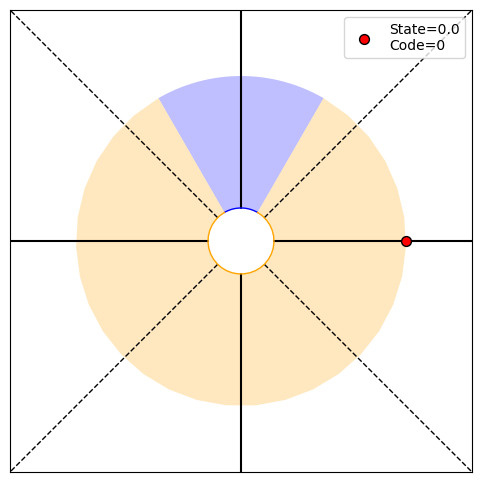

P(O1:41,S41|T)=[0.25 0.   0.   0.  ], P(O1:41|actions,T)=0.25, P(T|O1:41)=[1.0000000e+00 1.8189894e-12], H41=0.00
PRINT 1: 7.356483373008692e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 5.78624954e-22]
PRINT 2: [3.58729222e-11 3.58729221e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


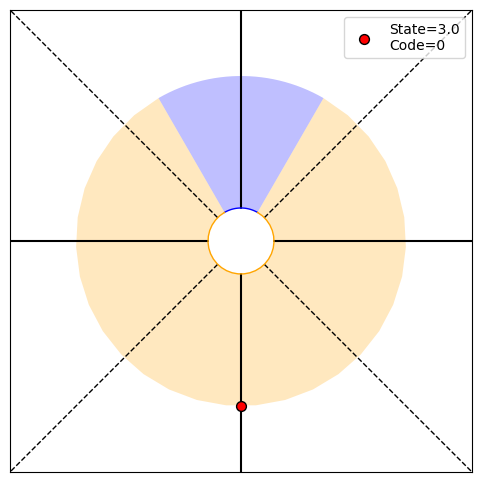

P(O1:42,S42|T)=[0.   0.   0.   0.25], P(O1:42|actions,T)=0.25, P(T|O1:42)=[1.00000000e+00 9.09494702e-13], H42=0.00
PRINT 1: 3.7691911566847234e-11, [8.67486820e-109 0.00000000e+000 6.26843701e-022 2.50000000e-001]
PRINT 2: [1.83912084e-11 1.83912084e-11], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


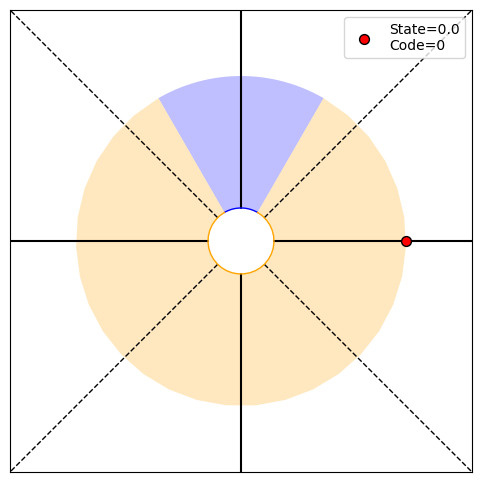

P(O1:43,S43|T)=[0.25 0.   0.   0.  ], P(O1:43|actions,T)=0.25, P(T|O1:43)=[1.00000000e+00 4.54747351e-13], H43=0.00
PRINT 1: 1.9300703134317994e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 6.26843701e-22]
PRINT 2: [9.42297789e-12 9.42297782e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


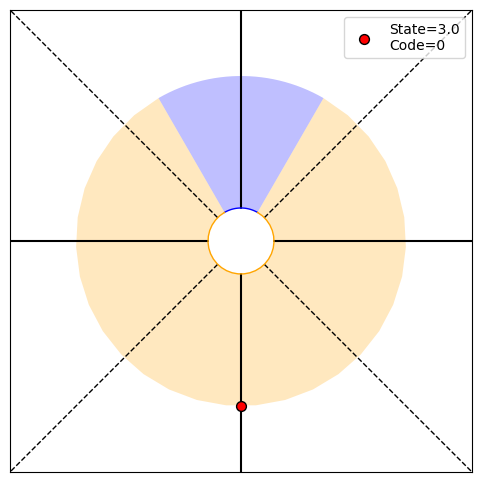

P(O1:44,S44|T)=[0.   0.   0.   0.25], P(O1:44|actions,T)=0.25, P(T|O1:44)=[1.00000000e+00 2.27373675e-13], H44=0.00
PRINT 1: 9.87772524260426e-12, [9.34216575e-109 0.00000000e+000 6.75062447e-022 2.50000000e-001]
PRINT 2: [4.82517571e-12 4.82517578e-12], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


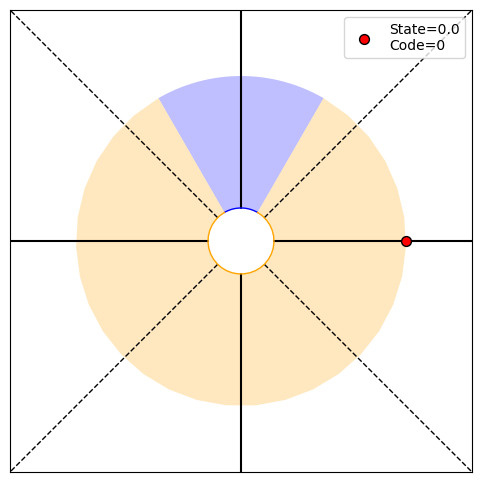

P(O1:45,S45|T)=[0.25 0.   0.   0.  ], P(O1:45|actions,T)=0.25, P(T|O1:45)=[1.00000000e+00 1.13686838e-13], H45=0.00
PRINT 1: 5.052549459024266e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 6.75062447e-22]
PRINT 2: [2.46943131e-12 2.46943124e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


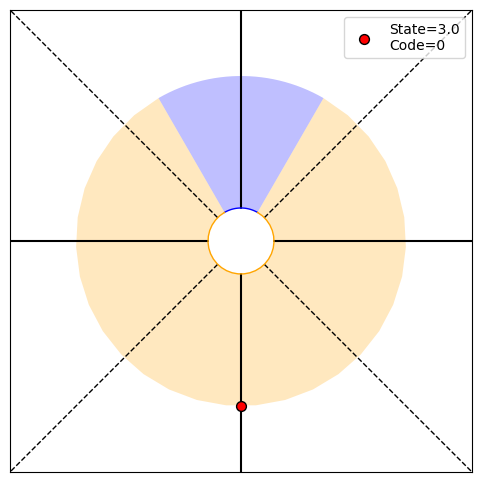

P(O1:46,S46|T)=[0.   0.   0.   0.25], P(O1:46|actions,T)=0.25, P(T|O1:46)=[1.00000000e+00 5.68434189e-14], H46=0.00
PRINT 1: 2.583118148373075e-12, [1.00094633e-108 0.00000000e+000 7.23281193e-022 2.50000000e-001]
PRINT 2: [1.26313729e-12 1.26313736e-12], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


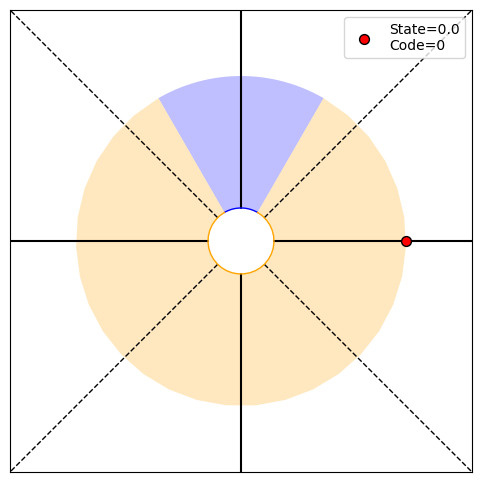

P(O1:47,S47|T)=[0.25 0.   0.   0.  ], P(O1:47|actions,T)=0.25, P(T|O1:47)=[1.00000000e+00 2.84217094e-14], H47=0.00
PRINT 1: 1.3199807836169755e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 7.23281193e-22]
PRINT 2: [6.45779537e-13 6.45779469e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


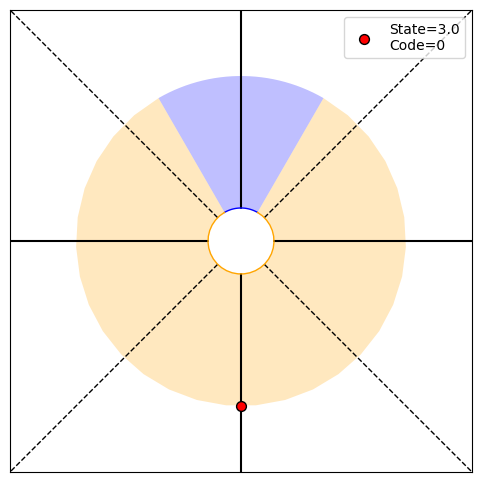

P(O1:48,S48|T)=[0.   0.   0.   0.25], P(O1:48|actions,T)=0.25, P(T|O1:48)=[1.00000000e+00 1.42108547e-14], H48=0.00
PRINT 1: 6.742012465236986e-13, [1.06767609e-108 0.00000000e+000 7.71499939e-022 2.50000000e-001]
PRINT 2: [3.29995126e-13 3.29995196e-13], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: 360.0, Code received: 0.0


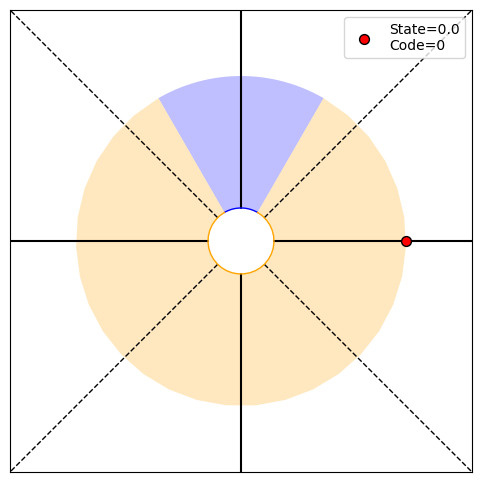

P(O1:49,S49|T)=[0.25 0.   0.   0.  ], P(O1:49|actions,T)=0.25, P(T|O1:49)=[1.00000000e+00 7.10542736e-15], H49=0.00
PRINT 1: 3.4420605061945245e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 7.71499939e-22]
PRINT 2: [1.68550312e-13 1.68550245e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: 270.0, Code received: 0.0


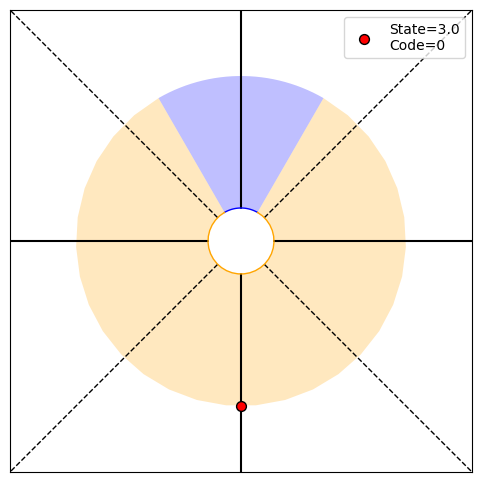

P(O1:50,S50|T)=[0.   0.   0.   0.25], P(O1:50|actions,T)=0.25, P(T|O1:50)=[1.00000000e+00 3.55271368e-15], H50=0.00
PRINT 1: 1.7565573898852733e-13, [1.13440584e-108 0.00000000e+000 8.19718685e-022 2.50000000e-001]
PRINT 2: [8.60514455e-14 8.60515127e-14], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


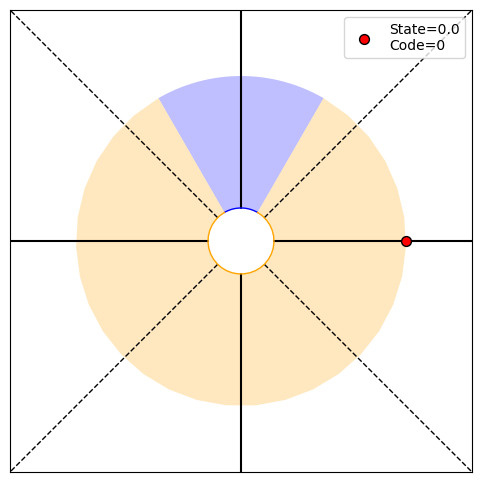

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


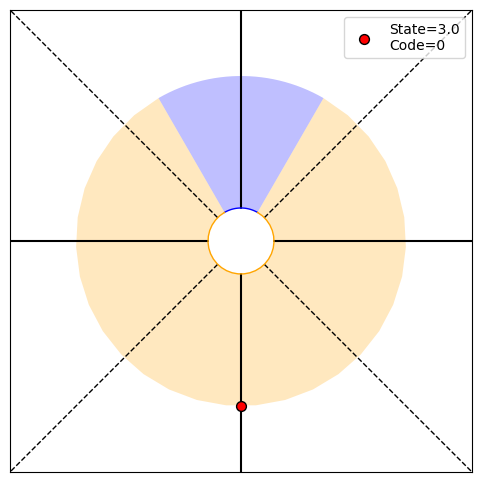

P(O1:2,S2|T)=[0.   0.   0.25 0.25], P(O1:2|actions,T)=0.5, P(T|O1:2)=[0.66666667 0.33333333], H2=0.92
PRINT 1: 0.9182958340544896, [4.82187462e-23 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.31668909], [0.66666667 0.33333333]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


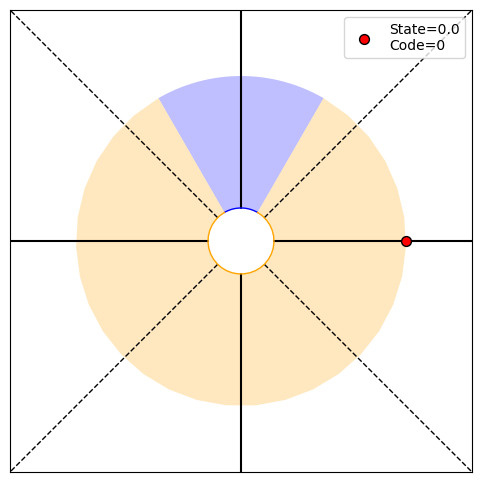

P(O1:3,S3|T)=[0.25 0.   0.   0.25], P(O1:3|actions,T)=0.5, P(T|O1:3)=[0.8 0.2], H3=0.72
PRINT 1: 0.7219280948873623, [2.50000000e-01 0.00000000e+00 9.30018994e-45 2.50000000e-01]
PRINT 2: [0.26899559 0.        ], [0.8 0.2]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


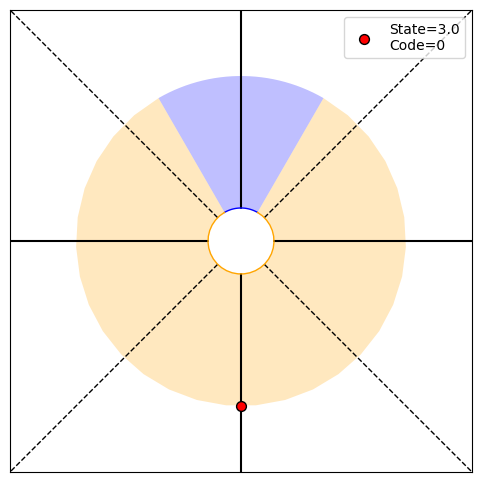

P(O1:4,S4|T)=[0.   0.   0.25 0.25], P(O1:4|actions,T)=0.5, P(T|O1:4)=[0.88888889 0.11111111], H4=0.50
PRINT 1: 0.5032583347756456, [1.79377399e-66 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.19843232], [0.88888889 0.11111111]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


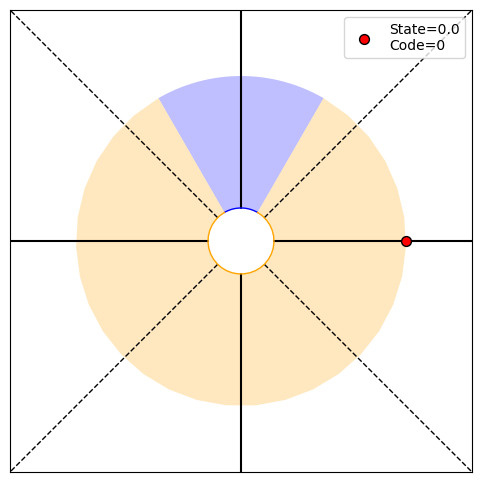

P(O1:5,S5|T)=[0.25 0.   0.   0.25], P(O1:5|actions,T)=0.5, P(T|O1:5)=[0.94117647 0.05882353], H5=0.32
PRINT 1: 0.32275695889739825, [2.50000000e-01 0.00000000e+00 6.91948263e-88 2.50000000e-01]
PRINT 2: [0.13260973 0.        ], [0.94117647 0.05882353]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


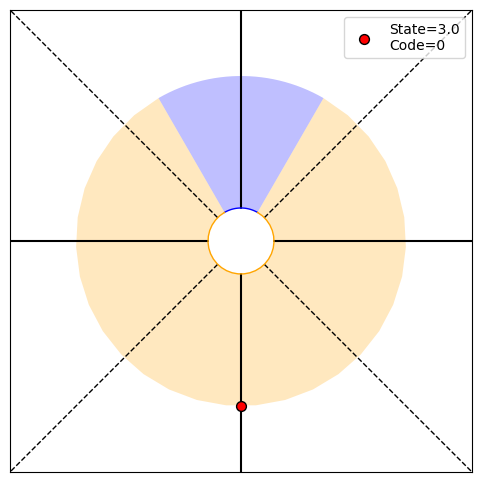

P(O1:6,S6|T)=[0.   0.   0.25 0.25], P(O1:6|actions,T)=0.5, P(T|O1:6)=[0.96969697 0.03030303], H6=0.20
PRINT 1: 0.19590927087360493, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.08297127], [0.96969697 0.03030303]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


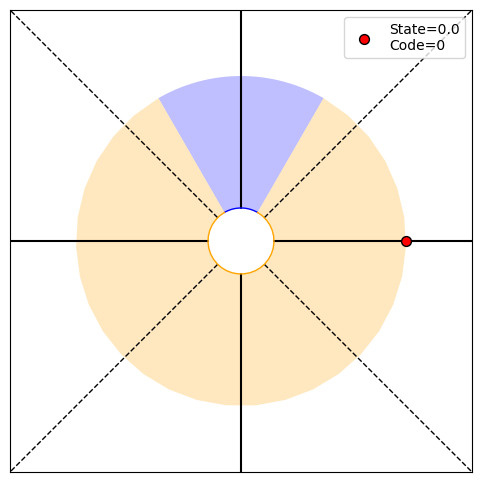

P(O1:7,S7|T)=[0.25 0.   0.   0.25], P(O1:7|actions,T)=0.5, P(T|O1:7)=[0.98461538 0.01538462], H7=0.11
PRINT 1: 0.11467550533614675, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.04968846 0.        ], [0.98461538 0.01538462]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


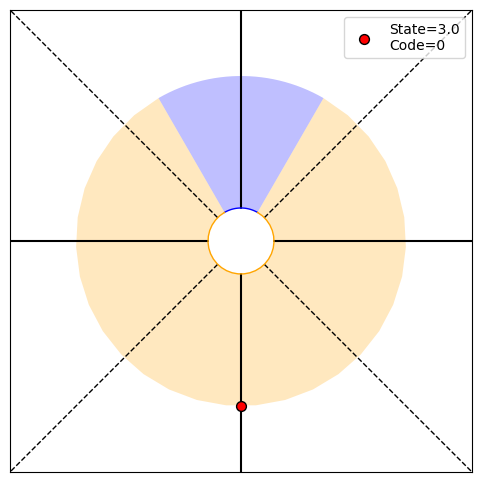

P(O1:8,S8|T)=[0.   0.   0.25 0.25], P(O1:8|actions,T)=0.5, P(T|O1:8)=[0.99224806 0.00775194], H8=0.07
PRINT 1: 0.06549082131472701, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.02888032], [0.99224806 0.00775194]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


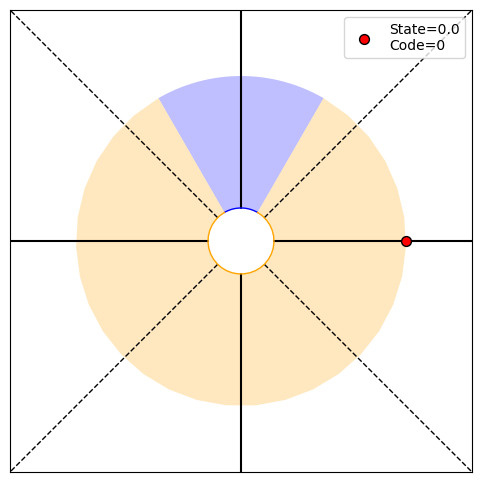

P(O1:9,S9|T)=[0.25 0.   0.   0.25], P(O1:9|actions,T)=0.5, P(T|O1:9)=[0.99610895 0.00389105], H9=0.04
PRINT 1: 0.03675295386313879, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.01643369 0.        ], [0.99610895 0.00389105]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


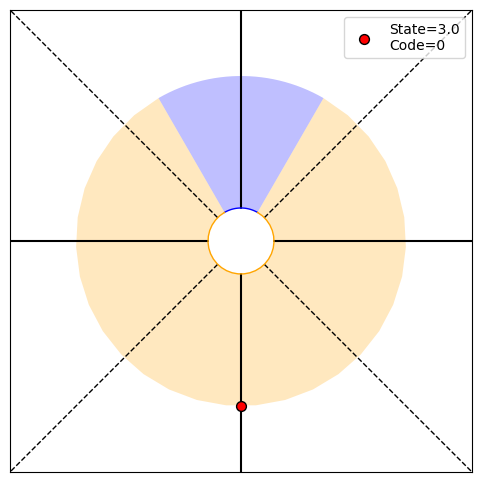

P(O1:10,S10|T)=[0.   0.   0.25 0.25], P(O1:10|actions,T)=0.5, P(T|O1:10)=[0.99805068 0.00194932], H10=0.02
PRINT 1: 0.020358875256176766, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00920546], [0.99805068 0.00194932]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


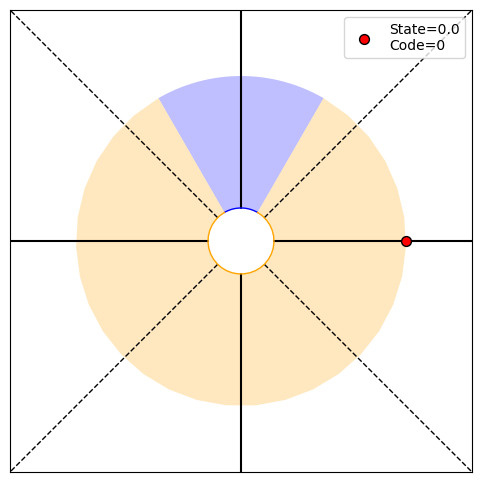

P(O1:11,S11|T)=[0.25 0.   0.   0.25], P(O1:11|actions,T)=0.5, P(T|O1:11)=[9.99024390e-01 9.75609756e-04], H11=0.01
PRINT 1: 0.011164291953784001, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00509451 0.        ], [9.99024390e-01 9.75609756e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


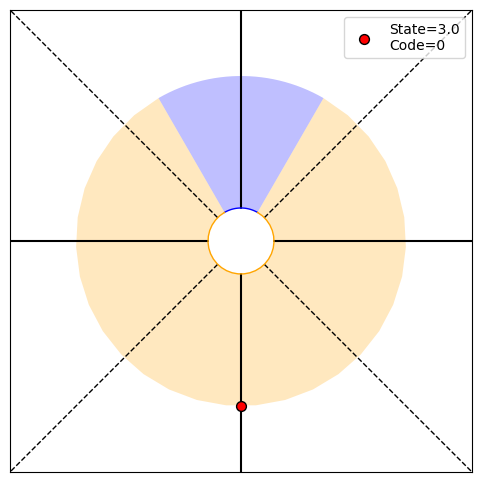

P(O1:12,S12|T)=[0.   0.   0.25 0.25], P(O1:12|actions,T)=0.5, P(T|O1:12)=[9.99511957e-01 4.88042948e-04], H12=0.01
PRINT 1: 0.006072741436820054, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


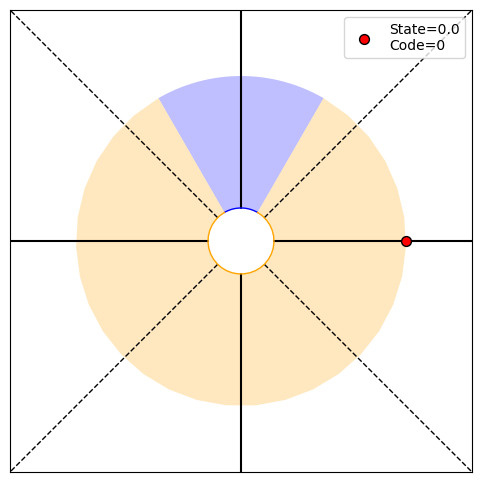

P(O1:13,S13|T)=[0.25 0.   0.   0.25], P(O1:13|actions,T)=0.5, P(T|O1:13)=[9.99755919e-01 2.44081035e-04], H13=0.00
PRINT 1: 0.0032811498991440822, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00151855 0.        ], [9.99755919e-01 2.44081035e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


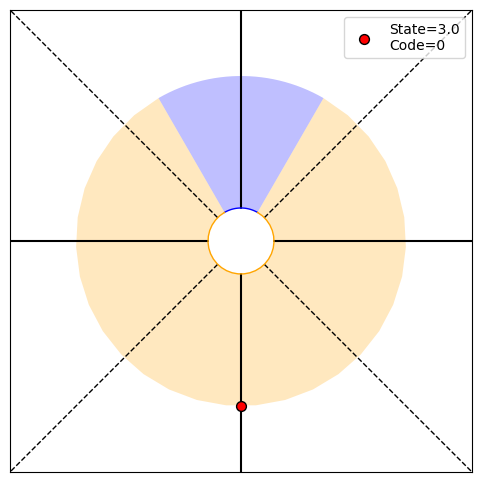

P(O1:14,S14|T)=[0.   0.   0.25 0.25], P(O1:14|actions,T)=0.5, P(T|O1:14)=[9.99877945e-01 1.22055413e-04], H14=0.00
PRINT 1: 0.001762819857490962, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


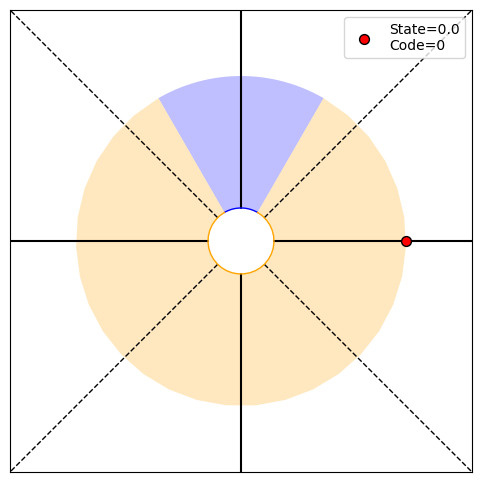

P(O1:15,S15|T)=[0.25 0.   0.   0.25], P(O1:15|actions,T)=0.5, P(T|O1:15)=[9.99938969e-01 6.10314312e-05], H15=0.00
PRINT 1: 0.0009424924667410557, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00044073 0.        ], [9.99938969e-01 6.10314312e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


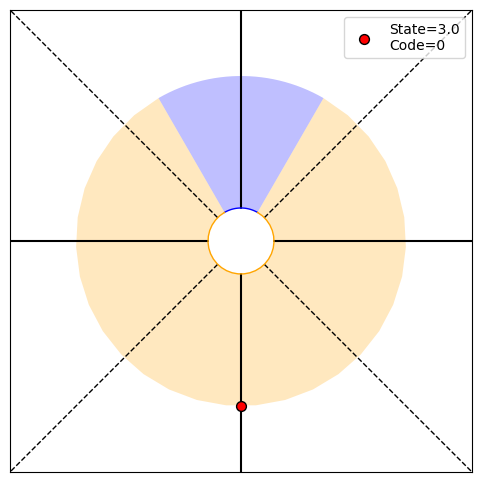

P(O1:16,S16|T)=[0.   0.   0.25 0.25], P(O1:16|actions,T)=0.5, P(T|O1:16)=[9.99969483e-01 3.05166468e-05], H16=0.00
PRINT 1: 0.0005017765892900114, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


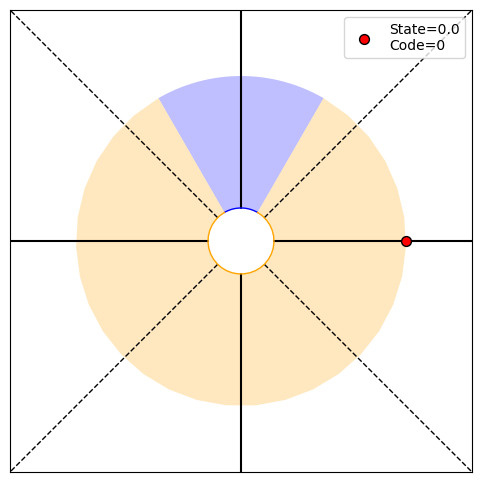

P(O1:17,S17|T)=[0.25 0.   0.   0.25], P(O1:17|actions,T)=0.5, P(T|O1:17)=[9.99984741e-01 1.52585562e-05], H17=0.00
PRINT 1: 0.0002661505111268847, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00012545 0.        ], [9.99984741e-01 1.52585562e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


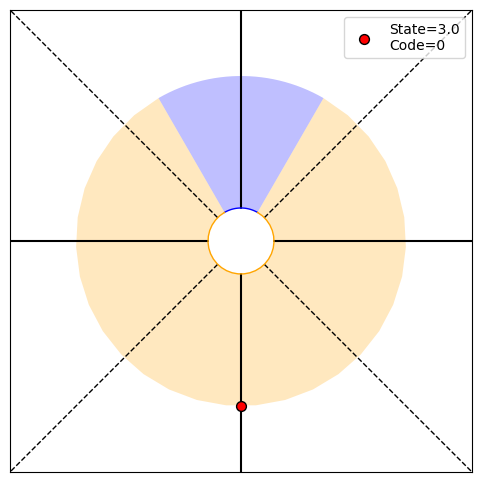

P(O1:18,S18|T)=[0.   0.   0.25 0.25], P(O1:18|actions,T)=0.5, P(T|O1:18)=[9.99992371e-01 7.62933632e-06], H18=0.00
PRINT 1: 0.0001407055651760454, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


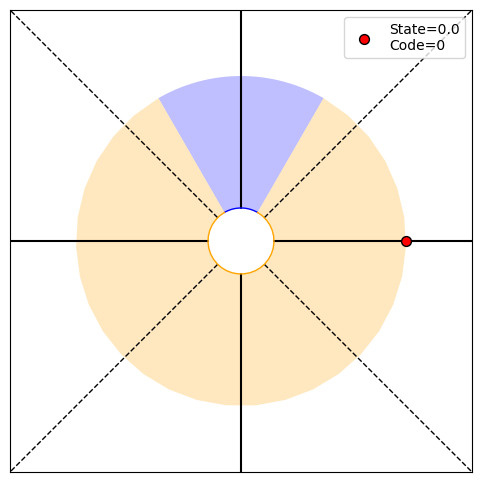

P(O1:19,S19|T)=[0.25 0.   0.   0.25], P(O1:19|actions,T)=0.5, P(T|O1:19)=[9.99996185e-01 3.81468271e-06], H19=0.00
PRINT 1: 7.416772317850379e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.51765229e-05 0.00000000e+00], [9.99996185e-01 3.81468271e-06]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


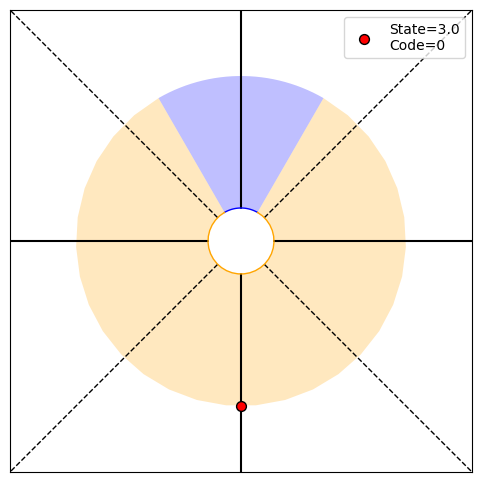

P(O1:20,S20|T)=[0.   0.   0.25 0.25], P(O1:20|actions,T)=0.5, P(T|O1:20)=[9.99998093e-01 1.90734499e-06], H20=0.00
PRINT 1: 3.899127469152328e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


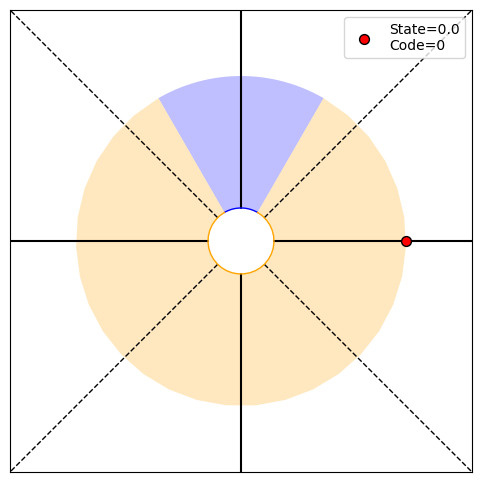

P(O1:21,S21|T)=[0.25 0.   0.   0.25], P(O1:21|actions,T)=0.5, P(T|O1:21)=[9.99999046e-01 9.53673407e-07], H21=0.00
PRINT 1: 2.04493286890882e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [9.74782781e-06 0.00000000e+00], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


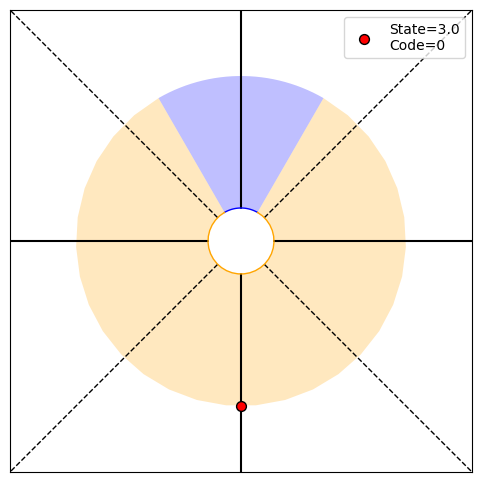

P(O1:22,S22|T)=[0.   0.   0.25 0.25], P(O1:22|actions,T)=0.5, P(T|O1:22)=[9.99999523e-01 4.76836931e-07], H22=0.00
PRINT 1: 1.070150598685641e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


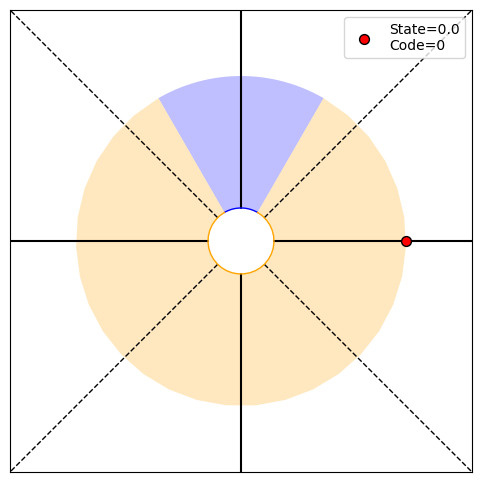

P(O1:23,S23|T)=[0.25 0.   0.   0.25], P(O1:23|actions,T)=0.5, P(T|O1:23)=[9.99999762e-01 2.38418522e-07], H23=0.00
PRINT 1: 5.589172750401204e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.67537712e-06 0.00000000e+00], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


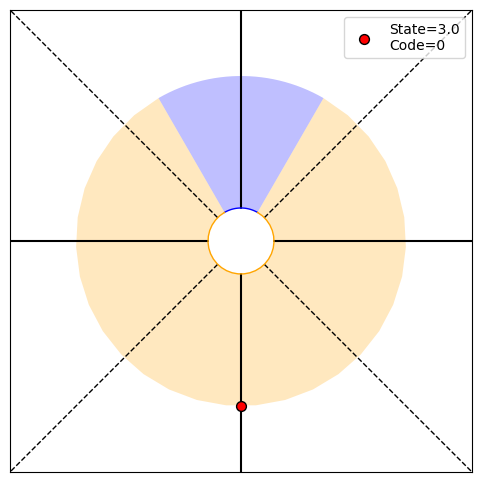

P(O1:24,S24|T)=[0.   0.   0.25 0.25], P(O1:24|actions,T)=0.5, P(T|O1:24)=[9.99999881e-01 1.19209275e-07], H24=0.00
PRINT 1: 2.913795973430192e-06, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


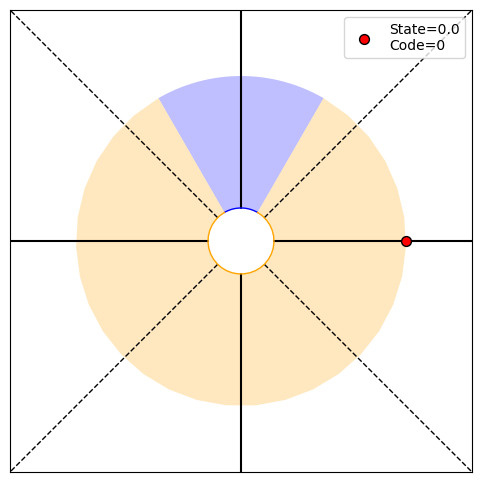

P(O1:25,S25|T)=[0.25 0.   0.   0.25], P(O1:25|actions,T)=0.5, P(T|O1:25)=[9.99999940e-01 5.96046412e-08], H25=0.00
PRINT 1: 1.516502712212915e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [7.28449036e-07 0.00000000e+00], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


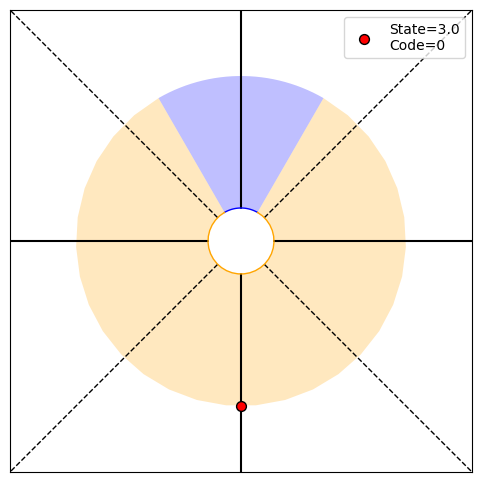

P(O1:26,S26|T)=[0.   0.   0.25 0.25], P(O1:26|actions,T)=0.5, P(T|O1:26)=[9.99999970e-01 2.98023215e-08], H26=0.00
PRINT 1: 7.880536995629399e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


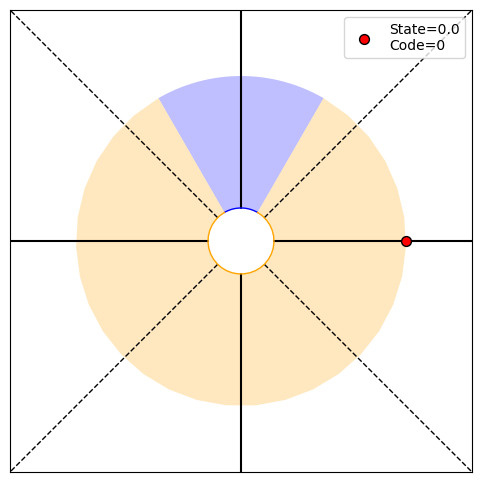

P(O1:27,S27|T)=[0.25 0.   0.   0.25], P(O1:27|actions,T)=0.5, P(T|O1:27)=[9.99999985e-01 1.49011610e-08], H27=0.00
PRINT 1: 4.089280164645592e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.97013428e-07 0.00000000e+00], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


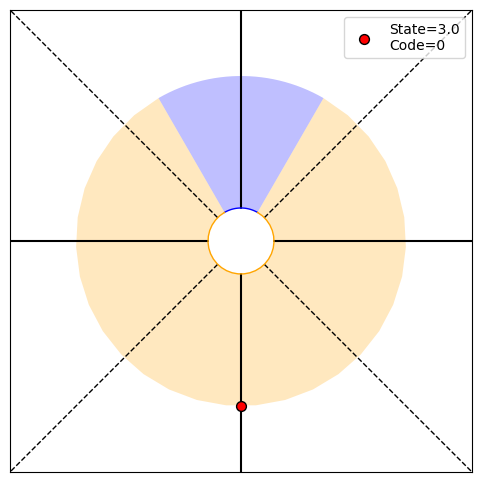

P(O1:28,S28|T)=[0.   0.   0.25 0.25], P(O1:28|actions,T)=0.5, P(T|O1:28)=[9.99999993e-01 7.45058054e-09], H28=0.00
PRINT 1: 2.1191459017693938e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


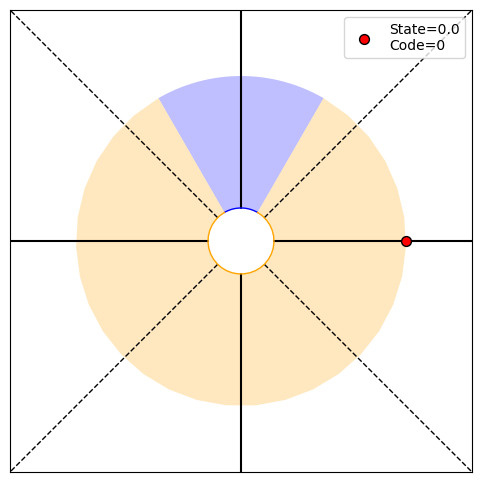

P(O1:29,S29|T)=[0.25 0.   0.   0.25], P(O1:29|actions,T)=0.5, P(T|O1:29)=[9.99999996e-01 3.72529028e-09], H29=0.00
PRINT 1: 1.0968258581782902e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [5.29786478e-08 0.00000000e+00], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


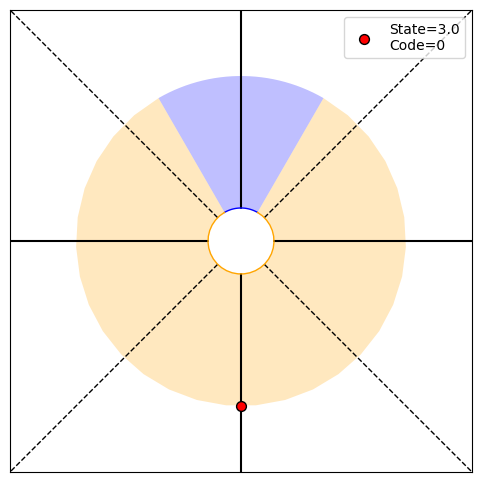

P(O1:30,S30|T)=[0.   0.   0.25 0.25], P(O1:30|actions,T)=0.5, P(T|O1:30)=[9.99999998e-01 1.86264515e-09], H30=0.00
PRINT 1: 5.670393814931786e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


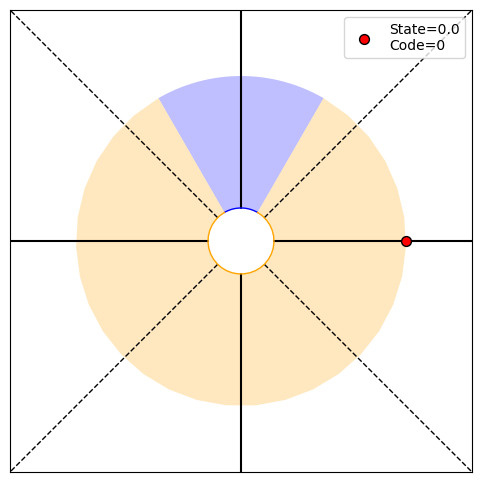

P(O1:31,S31|T)=[0.25 0.   0.   0.25], P(O1:31|actions,T)=0.5, P(T|O1:31)=[9.99999999e-01 9.31322574e-10], H31=0.00
PRINT 1: 2.928329167293487e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.41759846e-08 0.00000000e+00], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


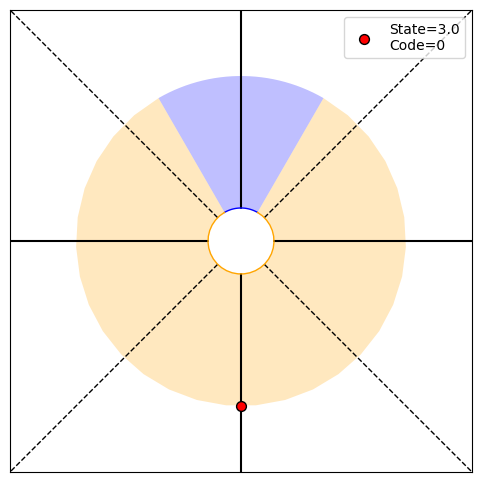

P(O1:32,S32|T)=[0.   0.   0.25 0.25], P(O1:32|actions,T)=0.5, P(T|O1:32)=[1.00000000e+00 4.65661287e-10], H32=0.00
PRINT 1: 1.510730712990713e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


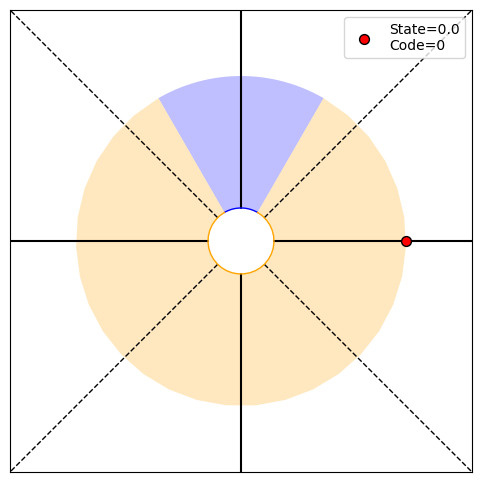

P(O1:33,S33|T)=[0.25 0.   0.   0.25], P(O1:33|actions,T)=0.5, P(T|O1:33)=[1.00000000e+00 2.32830644e-10], H33=0.00
PRINT 1: 7.786484210194632e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.77682678e-09 0.00000000e+00], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


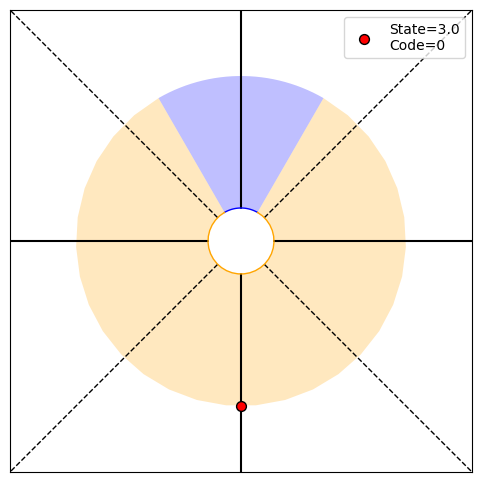

P(O1:34,S34|T)=[0.   0.   0.25 0.25], P(O1:34|actions,T)=0.5, P(T|O1:34)=[1.00000000e+00 1.16415322e-10], H34=0.00
PRINT 1: 4.0096574273346035e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


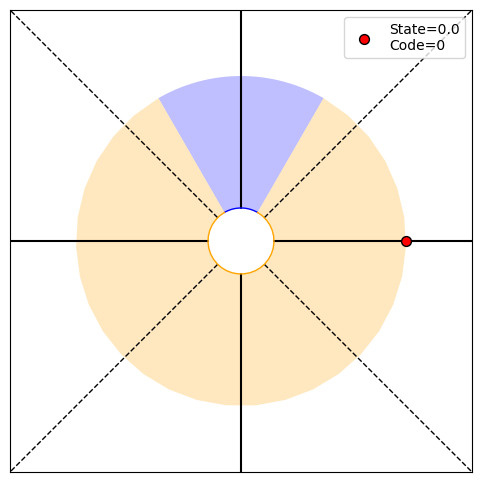

P(O1:35,S35|T)=[0.25 0.   0.   0.25], P(O1:35|actions,T)=0.5, P(T|O1:35)=[1.00000000e+00 5.82076609e-11], H35=0.00
PRINT 1: 2.063036374686746e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.00241436e-09 0.00000000e+00], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


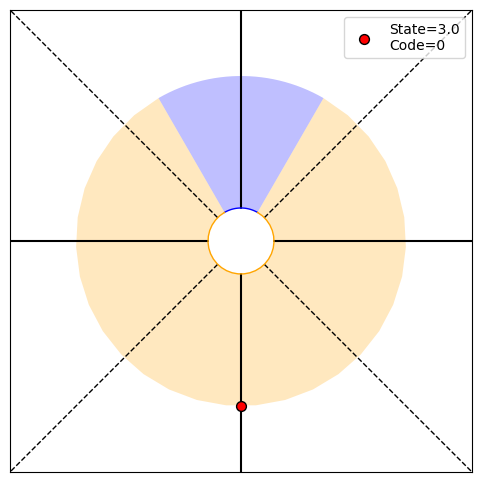

P(O1:36,S36|T)=[0.   0.   0.25 0.25], P(O1:36|actions,T)=0.5, P(T|O1:36)=[1.00000000e+00 2.91038305e-11], H36=0.00
PRINT 1: 1.0606220178274475e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


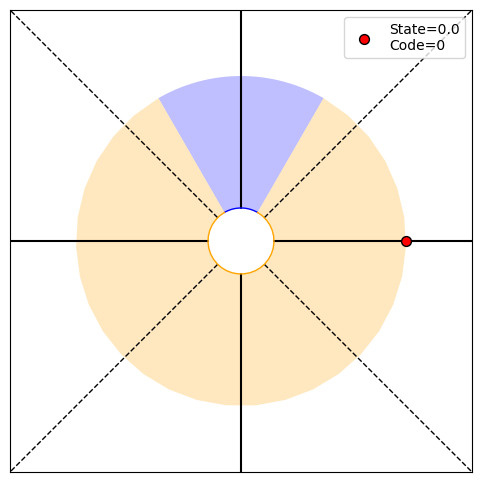

P(O1:37,S37|T)=[0.25 0.   0.   0.25], P(O1:37|actions,T)=0.5, P(T|O1:37)=[1.00000000e+00 1.45519152e-11], H37=0.00
PRINT 1: 5.448629241491377e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.65155504e-10 0.00000000e+00], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


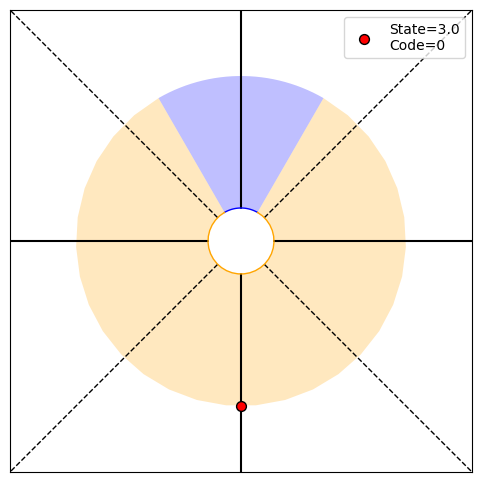

P(O1:38,S38|T)=[0.   0.   0.25 0.25], P(O1:38|actions,T)=0.5, P(T|O1:38)=[1.00000000e+00 7.27595761e-12], H38=0.00
PRINT 1: 2.797074196905669e-10, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


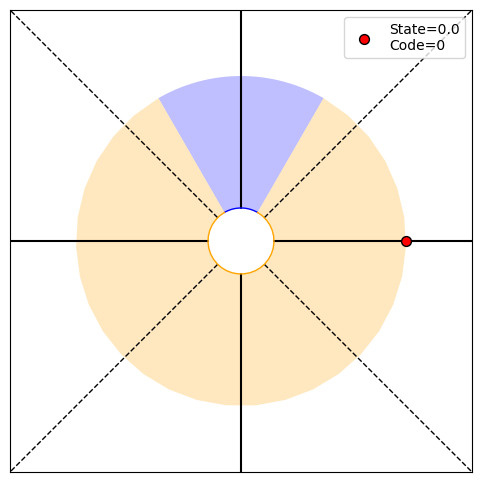

P(O1:39,S39|T)=[0.25 0.   0.   0.25], P(O1:39|actions,T)=0.5, P(T|O1:39)=[1.00000000e+00 3.63797881e-12], H39=0.00
PRINT 1: 1.4349168865284212e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [6.99268549e-11 0.00000000e+00], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


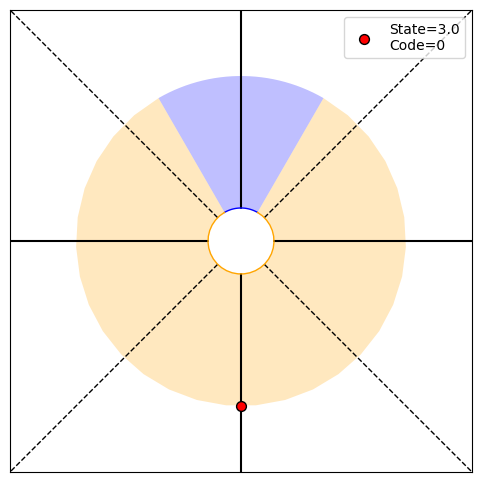

P(O1:40,S40|T)=[0.   0.   0.25 0.25], P(O1:40|actions,T)=0.5, P(T|O1:40)=[1.0000000e+00 1.8189894e-12], H40=0.00
PRINT 1: 7.356483373008693e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.58729222e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


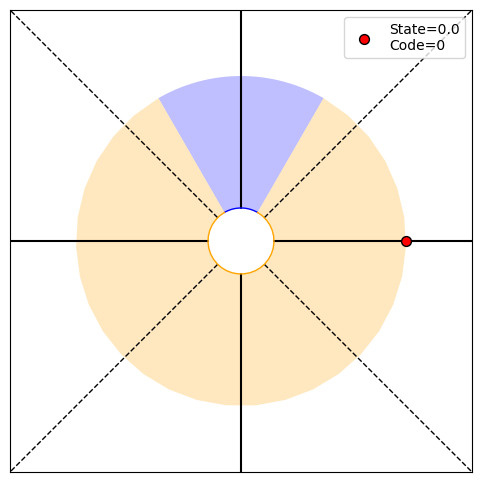

P(O1:41,S41|T)=[0.25 0.   0.   0.25], P(O1:41|actions,T)=0.5, P(T|O1:41)=[1.00000000e+00 9.09494702e-13], H41=0.00
PRINT 1: 3.769191156684724e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.83912084e-11 0.00000000e+00], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


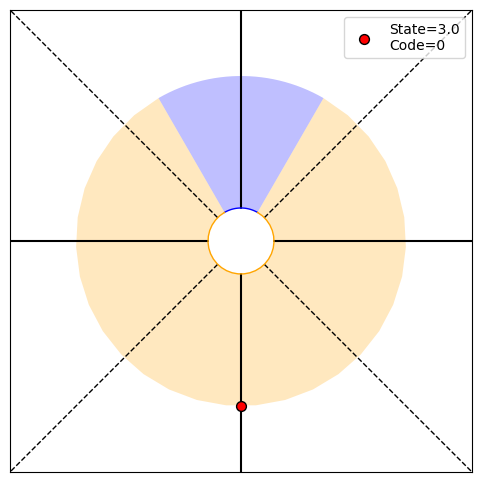

P(O1:42,S42|T)=[0.   0.   0.25 0.25], P(O1:42|actions,T)=0.5, P(T|O1:42)=[1.00000000e+00 4.54747351e-13], H42=0.00
PRINT 1: 1.9300703134317997e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 9.42297789e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


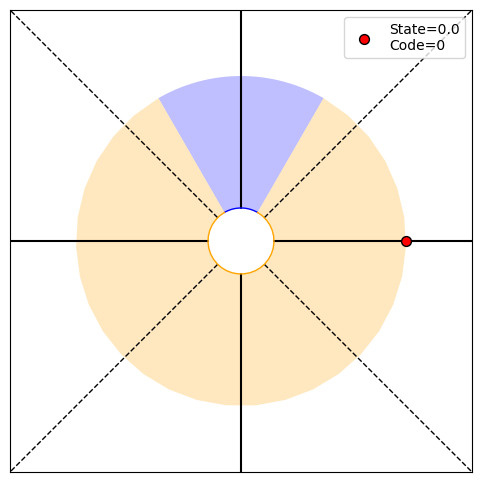

P(O1:43,S43|T)=[0.25 0.   0.   0.25], P(O1:43|actions,T)=0.5, P(T|O1:43)=[1.00000000e+00 2.27373675e-13], H43=0.00
PRINT 1: 9.877725242604262e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [4.82517578e-12 0.00000000e+00], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


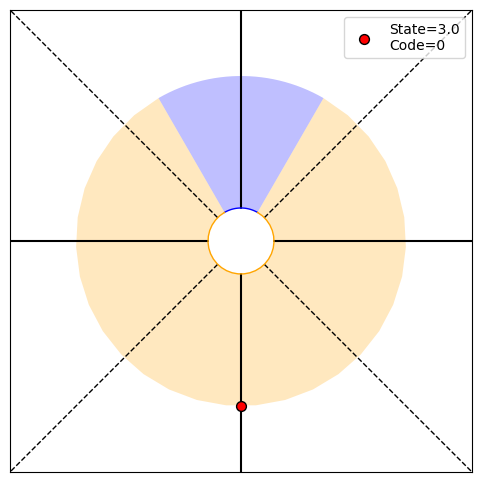

P(O1:44,S44|T)=[0.   0.   0.25 0.25], P(O1:44|actions,T)=0.5, P(T|O1:44)=[1.00000000e+00 1.13686838e-13], H44=0.00
PRINT 1: 5.052549459024267e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.46943131e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


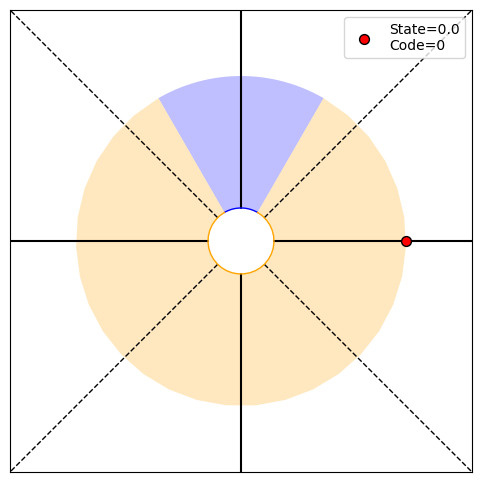

P(O1:45,S45|T)=[0.25 0.   0.   0.25], P(O1:45|actions,T)=0.5, P(T|O1:45)=[1.00000000e+00 5.68434189e-14], H45=0.00
PRINT 1: 2.5831181483730752e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.26313736e-12 0.00000000e+00], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


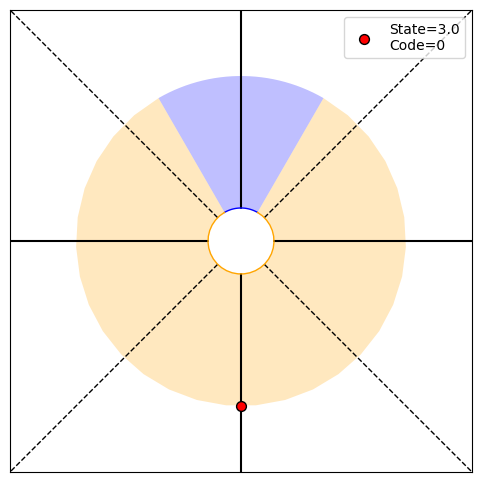

P(O1:46,S46|T)=[0.   0.   0.25 0.25], P(O1:46|actions,T)=0.5, P(T|O1:46)=[1.00000000e+00 2.84217094e-14], H46=0.00
PRINT 1: 1.3199807836169758e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.45779537e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


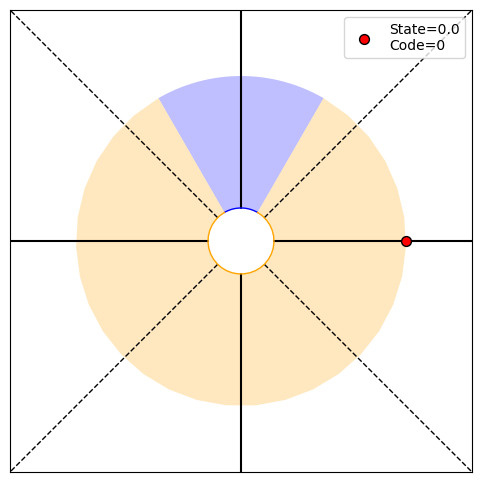

P(O1:47,S47|T)=[0.25 0.   0.   0.25], P(O1:47|actions,T)=0.5, P(T|O1:47)=[1.00000000e+00 1.42108547e-14], H47=0.00
PRINT 1: 6.742012465236986e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.29995196e-13 0.00000000e+00], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


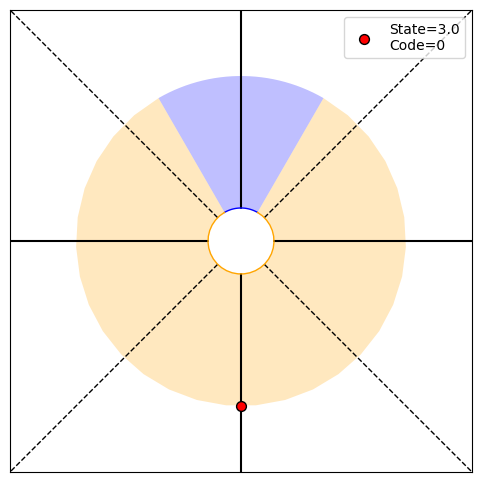

P(O1:48,S48|T)=[0.   0.   0.25 0.25], P(O1:48|actions,T)=0.5, P(T|O1:48)=[1.00000000e+00 7.10542736e-15], H48=0.00
PRINT 1: 3.442060506194525e-13, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.68550312e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


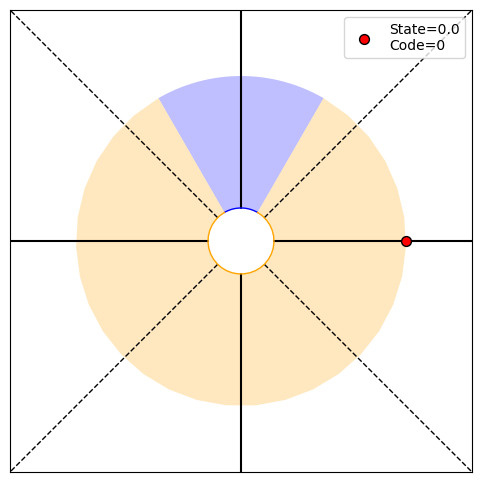

P(O1:49,S49|T)=[0.25 0.   0.   0.25], P(O1:49|actions,T)=0.5, P(T|O1:49)=[1.00000000e+00 3.55271368e-15], H49=0.00
PRINT 1: 1.7565573898852736e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [8.60515127e-14 0.00000000e+00], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


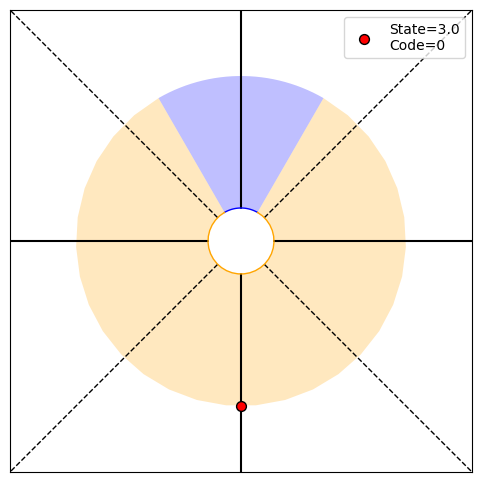

P(O1:50,S50|T)=[0.   0.   0.25 0.25], P(O1:50|actions,T)=0.5, P(T|O1:50)=[1.00000000e+00 1.77635684e-15], H50=0.00
PRINT 1: 8.960422633366407e-14, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 4.39139347e-14], [1.00000000e+00 1.77635684e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


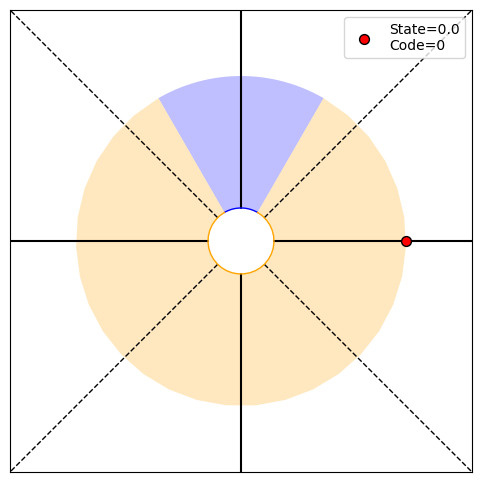

P(O1:1,S1|T)=[0.25 0.   0.25 0.25], P(O1:1|actions,T)=0.75, P(T|O1:1)=[0.6 0.4], H1=0.97
PRINT 1: 0.9709505944546686, [0.25 0.   0.25 0.25]
PRINT 2: [0.01997309 0.01997309], [0.6 0.4]
Choosing randomly
Current angle: -90.0, Code received: 0.0


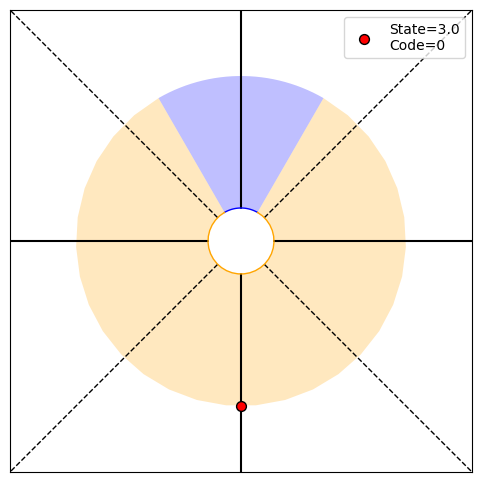

P(O1:2,S2|T)=[0.   0.   0.25 0.25], P(O1:2|actions,T)=0.5, P(T|O1:2)=[0.66666667 0.33333333], H2=0.92
PRINT 1: 0.9182958340544896, [4.82187462e-23 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.31668909], [0.66666667 0.33333333]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


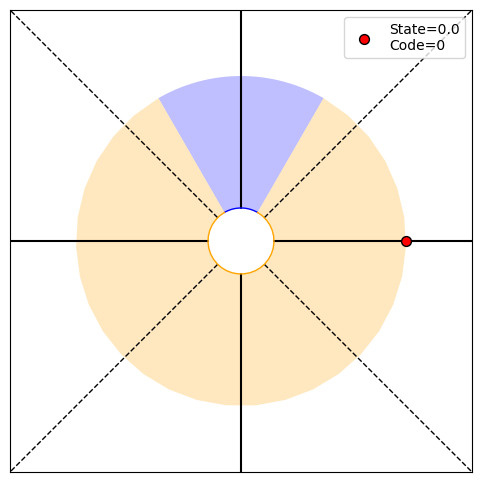

P(O1:3,S3|T)=[0.25 0.   0.   0.25], P(O1:3|actions,T)=0.5, P(T|O1:3)=[0.8 0.2], H3=0.72
PRINT 1: 0.7219280948873623, [2.50000000e-01 0.00000000e+00 9.30018994e-45 2.50000000e-01]
PRINT 2: [0.26899559 0.        ], [0.8 0.2]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


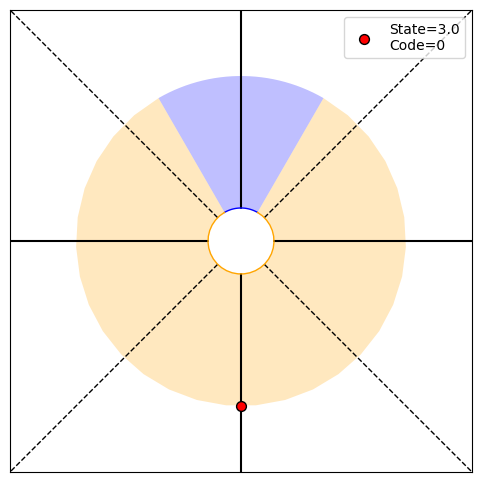

P(O1:4,S4|T)=[0.   0.   0.25 0.25], P(O1:4|actions,T)=0.5, P(T|O1:4)=[0.88888889 0.11111111], H4=0.50
PRINT 1: 0.5032583347756456, [1.79377399e-66 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.19843232], [0.88888889 0.11111111]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


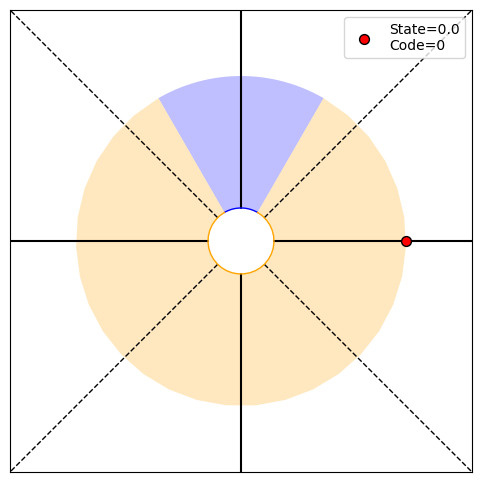

P(O1:5,S5|T)=[0.25 0.   0.   0.25], P(O1:5|actions,T)=0.5, P(T|O1:5)=[0.94117647 0.05882353], H5=0.32
PRINT 1: 0.32275695889739825, [2.50000000e-01 0.00000000e+00 6.91948263e-88 2.50000000e-01]
PRINT 2: [0.13260973 0.        ], [0.94117647 0.05882353]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


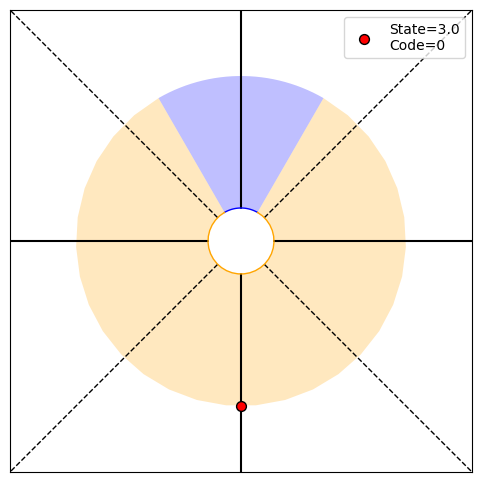

P(O1:6,S6|T)=[0.   0.   0.25 0.25], P(O1:6|actions,T)=0.5, P(T|O1:6)=[0.96969697 0.03030303], H6=0.20
PRINT 1: 0.19590927087360493, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.08297127], [0.96969697 0.03030303]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


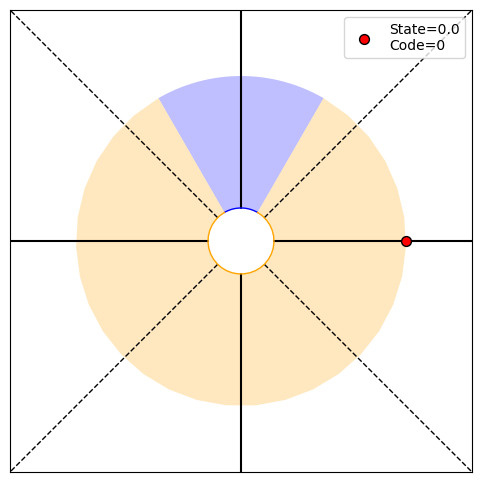

P(O1:7,S7|T)=[0.25 0.   0.   0.25], P(O1:7|actions,T)=0.5, P(T|O1:7)=[0.98461538 0.01538462], H7=0.11
PRINT 1: 0.11467550533614675, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.04968846 0.        ], [0.98461538 0.01538462]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


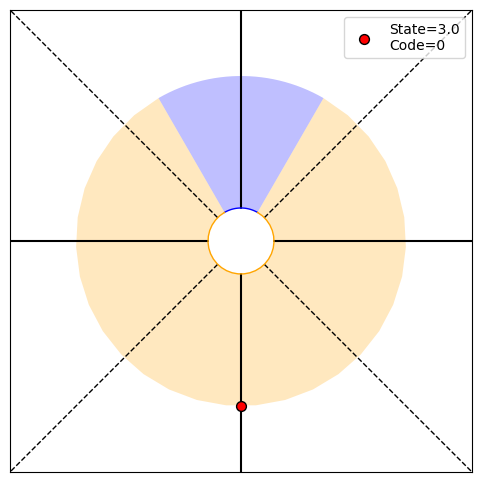

P(O1:8,S8|T)=[0.   0.   0.25 0.25], P(O1:8|actions,T)=0.5, P(T|O1:8)=[0.99224806 0.00775194], H8=0.07
PRINT 1: 0.06549082131472701, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.02888032], [0.99224806 0.00775194]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


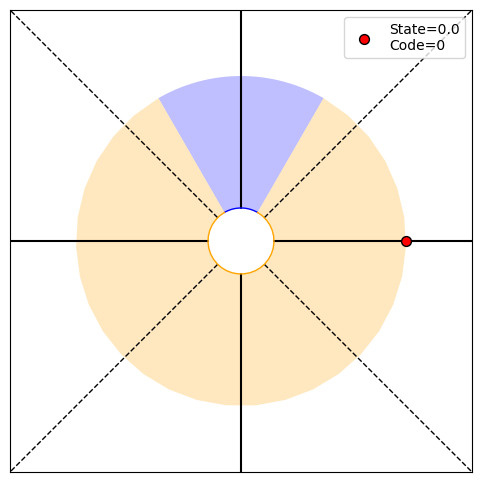

P(O1:9,S9|T)=[0.25 0.   0.   0.25], P(O1:9|actions,T)=0.5, P(T|O1:9)=[0.99610895 0.00389105], H9=0.04
PRINT 1: 0.03675295386313879, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.01643369 0.        ], [0.99610895 0.00389105]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


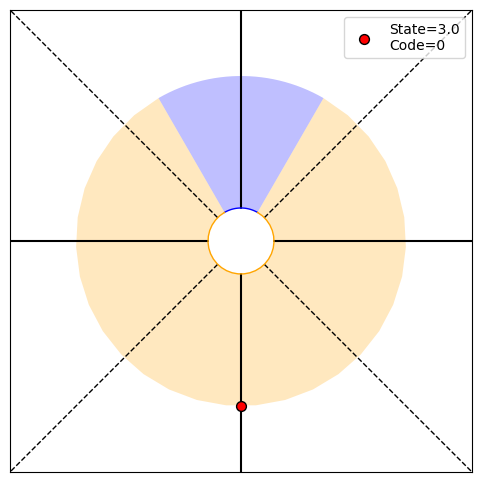

P(O1:10,S10|T)=[0.   0.   0.25 0.25], P(O1:10|actions,T)=0.5, P(T|O1:10)=[0.99805068 0.00194932], H10=0.02
PRINT 1: 0.020358875256176766, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00920546], [0.99805068 0.00194932]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


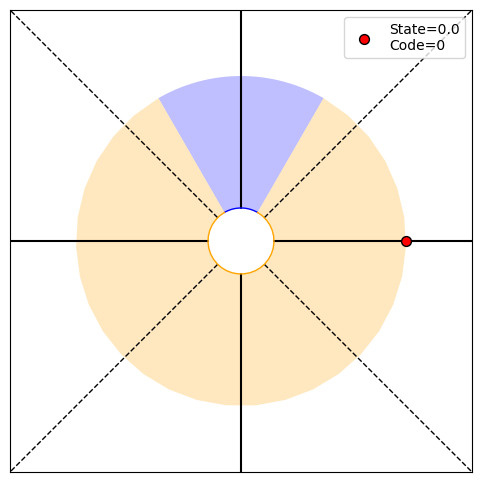

P(O1:11,S11|T)=[0.25 0.   0.   0.25], P(O1:11|actions,T)=0.5, P(T|O1:11)=[9.99024390e-01 9.75609756e-04], H11=0.01
PRINT 1: 0.011164291953784001, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00509451 0.        ], [9.99024390e-01 9.75609756e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


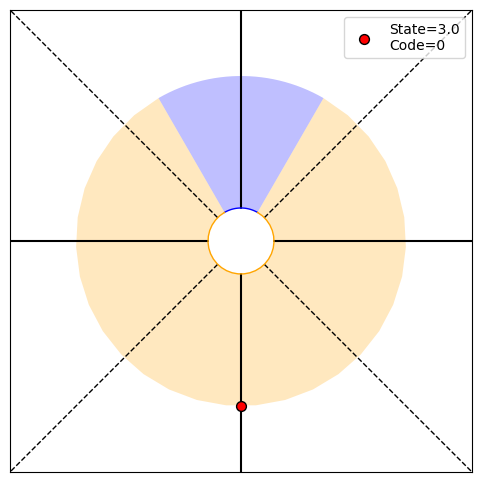

P(O1:12,S12|T)=[0.   0.   0.25 0.25], P(O1:12|actions,T)=0.5, P(T|O1:12)=[9.99511957e-01 4.88042948e-04], H12=0.01
PRINT 1: 0.006072741436820054, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00279239], [9.99511957e-01 4.88042948e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


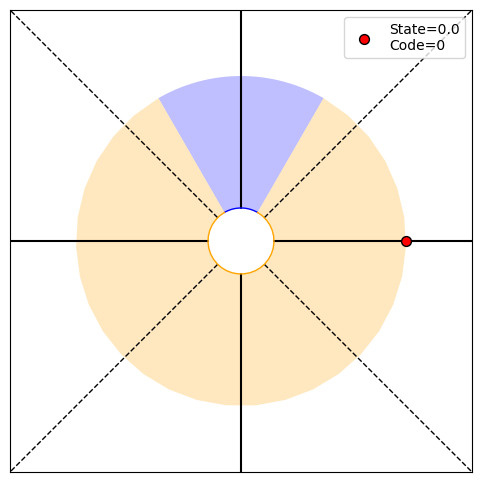

P(O1:13,S13|T)=[0.25 0.   0.   0.25], P(O1:13|actions,T)=0.5, P(T|O1:13)=[9.99755919e-01 2.44081035e-04], H13=0.00
PRINT 1: 0.0032811498991440822, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00151855 0.        ], [9.99755919e-01 2.44081035e-04]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


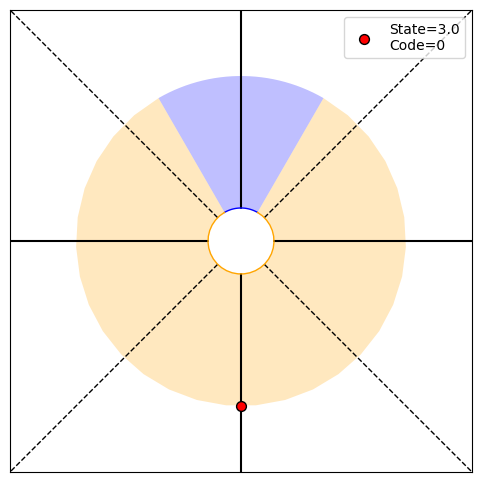

P(O1:14,S14|T)=[0.   0.   0.25 0.25], P(O1:14|actions,T)=0.5, P(T|O1:14)=[9.99877945e-01 1.22055413e-04], H14=0.00
PRINT 1: 0.001762819857490962, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00082038], [9.99877945e-01 1.22055413e-04]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


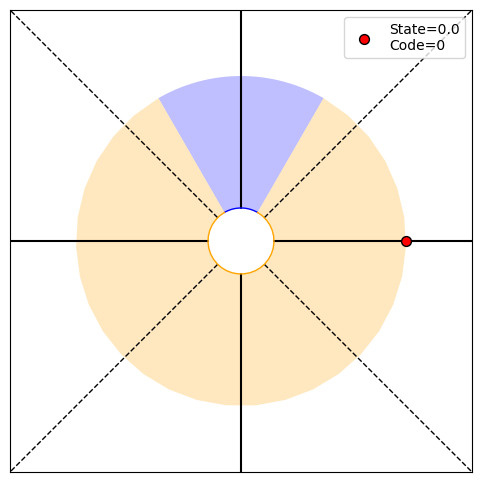

P(O1:15,S15|T)=[0.25 0.   0.   0.25], P(O1:15|actions,T)=0.5, P(T|O1:15)=[9.99938969e-01 6.10314312e-05], H15=0.00
PRINT 1: 0.0009424924667410557, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00044073 0.        ], [9.99938969e-01 6.10314312e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


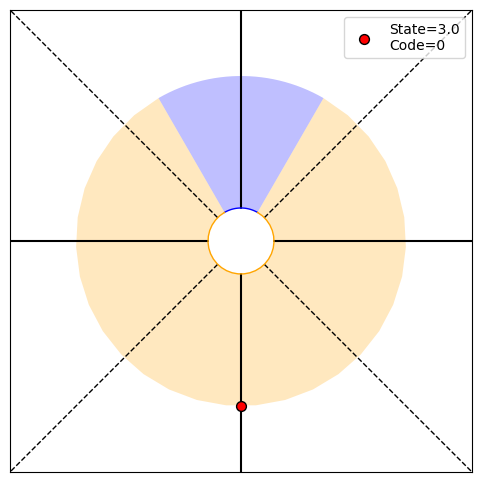

P(O1:16,S16|T)=[0.   0.   0.25 0.25], P(O1:16|actions,T)=0.5, P(T|O1:16)=[9.99969483e-01 3.05166468e-05], H16=0.00
PRINT 1: 0.0005017765892900114, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.         0.00023563], [9.99969483e-01 3.05166468e-05]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


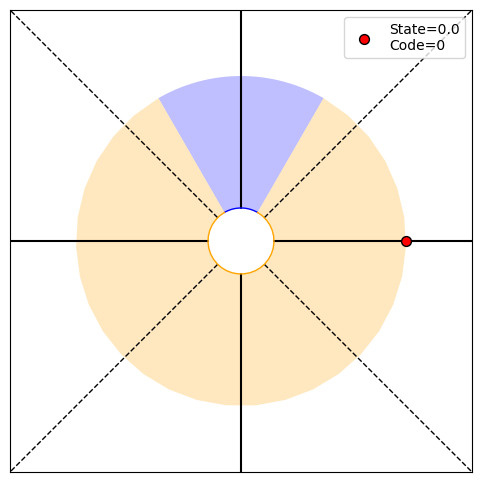

P(O1:17,S17|T)=[0.25 0.   0.   0.25], P(O1:17|actions,T)=0.5, P(T|O1:17)=[9.99984741e-01 1.52585562e-05], H17=0.00
PRINT 1: 0.0002661505111268847, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [0.00012545 0.        ], [9.99984741e-01 1.52585562e-05]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


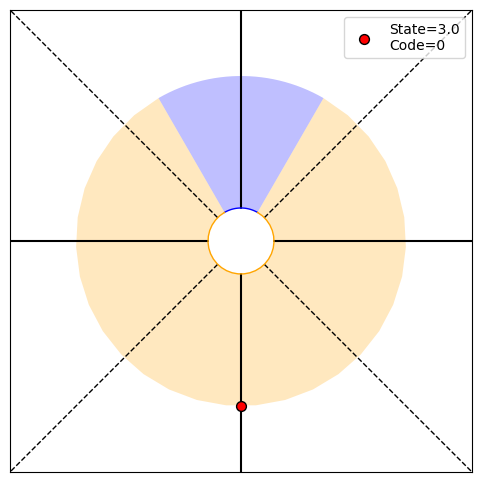

P(O1:18,S18|T)=[0.   0.   0.25 0.25], P(O1:18|actions,T)=0.5, P(T|O1:18)=[9.99992371e-01 7.62933632e-06], H18=0.00
PRINT 1: 0.0001407055651760454, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.65381249e-05], [9.99992371e-01 7.62933632e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


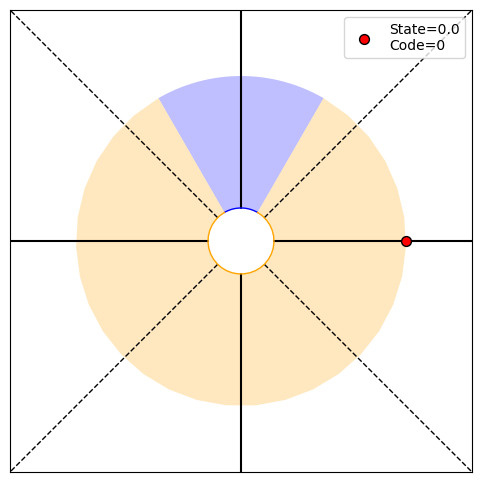

P(O1:19,S19|T)=[0.25 0.   0.   0.25], P(O1:19|actions,T)=0.5, P(T|O1:19)=[9.99996185e-01 3.81468271e-06], H19=0.00
PRINT 1: 7.416772317850379e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.51765229e-05 0.00000000e+00], [9.99996185e-01 3.81468271e-06]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


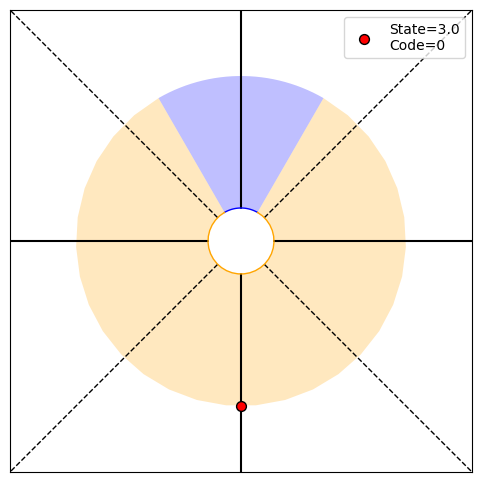

P(O1:20,S20|T)=[0.   0.   0.25 0.25], P(O1:20|actions,T)=0.5, P(T|O1:20)=[9.99998093e-01 1.90734499e-06], H20=0.00
PRINT 1: 3.899127469152328e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.85419655e-05], [9.99998093e-01 1.90734499e-06]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


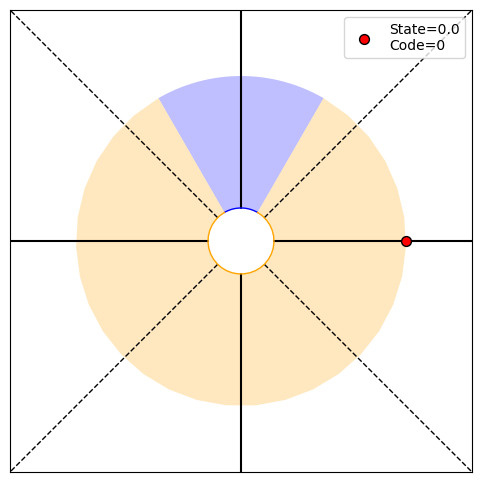

P(O1:21,S21|T)=[0.25 0.   0.   0.25], P(O1:21|actions,T)=0.5, P(T|O1:21)=[9.99999046e-01 9.53673407e-07], H21=0.00
PRINT 1: 2.04493286890882e-05, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [9.74782781e-06 0.00000000e+00], [9.99999046e-01 9.53673407e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


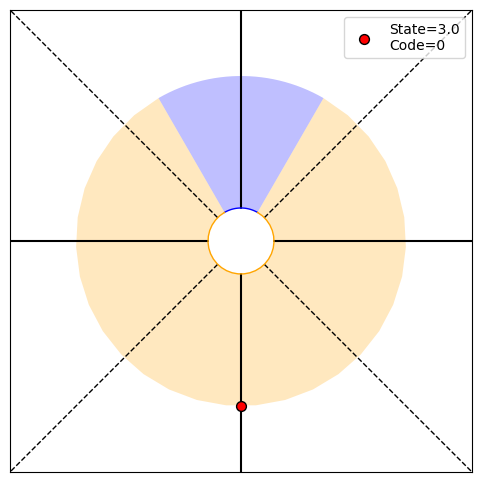

P(O1:22,S22|T)=[0.   0.   0.25 0.25], P(O1:22|actions,T)=0.5, P(T|O1:22)=[9.99999523e-01 4.76836931e-07], H22=0.00
PRINT 1: 1.070150598685641e-05, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.11233457e-06], [9.99999523e-01 4.76836931e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


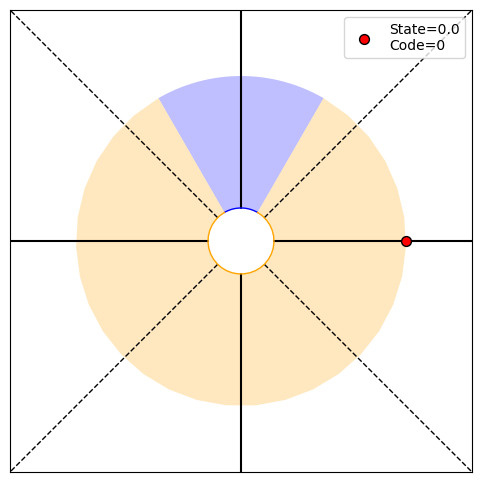

P(O1:23,S23|T)=[0.25 0.   0.   0.25], P(O1:23|actions,T)=0.5, P(T|O1:23)=[9.99999762e-01 2.38418522e-07], H23=0.00
PRINT 1: 5.589172750401204e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.67537712e-06 0.00000000e+00], [9.99999762e-01 2.38418522e-07]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


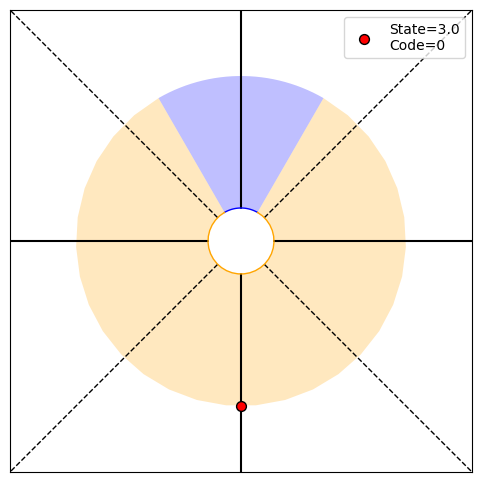

P(O1:24,S24|T)=[0.   0.   0.25 0.25], P(O1:24|actions,T)=0.5, P(T|O1:24)=[9.99999881e-01 1.19209275e-07], H24=0.00
PRINT 1: 2.913795973430192e-06, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.39729335e-06], [9.99999881e-01 1.19209275e-07]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


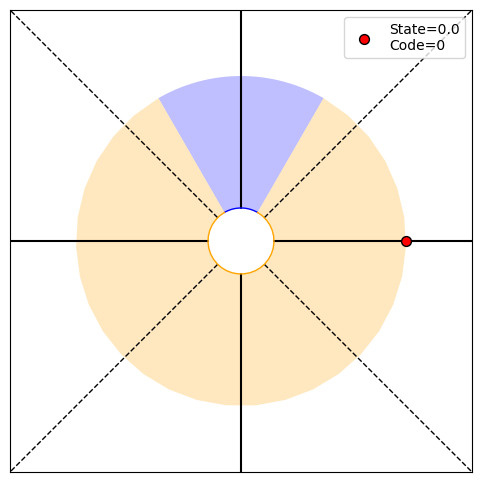

P(O1:25,S25|T)=[0.25 0.   0.   0.25], P(O1:25|actions,T)=0.5, P(T|O1:25)=[9.99999940e-01 5.96046412e-08], H25=0.00
PRINT 1: 1.516502712212915e-06, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [7.28449036e-07 0.00000000e+00], [9.99999940e-01 5.96046412e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


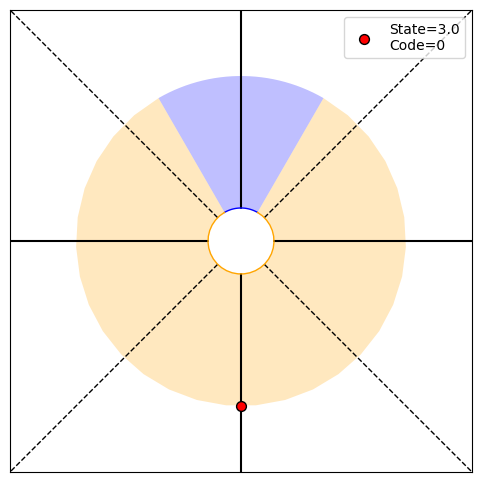

P(O1:26,S26|T)=[0.   0.   0.25 0.25], P(O1:26|actions,T)=0.5, P(T|O1:26)=[9.99999970e-01 2.98023215e-08], H26=0.00
PRINT 1: 7.880536995629399e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.79125689e-07], [9.99999970e-01 2.98023215e-08]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


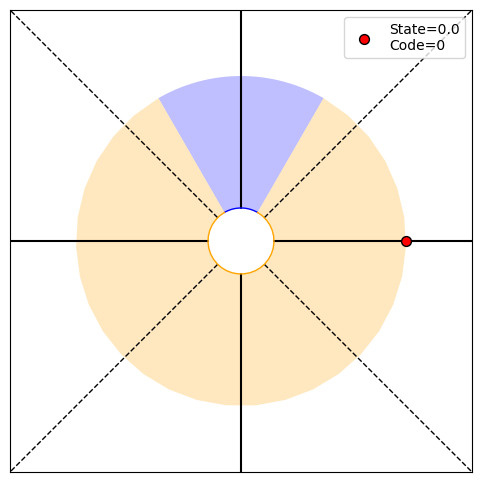

P(O1:27,S27|T)=[0.25 0.   0.   0.25], P(O1:27|actions,T)=0.5, P(T|O1:27)=[9.99999985e-01 1.49011610e-08], H27=0.00
PRINT 1: 4.089280164645592e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.97013428e-07 0.00000000e+00], [9.99999985e-01 1.49011610e-08]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


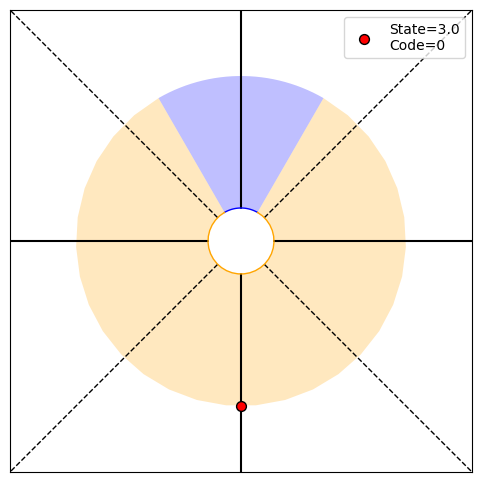

P(O1:28,S28|T)=[0.   0.   0.25 0.25], P(O1:28|actions,T)=0.5, P(T|O1:28)=[9.99999993e-01 7.45058054e-09], H28=0.00
PRINT 1: 2.1191459017693938e-07, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.02232005e-07], [9.99999993e-01 7.45058054e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


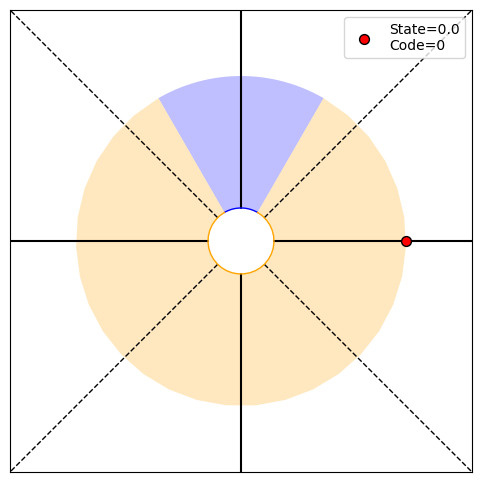

P(O1:29,S29|T)=[0.25 0.   0.   0.25], P(O1:29|actions,T)=0.5, P(T|O1:29)=[9.99999996e-01 3.72529028e-09], H29=0.00
PRINT 1: 1.0968258581782902e-07, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [5.29786478e-08 0.00000000e+00], [9.99999996e-01 3.72529028e-09]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


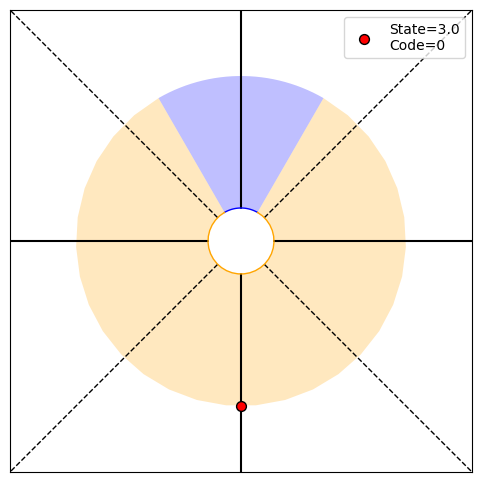

P(O1:30,S30|T)=[0.   0.   0.25 0.25], P(O1:30|actions,T)=0.5, P(T|O1:30)=[9.99999998e-01 1.86264515e-09], H30=0.00
PRINT 1: 5.670393814931786e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.74206465e-08], [9.99999998e-01 1.86264515e-09]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


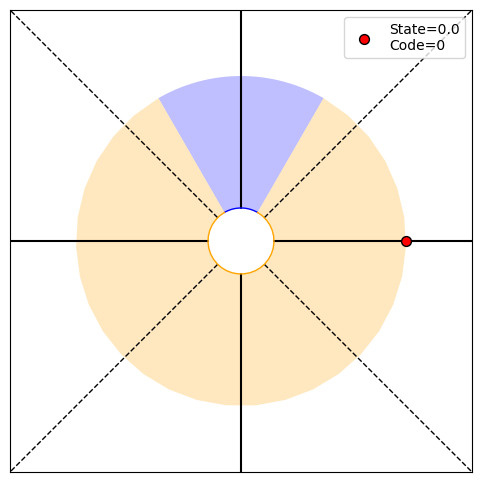

P(O1:31,S31|T)=[0.25 0.   0.   0.25], P(O1:31|actions,T)=0.5, P(T|O1:31)=[9.99999999e-01 9.31322574e-10], H31=0.00
PRINT 1: 2.928329167293487e-08, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.41759846e-08 0.00000000e+00], [9.99999999e-01 9.31322574e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


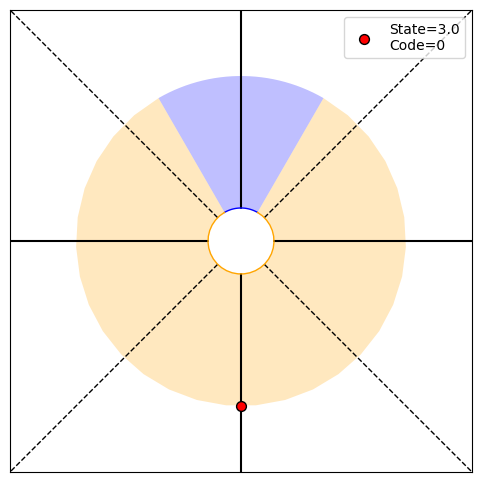

P(O1:32,S32|T)=[0.   0.   0.25 0.25], P(O1:32|actions,T)=0.5, P(T|O1:32)=[1.00000000e+00 4.65661287e-10], H32=0.00
PRINT 1: 1.510730712990713e-08, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 7.32082292e-09], [1.00000000e+00 4.65661287e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


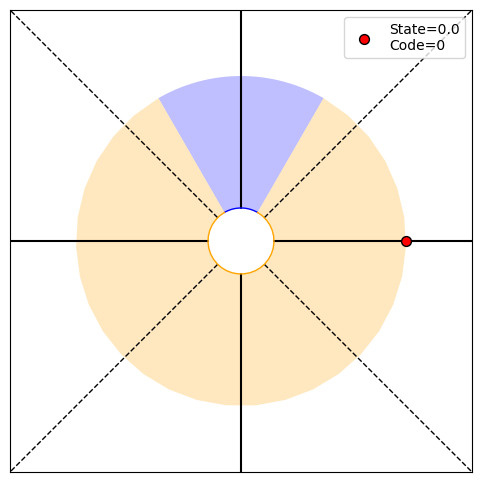

P(O1:33,S33|T)=[0.25 0.   0.   0.25], P(O1:33|actions,T)=0.5, P(T|O1:33)=[1.00000000e+00 2.32830644e-10], H33=0.00
PRINT 1: 7.786484210194632e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.77682678e-09 0.00000000e+00], [1.00000000e+00 2.32830644e-10]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


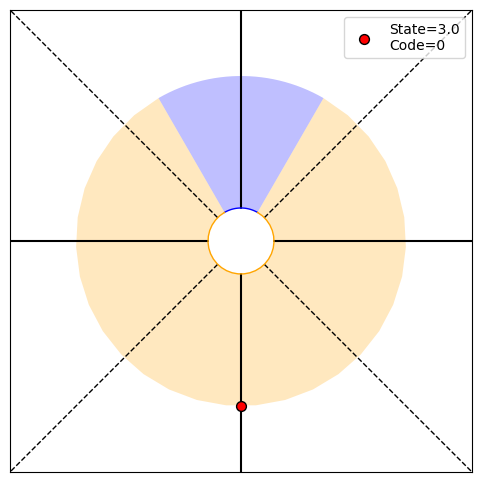

P(O1:34,S34|T)=[0.   0.   0.25 0.25], P(O1:34|actions,T)=0.5, P(T|O1:34)=[1.00000000e+00 1.16415322e-10], H34=0.00
PRINT 1: 4.0096574273346035e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.94662105e-09], [1.00000000e+00 1.16415322e-10]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


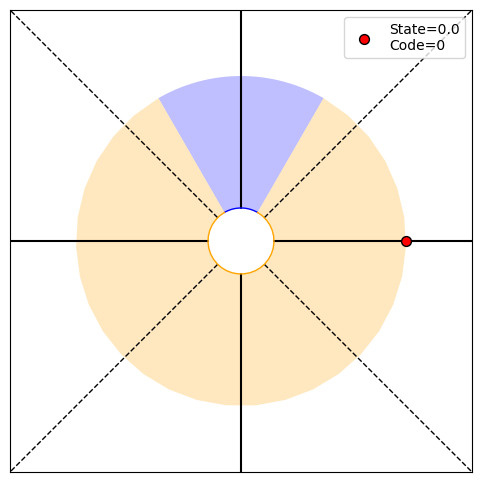

P(O1:35,S35|T)=[0.25 0.   0.   0.25], P(O1:35|actions,T)=0.5, P(T|O1:35)=[1.00000000e+00 5.82076609e-11], H35=0.00
PRINT 1: 2.063036374686746e-09, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.00241436e-09 0.00000000e+00], [1.00000000e+00 5.82076609e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


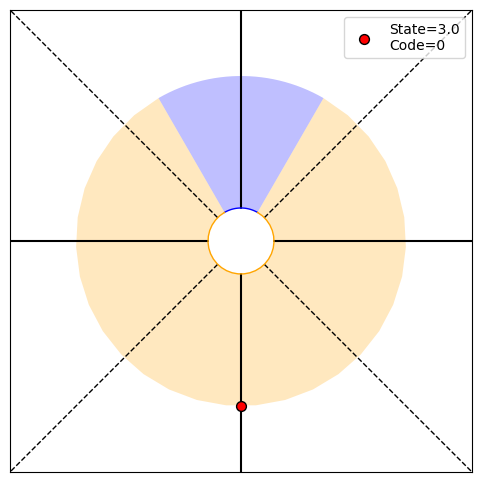

P(O1:36,S36|T)=[0.   0.   0.25 0.25], P(O1:36|actions,T)=0.5, P(T|O1:36)=[1.00000000e+00 2.91038305e-11], H36=0.00
PRINT 1: 1.0606220178274475e-09, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 5.15759094e-10], [1.00000000e+00 2.91038305e-11]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


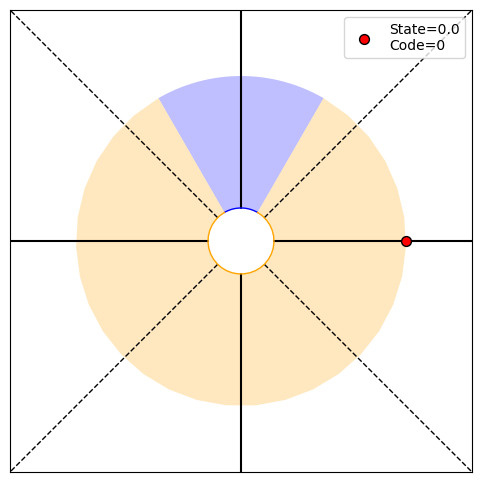

P(O1:37,S37|T)=[0.25 0.   0.   0.25], P(O1:37|actions,T)=0.5, P(T|O1:37)=[1.00000000e+00 1.45519152e-11], H37=0.00
PRINT 1: 5.448629241491377e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [2.65155504e-10 0.00000000e+00], [1.00000000e+00 1.45519152e-11]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


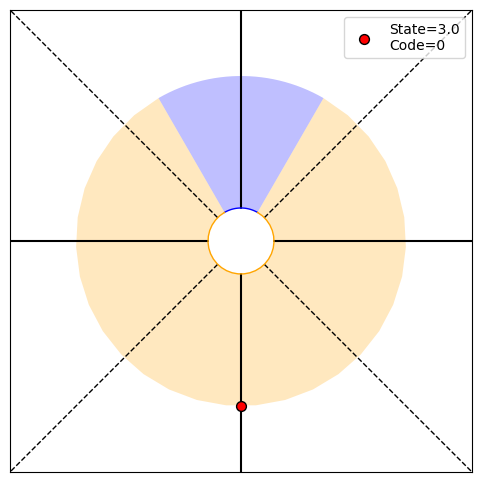

P(O1:38,S38|T)=[0.   0.   0.25 0.25], P(O1:38|actions,T)=0.5, P(T|O1:38)=[1.00000000e+00 7.27595761e-12], H38=0.00
PRINT 1: 2.797074196905669e-10, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.36215731e-10], [1.00000000e+00 7.27595761e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


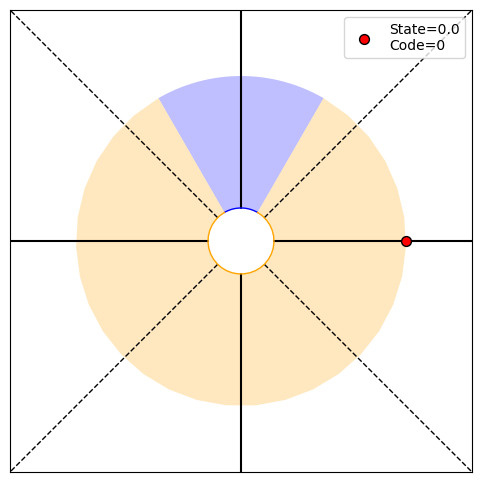

P(O1:39,S39|T)=[0.25 0.   0.   0.25], P(O1:39|actions,T)=0.5, P(T|O1:39)=[1.00000000e+00 3.63797881e-12], H39=0.00
PRINT 1: 1.4349168865284212e-10, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [6.99268549e-11 0.00000000e+00], [1.00000000e+00 3.63797881e-12]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


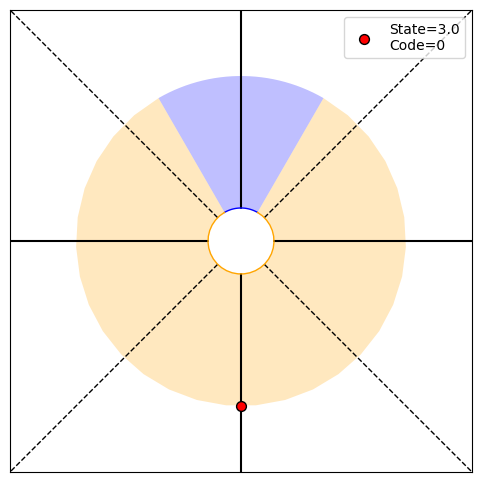

P(O1:40,S40|T)=[0.   0.   0.25 0.25], P(O1:40|actions,T)=0.5, P(T|O1:40)=[1.0000000e+00 1.8189894e-12], H40=0.00
PRINT 1: 7.356483373008693e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 3.58729222e-11], [1.0000000e+00 1.8189894e-12]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


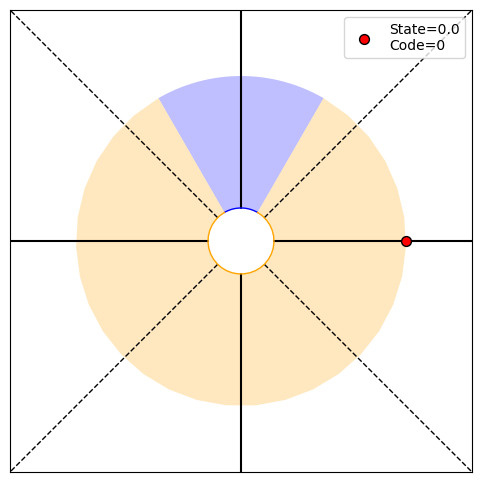

P(O1:41,S41|T)=[0.25 0.   0.   0.25], P(O1:41|actions,T)=0.5, P(T|O1:41)=[1.00000000e+00 9.09494702e-13], H41=0.00
PRINT 1: 3.769191156684724e-11, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.83912084e-11 0.00000000e+00], [1.00000000e+00 9.09494702e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


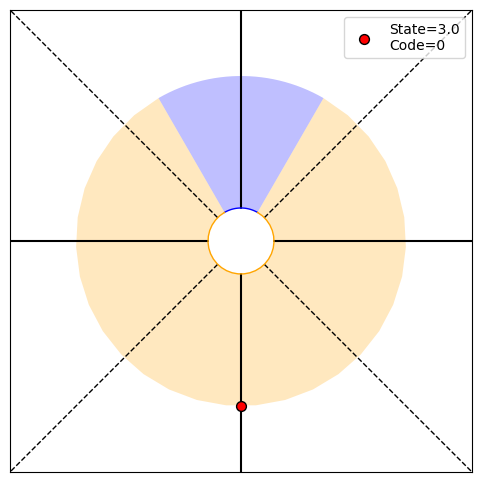

P(O1:42,S42|T)=[0.   0.   0.25 0.25], P(O1:42|actions,T)=0.5, P(T|O1:42)=[1.00000000e+00 4.54747351e-13], H42=0.00
PRINT 1: 1.9300703134317997e-11, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 9.42297789e-12], [1.00000000e+00 4.54747351e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


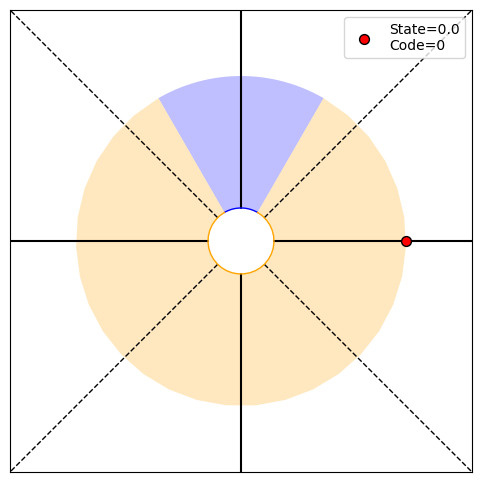

P(O1:43,S43|T)=[0.25 0.   0.   0.25], P(O1:43|actions,T)=0.5, P(T|O1:43)=[1.00000000e+00 2.27373675e-13], H43=0.00
PRINT 1: 9.877725242604262e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [4.82517578e-12 0.00000000e+00], [1.00000000e+00 2.27373675e-13]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


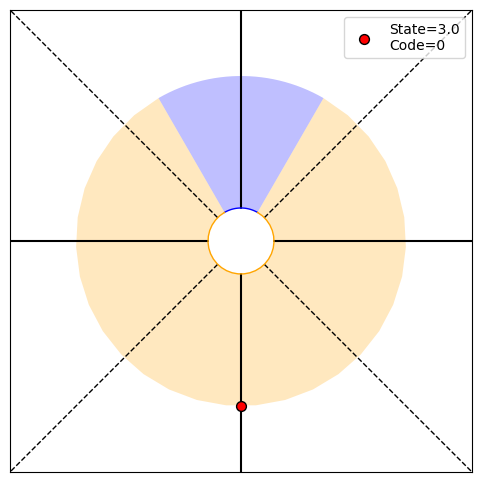

P(O1:44,S44|T)=[0.   0.   0.25 0.25], P(O1:44|actions,T)=0.5, P(T|O1:44)=[1.00000000e+00 1.13686838e-13], H44=0.00
PRINT 1: 5.052549459024267e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 2.46943131e-12], [1.00000000e+00 1.13686838e-13]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


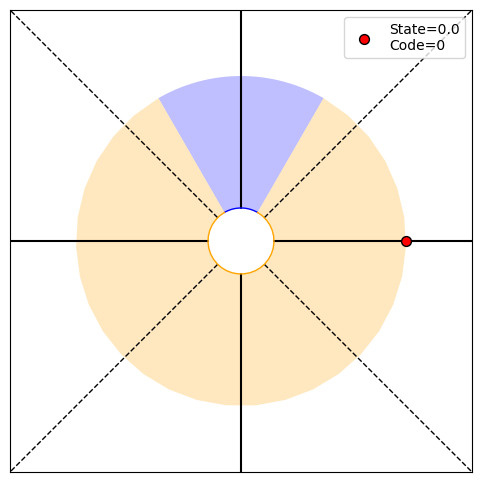

P(O1:45,S45|T)=[0.25 0.   0.   0.25], P(O1:45|actions,T)=0.5, P(T|O1:45)=[1.00000000e+00 5.68434189e-14], H45=0.00
PRINT 1: 2.5831181483730752e-12, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [1.26313736e-12 0.00000000e+00], [1.00000000e+00 5.68434189e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


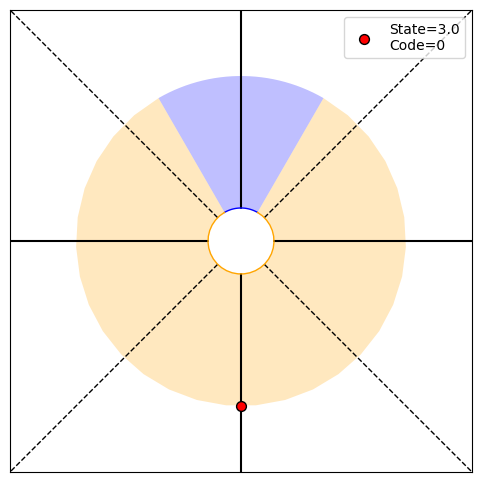

P(O1:46,S46|T)=[0.   0.   0.25 0.25], P(O1:46|actions,T)=0.5, P(T|O1:46)=[1.00000000e+00 2.84217094e-14], H46=0.00
PRINT 1: 1.3199807836169758e-12, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 6.45779537e-13], [1.00000000e+00 2.84217094e-14]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


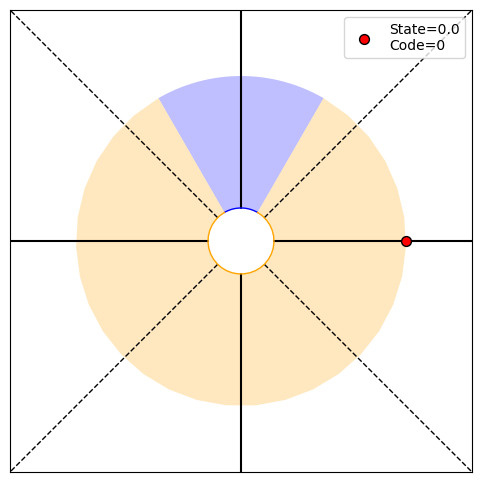

P(O1:47,S47|T)=[0.25 0.   0.   0.25], P(O1:47|actions,T)=0.5, P(T|O1:47)=[1.00000000e+00 1.42108547e-14], H47=0.00
PRINT 1: 6.742012465236986e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [3.29995196e-13 0.00000000e+00], [1.00000000e+00 1.42108547e-14]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


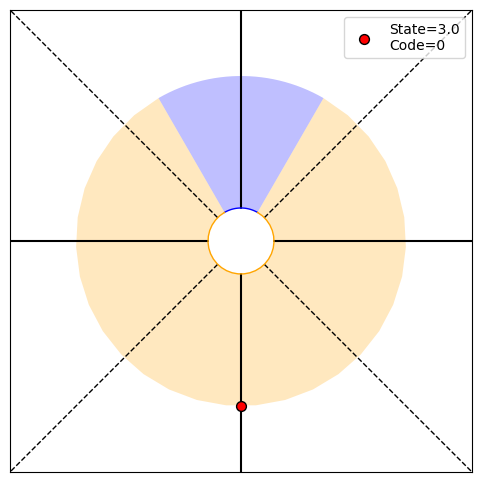

P(O1:48,S48|T)=[0.   0.   0.25 0.25], P(O1:48|actions,T)=0.5, P(T|O1:48)=[1.00000000e+00 7.10542736e-15], H48=0.00
PRINT 1: 3.442060506194525e-13, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 1.68550312e-13], [1.00000000e+00 7.10542736e-15]
Choosing according to max ΔS
Current angle: 0.0, Code received: 0.0


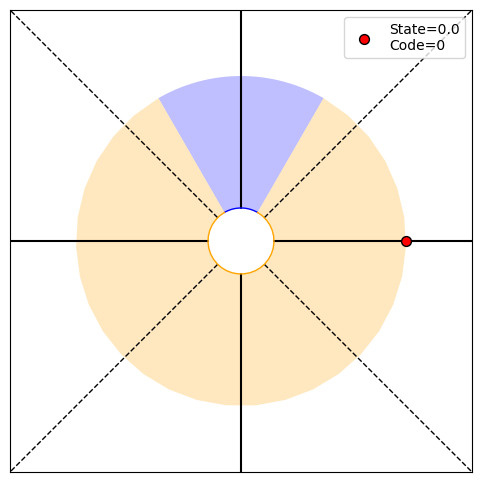

P(O1:49,S49|T)=[0.25 0.   0.   0.25], P(O1:49|actions,T)=0.5, P(T|O1:49)=[1.00000000e+00 3.55271368e-15], H49=0.00
PRINT 1: 1.7565573898852736e-13, [2.50000000e-01 0.00000000e+00 3.45974132e-88 2.50000000e-01]
PRINT 2: [8.60515127e-14 0.00000000e+00], [1.00000000e+00 3.55271368e-15]
Choosing according to max ΔS
Current angle: -90.0, Code received: 0.0


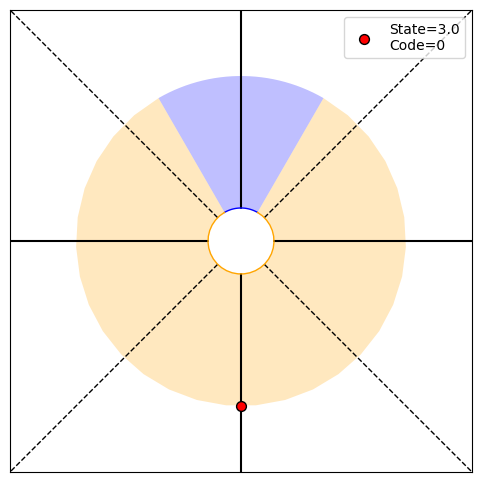

P(O1:50,S50|T)=[0.   0.   0.25 0.25], P(O1:50|actions,T)=0.5, P(T|O1:50)=[1.00000000e+00 1.77635684e-15], H50=0.00
PRINT 1: 8.960422633366407e-14, [3.45974132e-88 0.00000000e+00 2.50000000e-01 2.50000000e-01]
PRINT 2: [0.00000000e+00 4.39139347e-14], [1.00000000e+00 1.77635684e-15]
Choosing according to max ΔS


In [13]:
while trial_num < 10: 
    joint_prob_obs_state_t = np.zeros((max_iter, EMISSION_MATRIX_B.shape[0], EMISSION_MATRIX_B.shape[1]))
    joint_prob_received_obs_state_t = np.zeros((max_iter, EMISSION_MATRIX_B.shape[1]))
    joint_prob_obs_state_forecast_t = np.zeros((max_iter, EMISSION_MATRIX_B.shape[0], EMISSION_MATRIX_B.shape[1]))
    likelihood_received_obs_from_target_t = np.zeros(max_iter)
    angles_visited = np.zeros(max_iter)
    posterior_t = np.zeros((max_iter, NUM_BELIEFS))
    current_entropyS_t = np.zeros(max_iter)
    candidate_steps = np.array([-STATE_STEP, STATE_STEP])
    expected_forecast_t_S_per_step = np.zeros((max_iter, candidate_steps.shape[0]))
    deltaS_t = np.zeros((max_iter, candidate_steps.shape[0]))
    code_received_t = np.zeros(max_iter)

    time_ind = 0
    initial_angle = 0

    while time_ind<max_iter:
        if time_ind<1:
            angles_visited[time_ind] = initial_angle
        else:
            angles_visited[time_ind] = angles_visited[time_ind-1] + np.rad2deg(step_to_take)

        if (angles_visited[time_ind]%360) >= obs1_bounds[0] and (angles_visited[time_ind]%360) <= obs1_bounds[1]:
            code_received_t[time_ind] = 1
        else:
            code_received_t[time_ind] = 0
        print(f'Current angle: {angles_visited[time_ind]}, Code received: {code_received_t[time_ind]}')
        observe_angle_state_pair((angles_visited[time_ind]%360))

        if time_ind<1:
            joint_prob_obs_state_t[time_ind] = PRIOR_STATE_PROB * EMISSION_MATRIX_B
        else:
            state_transition_matrix = get_state_transition_matrix(step_to_take)
            joint_prob_obs_state_t[time_ind] = (joint_prob_received_obs_state_t[time_ind-1] @ state_transition_matrix) * EMISSION_MATRIX_B

        joint_prob_received_obs_state_t[time_ind] = joint_prob_obs_state_t[time_ind][int(code_received_t[time_ind])]
        likelihood_received_obs_from_target_t[time_ind] = joint_prob_received_obs_state_t[time_ind].sum()

        if time_ind<1:
            likelihood_received_obs = np.array([likelihood_received_obs_from_target_t[time_ind], LIKELIHOOD_OBS_FROM_NONTARGET])
            posterior_t[time_ind] = (PRIOR_TARGET_PROB*likelihood_received_obs) / (PRIOR_TARGET_PROB*likelihood_received_obs).sum()
        else:
            likelihood_received_obs_from_target_given_obs_sequence = likelihood_received_obs_from_target_t[time_ind] / likelihood_received_obs_from_target_t[time_ind-1]
            likelihood_received_obs = np.array([likelihood_received_obs_from_target_given_obs_sequence, LIKELIHOOD_OBS_FROM_NONTARGET])
            posterior_t[time_ind] = (posterior_t[time_ind-1]*likelihood_received_obs) / (posterior_t[time_ind-1]*likelihood_received_obs).sum()

        if 1 in posterior_t[time_ind]:
            current_entropyS_t[time_ind] = 0
        else:
            current_entropyS_t[time_ind] = (-posterior_t[time_ind]*np.log2(posterior_t[time_ind])).sum()

        print(f"P(O1:{int(time_ind+1)},S{int(time_ind+1)}|T)={joint_prob_received_obs_state_t[time_ind].round(2)}, P(O1:{int(time_ind+1)}|actions,T)={likelihood_received_obs_from_target_t[time_ind]}, P(T|O1:{int(time_ind+1)})={posterior_t[time_ind]}, H{int(time_ind+1)}={current_entropyS_t[time_ind]:.2f}")

        for i, forecast_t_candidate_step in enumerate(candidate_steps):
            state_transition_matrix = np.round(get_state_transition_matrix(forecast_t_candidate_step))

            joint_prob_obs_state_forecast_t[time_ind] = (joint_prob_received_obs_state_t[time_ind] @ state_transition_matrix) * EMISSION_MATRIX_B
            likelihood_obs_from_target_forecast_t = joint_prob_obs_state_forecast_t[time_ind].sum(axis=1)
            likelihood_obs_from_target_forecast_t_given_received_obs = likelihood_obs_from_target_forecast_t / likelihood_received_obs_from_target_t[time_ind]

            likelihood_obs0_forecast_t_given_received_obs = np.array([likelihood_obs_from_target_forecast_t_given_received_obs[0], LIKELIHOOD_OBS_FROM_NONTARGET])
            posterior_forecast_given_received_obs0 = (posterior_t[time_ind] * likelihood_obs0_forecast_t_given_received_obs) / (posterior_t[time_ind] * likelihood_obs0_forecast_t_given_received_obs).sum()

            likelihood_obs1_forecast_t_given_received_obs = np.array([likelihood_obs_from_target_forecast_t_given_received_obs[1], LIKELIHOOD_OBS_FROM_NONTARGET])
            posterior_forecast_given_received_obs1 = (posterior_t[time_ind] * likelihood_obs1_forecast_t_given_received_obs) / (posterior_t[time_ind] * likelihood_obs1_forecast_t_given_received_obs).sum()

            if 1 in posterior_forecast_given_received_obs0:
                forecasted_S0 = 0
            else:
                forecasted_S0 = (-posterior_forecast_given_received_obs0 * np.log2(posterior_forecast_given_received_obs0)).sum()

            if 1 in posterior_forecast_given_received_obs1:
                forecasted_S1 = 0
            else:
                forecasted_S1 = (-posterior_forecast_given_received_obs1 * np.log2(posterior_forecast_given_received_obs1)).sum()

            prob_obs0_at_forecast_t2_given_obs0_at_t1 = (posterior_t[time_ind] * np.array([likelihood_obs_from_target_forecast_t_given_received_obs[0], LIKELIHOOD_OBS_FROM_NONTARGET])).sum()
            prob_obs1_at_forecast_t2_given_obs0_at_t1 = (posterior_t[time_ind] * np.array([likelihood_obs_from_target_forecast_t_given_received_obs[1], LIKELIHOOD_OBS_FROM_NONTARGET])).sum()

            expected_forecast_t_S = (forecasted_S0 * prob_obs0_at_forecast_t2_given_obs0_at_t1) + (forecasted_S1 * prob_obs1_at_forecast_t2_given_obs0_at_t1)
            expected_forecast_t_S_per_step[time_ind, i] = expected_forecast_t_S

        deltaS_t[time_ind] = current_entropyS_t[time_ind] - expected_forecast_t_S_per_step[time_ind]
        print(f'PRINT 1: {current_entropyS_t[time_ind]}, {joint_prob_received_obs_state_t[time_ind]}')
        print(f'PRINT 2: {deltaS_t[time_ind]}, {posterior_t[time_ind]}')

        if (deltaS_t[time_ind]==deltaS_t[time_ind][0]).all():
            print('Choosing randomly')
            step_to_take = candidate_steps[np.random.choice(np.arange(0, len(deltaS_t[time_ind])))]
        else:
            print('Choosing according to max ΔS')
            step_to_take = candidate_steps[deltaS_t[time_ind].argmax()]

        time_ind+=1

    posterior_across_trials[trial_num,:,:] = np.vstack([PRIOR_TARGET_PROB, posterior_t[:time_ind]])
    trial_num+=1

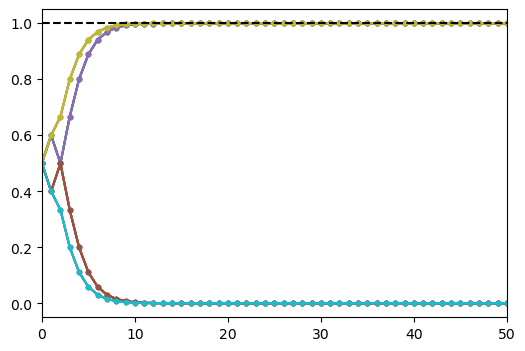

In [18]:
plt.figure(figsize=(6,4))
for trial_i in range(num_trials): 
    plt.plot(posterior_across_trials[trial_i], marker='.')
plt.axhline(y=1.0, linestyle='dashed', color='k')
plt.xlim(0, time_ind)
plt.show()